In [1]:
import numpy
import pandas

import seaborn as sns

from matplotlib import pyplot


sns.set_theme(font="IPAexGothic")
pyplot.rcParams["figure.figsize"] = (20, 10)


In [2]:
from datetime import datetime

In [3]:
g_start_date = datetime.now()
g_start_date.strftime("%Y/%m/%d %T")


'2023/10/30 20:56:20'

In [4]:
url="https://www.mof.go.jp/jgbs/reference/interest_rate/data/jgbcm_all.csv"
_df = pandas.read_csv(url, header=1, encoding="shift-jis")
_df.tail()


,基準日,1年,2年,3年,4年,5年,6年,7年,8年,9年,10年,15年,20年,25年,30年,40年
12574,R5.9.25,-0.063,0.033,0.093,0.192,0.318,0.375,0.472,0.577,0.654,0.738,1.129,1.425,1.551,1.612,1.75
12575,R5.9.26,-0.063,0.034,0.093,0.193,0.317,0.379,0.490,0.596,0.669,0.752,1.133,1.429,1.555,1.619,1.75
12576,R5.9.27,-0.064,0.034,0.09,0.188,0.313,0.374,0.488,0.596,0.669,0.747,1.129,1.432,1.559,1.627,1.753
12577,R5.9.28,-0.055,0.044,0.104,0.209,0.331,0.395,0.507,0.615,0.692,0.765,1.142,1.441,1.567,1.634,1.76
12578,R5.9.29,-0.064,0.044,0.108,0.219,0.341,0.409,0.521,0.630,0.703,0.774,1.165,1.456,1.575,1.649,1.776


In [5]:
def convert_wareki_to_seireki(wareki_date):
    """
    和暦を西暦に変換する関数。
    """
    era = wareki_date[0]
    year, month, day = map(int, wareki_date[1:].split('.'))

    if era == "S":  # 昭和
        seireki_year = 1925 + year
    elif era == "H":  # 平成
        seireki_year = 1988 + year
    elif era == "R":  # 令和
        seireki_year = 2018 + year
    else:
        raise ValueError(f"Unknown era: {era}")

    return f"{seireki_year}-{month:02}-{day:02}"


In [6]:
_df["ds"] = pandas.to_datetime(_df["基準日"].apply(convert_wareki_to_seireki))
_df[["基準日", "ds"]]

,基準日,ds
0,S49.9.24,1974-09-24
1,S49.9.25,1974-09-25
2,S49.9.26,1974-09-26
3,S49.9.27,1974-09-27
4,S49.9.28,1974-09-28
...,...,...
12574,R5.9.25,2023-09-25
12575,R5.9.26,2023-09-26
12576,R5.9.27,2023-09-27
12577,R5.9.28,2023-09-28


In [7]:
_df.replace('-', float('nan'), inplace=True)


In [8]:
_df.head()

,基準日,1年,2年,3年,4年,5年,6年,7年,8年,9年,10年,15年,20年,25年,30年,40年,ds
0,S49.9.24,10.327,9.362,8.83,8.515,8.348,8.290,8.24,8.121,8.127,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-24
1,S49.9.25,10.333,9.364,8.831,8.516,8.348,8.290,8.24,8.121,8.127,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-25
2,S49.9.26,10.34,9.366,8.832,8.516,8.348,8.290,8.24,8.122,8.128,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-26
3,S49.9.27,10.347,9.367,8.833,8.517,8.349,8.290,8.24,8.122,8.128,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-27
4,S49.9.28,10.354,9.369,8.834,8.518,8.349,8.291,8.24,8.122,8.129,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-28


In [9]:
rate_cols = [col for col in _df.columns if col not in ["基準日", "ds"]]
rate_cols = ["1年", "5年", "10年", "20年"]
rate_cols

['1年', '5年', '10年', '20年']

In [10]:
_df[rate_cols] = _df[rate_cols].astype(float)
_df.head(3)

,基準日,1年,2年,3年,4年,5年,6年,7年,8年,9年,10年,15年,20年,25年,30年,40年,ds
0,S49.9.24,10.327,9.362,8.83,8.515,8.348,8.29,8.24,8.121,8.127,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-24
1,S49.9.25,10.333,9.364,8.831,8.516,8.348,8.29,8.24,8.121,8.127,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-25
2,S49.9.26,10.340,9.366,8.832,8.516,8.348,8.29,8.24,8.122,8.128,NaN,NaN,NaN,NaN,NaN,NaN,1974-09-26


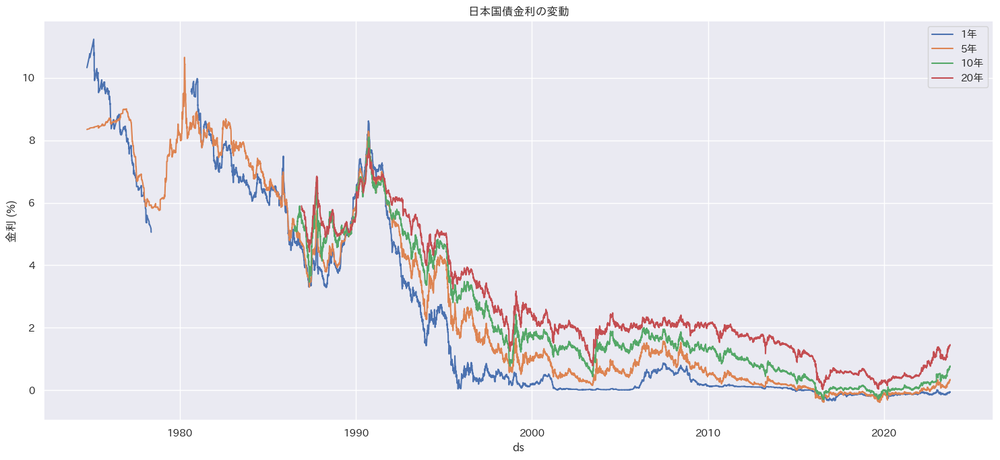

In [11]:
pyplot.figure(figsize=(15, 7))
for col in rate_cols:
    pyplot.plot(_df["ds"], _df[col], label=col)

pyplot.title("日本国債金利の変動")
pyplot.xlabel("ds")
pyplot.ylabel("金利 (%)")
pyplot.legend()
pyplot.grid(True)
pyplot.tight_layout()
pyplot.show()


In [12]:
df = _df.copy()
df.index = pandas.to_datetime(df.ds)


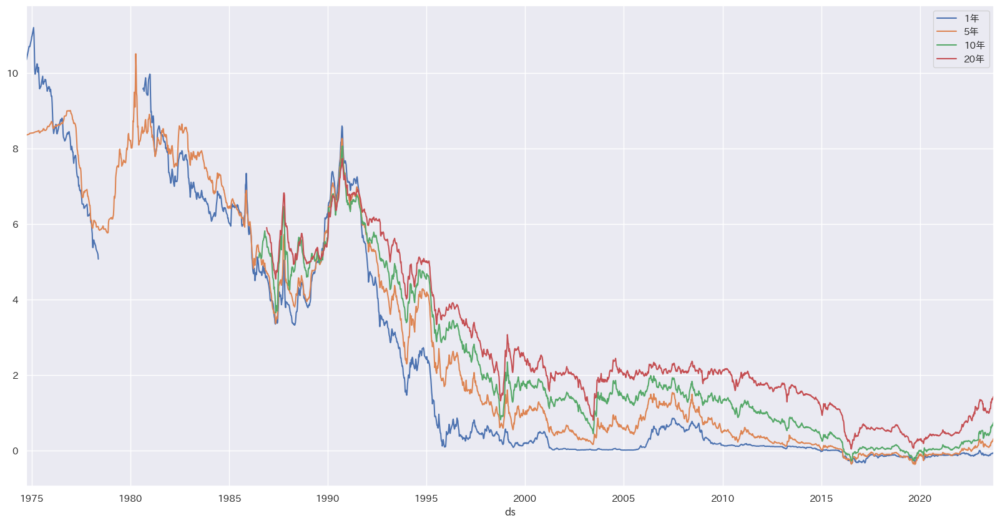

In [13]:
df_weekly = df[rate_cols].resample("W-MON").mean()
df_weekly.plot()
pyplot.show()


In [14]:
df_weekly.tail(3)

,1年,5年,10年,20年
ds,,,,
2023-09-18,-0.0635,0.2950,0.71525,1.41025
2023-09-25,-0.0578,0.3152,0.74160,1.42460
2023-10-02,-0.0615,0.3255,0.75950,1.43950


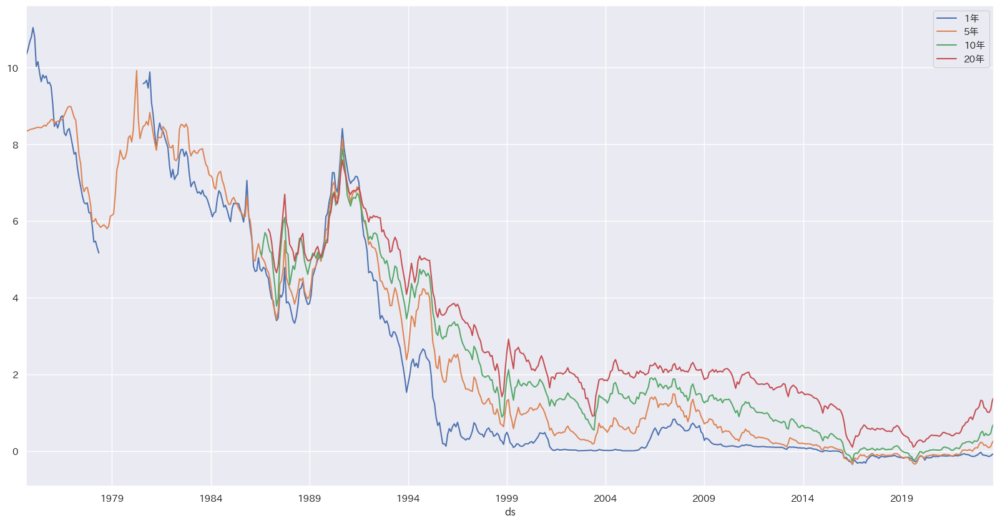

In [15]:
df_monthly = df[rate_cols].resample("MS").mean()
# df_monthly["2000-01-01":].plot()
df_monthly.plot()
pyplot.show()

In [16]:
df_monthly = df[rate_cols].resample("MS").mean()
df_monthly.head(3)


,1年,5年,10年,20年
ds,,,,
1974-09-01,10.344833,8.348667,NaN,NaN
1974-10-01,10.480600,8.360240,NaN,NaN
1974-11-01,10.673522,8.379565,NaN,NaN


In [17]:
df_monthly.tail(3)

,1年,5年,10年,20年
ds,,,,
2023-07-01,-0.119650,0.120050,0.464500,1.078850
2023-08-01,-0.084091,0.226318,0.639091,1.317682
2023-09-01,-0.066950,0.288700,0.713150,1.403250


In [18]:
len(df_monthly)

589

In [19]:
import optuna

from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics


In [20]:
from protuna import ModelBuilder, Evaluator, Limitter, BestEstimator, setup_df_index, setup_limit


# シミュレーション

In [21]:
g_rate_types = rate_cols

In [22]:
start_date = "2000-01-01"
period_type = "weekly"
# period_type = "monthly"

if period_type == "weekly":
    df0 = df_weekly[start_date:].reset_index()
    n_horizon = 7 * 4       # about 1 month / 4 weeks
    freq = "W-MON"
    freq_cv = "4W-MON"
    n_predicts = 4 * 3       # 3か月分
else:
    df0 = df_monthly[start_date:].reset_index()
    n_horizon = 365.25      # about 1 year
    freq = "MS"
    freq_cv = "3MS"
    n_predicts = 12 * 2      # 2年分



In [23]:
len(df0)

1240

In [24]:
df0.head(3)

,ds,1年,5年,10年,20年
0,2000-01-03,0.188333,0.946333,1.689667,2.363667
1,2000-01-10,0.192000,0.997500,1.727250,2.381000
2,2000-01-17,0.205000,1.051000,1.751600,2.369000


In [25]:
df0.tail(3)

,ds,1年,5年,10年,20年
1237,2023-09-18,-0.0635,0.2950,0.71525,1.41025
1238,2023-09-25,-0.0578,0.3152,0.74160,1.42460
1239,2023-10-02,-0.0615,0.3255,0.75950,1.43950


In [26]:
n_horizon

28

In [27]:
# around 200 mins

bests = {}

for rate_type in g_rate_types:
    # setup
    df = df0.rename({"年月": "ds", rate_type: "y"}, axis=1)[["ds", "y"]]
    lmt = Limitter(df)
    df = setup_limit(df, lmt)
    evl = Evaluator(df=df, n_horizon=n_horizon, freq=freq_cv, horizon_scaler=5)

    # optimize hyper params
    study: optuna.Study = optuna.create_study(direction="minimize")
    study.optimize(evl.objective_value, n_trials=100)

    # rerun cv
    mb: ModelBuilder = ModelBuilder(df=df)
    model: Prophet = mb.build_prophet_model(**study.best_params)
    model.fit(df)
    df_cv, df_pm = evl.run_cross_validation(model=model)

    # predict
    future = model.make_future_dataframe(periods=n_predicts, freq=freq)
    future = setup_limit(future, lmt)
    forecast = model.predict(future)

    # store estimator
    bst = BestEstimator(
        df=df,
        model=model,
        evaluator=evl,
        study=study,
        df_cv=df_cv,
        df_pm=df_pm,
        future=future,
        forecast=forecast,
    )
    bests[rate_type] = bst


[I 2023-10-30 20:56:25,280] A new study created in memory with name: no-name-00758a55-5862-496f-ab24-192f218e4b44
20:56:25 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.810828358276272, 'seasonality_prior_scale': 8.949887843958603, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:56:27 - cmdstanpy - INFO - Chain [1] done processing
20:56:27 - cmdstanpy - INFO - Chain [1] start processing
20:56:27 - cmdstanpy - INFO - Chain [1] start processing
20:56:27 - cmdstanpy - INFO - Chain [1] start processing
20:56:27 - cmdstanpy - INFO - Chain [1] start processing
20:56:27 - cmdstanpy - INFO - Chain [1] start processing
20:56:31 - cmdstanpy - INFO - Chain [1] done processing
20:56:31 - cmdstanpy - INFO - Chain [1] done processing
20:56:31 - cmdstanpy - INFO - Chain [1] done processing
20:56:33 - cmdstanpy - INFO - Chain [1] done processing
20:56:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:56:33,623] Trial 0 finished with value: 0.1525867504557146 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.810828358276272, 'seasonality_prior_scale': 8.949887843958603, 'seasonality_mode': 'multiplicative'}. Best is trial 0 with value: 0.1525867504557146.
20:56:33 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.7113777090384943, 'seasonality_prior_scale': 4.3104164442210005, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:56:35 - cmdstanpy - INFO - Chain [1] done processing
20:56:35 - cmdstanpy - INFO - Chain [1] start processing
20:56:35 - cmdstanpy - INFO - Chain [1] start processing
20:56:35 - cmdstanpy - INFO - Chain [1] start processing
20:56:35 - cmdstanpy - INFO - Chain [1] start processing
20:56:35 - cmdstanpy - INFO - Chain [1] start processing
20:56:39 - cmdstanpy - INFO - Chain [1] done processing
20:56:39 - cmdstanpy - INFO - Chain [1] done processing
20:56:39 - cmdstanpy - INFO - Chain [1] done processing
20:56:40 - cmdstanpy - INFO - Chain [1] done processing
20:56:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:56:41,499] Trial 1 finished with value: 0.20410105628315914 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.7113777090384943, 'seasonality_prior_scale': 4.3104164442210005, 'seasonality_mode': 'multiplicative'}. Best is trial 0 with value: 0.1525867504557146.
20:56:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.3327419686481075, 'seasonality_prior_scale': 3.6641899649315737, 'seasonality_mode': 'additive'}
n_changepoints=103


20:56:43 - cmdstanpy - INFO - Chain [1] done processing
20:56:43 - cmdstanpy - INFO - Chain [1] start processing
20:56:43 - cmdstanpy - INFO - Chain [1] start processing
20:56:43 - cmdstanpy - INFO - Chain [1] start processing
20:56:43 - cmdstanpy - INFO - Chain [1] start processing
20:56:43 - cmdstanpy - INFO - Chain [1] start processing
20:56:47 - cmdstanpy - INFO - Chain [1] done processing
20:56:48 - cmdstanpy - INFO - Chain [1] done processing
20:56:48 - cmdstanpy - INFO - Chain [1] done processing
20:56:49 - cmdstanpy - INFO - Chain [1] done processing
20:56:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:56:49,826] Trial 2 finished with value: 0.0600640189220645 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.3327419686481075, 'seasonality_prior_scale': 3.6641899649315737, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.0600640189220645.
20:56:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.1639867670264183, 'seasonality_prior_scale': 4.146208018105224, 'seasonality_mode': 'additive'}
n_changepoints=103


20:56:51 - cmdstanpy - INFO - Chain [1] done processing
20:56:52 - cmdstanpy - INFO - Chain [1] start processing
20:56:52 - cmdstanpy - INFO - Chain [1] start processing
20:56:52 - cmdstanpy - INFO - Chain [1] start processing
20:56:52 - cmdstanpy - INFO - Chain [1] start processing
20:56:52 - cmdstanpy - INFO - Chain [1] start processing
20:56:56 - cmdstanpy - INFO - Chain [1] done processing
20:56:56 - cmdstanpy - INFO - Chain [1] done processing
20:56:56 - cmdstanpy - INFO - Chain [1] done processing
20:56:57 - cmdstanpy - INFO - Chain [1] done processing
20:56:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:56:57,935] Trial 3 finished with value: 0.05847767691828196 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.1639867670264183, 'seasonality_prior_scale': 4.146208018105224, 'seasonality_mode': 'additive'}. Best is trial 3 with value: 0.05847767691828196.
20:56:57 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 5.719615878274054, 'seasonality_prior_scale': 0.46940007555091223, 'seasonality_mode': 'additive'}
n_changepoints=103


20:57:00 - cmdstanpy - INFO - Chain [1] done processing
20:57:00 - cmdstanpy - INFO - Chain [1] start processing
20:57:00 - cmdstanpy - INFO - Chain [1] start processing
20:57:00 - cmdstanpy - INFO - Chain [1] start processing
20:57:00 - cmdstanpy - INFO - Chain [1] start processing
20:57:00 - cmdstanpy - INFO - Chain [1] start processing
20:57:03 - cmdstanpy - INFO - Chain [1] done processing
20:57:03 - cmdstanpy - INFO - Chain [1] done processing
20:57:04 - cmdstanpy - INFO - Chain [1] done processing
20:57:05 - cmdstanpy - INFO - Chain [1] done processing
20:57:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:05,870] Trial 4 finished with value: 0.053652381304562874 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 5.719615878274054, 'seasonality_prior_scale': 0.46940007555091223, 'seasonality_mode': 'additive'}. Best is trial 4 with value: 0.053652381304562874.
20:57:05 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.66450244360357, 'seasonality_prior_scale': 0.9597434666392208, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:57:07 - cmdstanpy - INFO - Chain [1] done processing
20:57:08 - cmdstanpy - INFO - Chain [1] start processing
20:57:08 - cmdstanpy - INFO - Chain [1] start processing
20:57:08 - cmdstanpy - INFO - Chain [1] start processing
20:57:08 - cmdstanpy - INFO - Chain [1] start processing
20:57:08 - cmdstanpy - INFO - Chain [1] start processing
20:57:11 - cmdstanpy - INFO - Chain [1] done processing
20:57:11 - cmdstanpy - INFO - Chain [1] done processing
20:57:11 - cmdstanpy - INFO - Chain [1] done processing
20:57:12 - cmdstanpy - INFO - Chain [1] done processing
20:57:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:12,564] Trial 5 finished with value: 0.03528037980412939 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.66450244360357, 'seasonality_prior_scale': 0.9597434666392208, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.03528037980412939.
20:57:12 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.14822378966563235, 'seasonality_prior_scale': 5.246106713599055, 'seasonality_mode': 'additive'}
n_changepoints=103


20:57:13 - cmdstanpy - INFO - Chain [1] done processing
20:57:13 - cmdstanpy - INFO - Chain [1] start processing
20:57:13 - cmdstanpy - INFO - Chain [1] start processing
20:57:13 - cmdstanpy - INFO - Chain [1] start processing
20:57:13 - cmdstanpy - INFO - Chain [1] start processing
20:57:13 - cmdstanpy - INFO - Chain [1] start processing
20:57:14 - cmdstanpy - INFO - Chain [1] done processing
20:57:14 - cmdstanpy - INFO - Chain [1] done processing
20:57:15 - cmdstanpy - INFO - Chain [1] done processing
20:57:15 - cmdstanpy - INFO - Chain [1] done processing
20:57:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:15,481] Trial 6 finished with value: 0.08136191669244797 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.14822378966563235, 'seasonality_prior_scale': 5.246106713599055, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.03528037980412939.
20:57:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.0845933673849617, 'seasonality_prior_scale': 4.980939186183053, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:57:17 - cmdstanpy - INFO - Chain [1] done processing
20:57:17 - cmdstanpy - INFO - Chain [1] start processing
20:57:17 - cmdstanpy - INFO - Chain [1] start processing
20:57:17 - cmdstanpy - INFO - Chain [1] start processing
20:57:17 - cmdstanpy - INFO - Chain [1] start processing
20:57:17 - cmdstanpy - INFO - Chain [1] start processing
20:57:20 - cmdstanpy - INFO - Chain [1] done processing
20:57:21 - cmdstanpy - INFO - Chain [1] done processing
20:57:21 - cmdstanpy - INFO - Chain [1] done processing
20:57:22 - cmdstanpy - INFO - Chain [1] done processing
20:57:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:22,398] Trial 7 finished with value: 0.02610575193695528 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.0845933673849617, 'seasonality_prior_scale': 4.980939186183053, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:57:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 0.2306138094517687, 'seasonality_prior_scale': 6.655499746574531, 'seasonality_mode': 'additive'}
n_changepoints=103


20:57:23 - cmdstanpy - INFO - Chain [1] done processing
20:57:23 - cmdstanpy - INFO - Chain [1] start processing
20:57:23 - cmdstanpy - INFO - Chain [1] start processing
20:57:23 - cmdstanpy - INFO - Chain [1] start processing
20:57:23 - cmdstanpy - INFO - Chain [1] start processing
20:57:23 - cmdstanpy - INFO - Chain [1] start processing
20:57:25 - cmdstanpy - INFO - Chain [1] done processing
20:57:25 - cmdstanpy - INFO - Chain [1] done processing
20:57:25 - cmdstanpy - INFO - Chain [1] done processing
20:57:26 - cmdstanpy - INFO - Chain [1] done processing
20:57:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:26,977] Trial 8 finished with value: 0.07598807497735438 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 0.2306138094517687, 'seasonality_prior_scale': 6.655499746574531, 'seasonality_mode': 'additive'}. Best is trial 7 with value: 0.02610575193695528.
20:57:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.054085961241542, 'seasonality_prior_scale': 5.531387681205561, 'seasonality_mode': 'additive'}
n_changepoints=103


20:57:29 - cmdstanpy - INFO - Chain [1] done processing
20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:32 - cmdstanpy - INFO - Chain [1] done processing
20:57:32 - cmdstanpy - INFO - Chain [1] done processing
20:57:33 - cmdstanpy - INFO - Chain [1] done processing
20:57:34 - cmdstanpy - INFO - Chain [1] done processing
20:57:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:34,983] Trial 9 finished with value: 0.056411446221260125 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.054085961241542, 'seasonality_prior_scale': 5.531387681205561, 'seasonality_mode': 'additive'}. Best is trial 7 with value: 0.02610575193695528.
20:57:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 6.310397998776642, 'seasonality_prior_scale': 8.08937205859769, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:57:37 - cmdstanpy - INFO - Chain [1] done processing
20:57:37 - cmdstanpy - INFO - Chain [1] start processing
20:57:37 - cmdstanpy - INFO - Chain [1] start processing
20:57:37 - cmdstanpy - INFO - Chain [1] start processing
20:57:37 - cmdstanpy - INFO - Chain [1] start processing
20:57:37 - cmdstanpy - INFO - Chain [1] start processing
20:57:40 - cmdstanpy - INFO - Chain [1] done processing
20:57:40 - cmdstanpy - INFO - Chain [1] done processing
20:57:40 - cmdstanpy - INFO - Chain [1] done processing
20:57:41 - cmdstanpy - INFO - Chain [1] done processing
20:57:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:41,748] Trial 10 finished with value: 0.03999248569404116 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 6.310397998776642, 'seasonality_prior_scale': 8.08937205859769, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:57:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.893815500181343, 'seasonality_prior_scale': 1.5382335928270892, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:57:43 - cmdstanpy - INFO - Chain [1] done processing
20:57:43 - cmdstanpy - INFO - Chain [1] start processing
20:57:43 - cmdstanpy - INFO - Chain [1] start processing
20:57:43 - cmdstanpy - INFO - Chain [1] start processing
20:57:44 - cmdstanpy - INFO - Chain [1] start processing
20:57:44 - cmdstanpy - INFO - Chain [1] start processing
20:57:47 - cmdstanpy - INFO - Chain [1] done processing
20:57:47 - cmdstanpy - INFO - Chain [1] done processing
20:57:47 - cmdstanpy - INFO - Chain [1] done processing
20:57:48 - cmdstanpy - INFO - Chain [1] done processing
20:57:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:48,601] Trial 11 finished with value: 0.03583363243729518 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.893815500181343, 'seasonality_prior_scale': 1.5382335928270892, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:57:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.698965679574771, 'seasonality_prior_scale': 2.4325984051983274, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:57:50 - cmdstanpy - INFO - Chain [1] done processing
20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:50 - cmdstanpy - INFO - Chain [1] start processing
20:57:54 - cmdstanpy - INFO - Chain [1] done processing
20:57:54 - cmdstanpy - INFO - Chain [1] done processing
20:57:54 - cmdstanpy - INFO - Chain [1] done processing
20:57:55 - cmdstanpy - INFO - Chain [1] done processing
20:57:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:57:55,781] Trial 12 finished with value: 0.03627882352201091 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.698965679574771, 'seasonality_prior_scale': 2.4325984051983274, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:57:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.20030838227618, 'seasonality_prior_scale': 0.5580415933265764, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:57:57 - cmdstanpy - INFO - Chain [1] done processing
20:57:57 - cmdstanpy - INFO - Chain [1] start processing
20:57:57 - cmdstanpy - INFO - Chain [1] start processing
20:57:57 - cmdstanpy - INFO - Chain [1] start processing
20:57:58 - cmdstanpy - INFO - Chain [1] start processing
20:57:58 - cmdstanpy - INFO - Chain [1] start processing
20:58:01 - cmdstanpy - INFO - Chain [1] done processing
20:58:01 - cmdstanpy - INFO - Chain [1] done processing
20:58:01 - cmdstanpy - INFO - Chain [1] done processing
20:58:02 - cmdstanpy - INFO - Chain [1] done processing
20:58:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:02,700] Trial 13 finished with value: 0.038562933963200624 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.20030838227618, 'seasonality_prior_scale': 0.5580415933265764, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.352288162094929, 'seasonality_prior_scale': 2.4450678840987523, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:04 - cmdstanpy - INFO - Chain [1] done processing
20:58:04 - cmdstanpy - INFO - Chain [1] start processing
20:58:04 - cmdstanpy - INFO - Chain [1] start processing
20:58:04 - cmdstanpy - INFO - Chain [1] start processing
20:58:04 - cmdstanpy - INFO - Chain [1] start processing
20:58:04 - cmdstanpy - INFO - Chain [1] start processing
20:58:08 - cmdstanpy - INFO - Chain [1] done processing
20:58:08 - cmdstanpy - INFO - Chain [1] done processing
20:58:08 - cmdstanpy - INFO - Chain [1] done processing
20:58:09 - cmdstanpy - INFO - Chain [1] done processing
20:58:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:09,550] Trial 14 finished with value: 0.04022881806193669 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.352288162094929, 'seasonality_prior_scale': 2.4450678840987523, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.442360319608033, 'seasonality_prior_scale': 6.683749830829372, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:11 - cmdstanpy - INFO - Chain [1] done processing
20:58:11 - cmdstanpy - INFO - Chain [1] start processing
20:58:11 - cmdstanpy - INFO - Chain [1] start processing
20:58:11 - cmdstanpy - INFO - Chain [1] start processing
20:58:11 - cmdstanpy - INFO - Chain [1] start processing
20:58:11 - cmdstanpy - INFO - Chain [1] start processing
20:58:14 - cmdstanpy - INFO - Chain [1] done processing
20:58:15 - cmdstanpy - INFO - Chain [1] done processing
20:58:15 - cmdstanpy - INFO - Chain [1] done processing
20:58:16 - cmdstanpy - INFO - Chain [1] done processing
20:58:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:16,427] Trial 15 finished with value: 0.03911652767760978 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.442360319608033, 'seasonality_prior_scale': 6.683749830829372, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:16 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.7234105517376972, 'seasonality_prior_scale': 0.14743639556058197, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:18 - cmdstanpy - INFO - Chain [1] done processing
20:58:18 - cmdstanpy - INFO - Chain [1] start processing
20:58:18 - cmdstanpy - INFO - Chain [1] start processing
20:58:18 - cmdstanpy - INFO - Chain [1] start processing
20:58:18 - cmdstanpy - INFO - Chain [1] start processing
20:58:18 - cmdstanpy - INFO - Chain [1] start processing
20:58:22 - cmdstanpy - INFO - Chain [1] done processing
20:58:22 - cmdstanpy - INFO - Chain [1] done processing
20:58:22 - cmdstanpy - INFO - Chain [1] done processing
20:58:23 - cmdstanpy - INFO - Chain [1] done processing
20:58:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:23,439] Trial 16 finished with value: 0.031070022229676746 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.7234105517376972, 'seasonality_prior_scale': 0.14743639556058197, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.3875248242321756, 'seasonality_prior_scale': 9.943741494925654, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:25 - cmdstanpy - INFO - Chain [1] done processing
20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:28 - cmdstanpy - INFO - Chain [1] done processing
20:58:28 - cmdstanpy - INFO - Chain [1] done processing
20:58:28 - cmdstanpy - INFO - Chain [1] done processing
20:58:30 - cmdstanpy - INFO - Chain [1] done processing
20:58:30 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:30,121] Trial 17 finished with value: 0.03005764987697088 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.3875248242321756, 'seasonality_prior_scale': 9.943741494925654, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:30 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.4819298039928466, 'seasonality_prior_scale': 9.649126853036002, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:32 - cmdstanpy - INFO - Chain [1] done processing
20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:32 - cmdstanpy - INFO - Chain [1] start processing
20:58:35 - cmdstanpy - INFO - Chain [1] done processing
20:58:35 - cmdstanpy - INFO - Chain [1] done processing
20:58:35 - cmdstanpy - INFO - Chain [1] done processing
20:58:36 - cmdstanpy - INFO - Chain [1] done processing
20:58:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:36,832] Trial 18 finished with value: 0.03093094222743571 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.4819298039928466, 'seasonality_prior_scale': 9.649126853036002, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:36 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.25796843404283, 'seasonality_prior_scale': 7.775821424775748, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:38 - cmdstanpy - INFO - Chain [1] done processing
20:58:39 - cmdstanpy - INFO - Chain [1] start processing
20:58:39 - cmdstanpy - INFO - Chain [1] start processing
20:58:39 - cmdstanpy - INFO - Chain [1] start processing
20:58:39 - cmdstanpy - INFO - Chain [1] start processing
20:58:39 - cmdstanpy - INFO - Chain [1] start processing
20:58:42 - cmdstanpy - INFO - Chain [1] done processing
20:58:42 - cmdstanpy - INFO - Chain [1] done processing
20:58:42 - cmdstanpy - INFO - Chain [1] done processing
20:58:43 - cmdstanpy - INFO - Chain [1] done processing
20:58:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:43,663] Trial 19 finished with value: 0.026331404528133137 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.25796843404283, 'seasonality_prior_scale': 7.775821424775748, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.783449215364192, 'seasonality_prior_scale': 7.3431163812194065, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:45 - cmdstanpy - INFO - Chain [1] done processing
20:58:45 - cmdstanpy - INFO - Chain [1] start processing
20:58:45 - cmdstanpy - INFO - Chain [1] start processing
20:58:45 - cmdstanpy - INFO - Chain [1] start processing
20:58:45 - cmdstanpy - INFO - Chain [1] start processing
20:58:45 - cmdstanpy - INFO - Chain [1] start processing
20:58:48 - cmdstanpy - INFO - Chain [1] done processing
20:58:48 - cmdstanpy - INFO - Chain [1] done processing
20:58:49 - cmdstanpy - INFO - Chain [1] done processing
20:58:50 - cmdstanpy - INFO - Chain [1] done processing
20:58:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:50,245] Trial 20 finished with value: 0.03949701215816369 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.783449215364192, 'seasonality_prior_scale': 7.3431163812194065, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:50 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.3402333168217695, 'seasonality_prior_scale': 9.898146473134874, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:52 - cmdstanpy - INFO - Chain [1] done processing
20:58:52 - cmdstanpy - INFO - Chain [1] start processing
20:58:52 - cmdstanpy - INFO - Chain [1] start processing
20:58:52 - cmdstanpy - INFO - Chain [1] start processing
20:58:52 - cmdstanpy - INFO - Chain [1] start processing
20:58:52 - cmdstanpy - INFO - Chain [1] start processing
20:58:55 - cmdstanpy - INFO - Chain [1] done processing
20:58:55 - cmdstanpy - INFO - Chain [1] done processing
20:58:55 - cmdstanpy - INFO - Chain [1] done processing
20:58:56 - cmdstanpy - INFO - Chain [1] done processing
20:58:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:58:57,014] Trial 21 finished with value: 0.027267072326354166 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.3402333168217695, 'seasonality_prior_scale': 9.898146473134874, 'seasonality_mode': 'multiplicative'}. Best is trial 7 with value: 0.02610575193695528.
20:58:57 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.9255347152105928, 'seasonality_prior_scale': 8.50295336915431, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:58:59 - cmdstanpy - INFO - Chain [1] done processing
20:58:59 - cmdstanpy - INFO - Chain [1] start processing
20:58:59 - cmdstanpy - INFO - Chain [1] start processing
20:58:59 - cmdstanpy - INFO - Chain [1] start processing
20:58:59 - cmdstanpy - INFO - Chain [1] start processing
20:58:59 - cmdstanpy - INFO - Chain [1] start processing
20:59:02 - cmdstanpy - INFO - Chain [1] done processing
20:59:02 - cmdstanpy - INFO - Chain [1] done processing
20:59:02 - cmdstanpy - INFO - Chain [1] done processing
20:59:03 - cmdstanpy - INFO - Chain [1] done processing
20:59:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:04,015] Trial 22 finished with value: 0.025849046045019218 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.9255347152105928, 'seasonality_prior_scale': 8.50295336915431, 'seasonality_mode': 'multiplicative'}. Best is trial 22 with value: 0.025849046045019218.
20:59:04 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.14392242419768886, 'seasonality_prior_scale': 8.479357708143725, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:05 - cmdstanpy - INFO - Chain [1] done processing
20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:06 - cmdstanpy - INFO - Chain [1] done processing
20:59:06 - cmdstanpy - INFO - Chain [1] done processing
20:59:06 - cmdstanpy - INFO - Chain [1] done processing
20:59:06 - cmdstanpy - INFO - Chain [1] done processing
20:59:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:06,604] Trial 23 finished with value: 0.0656102341825912 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.14392242419768886, 'seasonality_prior_scale': 8.479357708143725, 'seasonality_mode': 'multiplicative'}. Best is trial 22 with value: 0.025849046045019218.
20:59:06 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 2.305150628908364, 'seasonality_prior_scale': 6.056384935402451, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:08 - cmdstanpy - INFO - Chain [1] done processing
20:59:08 - cmdstanpy - INFO - Chain [1] start processing
20:59:08 - cmdstanpy - INFO - Chain [1] start processing
20:59:08 - cmdstanpy - INFO - Chain [1] start processing
20:59:08 - cmdstanpy - INFO - Chain [1] start processing
20:59:08 - cmdstanpy - INFO - Chain [1] start processing
20:59:12 - cmdstanpy - INFO - Chain [1] done processing
20:59:12 - cmdstanpy - INFO - Chain [1] done processing
20:59:12 - cmdstanpy - INFO - Chain [1] done processing
20:59:13 - cmdstanpy - INFO - Chain [1] done processing
20:59:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:13,435] Trial 24 finished with value: 0.03254321965254299 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 2.305150628908364, 'seasonality_prior_scale': 6.056384935402451, 'seasonality_mode': 'multiplicative'}. Best is trial 22 with value: 0.025849046045019218.
20:59:13 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 3.6458113572355733, 'seasonality_prior_scale': 7.804783873769576, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:15 - cmdstanpy - INFO - Chain [1] done processing
20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:15 - cmdstanpy - INFO - Chain [1] start processing
20:59:18 - cmdstanpy - INFO - Chain [1] done processing
20:59:18 - cmdstanpy - INFO - Chain [1] done processing
20:59:18 - cmdstanpy - INFO - Chain [1] done processing
20:59:20 - cmdstanpy - INFO - Chain [1] done processing
20:59:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:20,315] Trial 25 finished with value: 0.035003070802818406 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 3.6458113572355733, 'seasonality_prior_scale': 7.804783873769576, 'seasonality_mode': 'multiplicative'}. Best is trial 22 with value: 0.025849046045019218.
20:59:20 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 2.1984693896177783, 'seasonality_prior_scale': 7.308660431946635, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:22 - cmdstanpy - INFO - Chain [1] done processing
20:59:22 - cmdstanpy - INFO - Chain [1] start processing
20:59:22 - cmdstanpy - INFO - Chain [1] start processing
20:59:22 - cmdstanpy - INFO - Chain [1] start processing
20:59:22 - cmdstanpy - INFO - Chain [1] start processing
20:59:22 - cmdstanpy - INFO - Chain [1] start processing
20:59:26 - cmdstanpy - INFO - Chain [1] done processing
20:59:26 - cmdstanpy - INFO - Chain [1] done processing
20:59:26 - cmdstanpy - INFO - Chain [1] done processing
20:59:27 - cmdstanpy - INFO - Chain [1] done processing
20:59:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:27,288] Trial 26 finished with value: 0.0287623686080655 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 2.1984693896177783, 'seasonality_prior_scale': 7.308660431946635, 'seasonality_mode': 'multiplicative'}. Best is trial 22 with value: 0.025849046045019218.
20:59:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.7356829063269716, 'seasonality_prior_scale': 8.931054550384168, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:29 - cmdstanpy - INFO - Chain [1] done processing
20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:32 - cmdstanpy - INFO - Chain [1] done processing
20:59:32 - cmdstanpy - INFO - Chain [1] done processing
20:59:32 - cmdstanpy - INFO - Chain [1] done processing
20:59:34 - cmdstanpy - INFO - Chain [1] done processing
20:59:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:34,194] Trial 27 finished with value: 0.025174873769123765 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.7356829063269716, 'seasonality_prior_scale': 8.931054550384168, 'seasonality_mode': 'multiplicative'}. Best is trial 27 with value: 0.025174873769123765.
20:59:34 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.7203236446208888, 'seasonality_prior_scale': 8.795649949938667, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:36 - cmdstanpy - INFO - Chain [1] done processing
20:59:36 - cmdstanpy - INFO - Chain [1] start processing
20:59:36 - cmdstanpy - INFO - Chain [1] start processing
20:59:36 - cmdstanpy - INFO - Chain [1] start processing
20:59:36 - cmdstanpy - INFO - Chain [1] start processing
20:59:36 - cmdstanpy - INFO - Chain [1] start processing
20:59:39 - cmdstanpy - INFO - Chain [1] done processing
20:59:39 - cmdstanpy - INFO - Chain [1] done processing
20:59:39 - cmdstanpy - INFO - Chain [1] done processing
20:59:40 - cmdstanpy - INFO - Chain [1] done processing
20:59:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:40,935] Trial 28 finished with value: 0.024220310682704388 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.7203236446208888, 'seasonality_prior_scale': 8.795649949938667, 'seasonality_mode': 'multiplicative'}. Best is trial 28 with value: 0.024220310682704388.
20:59:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.5361752212056448, 'seasonality_prior_scale': 9.10137586614317, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:43 - cmdstanpy - INFO - Chain [1] done processing
20:59:43 - cmdstanpy - INFO - Chain [1] start processing
20:59:43 - cmdstanpy - INFO - Chain [1] start processing
20:59:43 - cmdstanpy - INFO - Chain [1] start processing
20:59:43 - cmdstanpy - INFO - Chain [1] start processing
20:59:43 - cmdstanpy - INFO - Chain [1] start processing
20:59:46 - cmdstanpy - INFO - Chain [1] done processing
20:59:46 - cmdstanpy - INFO - Chain [1] done processing
20:59:46 - cmdstanpy - INFO - Chain [1] done processing
20:59:47 - cmdstanpy - INFO - Chain [1] done processing
20:59:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:47,744] Trial 29 finished with value: 0.023530438382980072 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.5361752212056448, 'seasonality_prior_scale': 9.10137586614317, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
20:59:47 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.5548053355619427, 'seasonality_prior_scale': 9.054946315860384, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:49 - cmdstanpy - INFO - Chain [1] done processing
20:59:49 - cmdstanpy - INFO - Chain [1] start processing
20:59:49 - cmdstanpy - INFO - Chain [1] start processing
20:59:49 - cmdstanpy - INFO - Chain [1] start processing
20:59:49 - cmdstanpy - INFO - Chain [1] start processing
20:59:49 - cmdstanpy - INFO - Chain [1] start processing
20:59:53 - cmdstanpy - INFO - Chain [1] done processing
20:59:53 - cmdstanpy - INFO - Chain [1] done processing
20:59:53 - cmdstanpy - INFO - Chain [1] done processing
20:59:54 - cmdstanpy - INFO - Chain [1] done processing
20:59:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 20:59:54,559] Trial 30 finished with value: 0.024807473232831098 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.5548053355619427, 'seasonality_prior_scale': 9.054946315860384, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
20:59:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.6031699305716897, 'seasonality_prior_scale': 9.103074166998622, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


20:59:56 - cmdstanpy - INFO - Chain [1] done processing
20:59:56 - cmdstanpy - INFO - Chain [1] start processing
20:59:56 - cmdstanpy - INFO - Chain [1] start processing
20:59:56 - cmdstanpy - INFO - Chain [1] start processing
20:59:56 - cmdstanpy - INFO - Chain [1] start processing
20:59:56 - cmdstanpy - INFO - Chain [1] start processing
21:00:00 - cmdstanpy - INFO - Chain [1] done processing
21:00:00 - cmdstanpy - INFO - Chain [1] done processing
21:00:00 - cmdstanpy - INFO - Chain [1] done processing
21:00:01 - cmdstanpy - INFO - Chain [1] done processing
21:00:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:01,595] Trial 31 finished with value: 0.024526066705190794 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.6031699305716897, 'seasonality_prior_scale': 9.103074166998622, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
21:00:01 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 2.084324941250871, 'seasonality_prior_scale': 9.078168049189157, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:00:03 - cmdstanpy - INFO - Chain [1] done processing
21:00:03 - cmdstanpy - INFO - Chain [1] start processing
21:00:03 - cmdstanpy - INFO - Chain [1] start processing
21:00:03 - cmdstanpy - INFO - Chain [1] start processing
21:00:03 - cmdstanpy - INFO - Chain [1] start processing
21:00:03 - cmdstanpy - INFO - Chain [1] start processing
21:00:07 - cmdstanpy - INFO - Chain [1] done processing
21:00:07 - cmdstanpy - INFO - Chain [1] done processing
21:00:07 - cmdstanpy - INFO - Chain [1] done processing
21:00:07 - cmdstanpy - INFO - Chain [1] done processing
21:00:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:08,430] Trial 32 finished with value: 0.02919083562846643 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 2.084324941250871, 'seasonality_prior_scale': 9.078168049189157, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
21:00:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.524156836997697, 'seasonality_prior_scale': 9.076328309942623, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:00:10 - cmdstanpy - INFO - Chain [1] done processing
21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:14 - cmdstanpy - INFO - Chain [1] done processing
21:00:14 - cmdstanpy - INFO - Chain [1] done processing
21:00:14 - cmdstanpy - INFO - Chain [1] done processing
21:00:15 - cmdstanpy - INFO - Chain [1] done processing
21:00:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:15,120] Trial 33 finished with value: 0.023661887873627604 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.524156836997697, 'seasonality_prior_scale': 9.076328309942623, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
21:00:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 0.07793214077084298, 'seasonality_prior_scale': 9.37661305028756, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:00:15 - cmdstanpy - INFO - Chain [1] done processing
21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:15 - cmdstanpy - INFO - Chain [1] start processing
21:00:15 - cmdstanpy - INFO - Chain [1] done processing
21:00:16 - cmdstanpy - INFO - Chain [1] done processing
21:00:16 - cmdstanpy - INFO - Chain [1] done processing
21:00:16 - cmdstanpy - INFO - Chain [1] done processing
21:00:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:17,469] Trial 34 finished with value: 0.3476176763865842 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 0.07793214077084298, 'seasonality_prior_scale': 9.37661305028756, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
21:00:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.619748597091421, 'seasonality_prior_scale': 8.56417050455757, 'seasonality_mode': 'additive'}
n_changepoints=103


21:00:19 - cmdstanpy - INFO - Chain [1] done processing
21:00:19 - cmdstanpy - INFO - Chain [1] start processing
21:00:19 - cmdstanpy - INFO - Chain [1] start processing
21:00:19 - cmdstanpy - INFO - Chain [1] start processing
21:00:19 - cmdstanpy - INFO - Chain [1] start processing
21:00:19 - cmdstanpy - INFO - Chain [1] start processing
21:00:23 - cmdstanpy - INFO - Chain [1] done processing
21:00:23 - cmdstanpy - INFO - Chain [1] done processing
21:00:23 - cmdstanpy - INFO - Chain [1] done processing
21:00:24 - cmdstanpy - INFO - Chain [1] done processing
21:00:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:25,339] Trial 35 finished with value: 0.05649054578109636 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.619748597091421, 'seasonality_prior_scale': 8.56417050455757, 'seasonality_mode': 'additive'}. Best is trial 29 with value: 0.023530438382980072.
21:00:25 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.6536155986075757, 'seasonality_prior_scale': 9.428105496188834, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:00:27 - cmdstanpy - INFO - Chain [1] done processing
21:00:27 - cmdstanpy - INFO - Chain [1] start processing
21:00:27 - cmdstanpy - INFO - Chain [1] start processing
21:00:27 - cmdstanpy - INFO - Chain [1] start processing
21:00:27 - cmdstanpy - INFO - Chain [1] start processing
21:00:27 - cmdstanpy - INFO - Chain [1] start processing
21:00:30 - cmdstanpy - INFO - Chain [1] done processing
21:00:31 - cmdstanpy - INFO - Chain [1] done processing
21:00:31 - cmdstanpy - INFO - Chain [1] done processing
21:00:31 - cmdstanpy - INFO - Chain [1] done processing
21:00:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:32,124] Trial 36 finished with value: 0.025099796980991004 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.6536155986075757, 'seasonality_prior_scale': 9.428105496188834, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
21:00:32 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 2.925693428218353, 'seasonality_prior_scale': 8.806466678601877, 'seasonality_mode': 'additive'}
n_changepoints=103


21:00:34 - cmdstanpy - INFO - Chain [1] done processing
21:00:34 - cmdstanpy - INFO - Chain [1] start processing
21:00:34 - cmdstanpy - INFO - Chain [1] start processing
21:00:34 - cmdstanpy - INFO - Chain [1] start processing
21:00:34 - cmdstanpy - INFO - Chain [1] start processing
21:00:34 - cmdstanpy - INFO - Chain [1] start processing
21:00:37 - cmdstanpy - INFO - Chain [1] done processing
21:00:37 - cmdstanpy - INFO - Chain [1] done processing
21:00:37 - cmdstanpy - INFO - Chain [1] done processing
21:00:38 - cmdstanpy - INFO - Chain [1] done processing
21:00:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:38,545] Trial 37 finished with value: 0.0505369329248878 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 2.925693428218353, 'seasonality_prior_scale': 8.806466678601877, 'seasonality_mode': 'additive'}. Best is trial 29 with value: 0.023530438382980072.
21:00:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 1.7890166894059512, 'seasonality_prior_scale': 9.320804425879649, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:00:40 - cmdstanpy - INFO - Chain [1] done processing
21:00:40 - cmdstanpy - INFO - Chain [1] start processing
21:00:40 - cmdstanpy - INFO - Chain [1] start processing
21:00:40 - cmdstanpy - INFO - Chain [1] start processing
21:00:40 - cmdstanpy - INFO - Chain [1] start processing
21:00:40 - cmdstanpy - INFO - Chain [1] start processing
21:00:44 - cmdstanpy - INFO - Chain [1] done processing
21:00:44 - cmdstanpy - INFO - Chain [1] done processing
21:00:44 - cmdstanpy - INFO - Chain [1] done processing
21:00:46 - cmdstanpy - INFO - Chain [1] done processing
21:00:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:46,654] Trial 38 finished with value: 0.2024353292623704 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 1.7890166894059512, 'seasonality_prior_scale': 9.320804425879649, 'seasonality_mode': 'multiplicative'}. Best is trial 29 with value: 0.023530438382980072.
21:00:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.9042021850409805, 'seasonality_prior_scale': 8.156030354984678, 'seasonality_mode': 'additive'}
n_changepoints=103


21:00:48 - cmdstanpy - INFO - Chain [1] done processing
21:00:48 - cmdstanpy - INFO - Chain [1] start processing
21:00:48 - cmdstanpy - INFO - Chain [1] start processing
21:00:48 - cmdstanpy - INFO - Chain [1] start processing
21:00:48 - cmdstanpy - INFO - Chain [1] start processing
21:00:48 - cmdstanpy - INFO - Chain [1] start processing
21:00:52 - cmdstanpy - INFO - Chain [1] done processing
21:00:52 - cmdstanpy - INFO - Chain [1] done processing
21:00:52 - cmdstanpy - INFO - Chain [1] done processing
21:00:52 - cmdstanpy - INFO - Chain [1] done processing
21:00:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:00:53,347] Trial 39 finished with value: 0.05941407369254033 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.9042021850409805, 'seasonality_prior_scale': 8.156030354984678, 'seasonality_mode': 'additive'}. Best is trial 29 with value: 0.023530438382980072.
21:00:53 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.4498290385130523, 'seasonality_prior_scale': 9.694430127172328, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:00:55 - cmdstanpy - INFO - Chain [1] done processing
21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:55 - cmdstanpy - INFO - Chain [1] start processing
21:00:59 - cmdstanpy - INFO - Chain [1] done processing
21:00:59 - cmdstanpy - INFO - Chain [1] done processing
21:00:59 - cmdstanpy - INFO - Chain [1] done processing
21:01:00 - cmdstanpy - INFO - Chain [1] done processing
21:01:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:00,430] Trial 40 finished with value: 0.023035825854311128 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.4498290385130523, 'seasonality_prior_scale': 9.694430127172328, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:00 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.5203730178776247, 'seasonality_prior_scale': 9.94887981639469, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:02 - cmdstanpy - INFO - Chain [1] done processing
21:01:02 - cmdstanpy - INFO - Chain [1] start processing
21:01:02 - cmdstanpy - INFO - Chain [1] start processing
21:01:02 - cmdstanpy - INFO - Chain [1] start processing
21:01:02 - cmdstanpy - INFO - Chain [1] start processing
21:01:02 - cmdstanpy - INFO - Chain [1] start processing
21:01:05 - cmdstanpy - INFO - Chain [1] done processing
21:01:05 - cmdstanpy - INFO - Chain [1] done processing
21:01:05 - cmdstanpy - INFO - Chain [1] done processing
21:01:06 - cmdstanpy - INFO - Chain [1] done processing
21:01:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:07,242] Trial 41 finished with value: 0.02397905640843495 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.5203730178776247, 'seasonality_prior_scale': 9.94887981639469, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.1172727083739813, 'seasonality_prior_scale': 9.976273726848945, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:07 - cmdstanpy - INFO - Chain [1] done processing
21:01:07 - cmdstanpy - INFO - Chain [1] start processing
21:01:07 - cmdstanpy - INFO - Chain [1] start processing
21:01:07 - cmdstanpy - INFO - Chain [1] start processing
21:01:07 - cmdstanpy - INFO - Chain [1] start processing
21:01:07 - cmdstanpy - INFO - Chain [1] start processing
21:01:08 - cmdstanpy - INFO - Chain [1] done processing
21:01:08 - cmdstanpy - INFO - Chain [1] done processing
21:01:08 - cmdstanpy - INFO - Chain [1] done processing
21:01:09 - cmdstanpy - INFO - Chain [1] done processing
21:01:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:09,425] Trial 42 finished with value: 0.08172842440212227 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.1172727083739813, 'seasonality_prior_scale': 9.976273726848945, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.0277089498488514, 'seasonality_prior_scale': 9.487902780745817, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:11 - cmdstanpy - INFO - Chain [1] done processing
21:01:11 - cmdstanpy - INFO - Chain [1] start processing
21:01:11 - cmdstanpy - INFO - Chain [1] start processing
21:01:11 - cmdstanpy - INFO - Chain [1] start processing
21:01:11 - cmdstanpy - INFO - Chain [1] start processing
21:01:11 - cmdstanpy - INFO - Chain [1] start processing
21:01:14 - cmdstanpy - INFO - Chain [1] done processing
21:01:15 - cmdstanpy - INFO - Chain [1] done processing
21:01:15 - cmdstanpy - INFO - Chain [1] done processing
21:01:15 - cmdstanpy - INFO - Chain [1] done processing
21:01:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:16,447] Trial 43 finished with value: 0.026228008502831933 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.0277089498488514, 'seasonality_prior_scale': 9.487902780745817, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:16 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.7014539411924055, 'seasonality_prior_scale': 9.972822641982711, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:18 - cmdstanpy - INFO - Chain [1] done processing
21:01:18 - cmdstanpy - INFO - Chain [1] start processing
21:01:18 - cmdstanpy - INFO - Chain [1] start processing
21:01:18 - cmdstanpy - INFO - Chain [1] start processing
21:01:18 - cmdstanpy - INFO - Chain [1] start processing
21:01:18 - cmdstanpy - INFO - Chain [1] start processing
21:01:21 - cmdstanpy - INFO - Chain [1] done processing
21:01:22 - cmdstanpy - INFO - Chain [1] done processing
21:01:22 - cmdstanpy - INFO - Chain [1] done processing
21:01:23 - cmdstanpy - INFO - Chain [1] done processing
21:01:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:23,383] Trial 44 finished with value: 0.031371022658428914 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.7014539411924055, 'seasonality_prior_scale': 9.972822641982711, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 0.5740599875053464, 'seasonality_prior_scale': 8.609955778347222, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:25 - cmdstanpy - INFO - Chain [1] done processing
21:01:25 - cmdstanpy - INFO - Chain [1] start processing
21:01:25 - cmdstanpy - INFO - Chain [1] start processing
21:01:25 - cmdstanpy - INFO - Chain [1] start processing
21:01:25 - cmdstanpy - INFO - Chain [1] start processing
21:01:25 - cmdstanpy - INFO - Chain [1] start processing
21:01:29 - cmdstanpy - INFO - Chain [1] done processing
21:01:29 - cmdstanpy - INFO - Chain [1] done processing
21:01:29 - cmdstanpy - INFO - Chain [1] done processing
21:01:31 - cmdstanpy - INFO - Chain [1] done processing
21:01:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:31,935] Trial 45 finished with value: 0.09621530604817988 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 0.5740599875053464, 'seasonality_prior_scale': 8.609955778347222, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:31 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.0400793703814548, 'seasonality_prior_scale': 9.239310758168116, 'seasonality_mode': 'additive'}
n_changepoints=103


21:01:33 - cmdstanpy - INFO - Chain [1] done processing
21:01:34 - cmdstanpy - INFO - Chain [1] start processing
21:01:34 - cmdstanpy - INFO - Chain [1] start processing
21:01:34 - cmdstanpy - INFO - Chain [1] start processing
21:01:34 - cmdstanpy - INFO - Chain [1] start processing
21:01:34 - cmdstanpy - INFO - Chain [1] start processing
21:01:37 - cmdstanpy - INFO - Chain [1] done processing
21:01:37 - cmdstanpy - INFO - Chain [1] done processing
21:01:37 - cmdstanpy - INFO - Chain [1] done processing
21:01:38 - cmdstanpy - INFO - Chain [1] done processing
21:01:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:38,642] Trial 46 finished with value: 0.057348211170383384 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.0400793703814548, 'seasonality_prior_scale': 9.239310758168116, 'seasonality_mode': 'additive'}. Best is trial 40 with value: 0.023035825854311128.
21:01:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.08168261852607539, 'seasonality_prior_scale': 9.572372117870149, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:38 - cmdstanpy - INFO - Chain [1] done processing
21:01:39 - cmdstanpy - INFO - Chain [1] start processing
21:01:39 - cmdstanpy - INFO - Chain [1] start processing
21:01:39 - cmdstanpy - INFO - Chain [1] start processing
21:01:39 - cmdstanpy - INFO - Chain [1] start processing
21:01:39 - cmdstanpy - INFO - Chain [1] start processing
21:01:39 - cmdstanpy - INFO - Chain [1] done processing
21:01:39 - cmdstanpy - INFO - Chain [1] done processing
21:01:39 - cmdstanpy - INFO - Chain [1] done processing
21:01:39 - cmdstanpy - INFO - Chain [1] done processing
21:01:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:39,929] Trial 47 finished with value: 0.06089996035353273 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.08168261852607539, 'seasonality_prior_scale': 9.572372117870149, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:39 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.49675408236306634, 'seasonality_prior_scale': 8.35284869014489, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:42 - cmdstanpy - INFO - Chain [1] done processing
21:01:42 - cmdstanpy - INFO - Chain [1] start processing
21:01:42 - cmdstanpy - INFO - Chain [1] start processing
21:01:42 - cmdstanpy - INFO - Chain [1] start processing
21:01:42 - cmdstanpy - INFO - Chain [1] start processing
21:01:42 - cmdstanpy - INFO - Chain [1] start processing
21:01:45 - cmdstanpy - INFO - Chain [1] done processing
21:01:45 - cmdstanpy - INFO - Chain [1] done processing
21:01:45 - cmdstanpy - INFO - Chain [1] done processing
21:01:46 - cmdstanpy - INFO - Chain [1] done processing
21:01:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:46,722] Trial 48 finished with value: 0.024132951819755465 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.49675408236306634, 'seasonality_prior_scale': 8.35284869014489, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 1.9420012342874462, 'seasonality_prior_scale': 8.433568829972737, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:01:48 - cmdstanpy - INFO - Chain [1] done processing
21:01:48 - cmdstanpy - INFO - Chain [1] start processing
21:01:49 - cmdstanpy - INFO - Chain [1] start processing
21:01:49 - cmdstanpy - INFO - Chain [1] start processing
21:01:49 - cmdstanpy - INFO - Chain [1] start processing
21:01:49 - cmdstanpy - INFO - Chain [1] start processing
21:01:52 - cmdstanpy - INFO - Chain [1] done processing
21:01:52 - cmdstanpy - INFO - Chain [1] done processing
21:01:52 - cmdstanpy - INFO - Chain [1] done processing
21:01:53 - cmdstanpy - INFO - Chain [1] done processing
21:01:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:01:54,529] Trial 49 finished with value: 0.19711759460154407 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 1.9420012342874462, 'seasonality_prior_scale': 8.433568829972737, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:01:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.5057467327061131, 'seasonality_prior_scale': 8.179469080076858, 'seasonality_mode': 'additive'}
n_changepoints=103


21:01:56 - cmdstanpy - INFO - Chain [1] done processing
21:01:56 - cmdstanpy - INFO - Chain [1] start processing
21:01:56 - cmdstanpy - INFO - Chain [1] start processing
21:01:56 - cmdstanpy - INFO - Chain [1] start processing
21:01:56 - cmdstanpy - INFO - Chain [1] start processing
21:01:56 - cmdstanpy - INFO - Chain [1] start processing
21:01:59 - cmdstanpy - INFO - Chain [1] done processing
21:01:59 - cmdstanpy - INFO - Chain [1] done processing
21:02:00 - cmdstanpy - INFO - Chain [1] done processing
21:02:00 - cmdstanpy - INFO - Chain [1] done processing
21:02:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:01,010] Trial 50 finished with value: 0.0545946715343617 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.5057467327061131, 'seasonality_prior_scale': 8.179469080076858, 'seasonality_mode': 'additive'}. Best is trial 40 with value: 0.023035825854311128.
21:02:01 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.4481729945850907, 'seasonality_prior_scale': 8.839160386578898, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:03 - cmdstanpy - INFO - Chain [1] done processing
21:02:03 - cmdstanpy - INFO - Chain [1] start processing
21:02:03 - cmdstanpy - INFO - Chain [1] start processing
21:02:03 - cmdstanpy - INFO - Chain [1] start processing
21:02:03 - cmdstanpy - INFO - Chain [1] start processing
21:02:03 - cmdstanpy - INFO - Chain [1] start processing
21:02:06 - cmdstanpy - INFO - Chain [1] done processing
21:02:06 - cmdstanpy - INFO - Chain [1] done processing
21:02:06 - cmdstanpy - INFO - Chain [1] done processing
21:02:07 - cmdstanpy - INFO - Chain [1] done processing
21:02:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:07,908] Trial 51 finished with value: 0.0234254254745336 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.4481729945850907, 'seasonality_prior_scale': 8.839160386578898, 'seasonality_mode': 'multiplicative'}. Best is trial 40 with value: 0.023035825854311128.
21:02:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.4064686406292596, 'seasonality_prior_scale': 9.672743892563131, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:10 - cmdstanpy - INFO - Chain [1] done processing
21:02:10 - cmdstanpy - INFO - Chain [1] start processing
21:02:10 - cmdstanpy - INFO - Chain [1] start processing
21:02:10 - cmdstanpy - INFO - Chain [1] start processing
21:02:10 - cmdstanpy - INFO - Chain [1] start processing
21:02:10 - cmdstanpy - INFO - Chain [1] start processing
21:02:13 - cmdstanpy - INFO - Chain [1] done processing
21:02:13 - cmdstanpy - INFO - Chain [1] done processing
21:02:14 - cmdstanpy - INFO - Chain [1] done processing
21:02:14 - cmdstanpy - INFO - Chain [1] done processing
21:02:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:14,986] Trial 52 finished with value: 0.022431744290731387 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.4064686406292596, 'seasonality_prior_scale': 9.672743892563131, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.1491527057414919, 'seasonality_prior_scale': 9.706390478520731, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:17 - cmdstanpy - INFO - Chain [1] done processing
21:02:17 - cmdstanpy - INFO - Chain [1] start processing
21:02:17 - cmdstanpy - INFO - Chain [1] start processing
21:02:17 - cmdstanpy - INFO - Chain [1] start processing
21:02:17 - cmdstanpy - INFO - Chain [1] start processing
21:02:17 - cmdstanpy - INFO - Chain [1] start processing
21:02:20 - cmdstanpy - INFO - Chain [1] done processing
21:02:20 - cmdstanpy - INFO - Chain [1] done processing
21:02:20 - cmdstanpy - INFO - Chain [1] done processing
21:02:21 - cmdstanpy - INFO - Chain [1] done processing
21:02:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:21,737] Trial 53 finished with value: 0.028240783316230866 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.1491527057414919, 'seasonality_prior_scale': 9.706390478520731, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:21 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.3770846835386917, 'seasonality_prior_scale': 9.511911598628757, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:23 - cmdstanpy - INFO - Chain [1] done processing
21:02:23 - cmdstanpy - INFO - Chain [1] start processing
21:02:23 - cmdstanpy - INFO - Chain [1] start processing
21:02:23 - cmdstanpy - INFO - Chain [1] start processing
21:02:24 - cmdstanpy - INFO - Chain [1] start processing
21:02:24 - cmdstanpy - INFO - Chain [1] start processing
21:02:27 - cmdstanpy - INFO - Chain [1] done processing
21:02:27 - cmdstanpy - INFO - Chain [1] done processing
21:02:27 - cmdstanpy - INFO - Chain [1] done processing
21:02:28 - cmdstanpy - INFO - Chain [1] done processing
21:02:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:28,704] Trial 54 finished with value: 0.025122007382300172 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.3770846835386917, 'seasonality_prior_scale': 9.511911598628757, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.3034995563308365, 'seasonality_prior_scale': 8.948666755893774, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:30 - cmdstanpy - INFO - Chain [1] done processing
21:02:30 - cmdstanpy - INFO - Chain [1] start processing
21:02:30 - cmdstanpy - INFO - Chain [1] start processing
21:02:30 - cmdstanpy - INFO - Chain [1] start processing
21:02:31 - cmdstanpy - INFO - Chain [1] start processing
21:02:31 - cmdstanpy - INFO - Chain [1] start processing
21:02:34 - cmdstanpy - INFO - Chain [1] done processing
21:02:34 - cmdstanpy - INFO - Chain [1] done processing
21:02:34 - cmdstanpy - INFO - Chain [1] done processing
21:02:35 - cmdstanpy - INFO - Chain [1] done processing
21:02:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:35,638] Trial 55 finished with value: 0.028498247111233048 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.3034995563308365, 'seasonality_prior_scale': 8.948666755893774, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:35 - cmdstanpy - 

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.007732734804214769, 'seasonality_prior_scale': 9.674978646129897, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:35 - cmdstanpy - INFO - Chain [1] start processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:36,297] Trial 56 finished with value: 0.047071489606217626 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.007732734804214769, 'seasonality_prior_scale': 9.674978646129897, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:36 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.38601655949027547, 'seasonality_prior_scale': 9.180541177588694, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:38 - cmdstanpy - INFO - Chain [1] done processing
21:02:38 - cmdstanpy - INFO - Chain [1] start processing
21:02:38 - cmdstanpy - INFO - Chain [1] start processing
21:02:38 - cmdstanpy - INFO - Chain [1] start processing
21:02:38 - cmdstanpy - INFO - Chain [1] start processing
21:02:38 - cmdstanpy - INFO - Chain [1] start processing
21:02:41 - cmdstanpy - INFO - Chain [1] done processing
21:02:41 - cmdstanpy - INFO - Chain [1] done processing
21:02:41 - cmdstanpy - INFO - Chain [1] done processing
21:02:43 - cmdstanpy - INFO - Chain [1] done processing
21:02:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:43,225] Trial 57 finished with value: 0.0256158228767516 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.38601655949027547, 'seasonality_prior_scale': 9.180541177588694, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.6755164130627271, 'seasonality_prior_scale': 7.788784302845097, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:45 - cmdstanpy - INFO - Chain [1] done processing
21:02:45 - cmdstanpy - INFO - Chain [1] start processing
21:02:45 - cmdstanpy - INFO - Chain [1] start processing
21:02:45 - cmdstanpy - INFO - Chain [1] start processing
21:02:45 - cmdstanpy - INFO - Chain [1] start processing
21:02:45 - cmdstanpy - INFO - Chain [1] start processing
21:02:48 - cmdstanpy - INFO - Chain [1] done processing
21:02:48 - cmdstanpy - INFO - Chain [1] done processing
21:02:48 - cmdstanpy - INFO - Chain [1] done processing
21:02:49 - cmdstanpy - INFO - Chain [1] done processing
21:02:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:50,051] Trial 58 finished with value: 0.027592485586033492 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.6755164130627271, 'seasonality_prior_scale': 7.788784302845097, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:50 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.8319657112517111, 'seasonality_prior_scale': 8.728746703179885, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:52 - cmdstanpy - INFO - Chain [1] done processing
21:02:52 - cmdstanpy - INFO - Chain [1] start processing
21:02:52 - cmdstanpy - INFO - Chain [1] start processing
21:02:52 - cmdstanpy - INFO - Chain [1] start processing
21:02:52 - cmdstanpy - INFO - Chain [1] start processing
21:02:52 - cmdstanpy - INFO - Chain [1] start processing
21:02:55 - cmdstanpy - INFO - Chain [1] done processing
21:02:55 - cmdstanpy - INFO - Chain [1] done processing
21:02:55 - cmdstanpy - INFO - Chain [1] done processing
21:02:56 - cmdstanpy - INFO - Chain [1] done processing
21:02:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:02:56,830] Trial 59 finished with value: 0.02428131863629132 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.8319657112517111, 'seasonality_prior_scale': 8.728746703179885, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:02:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 2.463240962463863, 'seasonality_prior_scale': 9.977227115103124, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:02:58 - cmdstanpy - INFO - Chain [1] done processing
21:02:59 - cmdstanpy - INFO - Chain [1] start processing
21:02:59 - cmdstanpy - INFO - Chain [1] start processing
21:02:59 - cmdstanpy - INFO - Chain [1] start processing
21:02:59 - cmdstanpy - INFO - Chain [1] start processing
21:02:59 - cmdstanpy - INFO - Chain [1] start processing
21:03:02 - cmdstanpy - INFO - Chain [1] done processing
21:03:02 - cmdstanpy - INFO - Chain [1] done processing
21:03:02 - cmdstanpy - INFO - Chain [1] done processing
21:03:03 - cmdstanpy - INFO - Chain [1] done processing
21:03:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:03,646] Trial 60 finished with value: 0.034570170373823456 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 2.463240962463863, 'seasonality_prior_scale': 9.977227115103124, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:03 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.37624092510216334, 'seasonality_prior_scale': 9.361045320950032, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:05 - cmdstanpy - INFO - Chain [1] done processing
21:03:05 - cmdstanpy - INFO - Chain [1] start processing
21:03:05 - cmdstanpy - INFO - Chain [1] start processing
21:03:05 - cmdstanpy - INFO - Chain [1] start processing
21:03:05 - cmdstanpy - INFO - Chain [1] start processing
21:03:05 - cmdstanpy - INFO - Chain [1] start processing
21:03:09 - cmdstanpy - INFO - Chain [1] done processing
21:03:09 - cmdstanpy - INFO - Chain [1] done processing
21:03:09 - cmdstanpy - INFO - Chain [1] done processing
21:03:10 - cmdstanpy - INFO - Chain [1] done processing
21:03:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:10,695] Trial 61 finished with value: 0.02404733844030573 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.37624092510216334, 'seasonality_prior_scale': 9.361045320950032, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:10 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.3966835228258552, 'seasonality_prior_scale': 9.61510127326229, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:12 - cmdstanpy - INFO - Chain [1] done processing
21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:16 - cmdstanpy - INFO - Chain [1] done processing
21:03:16 - cmdstanpy - INFO - Chain [1] done processing
21:03:16 - cmdstanpy - INFO - Chain [1] done processing
21:03:17 - cmdstanpy - INFO - Chain [1] done processing
21:03:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:17,610] Trial 62 finished with value: 0.024412778241118194 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.3966835228258552, 'seasonality_prior_scale': 9.61510127326229, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.0132395204000644, 'seasonality_prior_scale': 9.259207811273322, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:19 - cmdstanpy - INFO - Chain [1] done processing
21:03:19 - cmdstanpy - INFO - Chain [1] start processing
21:03:19 - cmdstanpy - INFO - Chain [1] start processing
21:03:19 - cmdstanpy - INFO - Chain [1] start processing
21:03:19 - cmdstanpy - INFO - Chain [1] start processing
21:03:19 - cmdstanpy - INFO - Chain [1] start processing
21:03:23 - cmdstanpy - INFO - Chain [1] done processing
21:03:23 - cmdstanpy - INFO - Chain [1] done processing
21:03:23 - cmdstanpy - INFO - Chain [1] done processing
21:03:24 - cmdstanpy - INFO - Chain [1] done processing
21:03:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:24,543] Trial 63 finished with value: 0.02788272967484767 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.0132395204000644, 'seasonality_prior_scale': 9.259207811273322, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:24 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.227630481370059, 'seasonality_prior_scale': 8.770395434807126, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:26 - cmdstanpy - INFO - Chain [1] done processing
21:03:26 - cmdstanpy - INFO - Chain [1] start processing
21:03:26 - cmdstanpy - INFO - Chain [1] start processing
21:03:26 - cmdstanpy - INFO - Chain [1] start processing
21:03:26 - cmdstanpy - INFO - Chain [1] start processing
21:03:26 - cmdstanpy - INFO - Chain [1] start processing
21:03:30 - cmdstanpy - INFO - Chain [1] done processing
21:03:30 - cmdstanpy - INFO - Chain [1] done processing
21:03:30 - cmdstanpy - INFO - Chain [1] done processing
21:03:31 - cmdstanpy - INFO - Chain [1] done processing
21:03:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:31,461] Trial 64 finished with value: 0.028366589412968067 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.227630481370059, 'seasonality_prior_scale': 8.770395434807126, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:31 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.3478260926336646, 'seasonality_prior_scale': 9.69140766869703, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:33 - cmdstanpy - INFO - Chain [1] done processing
21:03:33 - cmdstanpy - INFO - Chain [1] start processing
21:03:33 - cmdstanpy - INFO - Chain [1] start processing
21:03:33 - cmdstanpy - INFO - Chain [1] start processing
21:03:33 - cmdstanpy - INFO - Chain [1] start processing
21:03:33 - cmdstanpy - INFO - Chain [1] start processing
21:03:37 - cmdstanpy - INFO - Chain [1] done processing
21:03:37 - cmdstanpy - INFO - Chain [1] done processing
21:03:37 - cmdstanpy - INFO - Chain [1] done processing
21:03:38 - cmdstanpy - INFO - Chain [1] done processing
21:03:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:38,454] Trial 65 finished with value: 0.023500381558181162 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.3478260926336646, 'seasonality_prior_scale': 9.69140766869703, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.4138593981686158, 'seasonality_prior_scale': 9.75091891392604, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:40 - cmdstanpy - INFO - Chain [1] done processing
21:03:40 - cmdstanpy - INFO - Chain [1] start processing
21:03:40 - cmdstanpy - INFO - Chain [1] start processing
21:03:40 - cmdstanpy - INFO - Chain [1] start processing
21:03:40 - cmdstanpy - INFO - Chain [1] start processing
21:03:40 - cmdstanpy - INFO - Chain [1] start processing
21:03:44 - cmdstanpy - INFO - Chain [1] done processing
21:03:44 - cmdstanpy - INFO - Chain [1] done processing
21:03:44 - cmdstanpy - INFO - Chain [1] done processing
21:03:45 - cmdstanpy - INFO - Chain [1] done processing
21:03:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:45,460] Trial 66 finished with value: 0.028125980383074005 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.4138593981686158, 'seasonality_prior_scale': 9.75091891392604, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:45 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.686739959230177, 'seasonality_prior_scale': 8.889004904945681, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:47 - cmdstanpy - INFO - Chain [1] done processing
21:03:47 - cmdstanpy - INFO - Chain [1] start processing
21:03:47 - cmdstanpy - INFO - Chain [1] start processing
21:03:47 - cmdstanpy - INFO - Chain [1] start processing
21:03:47 - cmdstanpy - INFO - Chain [1] start processing
21:03:47 - cmdstanpy - INFO - Chain [1] start processing
21:03:50 - cmdstanpy - INFO - Chain [1] done processing
21:03:50 - cmdstanpy - INFO - Chain [1] done processing
21:03:50 - cmdstanpy - INFO - Chain [1] done processing
21:03:52 - cmdstanpy - INFO - Chain [1] done processing
21:03:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:52,336] Trial 67 finished with value: 0.025037123418701478 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.686739959230177, 'seasonality_prior_scale': 8.889004904945681, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:52 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.9964932403448545, 'seasonality_prior_scale': 8.1187860804982, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:03:54 - cmdstanpy - INFO - Chain [1] done processing
21:03:54 - cmdstanpy - INFO - Chain [1] start processing
21:03:54 - cmdstanpy - INFO - Chain [1] start processing
21:03:54 - cmdstanpy - INFO - Chain [1] start processing
21:03:54 - cmdstanpy - INFO - Chain [1] start processing
21:03:54 - cmdstanpy - INFO - Chain [1] start processing
21:03:57 - cmdstanpy - INFO - Chain [1] done processing
21:03:57 - cmdstanpy - INFO - Chain [1] done processing
21:03:58 - cmdstanpy - INFO - Chain [1] done processing
21:03:59 - cmdstanpy - INFO - Chain [1] done processing
21:03:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:03:59,312] Trial 68 finished with value: 0.027558519675537702 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.9964932403448545, 'seasonality_prior_scale': 8.1187860804982, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:03:59 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 0.2980312278973546, 'seasonality_prior_scale': 9.088769800013086, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:00 - cmdstanpy - INFO - Chain [1] done processing
21:04:00 - cmdstanpy - INFO - Chain [1] start processing
21:04:00 - cmdstanpy - INFO - Chain [1] start processing
21:04:00 - cmdstanpy - INFO - Chain [1] start processing
21:04:00 - cmdstanpy - INFO - Chain [1] start processing
21:04:00 - cmdstanpy - INFO - Chain [1] start processing
21:04:01 - cmdstanpy - INFO - Chain [1] done processing
21:04:01 - cmdstanpy - INFO - Chain [1] done processing
21:04:01 - cmdstanpy - INFO - Chain [1] done processing
21:04:02 - cmdstanpy - INFO - Chain [1] done processing
21:04:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:03,466] Trial 69 finished with value: 0.14967898070914806 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 0.2980312278973546, 'seasonality_prior_scale': 9.088769800013086, 'seasonality_mode': 'multiplicative'}. Best is trial 52 with value: 0.022431744290731387.
21:04:03 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.8953201339653942, 'seasonality_prior_scale': 9.752356002743067, 'seasonality_mode': 'additive'}
n_changepoints=103


21:04:05 - cmdstanpy - INFO - Chain [1] done processing
21:04:05 - cmdstanpy - INFO - Chain [1] start processing
21:04:05 - cmdstanpy - INFO - Chain [1] start processing
21:04:05 - cmdstanpy - INFO - Chain [1] start processing
21:04:05 - cmdstanpy - INFO - Chain [1] start processing
21:04:05 - cmdstanpy - INFO - Chain [1] start processing
21:04:08 - cmdstanpy - INFO - Chain [1] done processing
21:04:08 - cmdstanpy - INFO - Chain [1] done processing
21:04:09 - cmdstanpy - INFO - Chain [1] done processing
21:04:10 - cmdstanpy - INFO - Chain [1] done processing
21:04:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:10,133] Trial 70 finished with value: 0.05604570350623042 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.8953201339653942, 'seasonality_prior_scale': 9.752356002743067, 'seasonality_mode': 'additive'}. Best is trial 52 with value: 0.022431744290731387.
21:04:10 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.34767059453598137, 'seasonality_prior_scale': 9.328722859183571, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:12 - cmdstanpy - INFO - Chain [1] done processing
21:04:12 - cmdstanpy - INFO - Chain [1] start processing
21:04:12 - cmdstanpy - INFO - Chain [1] start processing
21:04:12 - cmdstanpy - INFO - Chain [1] start processing
21:04:12 - cmdstanpy - INFO - Chain [1] start processing
21:04:12 - cmdstanpy - INFO - Chain [1] start processing
21:04:15 - cmdstanpy - INFO - Chain [1] done processing
21:04:15 - cmdstanpy - INFO - Chain [1] done processing
21:04:15 - cmdstanpy - INFO - Chain [1] done processing
21:04:17 - cmdstanpy - INFO - Chain [1] done processing
21:04:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:17,170] Trial 71 finished with value: 0.022333792688543172 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.34767059453598137, 'seasonality_prior_scale': 9.328722859183571, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.052600789640259105, 'seasonality_prior_scale': 9.48588827850347, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:17 - cmdstanpy - INFO - Chain [1] done processing
21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:17 - cmdstanpy - INFO - Chain [1] start processing
21:04:17 - cmdstanpy - INFO - Chain [1] done processing
21:04:18 - cmdstanpy - INFO - Chain [1] done processing
21:04:18 - cmdstanpy - INFO - Chain [1] done processing
21:04:18 - cmdstanpy - INFO - Chain [1] done processing
21:04:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:18,183] Trial 72 finished with value: 0.0403461314163885 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.052600789640259105, 'seasonality_prior_scale': 9.48588827850347, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:18 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.7689151766264439, 'seasonality_prior_scale': 9.94319945068234, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:20 - cmdstanpy - INFO - Chain [1] done processing
21:04:20 - cmdstanpy - INFO - Chain [1] start processing
21:04:20 - cmdstanpy - INFO - Chain [1] start processing
21:04:20 - cmdstanpy - INFO - Chain [1] start processing
21:04:20 - cmdstanpy - INFO - Chain [1] start processing
21:04:20 - cmdstanpy - INFO - Chain [1] start processing
21:04:23 - cmdstanpy - INFO - Chain [1] done processing
21:04:23 - cmdstanpy - INFO - Chain [1] done processing
21:04:23 - cmdstanpy - INFO - Chain [1] done processing
21:04:24 - cmdstanpy - INFO - Chain [1] done processing
21:04:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:25,054] Trial 73 finished with value: 0.025723579160214942 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.7689151766264439, 'seasonality_prior_scale': 9.94319945068234, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:25 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.3865235671134225, 'seasonality_prior_scale': 9.047813275225202, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:27 - cmdstanpy - INFO - Chain [1] done processing
21:04:27 - cmdstanpy - INFO - Chain [1] start processing
21:04:27 - cmdstanpy - INFO - Chain [1] start processing
21:04:27 - cmdstanpy - INFO - Chain [1] start processing
21:04:27 - cmdstanpy - INFO - Chain [1] start processing
21:04:27 - cmdstanpy - INFO - Chain [1] start processing
21:04:30 - cmdstanpy - INFO - Chain [1] done processing
21:04:30 - cmdstanpy - INFO - Chain [1] done processing
21:04:30 - cmdstanpy - INFO - Chain [1] done processing
21:04:31 - cmdstanpy - INFO - Chain [1] done processing
21:04:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:32,075] Trial 74 finished with value: 0.023644050931381104 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.3865235671134225, 'seasonality_prior_scale': 9.047813275225202, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:32 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.1092038788631133, 'seasonality_prior_scale': 8.627654288976714, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:34 - cmdstanpy - INFO - Chain [1] done processing
21:04:34 - cmdstanpy - INFO - Chain [1] start processing
21:04:34 - cmdstanpy - INFO - Chain [1] start processing
21:04:34 - cmdstanpy - INFO - Chain [1] start processing
21:04:34 - cmdstanpy - INFO - Chain [1] start processing
21:04:34 - cmdstanpy - INFO - Chain [1] start processing
21:04:37 - cmdstanpy - INFO - Chain [1] done processing
21:04:37 - cmdstanpy - INFO - Chain [1] done processing
21:04:37 - cmdstanpy - INFO - Chain [1] done processing
21:04:38 - cmdstanpy - INFO - Chain [1] done processing
21:04:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:38,938] Trial 75 finished with value: 0.02686063594929403 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.1092038788631133, 'seasonality_prior_scale': 8.627654288976714, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.3154673952914576, 'seasonality_prior_scale': 9.019969854125097, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:41 - cmdstanpy - INFO - Chain [1] done processing
21:04:41 - cmdstanpy - INFO - Chain [1] start processing
21:04:41 - cmdstanpy - INFO - Chain [1] start processing
21:04:41 - cmdstanpy - INFO - Chain [1] start processing
21:04:41 - cmdstanpy - INFO - Chain [1] start processing
21:04:41 - cmdstanpy - INFO - Chain [1] start processing
21:04:44 - cmdstanpy - INFO - Chain [1] done processing
21:04:44 - cmdstanpy - INFO - Chain [1] done processing
21:04:44 - cmdstanpy - INFO - Chain [1] done processing
21:04:45 - cmdstanpy - INFO - Chain [1] done processing
21:04:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:46,041] Trial 76 finished with value: 0.02342039754338128 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.3154673952914576, 'seasonality_prior_scale': 9.019969854125097, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.0241807033147054, 'seasonality_prior_scale': 8.960564217189786, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:46 - cmdstanpy - INFO - Chain [1] done processing
21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:46 - cmdstanpy - INFO - Chain [1] start processing
21:04:46 - cmdstanpy - INFO - Chain [1] done processing
21:04:46 - cmdstanpy - INFO - Chain [1] done processing
21:04:46 - cmdstanpy - INFO - Chain [1] done processing
21:04:46 - cmdstanpy - INFO - Chain [1] done processing
21:04:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:46,838] Trial 77 finished with value: 0.05150222109415641 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.0241807033147054, 'seasonality_prior_scale': 8.960564217189786, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.2898533344361448, 'seasonality_prior_scale': 7.5842656826144434, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:48 - cmdstanpy - INFO - Chain [1] done processing
21:04:49 - cmdstanpy - INFO - Chain [1] start processing
21:04:49 - cmdstanpy - INFO - Chain [1] start processing
21:04:49 - cmdstanpy - INFO - Chain [1] start processing
21:04:49 - cmdstanpy - INFO - Chain [1] start processing
21:04:49 - cmdstanpy - INFO - Chain [1] start processing
21:04:52 - cmdstanpy - INFO - Chain [1] done processing
21:04:52 - cmdstanpy - INFO - Chain [1] done processing
21:04:52 - cmdstanpy - INFO - Chain [1] done processing
21:04:53 - cmdstanpy - INFO - Chain [1] done processing
21:04:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:04:53,745] Trial 78 finished with value: 0.024052994693729922 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.2898533344361448, 'seasonality_prior_scale': 7.5842656826144434, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:04:53 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.4708314480665505, 'seasonality_prior_scale': 8.376788347288421, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:04:55 - cmdstanpy - INFO - Chain [1] done processing
21:04:56 - cmdstanpy - INFO - Chain [1] start processing
21:04:56 - cmdstanpy - INFO - Chain [1] start processing
21:04:56 - cmdstanpy - INFO - Chain [1] start processing
21:04:56 - cmdstanpy - INFO - Chain [1] start processing
21:04:56 - cmdstanpy - INFO - Chain [1] start processing
21:04:59 - cmdstanpy - INFO - Chain [1] done processing
21:04:59 - cmdstanpy - INFO - Chain [1] done processing
21:04:59 - cmdstanpy - INFO - Chain [1] done processing
21:05:00 - cmdstanpy - INFO - Chain [1] done processing
21:05:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:00,596] Trial 79 finished with value: 0.030562681053774365 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.4708314480665505, 'seasonality_prior_scale': 8.376788347288421, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:05:00 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.8090035504975406, 'seasonality_prior_scale': 9.296824757543975, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:02 - cmdstanpy - INFO - Chain [1] done processing
21:05:02 - cmdstanpy - INFO - Chain [1] start processing
21:05:02 - cmdstanpy - INFO - Chain [1] start processing
21:05:02 - cmdstanpy - INFO - Chain [1] start processing
21:05:02 - cmdstanpy - INFO - Chain [1] start processing
21:05:02 - cmdstanpy - INFO - Chain [1] start processing
21:05:05 - cmdstanpy - INFO - Chain [1] done processing
21:05:06 - cmdstanpy - INFO - Chain [1] done processing
21:05:06 - cmdstanpy - INFO - Chain [1] done processing
21:05:07 - cmdstanpy - INFO - Chain [1] done processing
21:05:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:07,366] Trial 80 finished with value: 0.025077963947066333 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.8090035504975406, 'seasonality_prior_scale': 9.296824757543975, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:05:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.5391249361160344, 'seasonality_prior_scale': 9.093117990901607, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:09 - cmdstanpy - INFO - Chain [1] done processing
21:05:09 - cmdstanpy - INFO - Chain [1] start processing
21:05:09 - cmdstanpy - INFO - Chain [1] start processing
21:05:09 - cmdstanpy - INFO - Chain [1] start processing
21:05:09 - cmdstanpy - INFO - Chain [1] start processing
21:05:09 - cmdstanpy - INFO - Chain [1] start processing
21:05:12 - cmdstanpy - INFO - Chain [1] done processing
21:05:12 - cmdstanpy - INFO - Chain [1] done processing
21:05:12 - cmdstanpy - INFO - Chain [1] done processing
21:05:14 - cmdstanpy - INFO - Chain [1] done processing
21:05:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:14,143] Trial 81 finished with value: 0.02710646728467792 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.5391249361160344, 'seasonality_prior_scale': 9.093117990901607, 'seasonality_mode': 'multiplicative'}. Best is trial 71 with value: 0.022333792688543172.
21:05:14 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.28114141894876116, 'seasonality_prior_scale': 8.699236186551957, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:16 - cmdstanpy - INFO - Chain [1] done processing
21:05:16 - cmdstanpy - INFO - Chain [1] start processing
21:05:16 - cmdstanpy - INFO - Chain [1] start processing
21:05:16 - cmdstanpy - INFO - Chain [1] start processing
21:05:16 - cmdstanpy - INFO - Chain [1] start processing
21:05:16 - cmdstanpy - INFO - Chain [1] start processing
21:05:19 - cmdstanpy - INFO - Chain [1] done processing
21:05:19 - cmdstanpy - INFO - Chain [1] done processing
21:05:19 - cmdstanpy - INFO - Chain [1] done processing
21:05:20 - cmdstanpy - INFO - Chain [1] done processing
21:05:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:20,950] Trial 82 finished with value: 0.02118343996569862 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.28114141894876116, 'seasonality_prior_scale': 8.699236186551957, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:05:21 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.3167231694556635, 'seasonality_prior_scale': 8.755260931346042, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:23 - cmdstanpy - INFO - Chain [1] done processing
21:05:23 - cmdstanpy - INFO - Chain [1] start processing
21:05:23 - cmdstanpy - INFO - Chain [1] start processing
21:05:23 - cmdstanpy - INFO - Chain [1] start processing
21:05:23 - cmdstanpy - INFO - Chain [1] start processing
21:05:23 - cmdstanpy - INFO - Chain [1] start processing
21:05:26 - cmdstanpy - INFO - Chain [1] done processing
21:05:26 - cmdstanpy - INFO - Chain [1] done processing
21:05:26 - cmdstanpy - INFO - Chain [1] done processing
21:05:27 - cmdstanpy - INFO - Chain [1] done processing
21:05:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:27,712] Trial 83 finished with value: 0.02387189616174263 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.3167231694556635, 'seasonality_prior_scale': 8.755260931346042, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:05:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.005402394399120103, 'seasonality_prior_scale': 8.298283341224431, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:28 - cmdstanpy - INFO - Chain [1] done processing
21:05:28 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] start processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing
21:05:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:28,532] Trial 84 finished with value: 0.053621982032292966 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.005402394399120103, 'seasonality_prior_scale': 8.298283341224431, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:05:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.7854804761046017, 'seasonality_prior_scale': 7.939466594741992, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:30 - cmdstanpy - INFO - Chain [1] done processing
21:05:30 - cmdstanpy - INFO - Chain [1] start processing
21:05:30 - cmdstanpy - INFO - Chain [1] start processing
21:05:30 - cmdstanpy - INFO - Chain [1] start processing
21:05:30 - cmdstanpy - INFO - Chain [1] start processing
21:05:30 - cmdstanpy - INFO - Chain [1] start processing
21:05:34 - cmdstanpy - INFO - Chain [1] done processing
21:05:34 - cmdstanpy - INFO - Chain [1] done processing
21:05:34 - cmdstanpy - INFO - Chain [1] done processing
21:05:35 - cmdstanpy - INFO - Chain [1] done processing
21:05:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:35,485] Trial 85 finished with value: 0.0243107391637244 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.7854804761046017, 'seasonality_prior_scale': 7.939466594741992, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:05:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 1.0200264784629243, 'seasonality_prior_scale': 9.441298302391536, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:37 - cmdstanpy - INFO - Chain [1] done processing
21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:41 - cmdstanpy - INFO - Chain [1] done processing
21:05:41 - cmdstanpy - INFO - Chain [1] done processing
21:05:41 - cmdstanpy - INFO - Chain [1] done processing
21:05:42 - cmdstanpy - INFO - Chain [1] done processing
21:05:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:43,268] Trial 86 finished with value: 0.1601485841325863 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 1.0200264784629243, 'seasonality_prior_scale': 9.441298302391536, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:05:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.2420554925270118, 'seasonality_prior_scale': 8.64610720913676, 'seasonality_mode': 'additive'}
n_changepoints=103


21:05:44 - cmdstanpy - INFO - Chain [1] done processing
21:05:44 - cmdstanpy - INFO - Chain [1] start processing
21:05:44 - cmdstanpy - INFO - Chain [1] start processing
21:05:44 - cmdstanpy - INFO - Chain [1] start processing
21:05:44 - cmdstanpy - INFO - Chain [1] start processing
21:05:44 - cmdstanpy - INFO - Chain [1] start processing
21:05:46 - cmdstanpy - INFO - Chain [1] done processing
21:05:46 - cmdstanpy - INFO - Chain [1] done processing
21:05:46 - cmdstanpy - INFO - Chain [1] done processing
21:05:47 - cmdstanpy - INFO - Chain [1] done processing
21:05:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:48,041] Trial 87 finished with value: 0.062128852477692 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.2420554925270118, 'seasonality_prior_scale': 8.64610720913676, 'seasonality_mode': 'additive'}. Best is trial 82 with value: 0.02118343996569862.
21:05:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.2748369240842894, 'seasonality_prior_scale': 9.67338309464714, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:50 - cmdstanpy - INFO - Chain [1] done processing
21:05:50 - cmdstanpy - INFO - Chain [1] start processing
21:05:50 - cmdstanpy - INFO - Chain [1] start processing
21:05:50 - cmdstanpy - INFO - Chain [1] start processing
21:05:50 - cmdstanpy - INFO - Chain [1] start processing
21:05:50 - cmdstanpy - INFO - Chain [1] start processing
21:05:53 - cmdstanpy - INFO - Chain [1] done processing
21:05:53 - cmdstanpy - INFO - Chain [1] done processing
21:05:53 - cmdstanpy - INFO - Chain [1] done processing
21:05:54 - cmdstanpy - INFO - Chain [1] done processing
21:05:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:05:54,909] Trial 88 finished with value: 0.03156428677266704 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.2748369240842894, 'seasonality_prior_scale': 9.67338309464714, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:05:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.6437371671427254, 'seasonality_prior_scale': 8.938608165511056, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:05:57 - cmdstanpy - INFO - Chain [1] done processing
21:05:57 - cmdstanpy - INFO - Chain [1] start processing
21:05:57 - cmdstanpy - INFO - Chain [1] start processing
21:05:57 - cmdstanpy - INFO - Chain [1] start processing
21:05:57 - cmdstanpy - INFO - Chain [1] start processing
21:05:57 - cmdstanpy - INFO - Chain [1] start processing
21:06:00 - cmdstanpy - INFO - Chain [1] done processing
21:06:00 - cmdstanpy - INFO - Chain [1] done processing
21:06:00 - cmdstanpy - INFO - Chain [1] done processing
21:06:01 - cmdstanpy - INFO - Chain [1] done processing
21:06:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:01,820] Trial 89 finished with value: 0.025268882372108073 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.6437371671427254, 'seasonality_prior_scale': 8.938608165511056, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:01 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.22503252288961612, 'seasonality_prior_scale': 9.337676866116954, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:04 - cmdstanpy - INFO - Chain [1] done processing
21:06:04 - cmdstanpy - INFO - Chain [1] start processing
21:06:04 - cmdstanpy - INFO - Chain [1] start processing
21:06:04 - cmdstanpy - INFO - Chain [1] start processing
21:06:04 - cmdstanpy - INFO - Chain [1] start processing
21:06:04 - cmdstanpy - INFO - Chain [1] start processing
21:06:07 - cmdstanpy - INFO - Chain [1] done processing
21:06:07 - cmdstanpy - INFO - Chain [1] done processing
21:06:07 - cmdstanpy - INFO - Chain [1] done processing
21:06:08 - cmdstanpy - INFO - Chain [1] done processing
21:06:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:08,904] Trial 90 finished with value: 0.02695181667540698 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.22503252288961612, 'seasonality_prior_scale': 9.337676866116954, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.5489198338700947, 'seasonality_prior_scale': 9.132278566836288, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:10 - cmdstanpy - INFO - Chain [1] done processing
21:06:11 - cmdstanpy - INFO - Chain [1] start processing
21:06:11 - cmdstanpy - INFO - Chain [1] start processing
21:06:11 - cmdstanpy - INFO - Chain [1] start processing
21:06:11 - cmdstanpy - INFO - Chain [1] start processing
21:06:11 - cmdstanpy - INFO - Chain [1] start processing
21:06:14 - cmdstanpy - INFO - Chain [1] done processing
21:06:14 - cmdstanpy - INFO - Chain [1] done processing
21:06:14 - cmdstanpy - INFO - Chain [1] done processing
21:06:15 - cmdstanpy - INFO - Chain [1] done processing
21:06:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:15,789] Trial 91 finished with value: 0.02207762047714104 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.5489198338700947, 'seasonality_prior_scale': 9.132278566836288, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.49424275752184965, 'seasonality_prior_scale': 8.501253346441333, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:17 - cmdstanpy - INFO - Chain [1] done processing
21:06:18 - cmdstanpy - INFO - Chain [1] start processing
21:06:18 - cmdstanpy - INFO - Chain [1] start processing
21:06:18 - cmdstanpy - INFO - Chain [1] start processing
21:06:18 - cmdstanpy - INFO - Chain [1] start processing
21:06:18 - cmdstanpy - INFO - Chain [1] start processing
21:06:21 - cmdstanpy - INFO - Chain [1] done processing
21:06:21 - cmdstanpy - INFO - Chain [1] done processing
21:06:21 - cmdstanpy - INFO - Chain [1] done processing
21:06:22 - cmdstanpy - INFO - Chain [1] done processing
21:06:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:22,696] Trial 92 finished with value: 0.022918309245954283 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.49424275752184965, 'seasonality_prior_scale': 8.501253346441333, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.5702719795407878, 'seasonality_prior_scale': 8.480371141315933, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:24 - cmdstanpy - INFO - Chain [1] done processing
21:06:24 - cmdstanpy - INFO - Chain [1] start processing
21:06:24 - cmdstanpy - INFO - Chain [1] start processing
21:06:24 - cmdstanpy - INFO - Chain [1] start processing
21:06:24 - cmdstanpy - INFO - Chain [1] start processing
21:06:24 - cmdstanpy - INFO - Chain [1] start processing
21:06:28 - cmdstanpy - INFO - Chain [1] done processing
21:06:28 - cmdstanpy - INFO - Chain [1] done processing
21:06:28 - cmdstanpy - INFO - Chain [1] done processing
21:06:29 - cmdstanpy - INFO - Chain [1] done processing
21:06:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:29,596] Trial 93 finished with value: 0.025809333098496166 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.5702719795407878, 'seasonality_prior_scale': 8.480371141315933, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:29 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.892412404903492, 'seasonality_prior_scale': 9.731776061732203, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:31 - cmdstanpy - INFO - Chain [1] done processing
21:06:31 - cmdstanpy - INFO - Chain [1] start processing
21:06:31 - cmdstanpy - INFO - Chain [1] start processing
21:06:31 - cmdstanpy - INFO - Chain [1] start processing
21:06:31 - cmdstanpy - INFO - Chain [1] start processing
21:06:31 - cmdstanpy - INFO - Chain [1] start processing
21:06:35 - cmdstanpy - INFO - Chain [1] done processing
21:06:35 - cmdstanpy - INFO - Chain [1] done processing
21:06:35 - cmdstanpy - INFO - Chain [1] done processing
21:06:36 - cmdstanpy - INFO - Chain [1] done processing
21:06:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:36,434] Trial 94 finished with value: 0.025830544512969268 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.892412404903492, 'seasonality_prior_scale': 9.731776061732203, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:36 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.118695842263139, 'seasonality_prior_scale': 9.259366888981095, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:38 - cmdstanpy - INFO - Chain [1] done processing
21:06:38 - cmdstanpy - INFO - Chain [1] start processing
21:06:38 - cmdstanpy - INFO - Chain [1] start processing
21:06:38 - cmdstanpy - INFO - Chain [1] start processing
21:06:38 - cmdstanpy - INFO - Chain [1] start processing
21:06:38 - cmdstanpy - INFO - Chain [1] start processing
21:06:41 - cmdstanpy - INFO - Chain [1] done processing
21:06:41 - cmdstanpy - INFO - Chain [1] done processing
21:06:41 - cmdstanpy - INFO - Chain [1] done processing
21:06:43 - cmdstanpy - INFO - Chain [1] done processing
21:06:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:43,156] Trial 95 finished with value: 0.029365340009789877 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.118695842263139, 'seasonality_prior_scale': 9.259366888981095, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.5219316136758276, 'seasonality_prior_scale': 7.963879540034952, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:45 - cmdstanpy - INFO - Chain [1] done processing
21:06:45 - cmdstanpy - INFO - Chain [1] start processing
21:06:45 - cmdstanpy - INFO - Chain [1] start processing
21:06:45 - cmdstanpy - INFO - Chain [1] start processing
21:06:45 - cmdstanpy - INFO - Chain [1] start processing
21:06:45 - cmdstanpy - INFO - Chain [1] start processing
21:06:48 - cmdstanpy - INFO - Chain [1] done processing
21:06:48 - cmdstanpy - INFO - Chain [1] done processing
21:06:48 - cmdstanpy - INFO - Chain [1] done processing
21:06:49 - cmdstanpy - INFO - Chain [1] done processing
21:06:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:49,869] Trial 96 finished with value: 0.02758120391971526 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.5219316136758276, 'seasonality_prior_scale': 7.963879540034952, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.22460475069258906, 'seasonality_prior_scale': 8.76833442554466, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:52 - cmdstanpy - INFO - Chain [1] done processing
21:06:52 - cmdstanpy - INFO - Chain [1] start processing
21:06:52 - cmdstanpy - INFO - Chain [1] start processing
21:06:52 - cmdstanpy - INFO - Chain [1] start processing
21:06:52 - cmdstanpy - INFO - Chain [1] start processing
21:06:52 - cmdstanpy - INFO - Chain [1] start processing
21:06:55 - cmdstanpy - INFO - Chain [1] done processing
21:06:55 - cmdstanpy - INFO - Chain [1] done processing
21:06:55 - cmdstanpy - INFO - Chain [1] done processing
21:06:56 - cmdstanpy - INFO - Chain [1] done processing
21:06:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:06:56,921] Trial 97 finished with value: 0.023862708518216428 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.22460475069258906, 'seasonality_prior_scale': 8.76833442554466, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:06:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 0.6239982761954141, 'seasonality_prior_scale': 9.499693101045498, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:06:59 - cmdstanpy - INFO - Chain [1] done processing
21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:06:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:02 - cmdstanpy - INFO - Chain [1] done processing
21:07:02 - cmdstanpy - INFO - Chain [1] done processing
21:07:03 - cmdstanpy - INFO - Chain [1] done processing
21:07:04 - cmdstanpy - INFO - Chain [1] done processing
21:07:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:05,133] Trial 98 finished with value: 0.12258626641714732 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 0.6239982761954141, 'seasonality_prior_scale': 9.499693101045498, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:07:05 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.86963918557779, 'seasonality_prior_scale': 8.248911313538871, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:07:07 - cmdstanpy - INFO - Chain [1] done processing
21:07:07 - cmdstanpy - INFO - Chain [1] start processing
21:07:07 - cmdstanpy - INFO - Chain [1] start processing
21:07:07 - cmdstanpy - INFO - Chain [1] start processing
21:07:07 - cmdstanpy - INFO - Chain [1] start processing
21:07:07 - cmdstanpy - INFO - Chain [1] start processing
21:07:10 - cmdstanpy - INFO - Chain [1] done processing
21:07:10 - cmdstanpy - INFO - Chain [1] done processing
21:07:10 - cmdstanpy - INFO - Chain [1] done processing
21:07:11 - cmdstanpy - INFO - Chain [1] done processing
21:07:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:11,911] Trial 99 finished with value: 0.02616129816258184 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.86963918557779, 'seasonality_prior_scale': 8.248911313538871, 'seasonality_mode': 'multiplicative'}. Best is trial 82 with value: 0.02118343996569862.
21:07:11 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.28114141894876116, 'seasonality_prior_scale': 8.699236186551957, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:07:14 - cmdstanpy - INFO - Chain [1] done processing
21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:14 - cmdstanpy - INFO - Chain [1] start processing
21:07:17 - cmdstanpy - INFO - Chain [1] done processing
21:07:17 - cmdstanpy - INFO - Chain [1] done processing
21:07:17 - cmdstanpy - INFO - Chain [1] done processing
21:07:18 - cmdstanpy - INFO - Chain [1] done processing
21:07:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:19,002] A new study created in memory with name: no-name-909837a3-eb40-4548-8a36-ab0454c2d8c3
21:07:19 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.748721802373067, 'seasonality_prior_scale': 7.502600700331848, 'seasonality_mode': 'additive'}
n_changepoints=103


21:07:21 - cmdstanpy - INFO - Chain [1] done processing
21:07:21 - cmdstanpy - INFO - Chain [1] start processing
21:07:21 - cmdstanpy - INFO - Chain [1] start processing
21:07:21 - cmdstanpy - INFO - Chain [1] start processing
21:07:21 - cmdstanpy - INFO - Chain [1] start processing
21:07:21 - cmdstanpy - INFO - Chain [1] start processing
21:07:24 - cmdstanpy - INFO - Chain [1] done processing
21:07:24 - cmdstanpy - INFO - Chain [1] done processing
21:07:25 - cmdstanpy - INFO - Chain [1] done processing
21:07:26 - cmdstanpy - INFO - Chain [1] done processing
21:07:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:26,832] Trial 0 finished with value: 0.12625404269628218 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.748721802373067, 'seasonality_prior_scale': 7.502600700331848, 'seasonality_mode': 'additive'}. Best is trial 0 with value: 0.12625404269628218.
21:07:26 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.452719208564156, 'seasonality_prior_scale': 3.4646382892506704, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:07:28 - cmdstanpy - INFO - Chain [1] done processing
21:07:28 - cmdstanpy - INFO - Chain [1] start processing
21:07:29 - cmdstanpy - INFO - Chain [1] start processing
21:07:29 - cmdstanpy - INFO - Chain [1] start processing
21:07:29 - cmdstanpy - INFO - Chain [1] start processing
21:07:29 - cmdstanpy - INFO - Chain [1] start processing
21:07:32 - cmdstanpy - INFO - Chain [1] done processing
21:07:32 - cmdstanpy - INFO - Chain [1] done processing
21:07:32 - cmdstanpy - INFO - Chain [1] done processing
21:07:33 - cmdstanpy - INFO - Chain [1] done processing
21:07:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:33,621] Trial 1 finished with value: 0.12148220193360956 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.452719208564156, 'seasonality_prior_scale': 3.4646382892506704, 'seasonality_mode': 'multiplicative'}. Best is trial 1 with value: 0.12148220193360956.
21:07:33 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.944277625326992, 'seasonality_prior_scale': 8.457535902214754, 'seasonality_mode': 'additive'}
n_changepoints=103


21:07:35 - cmdstanpy - INFO - Chain [1] done processing
21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:35 - cmdstanpy - INFO - Chain [1] start processing
21:07:39 - cmdstanpy - INFO - Chain [1] done processing
21:07:39 - cmdstanpy - INFO - Chain [1] done processing
21:07:40 - cmdstanpy - INFO - Chain [1] done processing
21:07:40 - cmdstanpy - INFO - Chain [1] done processing
21:07:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:41,544] Trial 2 finished with value: 0.10828382346853982 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.944277625326992, 'seasonality_prior_scale': 8.457535902214754, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.10828382346853982.
21:07:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.179350289184027, 'seasonality_prior_scale': 1.808016452535868, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:07:43 - cmdstanpy - INFO - Chain [1] done processing
21:07:43 - cmdstanpy - INFO - Chain [1] start processing
21:07:43 - cmdstanpy - INFO - Chain [1] start processing
21:07:43 - cmdstanpy - INFO - Chain [1] start processing
21:07:43 - cmdstanpy - INFO - Chain [1] start processing
21:07:43 - cmdstanpy - INFO - Chain [1] start processing
21:07:47 - cmdstanpy - INFO - Chain [1] done processing
21:07:47 - cmdstanpy - INFO - Chain [1] done processing
21:07:47 - cmdstanpy - INFO - Chain [1] done processing
21:07:48 - cmdstanpy - INFO - Chain [1] done processing
21:07:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:49,283] Trial 3 finished with value: 0.12427602470583451 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.179350289184027, 'seasonality_prior_scale': 1.808016452535868, 'seasonality_mode': 'multiplicative'}. Best is trial 2 with value: 0.10828382346853982.
21:07:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.238756834603339, 'seasonality_prior_scale': 7.012793119071682, 'seasonality_mode': 'additive'}
n_changepoints=103


21:07:51 - cmdstanpy - INFO - Chain [1] done processing
21:07:51 - cmdstanpy - INFO - Chain [1] start processing
21:07:51 - cmdstanpy - INFO - Chain [1] start processing
21:07:51 - cmdstanpy - INFO - Chain [1] start processing
21:07:51 - cmdstanpy - INFO - Chain [1] start processing
21:07:51 - cmdstanpy - INFO - Chain [1] start processing
21:07:55 - cmdstanpy - INFO - Chain [1] done processing
21:07:55 - cmdstanpy - INFO - Chain [1] done processing
21:07:55 - cmdstanpy - INFO - Chain [1] done processing
21:07:56 - cmdstanpy - INFO - Chain [1] done processing
21:07:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:07:57,507] Trial 4 finished with value: 0.13147981589154545 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.238756834603339, 'seasonality_prior_scale': 7.012793119071682, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.10828382346853982.
21:07:57 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.4834618594957143, 'seasonality_prior_scale': 4.833208552883787, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:07:59 - cmdstanpy - INFO - Chain [1] done processing
21:07:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:59 - cmdstanpy - INFO - Chain [1] start processing
21:07:59 - cmdstanpy - INFO - Chain [1] start processing
21:08:03 - cmdstanpy - INFO - Chain [1] done processing
21:08:03 - cmdstanpy - INFO - Chain [1] done processing
21:08:03 - cmdstanpy - INFO - Chain [1] done processing
21:08:04 - cmdstanpy - INFO - Chain [1] done processing
21:08:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:05,453] Trial 5 finished with value: 0.10024505962114899 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.4834618594957143, 'seasonality_prior_scale': 4.833208552883787, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:08:05 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.359513069865167, 'seasonality_prior_scale': 2.1889964200028027, 'seasonality_mode': 'additive'}
n_changepoints=103


21:08:07 - cmdstanpy - INFO - Chain [1] done processing
21:08:07 - cmdstanpy - INFO - Chain [1] start processing
21:08:07 - cmdstanpy - INFO - Chain [1] start processing
21:08:07 - cmdstanpy - INFO - Chain [1] start processing
21:08:07 - cmdstanpy - INFO - Chain [1] start processing
21:08:07 - cmdstanpy - INFO - Chain [1] start processing
21:08:10 - cmdstanpy - INFO - Chain [1] done processing
21:08:10 - cmdstanpy - INFO - Chain [1] done processing
21:08:10 - cmdstanpy - INFO - Chain [1] done processing
21:08:11 - cmdstanpy - INFO - Chain [1] done processing
21:08:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:11,868] Trial 6 finished with value: 0.11041286712199133 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.359513069865167, 'seasonality_prior_scale': 2.1889964200028027, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:08:11 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 3.7692447992437956, 'seasonality_prior_scale': 8.909904091573491, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:08:13 - cmdstanpy - INFO - Chain [1] done processing
21:08:14 - cmdstanpy - INFO - Chain [1] start processing
21:08:14 - cmdstanpy - INFO - Chain [1] start processing
21:08:14 - cmdstanpy - INFO - Chain [1] start processing
21:08:14 - cmdstanpy - INFO - Chain [1] start processing
21:08:14 - cmdstanpy - INFO - Chain [1] start processing
21:08:16 - cmdstanpy - INFO - Chain [1] done processing
21:08:17 - cmdstanpy - INFO - Chain [1] done processing
21:08:17 - cmdstanpy - INFO - Chain [1] done processing
21:08:17 - cmdstanpy - INFO - Chain [1] done processing
21:08:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:18,380] Trial 7 finished with value: 0.11531896019112943 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 3.7692447992437956, 'seasonality_prior_scale': 8.909904091573491, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:08:18 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.0728199009510506, 'seasonality_prior_scale': 7.5134980605567865, 'seasonality_mode': 'additive'}
n_changepoints=103


21:08:20 - cmdstanpy - INFO - Chain [1] done processing
21:08:20 - cmdstanpy - INFO - Chain [1] start processing
21:08:20 - cmdstanpy - INFO - Chain [1] start processing
21:08:20 - cmdstanpy - INFO - Chain [1] start processing
21:08:20 - cmdstanpy - INFO - Chain [1] start processing
21:08:20 - cmdstanpy - INFO - Chain [1] start processing
21:08:24 - cmdstanpy - INFO - Chain [1] done processing
21:08:24 - cmdstanpy - INFO - Chain [1] done processing
21:08:24 - cmdstanpy - INFO - Chain [1] done processing
21:08:26 - cmdstanpy - INFO - Chain [1] done processing
21:08:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:26,842] Trial 8 finished with value: 0.12854972874544504 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.0728199009510506, 'seasonality_prior_scale': 7.5134980605567865, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:08:26 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.79232538956594, 'seasonality_prior_scale': 1.3344116968985182, 'seasonality_mode': 'additive'}
n_changepoints=103


21:08:28 - cmdstanpy - INFO - Chain [1] done processing
21:08:29 - cmdstanpy - INFO - Chain [1] start processing
21:08:29 - cmdstanpy - INFO - Chain [1] start processing
21:08:29 - cmdstanpy - INFO - Chain [1] start processing
21:08:29 - cmdstanpy - INFO - Chain [1] start processing
21:08:29 - cmdstanpy - INFO - Chain [1] start processing
21:08:32 - cmdstanpy - INFO - Chain [1] done processing
21:08:32 - cmdstanpy - INFO - Chain [1] done processing
21:08:32 - cmdstanpy - INFO - Chain [1] done processing
21:08:34 - cmdstanpy - INFO - Chain [1] done processing
21:08:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:34,799] Trial 9 finished with value: 0.12904781292322265 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.79232538956594, 'seasonality_prior_scale': 1.3344116968985182, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:08:34 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.30138248383066824, 'seasonality_prior_scale': 5.041721715405028, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:08:36 - cmdstanpy - INFO - Chain [1] done processing
21:08:37 - cmdstanpy - INFO - Chain [1] start processing
21:08:37 - cmdstanpy - INFO - Chain [1] start processing
21:08:37 - cmdstanpy - INFO - Chain [1] start processing
21:08:37 - cmdstanpy - INFO - Chain [1] start processing
21:08:37 - cmdstanpy - INFO - Chain [1] start processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing
21:08:39 - cmdstanpy - INFO - Chain [1] done processing
21:08:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:40,938] Trial 10 finished with value: 0.11428471079668204 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.30138248383066824, 'seasonality_prior_scale': 5.041721715405028, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:08:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.987726357523243, 'seasonality_prior_scale': 4.928499792788077, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:08:43 - cmdstanpy - INFO - Chain [1] done processing
21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:43 - cmdstanpy - INFO - Chain [1] start processing
21:08:46 - cmdstanpy - INFO - Chain [1] done processing
21:08:46 - cmdstanpy - INFO - Chain [1] done processing
21:08:47 - cmdstanpy - INFO - Chain [1] done processing
21:08:47 - cmdstanpy - INFO - Chain [1] done processing
21:08:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:48,787] Trial 11 finished with value: 0.13943004484091967 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.987726357523243, 'seasonality_prior_scale': 4.928499792788077, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:08:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 6.585093095687063, 'seasonality_prior_scale': 0.10977518157909572, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:08:50 - cmdstanpy - INFO - Chain [1] done processing
21:08:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:54 - cmdstanpy - INFO - Chain [1] done processing
21:08:54 - cmdstanpy - INFO - Chain [1] done processing
21:08:54 - cmdstanpy - INFO - Chain [1] done processing
21:08:56 - cmdstanpy - INFO - Chain [1] done processing
21:08:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:08:56,682] Trial 12 finished with value: 0.14103027326083786 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 6.585093095687063, 'seasonality_prior_scale': 0.10977518157909572, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:08:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 6.677580936892799, 'seasonality_prior_scale': 9.749579380502391, 'seasonality_mode': 'additive'}
n_changepoints=103


21:08:58 - cmdstanpy - INFO - Chain [1] done processing
21:08:58 - cmdstanpy - INFO - Chain [1] start processing
21:08:58 - cmdstanpy - INFO - Chain [1] start processing
21:08:58 - cmdstanpy - INFO - Chain [1] start processing
21:08:58 - cmdstanpy - INFO - Chain [1] start processing
21:08:58 - cmdstanpy - INFO - Chain [1] start processing
21:09:02 - cmdstanpy - INFO - Chain [1] done processing
21:09:02 - cmdstanpy - INFO - Chain [1] done processing
21:09:03 - cmdstanpy - INFO - Chain [1] done processing
21:09:03 - cmdstanpy - INFO - Chain [1] done processing
21:09:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:04,459] Trial 13 finished with value: 0.12352792351185891 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 6.677580936892799, 'seasonality_prior_scale': 9.749579380502391, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:09:04 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 6.111820179733876, 'seasonality_prior_scale': 5.404038861683265, 'seasonality_mode': 'additive'}
n_changepoints=103


21:09:06 - cmdstanpy - INFO - Chain [1] done processing
21:09:06 - cmdstanpy - INFO - Chain [1] start processing
21:09:06 - cmdstanpy - INFO - Chain [1] start processing
21:09:06 - cmdstanpy - INFO - Chain [1] start processing
21:09:06 - cmdstanpy - INFO - Chain [1] start processing
21:09:06 - cmdstanpy - INFO - Chain [1] start processing
21:09:10 - cmdstanpy - INFO - Chain [1] done processing
21:09:10 - cmdstanpy - INFO - Chain [1] done processing
21:09:10 - cmdstanpy - INFO - Chain [1] done processing
21:09:11 - cmdstanpy - INFO - Chain [1] done processing
21:09:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:12,180] Trial 14 finished with value: 0.12298142021049091 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 6.111820179733876, 'seasonality_prior_scale': 5.404038861683265, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:09:12 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 1.8922977142104043, 'seasonality_prior_scale': 6.1184654667093925, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:09:14 - cmdstanpy - INFO - Chain [1] done processing
21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:18 - cmdstanpy - INFO - Chain [1] done processing
21:09:18 - cmdstanpy - INFO - Chain [1] done processing
21:09:18 - cmdstanpy - INFO - Chain [1] done processing
21:09:19 - cmdstanpy - INFO - Chain [1] done processing
21:09:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:20,448] Trial 15 finished with value: 0.12970804030985011 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 1.8922977142104043, 'seasonality_prior_scale': 6.1184654667093925, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:09:20 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 5.602008027699916, 'seasonality_prior_scale': 3.801407410229634, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:09:22 - cmdstanpy - INFO - Chain [1] done processing
21:09:22 - cmdstanpy - INFO - Chain [1] start processing
21:09:22 - cmdstanpy - INFO - Chain [1] start processing
21:09:22 - cmdstanpy - INFO - Chain [1] start processing
21:09:22 - cmdstanpy - INFO - Chain [1] start processing
21:09:22 - cmdstanpy - INFO - Chain [1] start processing
21:09:26 - cmdstanpy - INFO - Chain [1] done processing
21:09:26 - cmdstanpy - INFO - Chain [1] done processing
21:09:26 - cmdstanpy - INFO - Chain [1] done processing
21:09:28 - cmdstanpy - INFO - Chain [1] done processing
21:09:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:28,791] Trial 16 finished with value: 0.11796335978466438 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 5.602008027699916, 'seasonality_prior_scale': 3.801407410229634, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:09:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.397270485690996, 'seasonality_prior_scale': 8.554469977262743, 'seasonality_mode': 'additive'}
n_changepoints=103


21:09:30 - cmdstanpy - INFO - Chain [1] done processing
21:09:31 - cmdstanpy - INFO - Chain [1] start processing
21:09:31 - cmdstanpy - INFO - Chain [1] start processing
21:09:31 - cmdstanpy - INFO - Chain [1] start processing
21:09:31 - cmdstanpy - INFO - Chain [1] start processing
21:09:31 - cmdstanpy - INFO - Chain [1] start processing
21:09:34 - cmdstanpy - INFO - Chain [1] done processing
21:09:34 - cmdstanpy - INFO - Chain [1] done processing
21:09:34 - cmdstanpy - INFO - Chain [1] done processing
21:09:36 - cmdstanpy - INFO - Chain [1] done processing
21:09:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:36,857] Trial 17 finished with value: 0.1203433809366077 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.397270485690996, 'seasonality_prior_scale': 8.554469977262743, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:09:36 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.647787784330859, 'seasonality_prior_scale': 6.361045223089572, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:09:38 - cmdstanpy - INFO - Chain [1] done processing
21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:41 - cmdstanpy - INFO - Chain [1] done processing
21:09:42 - cmdstanpy - INFO - Chain [1] done processing
21:09:42 - cmdstanpy - INFO - Chain [1] done processing
21:09:43 - cmdstanpy - INFO - Chain [1] done processing
21:09:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:43,410] Trial 18 finished with value: 0.11857243982433723 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.647787784330859, 'seasonality_prior_scale': 6.361045223089572, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:09:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.509252248630773, 'seasonality_prior_scale': 9.846207514894822, 'seasonality_mode': 'additive'}
n_changepoints=103


21:09:45 - cmdstanpy - INFO - Chain [1] done processing
21:09:45 - cmdstanpy - INFO - Chain [1] start processing
21:09:45 - cmdstanpy - INFO - Chain [1] start processing
21:09:45 - cmdstanpy - INFO - Chain [1] start processing
21:09:45 - cmdstanpy - INFO - Chain [1] start processing
21:09:45 - cmdstanpy - INFO - Chain [1] start processing
21:09:49 - cmdstanpy - INFO - Chain [1] done processing
21:09:49 - cmdstanpy - INFO - Chain [1] done processing
21:09:50 - cmdstanpy - INFO - Chain [1] done processing
21:09:50 - cmdstanpy - INFO - Chain [1] done processing
21:09:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:51,278] Trial 19 finished with value: 0.12453294427602493 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.509252248630773, 'seasonality_prior_scale': 9.846207514894822, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:09:51 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.345797363897821, 'seasonality_prior_scale': 8.214893720795565, 'seasonality_mode': 'additive'}
n_changepoints=103


21:09:53 - cmdstanpy - INFO - Chain [1] done processing
21:09:53 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] start processing
21:09:53 - cmdstanpy - INFO - Chain [1] start processing
21:09:57 - cmdstanpy - INFO - Chain [1] done processing
21:09:57 - cmdstanpy - INFO - Chain [1] done processing
21:09:57 - cmdstanpy - INFO - Chain [1] done processing
21:09:58 - cmdstanpy - INFO - Chain [1] done processing
21:09:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:09:59,323] Trial 20 finished with value: 0.12703303496165497 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.345797363897821, 'seasonality_prior_scale': 8.214893720795565, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:09:59 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.369893576940733, 'seasonality_prior_scale': 3.8975557149298092, 'seasonality_mode': 'additive'}
n_changepoints=103


21:10:01 - cmdstanpy - INFO - Chain [1] done processing
21:10:01 - cmdstanpy - INFO - Chain [1] start processing
21:10:01 - cmdstanpy - INFO - Chain [1] start processing
21:10:01 - cmdstanpy - INFO - Chain [1] start processing
21:10:01 - cmdstanpy - INFO - Chain [1] start processing
21:10:01 - cmdstanpy - INFO - Chain [1] start processing
21:10:04 - cmdstanpy - INFO - Chain [1] done processing
21:10:04 - cmdstanpy - INFO - Chain [1] done processing
21:10:04 - cmdstanpy - INFO - Chain [1] done processing
21:10:05 - cmdstanpy - INFO - Chain [1] done processing
21:10:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:05,876] Trial 21 finished with value: 0.10451484960024665 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.369893576940733, 'seasonality_prior_scale': 3.8975557149298092, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:10:05 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.59100868584005, 'seasonality_prior_scale': 3.969977640355415, 'seasonality_mode': 'additive'}
n_changepoints=103


21:10:07 - cmdstanpy - INFO - Chain [1] done processing
21:10:07 - cmdstanpy - INFO - Chain [1] start processing
21:10:08 - cmdstanpy - INFO - Chain [1] start processing
21:10:08 - cmdstanpy - INFO - Chain [1] start processing
21:10:08 - cmdstanpy - INFO - Chain [1] start processing
21:10:08 - cmdstanpy - INFO - Chain [1] start processing
21:10:11 - cmdstanpy - INFO - Chain [1] done processing
21:10:11 - cmdstanpy - INFO - Chain [1] done processing
21:10:11 - cmdstanpy - INFO - Chain [1] done processing
21:10:12 - cmdstanpy - INFO - Chain [1] done processing
21:10:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:12,444] Trial 22 finished with value: 0.10759759233815558 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.59100868584005, 'seasonality_prior_scale': 3.969977640355415, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:10:12 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.364242877696137, 'seasonality_prior_scale': 4.029413690312172, 'seasonality_mode': 'additive'}
n_changepoints=103


21:10:14 - cmdstanpy - INFO - Chain [1] done processing
21:10:14 - cmdstanpy - INFO - Chain [1] start processing
21:10:14 - cmdstanpy - INFO - Chain [1] start processing
21:10:14 - cmdstanpy - INFO - Chain [1] start processing
21:10:14 - cmdstanpy - INFO - Chain [1] start processing
21:10:14 - cmdstanpy - INFO - Chain [1] start processing
21:10:17 - cmdstanpy - INFO - Chain [1] done processing
21:10:17 - cmdstanpy - INFO - Chain [1] done processing
21:10:17 - cmdstanpy - INFO - Chain [1] done processing
21:10:18 - cmdstanpy - INFO - Chain [1] done processing
21:10:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:18,873] Trial 23 finished with value: 0.12552549491054987 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.364242877696137, 'seasonality_prior_scale': 4.029413690312172, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:10:18 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.175072854572914, 'seasonality_prior_scale': 2.9916726290691216, 'seasonality_mode': 'additive'}
n_changepoints=103


21:10:20 - cmdstanpy - INFO - Chain [1] done processing
21:10:20 - cmdstanpy - INFO - Chain [1] start processing
21:10:21 - cmdstanpy - INFO - Chain [1] start processing
21:10:21 - cmdstanpy - INFO - Chain [1] start processing
21:10:21 - cmdstanpy - INFO - Chain [1] start processing
21:10:21 - cmdstanpy - INFO - Chain [1] start processing
21:10:24 - cmdstanpy - INFO - Chain [1] done processing
21:10:24 - cmdstanpy - INFO - Chain [1] done processing
21:10:24 - cmdstanpy - INFO - Chain [1] done processing
21:10:25 - cmdstanpy - INFO - Chain [1] done processing
21:10:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:25,365] Trial 24 finished with value: 0.10963796028583792 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.175072854572914, 'seasonality_prior_scale': 2.9916726290691216, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:10:25 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.91304682948633, 'seasonality_prior_scale': 4.591846029667546, 'seasonality_mode': 'additive'}
n_changepoints=103


21:10:27 - cmdstanpy - INFO - Chain [1] done processing
21:10:27 - cmdstanpy - INFO - Chain [1] start processing
21:10:27 - cmdstanpy - INFO - Chain [1] start processing
21:10:27 - cmdstanpy - INFO - Chain [1] start processing
21:10:27 - cmdstanpy - INFO - Chain [1] start processing
21:10:27 - cmdstanpy - INFO - Chain [1] start processing
21:10:30 - cmdstanpy - INFO - Chain [1] done processing
21:10:30 - cmdstanpy - INFO - Chain [1] done processing
21:10:30 - cmdstanpy - INFO - Chain [1] done processing
21:10:31 - cmdstanpy - INFO - Chain [1] done processing
21:10:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:31,980] Trial 25 finished with value: 0.11097192592514048 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.91304682948633, 'seasonality_prior_scale': 4.591846029667546, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:10:32 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.715420288531778, 'seasonality_prior_scale': 4.483176421761646, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:10:34 - cmdstanpy - INFO - Chain [1] done processing
21:10:34 - cmdstanpy - INFO - Chain [1] start processing
21:10:34 - cmdstanpy - INFO - Chain [1] start processing
21:10:34 - cmdstanpy - INFO - Chain [1] start processing
21:10:34 - cmdstanpy - INFO - Chain [1] start processing
21:10:34 - cmdstanpy - INFO - Chain [1] start processing
21:10:37 - cmdstanpy - INFO - Chain [1] done processing
21:10:37 - cmdstanpy - INFO - Chain [1] done processing
21:10:37 - cmdstanpy - INFO - Chain [1] done processing
21:10:38 - cmdstanpy - INFO - Chain [1] done processing
21:10:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:38,618] Trial 26 finished with value: 0.12407003271941454 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.715420288531778, 'seasonality_prior_scale': 4.483176421761646, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:10:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 6.563011544391363, 'seasonality_prior_scale': 3.069743445197182, 'seasonality_mode': 'additive'}
n_changepoints=103


21:10:40 - cmdstanpy - INFO - Chain [1] done processing
21:10:40 - cmdstanpy - INFO - Chain [1] start processing
21:10:40 - cmdstanpy - INFO - Chain [1] start processing
21:10:40 - cmdstanpy - INFO - Chain [1] start processing
21:10:40 - cmdstanpy - INFO - Chain [1] start processing
21:10:40 - cmdstanpy - INFO - Chain [1] start processing
21:10:43 - cmdstanpy - INFO - Chain [1] done processing
21:10:43 - cmdstanpy - INFO - Chain [1] done processing
21:10:43 - cmdstanpy - INFO - Chain [1] done processing
21:10:45 - cmdstanpy - INFO - Chain [1] done processing
21:10:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:45,199] Trial 27 finished with value: 0.11080566333731288 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 6.563011544391363, 'seasonality_prior_scale': 3.069743445197182, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:10:45 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.308841995653073, 'seasonality_prior_scale': 5.706278592402029, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:10:47 - cmdstanpy - INFO - Chain [1] done processing
21:10:47 - cmdstanpy - INFO - Chain [1] start processing
21:10:47 - cmdstanpy - INFO - Chain [1] start processing
21:10:47 - cmdstanpy - INFO - Chain [1] start processing
21:10:47 - cmdstanpy - INFO - Chain [1] start processing
21:10:47 - cmdstanpy - INFO - Chain [1] start processing
21:10:50 - cmdstanpy - INFO - Chain [1] done processing
21:10:50 - cmdstanpy - INFO - Chain [1] done processing
21:10:50 - cmdstanpy - INFO - Chain [1] done processing
21:10:51 - cmdstanpy - INFO - Chain [1] done processing
21:10:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:51,930] Trial 28 finished with value: 0.11657232720796826 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.308841995653073, 'seasonality_prior_scale': 5.706278592402029, 'seasonality_mode': 'multiplicative'}. Best is trial 5 with value: 0.10024505962114899.
21:10:51 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.697755037760302, 'seasonality_prior_scale': 4.2891719713121415, 'seasonality_mode': 'additive'}
n_changepoints=103


21:10:53 - cmdstanpy - INFO - Chain [1] done processing
21:10:54 - cmdstanpy - INFO - Chain [1] start processing
21:10:54 - cmdstanpy - INFO - Chain [1] start processing
21:10:54 - cmdstanpy - INFO - Chain [1] start processing
21:10:54 - cmdstanpy - INFO - Chain [1] start processing
21:10:54 - cmdstanpy - INFO - Chain [1] start processing
21:10:57 - cmdstanpy - INFO - Chain [1] done processing
21:10:57 - cmdstanpy - INFO - Chain [1] done processing
21:10:57 - cmdstanpy - INFO - Chain [1] done processing
21:10:58 - cmdstanpy - INFO - Chain [1] done processing
21:10:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:10:58,519] Trial 29 finished with value: 0.1040213852949204 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.697755037760302, 'seasonality_prior_scale': 4.2891719713121415, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:10:58 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.83831697245683, 'seasonality_prior_scale': 5.684895878490365, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:00 - cmdstanpy - INFO - Chain [1] done processing
21:11:00 - cmdstanpy - INFO - Chain [1] start processing
21:11:00 - cmdstanpy - INFO - Chain [1] start processing
21:11:00 - cmdstanpy - INFO - Chain [1] start processing
21:11:00 - cmdstanpy - INFO - Chain [1] start processing
21:11:00 - cmdstanpy - INFO - Chain [1] start processing
21:11:03 - cmdstanpy - INFO - Chain [1] done processing
21:11:03 - cmdstanpy - INFO - Chain [1] done processing
21:11:03 - cmdstanpy - INFO - Chain [1] done processing
21:11:04 - cmdstanpy - INFO - Chain [1] done processing
21:11:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:05,024] Trial 30 finished with value: 0.11479344493692274 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.83831697245683, 'seasonality_prior_scale': 5.684895878490365, 'seasonality_mode': 'additive'}. Best is trial 5 with value: 0.10024505962114899.
21:11:05 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.163122272373137, 'seasonality_prior_scale': 4.258585460694223, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:07 - cmdstanpy - INFO - Chain [1] done processing
21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:07 - cmdstanpy - INFO - Chain [1] start processing
21:11:10 - cmdstanpy - INFO - Chain [1] done processing
21:11:10 - cmdstanpy - INFO - Chain [1] done processing
21:11:10 - cmdstanpy - INFO - Chain [1] done processing
21:11:11 - cmdstanpy - INFO - Chain [1] done processing
21:11:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:11,536] Trial 31 finished with value: 0.10004436386349716 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.163122272373137, 'seasonality_prior_scale': 4.258585460694223, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:11:11 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.9630436071959325, 'seasonality_prior_scale': 4.53330239786791, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:13 - cmdstanpy - INFO - Chain [1] done processing
21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:16 - cmdstanpy - INFO - Chain [1] done processing
21:11:16 - cmdstanpy - INFO - Chain [1] done processing
21:11:16 - cmdstanpy - INFO - Chain [1] done processing
21:11:17 - cmdstanpy - INFO - Chain [1] done processing
21:11:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:18,034] Trial 32 finished with value: 0.11179650796955765 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.9630436071959325, 'seasonality_prior_scale': 4.53330239786791, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:11:18 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.688765250052278, 'seasonality_prior_scale': 3.7660151061656855, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:20 - cmdstanpy - INFO - Chain [1] done processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:20 - cmdstanpy - INFO - Chain [1] start processing
21:11:23 - cmdstanpy - INFO - Chain [1] done processing
21:11:23 - cmdstanpy - INFO - Chain [1] done processing
21:11:23 - cmdstanpy - INFO - Chain [1] done processing
21:11:24 - cmdstanpy - INFO - Chain [1] done processing
21:11:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:24,526] Trial 33 finished with value: 0.11454198947281372 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.688765250052278, 'seasonality_prior_scale': 3.7660151061656855, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:11:24 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 6.0014513526805935, 'seasonality_prior_scale': 3.2725207178831965, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:26 - cmdstanpy - INFO - Chain [1] done processing
21:11:26 - cmdstanpy - INFO - Chain [1] start processing
21:11:26 - cmdstanpy - INFO - Chain [1] start processing
21:11:26 - cmdstanpy - INFO - Chain [1] start processing
21:11:26 - cmdstanpy - INFO - Chain [1] start processing
21:11:26 - cmdstanpy - INFO - Chain [1] start processing
21:11:29 - cmdstanpy - INFO - Chain [1] done processing
21:11:29 - cmdstanpy - INFO - Chain [1] done processing
21:11:29 - cmdstanpy - INFO - Chain [1] done processing
21:11:30 - cmdstanpy - INFO - Chain [1] done processing
21:11:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:31,138] Trial 34 finished with value: 0.11350585278279414 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 6.0014513526805935, 'seasonality_prior_scale': 3.2725207178831965, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:11:31 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.010506906532509, 'seasonality_prior_scale': 5.1684829231776535, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:33 - cmdstanpy - INFO - Chain [1] done processing
21:11:33 - cmdstanpy - INFO - Chain [1] start processing
21:11:33 - cmdstanpy - INFO - Chain [1] start processing
21:11:33 - cmdstanpy - INFO - Chain [1] start processing
21:11:33 - cmdstanpy - INFO - Chain [1] start processing
21:11:33 - cmdstanpy - INFO - Chain [1] start processing
21:11:36 - cmdstanpy - INFO - Chain [1] done processing
21:11:36 - cmdstanpy - INFO - Chain [1] done processing
21:11:36 - cmdstanpy - INFO - Chain [1] done processing
21:11:37 - cmdstanpy - INFO - Chain [1] done processing
21:11:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:37,642] Trial 35 finished with value: 0.10894136263573716 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.010506906532509, 'seasonality_prior_scale': 5.1684829231776535, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:11:37 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.266761316829439, 'seasonality_prior_scale': 2.7021577850312863, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:11:39 - cmdstanpy - INFO - Chain [1] done processing
21:11:39 - cmdstanpy - INFO - Chain [1] start processing
21:11:39 - cmdstanpy - INFO - Chain [1] start processing
21:11:39 - cmdstanpy - INFO - Chain [1] start processing
21:11:39 - cmdstanpy - INFO - Chain [1] start processing
21:11:39 - cmdstanpy - INFO - Chain [1] start processing
21:11:43 - cmdstanpy - INFO - Chain [1] done processing
21:11:43 - cmdstanpy - INFO - Chain [1] done processing
21:11:43 - cmdstanpy - INFO - Chain [1] done processing
21:11:44 - cmdstanpy - INFO - Chain [1] done processing
21:11:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:44,531] Trial 36 finished with value: 0.11608561152715756 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.266761316829439, 'seasonality_prior_scale': 2.7021577850312863, 'seasonality_mode': 'multiplicative'}. Best is trial 31 with value: 0.10004436386349716.
21:11:44 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.287401388583696, 'seasonality_prior_scale': 4.377948464932049, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:46 - cmdstanpy - INFO - Chain [1] done processing
21:11:46 - cmdstanpy - INFO - Chain [1] start processing
21:11:46 - cmdstanpy - INFO - Chain [1] start processing
21:11:46 - cmdstanpy - INFO - Chain [1] start processing
21:11:46 - cmdstanpy - INFO - Chain [1] start processing
21:11:46 - cmdstanpy - INFO - Chain [1] start processing
21:11:49 - cmdstanpy - INFO - Chain [1] done processing
21:11:49 - cmdstanpy - INFO - Chain [1] done processing
21:11:49 - cmdstanpy - INFO - Chain [1] done processing
21:11:50 - cmdstanpy - INFO - Chain [1] done processing
21:11:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:50,843] Trial 37 finished with value: 0.11312404536964372 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.287401388583696, 'seasonality_prior_scale': 4.377948464932049, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:11:50 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 3.1845930933266606, 'seasonality_prior_scale': 3.616079417656975, 'seasonality_mode': 'additive'}
n_changepoints=103


21:11:52 - cmdstanpy - INFO - Chain [1] done processing
21:11:52 - cmdstanpy - INFO - Chain [1] start processing
21:11:52 - cmdstanpy - INFO - Chain [1] start processing
21:11:52 - cmdstanpy - INFO - Chain [1] start processing
21:11:53 - cmdstanpy - INFO - Chain [1] start processing
21:11:53 - cmdstanpy - INFO - Chain [1] start processing
21:11:56 - cmdstanpy - INFO - Chain [1] done processing
21:11:56 - cmdstanpy - INFO - Chain [1] done processing
21:11:56 - cmdstanpy - INFO - Chain [1] done processing
21:11:57 - cmdstanpy - INFO - Chain [1] done processing
21:11:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:11:57,418] Trial 38 finished with value: 0.11506933073231351 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 3.1845930933266606, 'seasonality_prior_scale': 3.616079417656975, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:11:57 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.286227862932115, 'seasonality_prior_scale': 2.5326041298578237, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:11:59 - cmdstanpy - INFO - Chain [1] done processing
21:11:59 - cmdstanpy - INFO - Chain [1] start processing
21:11:59 - cmdstanpy - INFO - Chain [1] start processing
21:11:59 - cmdstanpy - INFO - Chain [1] start processing
21:11:59 - cmdstanpy - INFO - Chain [1] start processing
21:11:59 - cmdstanpy - INFO - Chain [1] start processing
21:12:02 - cmdstanpy - INFO - Chain [1] done processing
21:12:02 - cmdstanpy - INFO - Chain [1] done processing
21:12:02 - cmdstanpy - INFO - Chain [1] done processing
21:12:04 - cmdstanpy - INFO - Chain [1] done processing
21:12:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:04,200] Trial 39 finished with value: 0.11583547151419209 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.286227862932115, 'seasonality_prior_scale': 2.5326041298578237, 'seasonality_mode': 'multiplicative'}. Best is trial 31 with value: 0.10004436386349716.
21:12:04 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.429395545105936, 'seasonality_prior_scale': 3.38361392820933, 'seasonality_mode': 'additive'}
n_changepoints=103


21:12:06 - cmdstanpy - INFO - Chain [1] done processing
21:12:06 - cmdstanpy - INFO - Chain [1] start processing
21:12:06 - cmdstanpy - INFO - Chain [1] start processing
21:12:06 - cmdstanpy - INFO - Chain [1] start processing
21:12:06 - cmdstanpy - INFO - Chain [1] start processing
21:12:06 - cmdstanpy - INFO - Chain [1] start processing
21:12:09 - cmdstanpy - INFO - Chain [1] done processing
21:12:09 - cmdstanpy - INFO - Chain [1] done processing
21:12:09 - cmdstanpy - INFO - Chain [1] done processing
21:12:10 - cmdstanpy - INFO - Chain [1] done processing
21:12:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:10,703] Trial 40 finished with value: 0.10531914384232362 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.429395545105936, 'seasonality_prior_scale': 3.38361392820933, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:12:10 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.46490985520208, 'seasonality_prior_scale': 3.5354510684436082, 'seasonality_mode': 'additive'}
n_changepoints=103


21:12:12 - cmdstanpy - INFO - Chain [1] done processing
21:12:12 - cmdstanpy - INFO - Chain [1] start processing
21:12:12 - cmdstanpy - INFO - Chain [1] start processing
21:12:12 - cmdstanpy - INFO - Chain [1] start processing
21:12:12 - cmdstanpy - INFO - Chain [1] start processing
21:12:12 - cmdstanpy - INFO - Chain [1] start processing
21:12:15 - cmdstanpy - INFO - Chain [1] done processing
21:12:16 - cmdstanpy - INFO - Chain [1] done processing
21:12:16 - cmdstanpy - INFO - Chain [1] done processing
21:12:17 - cmdstanpy - INFO - Chain [1] done processing
21:12:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:17,346] Trial 41 finished with value: 0.10589627929271583 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.46490985520208, 'seasonality_prior_scale': 3.5354510684436082, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:12:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 3.3758109196703234, 'seasonality_prior_scale': 4.2058441696586994, 'seasonality_mode': 'additive'}
n_changepoints=103


21:12:19 - cmdstanpy - INFO - Chain [1] done processing
21:12:19 - cmdstanpy - INFO - Chain [1] start processing
21:12:19 - cmdstanpy - INFO - Chain [1] start processing
21:12:19 - cmdstanpy - INFO - Chain [1] start processing
21:12:19 - cmdstanpy - INFO - Chain [1] start processing
21:12:19 - cmdstanpy - INFO - Chain [1] start processing
21:12:22 - cmdstanpy - INFO - Chain [1] done processing
21:12:22 - cmdstanpy - INFO - Chain [1] done processing
21:12:22 - cmdstanpy - INFO - Chain [1] done processing
21:12:23 - cmdstanpy - INFO - Chain [1] done processing
21:12:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:23,901] Trial 42 finished with value: 0.10906460380134939 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 3.3758109196703234, 'seasonality_prior_scale': 4.2058441696586994, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:12:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.600813776391515, 'seasonality_prior_scale': 4.927505467080027, 'seasonality_mode': 'additive'}
n_changepoints=103


21:12:25 - cmdstanpy - INFO - Chain [1] done processing
21:12:26 - cmdstanpy - INFO - Chain [1] start processing
21:12:26 - cmdstanpy - INFO - Chain [1] start processing
21:12:26 - cmdstanpy - INFO - Chain [1] start processing
21:12:26 - cmdstanpy - INFO - Chain [1] start processing
21:12:26 - cmdstanpy - INFO - Chain [1] start processing
21:12:29 - cmdstanpy - INFO - Chain [1] done processing
21:12:29 - cmdstanpy - INFO - Chain [1] done processing
21:12:29 - cmdstanpy - INFO - Chain [1] done processing
21:12:30 - cmdstanpy - INFO - Chain [1] done processing
21:12:30 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:30,534] Trial 43 finished with value: 0.1183461616072308 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.600813776391515, 'seasonality_prior_scale': 4.927505467080027, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:12:30 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 2.7131314579331365, 'seasonality_prior_scale': 3.2867906685743256, 'seasonality_mode': 'additive'}
n_changepoints=103


21:12:32 - cmdstanpy - INFO - Chain [1] done processing
21:12:32 - cmdstanpy - INFO - Chain [1] start processing
21:12:32 - cmdstanpy - INFO - Chain [1] start processing
21:12:32 - cmdstanpy - INFO - Chain [1] start processing
21:12:32 - cmdstanpy - INFO - Chain [1] start processing
21:12:32 - cmdstanpy - INFO - Chain [1] start processing
21:12:35 - cmdstanpy - INFO - Chain [1] done processing
21:12:35 - cmdstanpy - INFO - Chain [1] done processing
21:12:35 - cmdstanpy - INFO - Chain [1] done processing
21:12:36 - cmdstanpy - INFO - Chain [1] done processing
21:12:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:37,029] Trial 44 finished with value: 0.11848766540472538 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 2.7131314579331365, 'seasonality_prior_scale': 3.2867906685743256, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:12:37 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 3.8587145957088937, 'seasonality_prior_scale': 4.705637554963309, 'seasonality_mode': 'additive'}
n_changepoints=103


21:12:39 - cmdstanpy - INFO - Chain [1] done processing
21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:39 - cmdstanpy - INFO - Chain [1] start processing
21:12:42 - cmdstanpy - INFO - Chain [1] done processing
21:12:42 - cmdstanpy - INFO - Chain [1] done processing
21:12:42 - cmdstanpy - INFO - Chain [1] done processing
21:12:43 - cmdstanpy - INFO - Chain [1] done processing
21:12:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:43,581] Trial 45 finished with value: 0.11403955992544827 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 3.8587145957088937, 'seasonality_prior_scale': 4.705637554963309, 'seasonality_mode': 'additive'}. Best is trial 31 with value: 0.10004436386349716.
21:12:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.23425038569219, 'seasonality_prior_scale': 4.052422588149045, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:12:45 - cmdstanpy - INFO - Chain [1] done processing
21:12:45 - cmdstanpy - INFO - Chain [1] start processing
21:12:45 - cmdstanpy - INFO - Chain [1] start processing
21:12:45 - cmdstanpy - INFO - Chain [1] start processing
21:12:45 - cmdstanpy - INFO - Chain [1] start processing
21:12:45 - cmdstanpy - INFO - Chain [1] start processing
21:12:49 - cmdstanpy - INFO - Chain [1] done processing
21:12:49 - cmdstanpy - INFO - Chain [1] done processing
21:12:49 - cmdstanpy - INFO - Chain [1] done processing
21:12:51 - cmdstanpy - INFO - Chain [1] done processing
21:12:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:12:51,788] Trial 46 finished with value: 0.08287155190790796 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.23425038569219, 'seasonality_prior_scale': 4.052422588149045, 'seasonality_mode': 'multiplicative'}. Best is trial 46 with value: 0.08287155190790796.
21:12:51 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 5.042267315499288, 'seasonality_prior_scale': 4.161956692350745, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:12:53 - cmdstanpy - INFO - Chain [1] done processing
21:12:54 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] start processing
21:12:54 - cmdstanpy - INFO - Chain [1] start processing
21:12:57 - cmdstanpy - INFO - Chain [1] done processing
21:12:57 - cmdstanpy - INFO - Chain [1] done processing
21:12:57 - cmdstanpy - INFO - Chain [1] done processing
21:12:59 - cmdstanpy - INFO - Chain [1] done processing
21:12:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:00,139] Trial 47 finished with value: 0.07599113835641338 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 5.042267315499288, 'seasonality_prior_scale': 4.161956692350745, 'seasonality_mode': 'multiplicative'}. Best is trial 47 with value: 0.07599113835641338.
21:13:00 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.711759896501337, 'seasonality_prior_scale': 5.005267101836336, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:02 - cmdstanpy - INFO - Chain [1] done processing
21:13:02 - cmdstanpy - INFO - Chain [1] start processing
21:13:02 - cmdstanpy - INFO - Chain [1] start processing
21:13:02 - cmdstanpy - INFO - Chain [1] start processing
21:13:02 - cmdstanpy - INFO - Chain [1] start processing
21:13:02 - cmdstanpy - INFO - Chain [1] start processing
21:13:05 - cmdstanpy - INFO - Chain [1] done processing
21:13:06 - cmdstanpy - INFO - Chain [1] done processing
21:13:06 - cmdstanpy - INFO - Chain [1] done processing
21:13:07 - cmdstanpy - INFO - Chain [1] done processing
21:13:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:07,837] Trial 48 finished with value: 0.06469311359671694 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.711759896501337, 'seasonality_prior_scale': 5.005267101836336, 'seasonality_mode': 'multiplicative'}. Best is trial 48 with value: 0.06469311359671694.
21:13:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.8690876805198884, 'seasonality_prior_scale': 5.179862333566033, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:10 - cmdstanpy - INFO - Chain [1] done processing
21:13:10 - cmdstanpy - INFO - Chain [1] start processing
21:13:10 - cmdstanpy - INFO - Chain [1] start processing
21:13:10 - cmdstanpy - INFO - Chain [1] start processing
21:13:10 - cmdstanpy - INFO - Chain [1] start processing
21:13:10 - cmdstanpy - INFO - Chain [1] start processing
21:13:13 - cmdstanpy - INFO - Chain [1] done processing
21:13:13 - cmdstanpy - INFO - Chain [1] done processing
21:13:13 - cmdstanpy - INFO - Chain [1] done processing
21:13:15 - cmdstanpy - INFO - Chain [1] done processing
21:13:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:15,662] Trial 49 finished with value: 0.0821093293671438 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.8690876805198884, 'seasonality_prior_scale': 5.179862333566033, 'seasonality_mode': 'multiplicative'}. Best is trial 48 with value: 0.06469311359671694.
21:13:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.0275745053628675, 'seasonality_prior_scale': 5.235774821036358, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:17 - cmdstanpy - INFO - Chain [1] done processing
21:13:17 - cmdstanpy - INFO - Chain [1] start processing
21:13:17 - cmdstanpy - INFO - Chain [1] start processing
21:13:17 - cmdstanpy - INFO - Chain [1] start processing
21:13:17 - cmdstanpy - INFO - Chain [1] start processing
21:13:17 - cmdstanpy - INFO - Chain [1] start processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:21 - cmdstanpy - INFO - Chain [1] done processing
21:13:22 - cmdstanpy - INFO - Chain [1] done processing
21:13:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:23,550] Trial 50 finished with value: 0.05096316610208018 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.0275745053628675, 'seasonality_prior_scale': 5.235774821036358, 'seasonality_mode': 'multiplicative'}. Best is trial 50 with value: 0.05096316610208018.
21:13:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.025030623638389, 'seasonality_prior_scale': 5.35155920788725, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:25 - cmdstanpy - INFO - Chain [1] done processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:29 - cmdstanpy - INFO - Chain [1] done processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing
21:13:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:31,874] Trial 51 finished with value: 0.12406080252203579 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.025030623638389, 'seasonality_prior_scale': 5.35155920788725, 'seasonality_mode': 'multiplicative'}. Best is trial 50 with value: 0.05096316610208018.
21:13:31 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 5.025218700956486, 'seasonality_prior_scale': 4.872900543827577, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:34 - cmdstanpy - INFO - Chain [1] done processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:34 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing
21:13:39 - cmdstanpy - INFO - Chain [1] done processing
21:13:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:40,154] Trial 52 finished with value: 0.08985889445428766 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 5.025218700956486, 'seasonality_prior_scale': 4.872900543827577, 'seasonality_mode': 'multiplicative'}. Best is trial 50 with value: 0.05096316610208018.
21:13:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.657449436013776, 'seasonality_prior_scale': 5.072412099925618, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:42 - cmdstanpy - INFO - Chain [1] done processing
21:13:42 - cmdstanpy - INFO - Chain [1] start processing
21:13:42 - cmdstanpy - INFO - Chain [1] start processing
21:13:42 - cmdstanpy - INFO - Chain [1] start processing
21:13:42 - cmdstanpy - INFO - Chain [1] start processing
21:13:42 - cmdstanpy - INFO - Chain [1] start processing
21:13:46 - cmdstanpy - INFO - Chain [1] done processing
21:13:46 - cmdstanpy - INFO - Chain [1] done processing
21:13:47 - cmdstanpy - INFO - Chain [1] done processing
21:13:47 - cmdstanpy - INFO - Chain [1] done processing
21:13:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:48,331] Trial 53 finished with value: 0.09170317870263299 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.657449436013776, 'seasonality_prior_scale': 5.072412099925618, 'seasonality_mode': 'multiplicative'}. Best is trial 50 with value: 0.05096316610208018.
21:13:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.6688834739234486, 'seasonality_prior_scale': 6.14692263622939, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:50 - cmdstanpy - INFO - Chain [1] done processing
21:13:50 - cmdstanpy - INFO - Chain [1] start processing
21:13:50 - cmdstanpy - INFO - Chain [1] start processing
21:13:50 - cmdstanpy - INFO - Chain [1] start processing
21:13:50 - cmdstanpy - INFO - Chain [1] start processing
21:13:50 - cmdstanpy - INFO - Chain [1] start processing
21:13:54 - cmdstanpy - INFO - Chain [1] done processing
21:13:54 - cmdstanpy - INFO - Chain [1] done processing
21:13:55 - cmdstanpy - INFO - Chain [1] done processing
21:13:55 - cmdstanpy - INFO - Chain [1] done processing
21:13:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:13:56,254] Trial 54 finished with value: 0.038749022126023415 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.6688834739234486, 'seasonality_prior_scale': 6.14692263622939, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:13:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.5332958419599336, 'seasonality_prior_scale': 6.325432614344672, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:13:58 - cmdstanpy - INFO - Chain [1] done processing
21:13:58 - cmdstanpy - INFO - Chain [1] start processing
21:13:58 - cmdstanpy - INFO - Chain [1] start processing
21:13:58 - cmdstanpy - INFO - Chain [1] start processing
21:13:58 - cmdstanpy - INFO - Chain [1] start processing
21:13:58 - cmdstanpy - INFO - Chain [1] start processing
21:14:02 - cmdstanpy - INFO - Chain [1] done processing
21:14:02 - cmdstanpy - INFO - Chain [1] done processing
21:14:02 - cmdstanpy - INFO - Chain [1] done processing
21:14:03 - cmdstanpy - INFO - Chain [1] done processing
21:14:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:14:04,399] Trial 55 finished with value: 0.10069020306297752 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.5332958419599336, 'seasonality_prior_scale': 6.325432614344672, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:14:04 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.201310079855752, 'seasonality_prior_scale': 6.687137497863894, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:14:06 - cmdstanpy - INFO - Chain [1] done processing
21:14:06 - cmdstanpy - INFO - Chain [1] start processing
21:14:06 - cmdstanpy - INFO - Chain [1] start processing
21:14:06 - cmdstanpy - INFO - Chain [1] start processing
21:14:06 - cmdstanpy - INFO - Chain [1] start processing
21:14:06 - cmdstanpy - INFO - Chain [1] start processing
21:14:10 - cmdstanpy - INFO - Chain [1] done processing
21:14:10 - cmdstanpy - INFO - Chain [1] done processing
21:14:10 - cmdstanpy - INFO - Chain [1] done processing
21:14:12 - cmdstanpy - INFO - Chain [1] done processing
21:14:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:14:12,629] Trial 56 finished with value: 0.09414731623851022 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.201310079855752, 'seasonality_prior_scale': 6.687137497863894, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:14:12 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.92837968038353, 'seasonality_prior_scale': 5.6608227584045885, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:14:14 - cmdstanpy - INFO - Chain [1] done processing
21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:14 - cmdstanpy - INFO - Chain [1] start processing
21:14:18 - cmdstanpy - INFO - Chain [1] done processing
21:14:18 - cmdstanpy - INFO - Chain [1] done processing
21:14:18 - cmdstanpy - INFO - Chain [1] done processing
21:14:20 - cmdstanpy - INFO - Chain [1] done processing
21:14:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:14:20,965] Trial 57 finished with value: 0.09341032741516661 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.92837968038353, 'seasonality_prior_scale': 5.6608227584045885, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:14:21 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.9158306028590797, 'seasonality_prior_scale': 5.974741522961488, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:14:23 - cmdstanpy - INFO - Chain [1] done processing
21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:23 - cmdstanpy - INFO - Chain [1] start processing
21:14:27 - cmdstanpy - INFO - Chain [1] done processing
21:14:27 - cmdstanpy - INFO - Chain [1] done processing
21:14:27 - cmdstanpy - INFO - Chain [1] done processing
21:14:28 - cmdstanpy - INFO - Chain [1] done processing
21:14:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:14:29,104] Trial 58 finished with value: 0.10292301536650539 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.9158306028590797, 'seasonality_prior_scale': 5.974741522961488, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:14:29 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.290456461144911, 'seasonality_prior_scale': 7.165620889789908, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:14:31 - cmdstanpy - INFO - Chain [1] done processing
21:14:31 - cmdstanpy - INFO - Chain [1] start processing
21:14:31 - cmdstanpy - INFO - Chain [1] start processing
21:14:31 - cmdstanpy - INFO - Chain [1] start processing
21:14:31 - cmdstanpy - INFO - Chain [1] start processing
21:14:31 - cmdstanpy - INFO - Chain [1] start processing
21:14:35 - cmdstanpy - INFO - Chain [1] done processing
21:14:35 - cmdstanpy - INFO - Chain [1] done processing
21:14:35 - cmdstanpy - INFO - Chain [1] done processing
21:14:36 - cmdstanpy - INFO - Chain [1] done processing
21:14:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:14:37,005] Trial 59 finished with value: 0.13344139671897576 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.290456461144911, 'seasonality_prior_scale': 7.165620889789908, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:14:37 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.6964837689455905, 'seasonality_prior_scale': 5.278214615599744, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:14:39 - cmdstanpy - INFO - Chain [1] done processing
21:14:39 - cmdstanpy - INFO - Chain [1] start processing
21:14:39 - cmdstanpy - INFO - Chain [1] start processing
21:14:39 - cmdstanpy - INFO - Chain [1] start processing
21:14:39 - cmdstanpy - INFO - Chain [1] start processing
21:14:39 - cmdstanpy - INFO - Chain [1] start processing
21:14:43 - cmdstanpy - INFO - Chain [1] done processing
21:14:43 - cmdstanpy - INFO - Chain [1] done processing
21:14:43 - cmdstanpy - INFO - Chain [1] done processing
21:14:44 - cmdstanpy - INFO - Chain [1] done processing
21:14:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:14:45,320] Trial 60 finished with value: 0.07797972664351709 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.6964837689455905, 'seasonality_prior_scale': 5.278214615599744, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:14:45 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.7380625292231193, 'seasonality_prior_scale': 5.3893561950944555, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:14:47 - cmdstanpy - INFO - Chain [1] done processing
21:14:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:47 - cmdstanpy - INFO - Chain [1] start processing
21:14:51 - cmdstanpy - INFO - Chain [1] done processing
21:14:51 - cmdstanpy - INFO - Chain [1] done processing
21:14:51 - cmdstanpy - INFO - Chain [1] done processing
21:14:52 - cmdstanpy - INFO - Chain [1] done processing
21:14:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:14:53,178] Trial 61 finished with value: 0.11603942792580912 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.7380625292231193, 'seasonality_prior_scale': 5.3893561950944555, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:14:53 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.2552792343286514, 'seasonality_prior_scale': 5.952801758410229, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:14:55 - cmdstanpy - INFO - Chain [1] done processing
21:14:55 - cmdstanpy - INFO - Chain [1] start processing
21:14:55 - cmdstanpy - INFO - Chain [1] start processing
21:14:55 - cmdstanpy - INFO - Chain [1] start processing
21:14:55 - cmdstanpy - INFO - Chain [1] start processing
21:14:55 - cmdstanpy - INFO - Chain [1] start processing
21:14:59 - cmdstanpy - INFO - Chain [1] done processing
21:14:59 - cmdstanpy - INFO - Chain [1] done processing
21:14:59 - cmdstanpy - INFO - Chain [1] done processing
21:15:00 - cmdstanpy - INFO - Chain [1] done processing
21:15:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:01,533] Trial 62 finished with value: 0.11165860820778412 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.2552792343286514, 'seasonality_prior_scale': 5.952801758410229, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:01 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.23141070497937, 'seasonality_prior_scale': 5.296152059123551, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:15:03 - cmdstanpy - INFO - Chain [1] done processing
21:15:03 - cmdstanpy - INFO - Chain [1] start processing
21:15:03 - cmdstanpy - INFO - Chain [1] start processing
21:15:03 - cmdstanpy - INFO - Chain [1] start processing
21:15:03 - cmdstanpy - INFO - Chain [1] start processing
21:15:03 - cmdstanpy - INFO - Chain [1] start processing
21:15:07 - cmdstanpy - INFO - Chain [1] done processing
21:15:07 - cmdstanpy - INFO - Chain [1] done processing
21:15:07 - cmdstanpy - INFO - Chain [1] done processing
21:15:09 - cmdstanpy - INFO - Chain [1] done processing
21:15:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:09,582] Trial 63 finished with value: 0.11464708856922606 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.23141070497937, 'seasonality_prior_scale': 5.296152059123551, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.0327928214961126, 'seasonality_prior_scale': 4.7884838699066705, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:15:11 - cmdstanpy - INFO - Chain [1] done processing
21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:15 - cmdstanpy - INFO - Chain [1] done processing
21:15:15 - cmdstanpy - INFO - Chain [1] done processing
21:15:15 - cmdstanpy - INFO - Chain [1] done processing
21:15:17 - cmdstanpy - INFO - Chain [1] done processing
21:15:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:17,694] Trial 64 finished with value: 0.06973237804299667 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.0327928214961126, 'seasonality_prior_scale': 4.7884838699066705, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.007465150572277, 'seasonality_prior_scale': 5.676733731631152, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:15:19 - cmdstanpy - INFO - Chain [1] done processing
21:15:19 - cmdstanpy - INFO - Chain [1] start processing
21:15:20 - cmdstanpy - INFO - Chain [1] start processing
21:15:20 - cmdstanpy - INFO - Chain [1] start processing
21:15:20 - cmdstanpy - INFO - Chain [1] start processing
21:15:20 - cmdstanpy - INFO - Chain [1] start processing
21:15:23 - cmdstanpy - INFO - Chain [1] done processing
21:15:23 - cmdstanpy - INFO - Chain [1] done processing
21:15:23 - cmdstanpy - INFO - Chain [1] done processing
21:15:25 - cmdstanpy - INFO - Chain [1] done processing
21:15:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:25,548] Trial 65 finished with value: 0.1024565491886894 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.007465150572277, 'seasonality_prior_scale': 5.676733731631152, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:25 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.6095582527370462, 'seasonality_prior_scale': 4.834686181883851, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:15:27 - cmdstanpy - INFO - Chain [1] done processing
21:15:27 - cmdstanpy - INFO - Chain [1] start processing
21:15:27 - cmdstanpy - INFO - Chain [1] start processing
21:15:27 - cmdstanpy - INFO - Chain [1] start processing
21:15:27 - cmdstanpy - INFO - Chain [1] start processing
21:15:27 - cmdstanpy - INFO - Chain [1] start processing
21:15:31 - cmdstanpy - INFO - Chain [1] done processing
21:15:31 - cmdstanpy - INFO - Chain [1] done processing
21:15:32 - cmdstanpy - INFO - Chain [1] done processing
21:15:32 - cmdstanpy - INFO - Chain [1] done processing
21:15:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:33,474] Trial 66 finished with value: 0.10570421914137201 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.6095582527370462, 'seasonality_prior_scale': 4.834686181883851, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:33 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.5702512546978804, 'seasonality_prior_scale': 4.595220837443579, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:15:35 - cmdstanpy - INFO - Chain [1] done processing
21:15:35 - cmdstanpy - INFO - Chain [1] start processing
21:15:35 - cmdstanpy - INFO - Chain [1] start processing
21:15:35 - cmdstanpy - INFO - Chain [1] start processing
21:15:35 - cmdstanpy - INFO - Chain [1] start processing
21:15:35 - cmdstanpy - INFO - Chain [1] start processing
21:15:39 - cmdstanpy - INFO - Chain [1] done processing
21:15:39 - cmdstanpy - INFO - Chain [1] done processing
21:15:39 - cmdstanpy - INFO - Chain [1] done processing
21:15:40 - cmdstanpy - INFO - Chain [1] done processing
21:15:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:41,545] Trial 67 finished with value: 0.09310310513770381 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.5702512546978804, 'seasonality_prior_scale': 4.595220837443579, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.038158658484687, 'seasonality_prior_scale': 5.060972662397363, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:15:43 - cmdstanpy - INFO - Chain [1] done processing
21:15:43 - cmdstanpy - INFO - Chain [1] start processing
21:15:43 - cmdstanpy - INFO - Chain [1] start processing
21:15:43 - cmdstanpy - INFO - Chain [1] start processing
21:15:43 - cmdstanpy - INFO - Chain [1] start processing
21:15:43 - cmdstanpy - INFO - Chain [1] start processing
21:15:47 - cmdstanpy - INFO - Chain [1] done processing
21:15:47 - cmdstanpy - INFO - Chain [1] done processing
21:15:47 - cmdstanpy - INFO - Chain [1] done processing
21:15:49 - cmdstanpy - INFO - Chain [1] done processing
21:15:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:49,751] Trial 68 finished with value: 0.09125501774029962 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.038158658484687, 'seasonality_prior_scale': 5.060972662397363, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.5699703499583535, 'seasonality_prior_scale': 6.5956075170272594, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:15:51 - cmdstanpy - INFO - Chain [1] done processing
21:15:52 - cmdstanpy - INFO - Chain [1] start processing
21:15:52 - cmdstanpy - INFO - Chain [1] start processing
21:15:52 - cmdstanpy - INFO - Chain [1] start processing
21:15:52 - cmdstanpy - INFO - Chain [1] start processing
21:15:52 - cmdstanpy - INFO - Chain [1] start processing
21:15:55 - cmdstanpy - INFO - Chain [1] done processing
21:15:55 - cmdstanpy - INFO - Chain [1] done processing
21:15:55 - cmdstanpy - INFO - Chain [1] done processing
21:15:57 - cmdstanpy - INFO - Chain [1] done processing
21:15:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:15:57,908] Trial 69 finished with value: 0.09008501077312991 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.5699703499583535, 'seasonality_prior_scale': 6.5956075170272594, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:15:57 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 1.9061843642289884, 'seasonality_prior_scale': 5.498868256184831, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:00 - cmdstanpy - INFO - Chain [1] done processing
21:16:00 - cmdstanpy - INFO - Chain [1] start processing
21:16:00 - cmdstanpy - INFO - Chain [1] start processing
21:16:00 - cmdstanpy - INFO - Chain [1] start processing
21:16:00 - cmdstanpy - INFO - Chain [1] start processing
21:16:00 - cmdstanpy - INFO - Chain [1] start processing
21:16:03 - cmdstanpy - INFO - Chain [1] done processing
21:16:03 - cmdstanpy - INFO - Chain [1] done processing
21:16:03 - cmdstanpy - INFO - Chain [1] done processing
21:16:05 - cmdstanpy - INFO - Chain [1] done processing
21:16:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:16:06,059] Trial 70 finished with value: 0.1743024603410045 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 1.9061843642289884, 'seasonality_prior_scale': 5.498868256184831, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:16:06 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.970114792222585, 'seasonality_prior_scale': 4.069940436273779, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:08 - cmdstanpy - INFO - Chain [1] done processing
21:16:08 - cmdstanpy - INFO - Chain [1] start processing
21:16:08 - cmdstanpy - INFO - Chain [1] start processing
21:16:08 - cmdstanpy - INFO - Chain [1] start processing
21:16:08 - cmdstanpy - INFO - Chain [1] start processing
21:16:08 - cmdstanpy - INFO - Chain [1] start processing
21:16:11 - cmdstanpy - INFO - Chain [1] done processing
21:16:11 - cmdstanpy - INFO - Chain [1] done processing
21:16:12 - cmdstanpy - INFO - Chain [1] done processing
21:16:13 - cmdstanpy - INFO - Chain [1] done processing
21:16:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:16:14,162] Trial 71 finished with value: 0.07177244797468785 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.970114792222585, 'seasonality_prior_scale': 4.069940436273779, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:16:14 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.917626604804632, 'seasonality_prior_scale': 4.568282776167459, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:16 - cmdstanpy - INFO - Chain [1] done processing
21:16:16 - cmdstanpy - INFO - Chain [1] start processing
21:16:16 - cmdstanpy - INFO - Chain [1] start processing
21:16:16 - cmdstanpy - INFO - Chain [1] start processing
21:16:16 - cmdstanpy - INFO - Chain [1] start processing
21:16:16 - cmdstanpy - INFO - Chain [1] start processing
21:16:19 - cmdstanpy - INFO - Chain [1] done processing
21:16:20 - cmdstanpy - INFO - Chain [1] done processing
21:16:21 - cmdstanpy - INFO - Chain [1] done processing
21:16:21 - cmdstanpy - INFO - Chain [1] done processing
21:16:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:16:22,133] Trial 72 finished with value: 0.12170334087670395 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.917626604804632, 'seasonality_prior_scale': 4.568282776167459, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:16:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.552706395614062, 'seasonality_prior_scale': 5.1520125370443735, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:24 - cmdstanpy - INFO - Chain [1] done processing
21:16:24 - cmdstanpy - INFO - Chain [1] start processing
21:16:24 - cmdstanpy - INFO - Chain [1] start processing
21:16:24 - cmdstanpy - INFO - Chain [1] start processing
21:16:24 - cmdstanpy - INFO - Chain [1] start processing
21:16:24 - cmdstanpy - INFO - Chain [1] start processing
21:16:27 - cmdstanpy - INFO - Chain [1] done processing
21:16:28 - cmdstanpy - INFO - Chain [1] done processing
21:16:28 - cmdstanpy - INFO - Chain [1] done processing
21:16:29 - cmdstanpy - INFO - Chain [1] done processing
21:16:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:16:30,057] Trial 73 finished with value: 0.11331528570704016 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.552706395614062, 'seasonality_prior_scale': 5.1520125370443735, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:16:30 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.3272740181900824, 'seasonality_prior_scale': 4.085437257254345, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:32 - cmdstanpy - INFO - Chain [1] done processing
21:16:32 - cmdstanpy - INFO - Chain [1] start processing
21:16:32 - cmdstanpy - INFO - Chain [1] start processing
21:16:32 - cmdstanpy - INFO - Chain [1] start processing
21:16:32 - cmdstanpy - INFO - Chain [1] start processing
21:16:32 - cmdstanpy - INFO - Chain [1] start processing
21:16:35 - cmdstanpy - INFO - Chain [1] done processing
21:16:36 - cmdstanpy - INFO - Chain [1] done processing
21:16:36 - cmdstanpy - INFO - Chain [1] done processing
21:16:36 - cmdstanpy - INFO - Chain [1] done processing
21:16:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:16:37,986] Trial 74 finished with value: 0.11419882069356492 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.3272740181900824, 'seasonality_prior_scale': 4.085437257254345, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:16:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.798246928492288, 'seasonality_prior_scale': 5.842030214510881, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:40 - cmdstanpy - INFO - Chain [1] done processing
21:16:40 - cmdstanpy - INFO - Chain [1] start processing
21:16:40 - cmdstanpy - INFO - Chain [1] start processing
21:16:40 - cmdstanpy - INFO - Chain [1] start processing
21:16:40 - cmdstanpy - INFO - Chain [1] start processing
21:16:40 - cmdstanpy - INFO - Chain [1] start processing
21:16:43 - cmdstanpy - INFO - Chain [1] done processing
21:16:44 - cmdstanpy - INFO - Chain [1] done processing
21:16:44 - cmdstanpy - INFO - Chain [1] done processing
21:16:45 - cmdstanpy - INFO - Chain [1] done processing
21:16:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:16:46,281] Trial 75 finished with value: 0.10538256012476034 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.798246928492288, 'seasonality_prior_scale': 5.842030214510881, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:16:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.787409494983909, 'seasonality_prior_scale': 6.2234418714766395, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:48 - cmdstanpy - INFO - Chain [1] done processing
21:16:48 - cmdstanpy - INFO - Chain [1] start processing
21:16:48 - cmdstanpy - INFO - Chain [1] start processing
21:16:48 - cmdstanpy - INFO - Chain [1] start processing
21:16:48 - cmdstanpy - INFO - Chain [1] start processing
21:16:48 - cmdstanpy - INFO - Chain [1] start processing
21:16:52 - cmdstanpy - INFO - Chain [1] done processing
21:16:52 - cmdstanpy - INFO - Chain [1] done processing
21:16:52 - cmdstanpy - INFO - Chain [1] done processing
21:16:53 - cmdstanpy - INFO - Chain [1] done processing
21:16:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:16:54,286] Trial 76 finished with value: 0.1555096211972739 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.787409494983909, 'seasonality_prior_scale': 6.2234418714766395, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:16:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.4926194518855214, 'seasonality_prior_scale': 3.8265392396294526, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:16:56 - cmdstanpy - INFO - Chain [1] done processing
21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:16:56 - cmdstanpy - INFO - Chain [1] start processing
21:17:00 - cmdstanpy - INFO - Chain [1] done processing
21:17:00 - cmdstanpy - INFO - Chain [1] done processing
21:17:00 - cmdstanpy - INFO - Chain [1] done processing
21:17:01 - cmdstanpy - INFO - Chain [1] done processing
21:17:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:02,491] Trial 77 finished with value: 0.1437138136871083 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.4926194518855214, 'seasonality_prior_scale': 3.8265392396294526, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.080972373831467, 'seasonality_prior_scale': 4.750210287620251, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:17:04 - cmdstanpy - INFO - Chain [1] done processing
21:17:04 - cmdstanpy - INFO - Chain [1] start processing
21:17:04 - cmdstanpy - INFO - Chain [1] start processing
21:17:04 - cmdstanpy - INFO - Chain [1] start processing
21:17:04 - cmdstanpy - INFO - Chain [1] start processing
21:17:04 - cmdstanpy - INFO - Chain [1] start processing
21:17:08 - cmdstanpy - INFO - Chain [1] done processing
21:17:08 - cmdstanpy - INFO - Chain [1] done processing
21:17:08 - cmdstanpy - INFO - Chain [1] done processing
21:17:10 - cmdstanpy - INFO - Chain [1] done processing
21:17:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:10,730] Trial 78 finished with value: 0.12295151772402141 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.080972373831467, 'seasonality_prior_scale': 4.750210287620251, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:10 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.7345796658620523, 'seasonality_prior_scale': 5.385456496756549, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:17:12 - cmdstanpy - INFO - Chain [1] done processing
21:17:13 - cmdstanpy - INFO - Chain [1] start processing
21:17:13 - cmdstanpy - INFO - Chain [1] start processing
21:17:13 - cmdstanpy - INFO - Chain [1] start processing
21:17:13 - cmdstanpy - INFO - Chain [1] start processing
21:17:13 - cmdstanpy - INFO - Chain [1] start processing
21:17:16 - cmdstanpy - INFO - Chain [1] done processing
21:17:16 - cmdstanpy - INFO - Chain [1] done processing
21:17:16 - cmdstanpy - INFO - Chain [1] done processing
21:17:18 - cmdstanpy - INFO - Chain [1] done processing
21:17:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:19,067] Trial 79 finished with value: 0.10924283037001911 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.7345796658620523, 'seasonality_prior_scale': 5.385456496756549, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:19 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.1430420259900362, 'seasonality_prior_scale': 4.362051780743481, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:17:21 - cmdstanpy - INFO - Chain [1] done processing
21:17:21 - cmdstanpy - INFO - Chain [1] start processing
21:17:21 - cmdstanpy - INFO - Chain [1] start processing
21:17:21 - cmdstanpy - INFO - Chain [1] start processing
21:17:21 - cmdstanpy - INFO - Chain [1] start processing
21:17:21 - cmdstanpy - INFO - Chain [1] start processing
21:17:25 - cmdstanpy - INFO - Chain [1] done processing
21:17:25 - cmdstanpy - INFO - Chain [1] done processing
21:17:25 - cmdstanpy - INFO - Chain [1] done processing
21:17:26 - cmdstanpy - INFO - Chain [1] done processing
21:17:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:27,365] Trial 80 finished with value: 0.09614343471676966 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.1430420259900362, 'seasonality_prior_scale': 4.362051780743481, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.3135421625301635, 'seasonality_prior_scale': 4.129779234475708, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:17:29 - cmdstanpy - INFO - Chain [1] done processing
21:17:29 - cmdstanpy - INFO - Chain [1] start processing
21:17:29 - cmdstanpy - INFO - Chain [1] start processing
21:17:29 - cmdstanpy - INFO - Chain [1] start processing
21:17:29 - cmdstanpy - INFO - Chain [1] start processing
21:17:29 - cmdstanpy - INFO - Chain [1] start processing
21:17:33 - cmdstanpy - INFO - Chain [1] done processing
21:17:33 - cmdstanpy - INFO - Chain [1] done processing
21:17:33 - cmdstanpy - INFO - Chain [1] done processing
21:17:34 - cmdstanpy - INFO - Chain [1] done processing
21:17:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:35,235] Trial 81 finished with value: 0.0979808196840866 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.3135421625301635, 'seasonality_prior_scale': 4.129779234475708, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.898064264892736, 'seasonality_prior_scale': 4.820208695914973, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:17:37 - cmdstanpy - INFO - Chain [1] done processing
21:17:37 - cmdstanpy - INFO - Chain [1] start processing
21:17:37 - cmdstanpy - INFO - Chain [1] start processing
21:17:37 - cmdstanpy - INFO - Chain [1] start processing
21:17:37 - cmdstanpy - INFO - Chain [1] start processing
21:17:37 - cmdstanpy - INFO - Chain [1] start processing
21:17:41 - cmdstanpy - INFO - Chain [1] done processing
21:17:41 - cmdstanpy - INFO - Chain [1] done processing
21:17:41 - cmdstanpy - INFO - Chain [1] done processing
21:17:42 - cmdstanpy - INFO - Chain [1] done processing
21:17:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:43,372] Trial 82 finished with value: 0.1019481453282278 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.898064264892736, 'seasonality_prior_scale': 4.820208695914973, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.484148617187021, 'seasonality_prior_scale': 4.413450433708419, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:17:45 - cmdstanpy - INFO - Chain [1] done processing
21:17:45 - cmdstanpy - INFO - Chain [1] start processing
21:17:45 - cmdstanpy - INFO - Chain [1] start processing
21:17:45 - cmdstanpy - INFO - Chain [1] start processing
21:17:45 - cmdstanpy - INFO - Chain [1] start processing
21:17:45 - cmdstanpy - INFO - Chain [1] start processing
21:17:49 - cmdstanpy - INFO - Chain [1] done processing
21:17:49 - cmdstanpy - INFO - Chain [1] done processing
21:17:49 - cmdstanpy - INFO - Chain [1] done processing
21:17:50 - cmdstanpy - INFO - Chain [1] done processing
21:17:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:51,474] Trial 83 finished with value: 0.13392536565956392 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.484148617187021, 'seasonality_prior_scale': 4.413450433708419, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:51 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.154170848075346, 'seasonality_prior_scale': 3.9073802267732596, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:17:53 - cmdstanpy - INFO - Chain [1] done processing
21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:53 - cmdstanpy - INFO - Chain [1] start processing
21:17:57 - cmdstanpy - INFO - Chain [1] done processing
21:17:57 - cmdstanpy - INFO - Chain [1] done processing
21:17:57 - cmdstanpy - INFO - Chain [1] done processing
21:17:59 - cmdstanpy - INFO - Chain [1] done processing
21:17:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:17:59,741] Trial 84 finished with value: 0.11088315387684862 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.154170848075346, 'seasonality_prior_scale': 3.9073802267732596, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:17:59 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.4541042910842883, 'seasonality_prior_scale': 5.127625152793854, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:01 - cmdstanpy - INFO - Chain [1] done processing
21:18:02 - cmdstanpy - INFO - Chain [1] start processing
21:18:02 - cmdstanpy - INFO - Chain [1] start processing
21:18:02 - cmdstanpy - INFO - Chain [1] start processing
21:18:02 - cmdstanpy - INFO - Chain [1] start processing
21:18:02 - cmdstanpy - INFO - Chain [1] start processing
21:18:05 - cmdstanpy - INFO - Chain [1] done processing
21:18:05 - cmdstanpy - INFO - Chain [1] done processing
21:18:05 - cmdstanpy - INFO - Chain [1] done processing
21:18:07 - cmdstanpy - INFO - Chain [1] done processing
21:18:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:18:07,680] Trial 85 finished with value: 0.1052063515051822 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.4541042910842883, 'seasonality_prior_scale': 5.127625152793854, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:18:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.8315474706833337, 'seasonality_prior_scale': 3.6885440401623484, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:09 - cmdstanpy - INFO - Chain [1] done processing
21:18:09 - cmdstanpy - INFO - Chain [1] start processing
21:18:10 - cmdstanpy - INFO - Chain [1] start processing
21:18:10 - cmdstanpy - INFO - Chain [1] start processing
21:18:10 - cmdstanpy - INFO - Chain [1] start processing
21:18:10 - cmdstanpy - INFO - Chain [1] start processing
21:18:13 - cmdstanpy - INFO - Chain [1] done processing
21:18:13 - cmdstanpy - INFO - Chain [1] done processing
21:18:14 - cmdstanpy - INFO - Chain [1] done processing
21:18:15 - cmdstanpy - INFO - Chain [1] done processing
21:18:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:18:15,738] Trial 86 finished with value: 0.09208695237803102 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.8315474706833337, 'seasonality_prior_scale': 3.6885440401623484, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:18:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.317139221383637, 'seasonality_prior_scale': 4.18833356338348, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:17 - cmdstanpy - INFO - Chain [1] done processing
21:18:18 - cmdstanpy - INFO - Chain [1] start processing
21:18:18 - cmdstanpy - INFO - Chain [1] start processing
21:18:18 - cmdstanpy - INFO - Chain [1] start processing
21:18:18 - cmdstanpy - INFO - Chain [1] start processing
21:18:18 - cmdstanpy - INFO - Chain [1] start processing
21:18:21 - cmdstanpy - INFO - Chain [1] done processing
21:18:21 - cmdstanpy - INFO - Chain [1] done processing
21:18:21 - cmdstanpy - INFO - Chain [1] done processing
21:18:23 - cmdstanpy - INFO - Chain [1] done processing
21:18:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:18:23,915] Trial 87 finished with value: 0.11110522889279029 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.317139221383637, 'seasonality_prior_scale': 4.18833356338348, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:18:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.33342017036092, 'seasonality_prior_scale': 5.482348667313274, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:26 - cmdstanpy - INFO - Chain [1] done processing
21:18:26 - cmdstanpy - INFO - Chain [1] start processing
21:18:26 - cmdstanpy - INFO - Chain [1] start processing
21:18:26 - cmdstanpy - INFO - Chain [1] start processing
21:18:26 - cmdstanpy - INFO - Chain [1] start processing
21:18:26 - cmdstanpy - INFO - Chain [1] start processing
21:18:29 - cmdstanpy - INFO - Chain [1] done processing
21:18:29 - cmdstanpy - INFO - Chain [1] done processing
21:18:29 - cmdstanpy - INFO - Chain [1] done processing
21:18:31 - cmdstanpy - INFO - Chain [1] done processing
21:18:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:18:31,777] Trial 88 finished with value: 0.09260607955444353 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.33342017036092, 'seasonality_prior_scale': 5.482348667313274, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:18:31 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.9736318532977, 'seasonality_prior_scale': 4.679547883812658, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:33 - cmdstanpy - INFO - Chain [1] done processing
21:18:34 - cmdstanpy - INFO - Chain [1] start processing
21:18:34 - cmdstanpy - INFO - Chain [1] start processing
21:18:34 - cmdstanpy - INFO - Chain [1] start processing
21:18:34 - cmdstanpy - INFO - Chain [1] start processing
21:18:34 - cmdstanpy - INFO - Chain [1] start processing
21:18:37 - cmdstanpy - INFO - Chain [1] done processing
21:18:38 - cmdstanpy - INFO - Chain [1] done processing
21:18:38 - cmdstanpy - INFO - Chain [1] done processing
21:18:39 - cmdstanpy - INFO - Chain [1] done processing
21:18:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:18:39,995] Trial 89 finished with value: 0.05557261538322365 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.9736318532977, 'seasonality_prior_scale': 4.679547883812658, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:18:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.8287018632579506, 'seasonality_prior_scale': 4.6524568670626785, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:42 - cmdstanpy - INFO - Chain [1] done processing
21:18:42 - cmdstanpy - INFO - Chain [1] start processing
21:18:42 - cmdstanpy - INFO - Chain [1] start processing
21:18:42 - cmdstanpy - INFO - Chain [1] start processing
21:18:42 - cmdstanpy - INFO - Chain [1] start processing
21:18:42 - cmdstanpy - INFO - Chain [1] start processing
21:18:46 - cmdstanpy - INFO - Chain [1] done processing
21:18:46 - cmdstanpy - INFO - Chain [1] done processing
21:18:46 - cmdstanpy - INFO - Chain [1] done processing
21:18:47 - cmdstanpy - INFO - Chain [1] done processing
21:18:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:18:48,092] Trial 90 finished with value: 0.1227231578476946 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.8287018632579506, 'seasonality_prior_scale': 4.6524568670626785, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:18:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.018954958182892, 'seasonality_prior_scale': 4.954410540820196, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:50 - cmdstanpy - INFO - Chain [1] done processing
21:18:50 - cmdstanpy - INFO - Chain [1] start processing
21:18:50 - cmdstanpy - INFO - Chain [1] start processing
21:18:50 - cmdstanpy - INFO - Chain [1] start processing
21:18:50 - cmdstanpy - INFO - Chain [1] start processing
21:18:50 - cmdstanpy - INFO - Chain [1] start processing
21:18:53 - cmdstanpy - INFO - Chain [1] done processing
21:18:53 - cmdstanpy - INFO - Chain [1] done processing
21:18:54 - cmdstanpy - INFO - Chain [1] done processing
21:18:55 - cmdstanpy - INFO - Chain [1] done processing
21:18:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:18:55,786] Trial 91 finished with value: 0.10055361026591919 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.018954958182892, 'seasonality_prior_scale': 4.954410540820196, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:18:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.6725133410674466, 'seasonality_prior_scale': 4.514574596977561, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:18:57 - cmdstanpy - INFO - Chain [1] done processing
21:18:58 - cmdstanpy - INFO - Chain [1] start processing
21:18:58 - cmdstanpy - INFO - Chain [1] start processing
21:18:58 - cmdstanpy - INFO - Chain [1] start processing
21:18:58 - cmdstanpy - INFO - Chain [1] start processing
21:18:58 - cmdstanpy - INFO - Chain [1] start processing
21:19:01 - cmdstanpy - INFO - Chain [1] done processing
21:19:01 - cmdstanpy - INFO - Chain [1] done processing
21:19:01 - cmdstanpy - INFO - Chain [1] done processing
21:19:03 - cmdstanpy - INFO - Chain [1] done processing
21:19:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:19:04,091] Trial 92 finished with value: 0.08410746451187037 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.6725133410674466, 'seasonality_prior_scale': 4.514574596977561, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:19:04 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.731941937540875, 'seasonality_prior_scale': 3.984435016205196, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:19:06 - cmdstanpy - INFO - Chain [1] done processing
21:19:06 - cmdstanpy - INFO - Chain [1] start processing
21:19:06 - cmdstanpy - INFO - Chain [1] start processing
21:19:06 - cmdstanpy - INFO - Chain [1] start processing
21:19:06 - cmdstanpy - INFO - Chain [1] start processing
21:19:06 - cmdstanpy - INFO - Chain [1] start processing
21:19:09 - cmdstanpy - INFO - Chain [1] done processing
21:19:10 - cmdstanpy - INFO - Chain [1] done processing
21:19:10 - cmdstanpy - INFO - Chain [1] done processing
21:19:11 - cmdstanpy - INFO - Chain [1] done processing
21:19:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:19:12,233] Trial 93 finished with value: 0.13430575403731862 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.731941937540875, 'seasonality_prior_scale': 3.984435016205196, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:19:12 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.411866919225873, 'seasonality_prior_scale': 4.277171389915144, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:19:14 - cmdstanpy - INFO - Chain [1] done processing
21:19:14 - cmdstanpy - INFO - Chain [1] start processing
21:19:14 - cmdstanpy - INFO - Chain [1] start processing
21:19:14 - cmdstanpy - INFO - Chain [1] start processing
21:19:14 - cmdstanpy - INFO - Chain [1] start processing
21:19:14 - cmdstanpy - INFO - Chain [1] start processing
21:19:17 - cmdstanpy - INFO - Chain [1] done processing
21:19:17 - cmdstanpy - INFO - Chain [1] done processing
21:19:17 - cmdstanpy - INFO - Chain [1] done processing
21:19:19 - cmdstanpy - INFO - Chain [1] done processing
21:19:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:19:20,251] Trial 94 finished with value: 0.14126433315473974 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.411866919225873, 'seasonality_prior_scale': 4.277171389915144, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:19:20 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 5.09978874648602, 'seasonality_prior_scale': 5.133326881628903, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:19:22 - cmdstanpy - INFO - Chain [1] done processing
21:19:22 - cmdstanpy - INFO - Chain [1] start processing
21:19:22 - cmdstanpy - INFO - Chain [1] start processing
21:19:22 - cmdstanpy - INFO - Chain [1] start processing
21:19:22 - cmdstanpy - INFO - Chain [1] start processing
21:19:22 - cmdstanpy - INFO - Chain [1] start processing
21:19:26 - cmdstanpy - INFO - Chain [1] done processing
21:19:26 - cmdstanpy - INFO - Chain [1] done processing
21:19:26 - cmdstanpy - INFO - Chain [1] done processing
21:19:27 - cmdstanpy - INFO - Chain [1] done processing
21:19:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:19:28,124] Trial 95 finished with value: 0.12189714248418149 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 5.09978874648602, 'seasonality_prior_scale': 5.133326881628903, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:19:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.4480601106809976, 'seasonality_prior_scale': 5.929275415280045, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:19:30 - cmdstanpy - INFO - Chain [1] done processing
21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:30 - cmdstanpy - INFO - Chain [1] start processing
21:19:34 - cmdstanpy - INFO - Chain [1] done processing
21:19:34 - cmdstanpy - INFO - Chain [1] done processing
21:19:34 - cmdstanpy - INFO - Chain [1] done processing
21:19:35 - cmdstanpy - INFO - Chain [1] done processing
21:19:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:19:36,368] Trial 96 finished with value: 0.11539605444314165 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.4480601106809976, 'seasonality_prior_scale': 5.929275415280045, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:19:36 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.8581703833848424, 'seasonality_prior_scale': 3.5519713398727575, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:19:38 - cmdstanpy - INFO - Chain [1] done processing
21:19:38 - cmdstanpy - INFO - Chain [1] start processing
21:19:38 - cmdstanpy - INFO - Chain [1] start processing
21:19:38 - cmdstanpy - INFO - Chain [1] start processing
21:19:38 - cmdstanpy - INFO - Chain [1] start processing
21:19:38 - cmdstanpy - INFO - Chain [1] start processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing
21:19:44 - cmdstanpy - INFO - Chain [1] done processing
21:19:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:19:44,599] Trial 97 finished with value: 0.1203836000084098 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.8581703833848424, 'seasonality_prior_scale': 3.5519713398727575, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:19:44 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.120338544343486, 'seasonality_prior_scale': 4.739470190600549, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:19:46 - cmdstanpy - INFO - Chain [1] done processing
21:19:46 - cmdstanpy - INFO - Chain [1] start processing
21:19:46 - cmdstanpy - INFO - Chain [1] start processing
21:19:46 - cmdstanpy - INFO - Chain [1] start processing
21:19:46 - cmdstanpy - INFO - Chain [1] start processing
21:19:46 - cmdstanpy - INFO - Chain [1] start processing
21:19:50 - cmdstanpy - INFO - Chain [1] done processing
21:19:50 - cmdstanpy - INFO - Chain [1] done processing
21:19:50 - cmdstanpy - INFO - Chain [1] done processing
21:19:52 - cmdstanpy - INFO - Chain [1] done processing
21:19:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:19:52,851] Trial 98 finished with value: 0.13795025705473535 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.120338544343486, 'seasonality_prior_scale': 4.739470190600549, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:19:52 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.187287813347635, 'seasonality_prior_scale': 5.580488332454815, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:19:54 - cmdstanpy - INFO - Chain [1] done processing
21:19:55 - cmdstanpy - INFO - Chain [1] start processing
21:19:55 - cmdstanpy - INFO - Chain [1] start processing
21:19:55 - cmdstanpy - INFO - Chain [1] start processing
21:19:55 - cmdstanpy - INFO - Chain [1] start processing
21:19:55 - cmdstanpy - INFO - Chain [1] start processing
21:19:59 - cmdstanpy - INFO - Chain [1] done processing
21:19:59 - cmdstanpy - INFO - Chain [1] done processing
21:19:59 - cmdstanpy - INFO - Chain [1] done processing
21:19:59 - cmdstanpy - INFO - Chain [1] done processing
21:20:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:00,877] Trial 99 finished with value: 0.10914995914429686 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.187287813347635, 'seasonality_prior_scale': 5.580488332454815, 'seasonality_mode': 'multiplicative'}. Best is trial 54 with value: 0.038749022126023415.
21:20:00 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.6688834739234486, 'seasonality_prior_scale': 6.14692263622939, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:20:03 - cmdstanpy - INFO - Chain [1] done processing
21:20:03 - cmdstanpy - INFO - Chain [1] start processing
21:20:03 - cmdstanpy - INFO - Chain [1] start processing
21:20:03 - cmdstanpy - INFO - Chain [1] start processing
21:20:03 - cmdstanpy - INFO - Chain [1] start processing
21:20:03 - cmdstanpy - INFO - Chain [1] start processing
21:20:06 - cmdstanpy - INFO - Chain [1] done processing
21:20:06 - cmdstanpy - INFO - Chain [1] done processing
21:20:06 - cmdstanpy - INFO - Chain [1] done processing
21:20:08 - cmdstanpy - INFO - Chain [1] done processing
21:20:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:09,517] A new study created in memory with name: no-name-c332fc38-8e0c-458a-bf1f-70e4b14a1a2a
21:20:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 1.45115985498796, 'seasonality_prior_scale': 6.04825796180313, 'seasonality_mode': 'additive'}
n_changepoints=103


21:20:11 - cmdstanpy - INFO - Chain [1] done processing
21:20:11 - cmdstanpy - INFO - Chain [1] start processing
21:20:11 - cmdstanpy - INFO - Chain [1] start processing
21:20:11 - cmdstanpy - INFO - Chain [1] start processing
21:20:11 - cmdstanpy - INFO - Chain [1] start processing
21:20:11 - cmdstanpy - INFO - Chain [1] start processing
21:20:15 - cmdstanpy - INFO - Chain [1] done processing
21:20:15 - cmdstanpy - INFO - Chain [1] done processing
21:20:15 - cmdstanpy - INFO - Chain [1] done processing
21:20:17 - cmdstanpy - INFO - Chain [1] done processing
21:20:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:17,625] Trial 0 finished with value: 0.14366894714832562 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 1.45115985498796, 'seasonality_prior_scale': 6.04825796180313, 'seasonality_mode': 'additive'}. Best is trial 0 with value: 0.14366894714832562.
21:20:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 5.154289210885734, 'seasonality_prior_scale': 3.100751785414215, 'seasonality_mode': 'additive'}
n_changepoints=103


21:20:19 - cmdstanpy - INFO - Chain [1] done processing
21:20:19 - cmdstanpy - INFO - Chain [1] start processing
21:20:19 - cmdstanpy - INFO - Chain [1] start processing
21:20:19 - cmdstanpy - INFO - Chain [1] start processing
21:20:19 - cmdstanpy - INFO - Chain [1] start processing
21:20:19 - cmdstanpy - INFO - Chain [1] start processing
21:20:23 - cmdstanpy - INFO - Chain [1] done processing
21:20:23 - cmdstanpy - INFO - Chain [1] done processing
21:20:24 - cmdstanpy - INFO - Chain [1] done processing
21:20:24 - cmdstanpy - INFO - Chain [1] done processing
21:20:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:25,689] Trial 1 finished with value: 0.1446118489323811 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 5.154289210885734, 'seasonality_prior_scale': 3.100751785414215, 'seasonality_mode': 'additive'}. Best is trial 0 with value: 0.14366894714832562.
21:20:25 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.116045971271571, 'seasonality_prior_scale': 2.0078262879650937, 'seasonality_mode': 'additive'}
n_changepoints=103


21:20:27 - cmdstanpy - INFO - Chain [1] done processing
21:20:27 - cmdstanpy - INFO - Chain [1] start processing
21:20:27 - cmdstanpy - INFO - Chain [1] start processing
21:20:27 - cmdstanpy - INFO - Chain [1] start processing
21:20:28 - cmdstanpy - INFO - Chain [1] start processing
21:20:28 - cmdstanpy - INFO - Chain [1] start processing
21:20:31 - cmdstanpy - INFO - Chain [1] done processing
21:20:31 - cmdstanpy - INFO - Chain [1] done processing
21:20:31 - cmdstanpy - INFO - Chain [1] done processing
21:20:33 - cmdstanpy - INFO - Chain [1] done processing
21:20:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:33,871] Trial 2 finished with value: 0.12285476054340112 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.116045971271571, 'seasonality_prior_scale': 2.0078262879650937, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:20:33 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.339448372144031, 'seasonality_prior_scale': 7.067423831336324, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:20:35 - cmdstanpy - INFO - Chain [1] done processing
21:20:36 - cmdstanpy - INFO - Chain [1] start processing
21:20:36 - cmdstanpy - INFO - Chain [1] start processing
21:20:36 - cmdstanpy - INFO - Chain [1] start processing
21:20:36 - cmdstanpy - INFO - Chain [1] start processing
21:20:36 - cmdstanpy - INFO - Chain [1] start processing
21:20:38 - cmdstanpy - INFO - Chain [1] done processing
21:20:39 - cmdstanpy - INFO - Chain [1] done processing
21:20:39 - cmdstanpy - INFO - Chain [1] done processing
21:20:40 - cmdstanpy - INFO - Chain [1] done processing
21:20:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:40,350] Trial 3 finished with value: 0.14363791467484094 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.339448372144031, 'seasonality_prior_scale': 7.067423831336324, 'seasonality_mode': 'multiplicative'}. Best is trial 2 with value: 0.12285476054340112.
21:20:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 2.5244520140139257, 'seasonality_prior_scale': 7.899267716209821, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:20:42 - cmdstanpy - INFO - Chain [1] done processing
21:20:42 - cmdstanpy - INFO - Chain [1] start processing
21:20:42 - cmdstanpy - INFO - Chain [1] start processing
21:20:42 - cmdstanpy - INFO - Chain [1] start processing
21:20:42 - cmdstanpy - INFO - Chain [1] start processing
21:20:42 - cmdstanpy - INFO - Chain [1] start processing
21:20:46 - cmdstanpy - INFO - Chain [1] done processing
21:20:46 - cmdstanpy - INFO - Chain [1] done processing
21:20:46 - cmdstanpy - INFO - Chain [1] done processing
21:20:47 - cmdstanpy - INFO - Chain [1] done processing
21:20:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:48,676] Trial 4 finished with value: 0.518085960478856 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 2.5244520140139257, 'seasonality_prior_scale': 7.899267716209821, 'seasonality_mode': 'multiplicative'}. Best is trial 2 with value: 0.12285476054340112.
21:20:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.81324823212126, 'seasonality_prior_scale': 4.224686186193442, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:20:50 - cmdstanpy - INFO - Chain [1] done processing
21:20:50 - cmdstanpy - INFO - Chain [1] start processing
21:20:50 - cmdstanpy - INFO - Chain [1] start processing
21:20:50 - cmdstanpy - INFO - Chain [1] start processing
21:20:50 - cmdstanpy - INFO - Chain [1] start processing
21:20:50 - cmdstanpy - INFO - Chain [1] start processing
21:20:53 - cmdstanpy - INFO - Chain [1] done processing
21:20:53 - cmdstanpy - INFO - Chain [1] done processing
21:20:54 - cmdstanpy - INFO - Chain [1] done processing
21:20:55 - cmdstanpy - INFO - Chain [1] done processing
21:20:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:20:55,260] Trial 5 finished with value: 0.15411258976276332 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.81324823212126, 'seasonality_prior_scale': 4.224686186193442, 'seasonality_mode': 'multiplicative'}. Best is trial 2 with value: 0.12285476054340112.
21:20:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 5.072538220524838, 'seasonality_prior_scale': 1.6542271803429143, 'seasonality_mode': 'additive'}
n_changepoints=103


21:20:57 - cmdstanpy - INFO - Chain [1] done processing
21:20:57 - cmdstanpy - INFO - Chain [1] start processing
21:20:57 - cmdstanpy - INFO - Chain [1] start processing
21:20:57 - cmdstanpy - INFO - Chain [1] start processing
21:20:57 - cmdstanpy - INFO - Chain [1] start processing
21:20:57 - cmdstanpy - INFO - Chain [1] start processing
21:21:01 - cmdstanpy - INFO - Chain [1] done processing
21:21:01 - cmdstanpy - INFO - Chain [1] done processing
21:21:01 - cmdstanpy - INFO - Chain [1] done processing
21:21:02 - cmdstanpy - INFO - Chain [1] done processing
21:21:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:03,422] Trial 6 finished with value: 0.16358050124546655 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 5.072538220524838, 'seasonality_prior_scale': 1.6542271803429143, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:21:03 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 0.5565978958636132, 'seasonality_prior_scale': 3.2862937150889757, 'seasonality_mode': 'additive'}
n_changepoints=103


21:21:05 - cmdstanpy - INFO - Chain [1] done processing
21:21:05 - cmdstanpy - INFO - Chain [1] start processing
21:21:05 - cmdstanpy - INFO - Chain [1] start processing
21:21:05 - cmdstanpy - INFO - Chain [1] start processing
21:21:05 - cmdstanpy - INFO - Chain [1] start processing
21:21:05 - cmdstanpy - INFO - Chain [1] start processing
21:21:08 - cmdstanpy - INFO - Chain [1] done processing
21:21:08 - cmdstanpy - INFO - Chain [1] done processing
21:21:09 - cmdstanpy - INFO - Chain [1] done processing
21:21:09 - cmdstanpy - INFO - Chain [1] done processing
21:21:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:10,045] Trial 7 finished with value: 0.1450501636092163 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 0.5565978958636132, 'seasonality_prior_scale': 3.2862937150889757, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:21:10 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 3.845396185355693, 'seasonality_prior_scale': 5.248585556522137, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:21:12 - cmdstanpy - INFO - Chain [1] done processing
21:21:12 - cmdstanpy - INFO - Chain [1] start processing
21:21:12 - cmdstanpy - INFO - Chain [1] start processing
21:21:12 - cmdstanpy - INFO - Chain [1] start processing
21:21:12 - cmdstanpy - INFO - Chain [1] start processing
21:21:12 - cmdstanpy - INFO - Chain [1] start processing
21:21:16 - cmdstanpy - INFO - Chain [1] done processing
21:21:16 - cmdstanpy - INFO - Chain [1] done processing
21:21:16 - cmdstanpy - INFO - Chain [1] done processing
21:21:17 - cmdstanpy - INFO - Chain [1] done processing
21:21:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:18,305] Trial 8 finished with value: 0.4905719473863434 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 3.845396185355693, 'seasonality_prior_scale': 5.248585556522137, 'seasonality_mode': 'multiplicative'}. Best is trial 2 with value: 0.12285476054340112.
21:21:18 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.149793083046209, 'seasonality_prior_scale': 8.153600463946326, 'seasonality_mode': 'additive'}
n_changepoints=103


21:21:20 - cmdstanpy - INFO - Chain [1] done processing
21:21:20 - cmdstanpy - INFO - Chain [1] start processing
21:21:20 - cmdstanpy - INFO - Chain [1] start processing
21:21:20 - cmdstanpy - INFO - Chain [1] start processing
21:21:20 - cmdstanpy - INFO - Chain [1] start processing
21:21:20 - cmdstanpy - INFO - Chain [1] start processing
21:21:24 - cmdstanpy - INFO - Chain [1] done processing
21:21:24 - cmdstanpy - INFO - Chain [1] done processing
21:21:24 - cmdstanpy - INFO - Chain [1] done processing
21:21:25 - cmdstanpy - INFO - Chain [1] done processing
21:21:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:26,371] Trial 9 finished with value: 0.14326234757614648 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.149793083046209, 'seasonality_prior_scale': 8.153600463946326, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:21:26 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.73918288895487, 'seasonality_prior_scale': 0.10136863343274949, 'seasonality_mode': 'additive'}
n_changepoints=103


21:21:28 - cmdstanpy - INFO - Chain [1] done processing
21:21:28 - cmdstanpy - INFO - Chain [1] start processing
21:21:28 - cmdstanpy - INFO - Chain [1] start processing
21:21:28 - cmdstanpy - INFO - Chain [1] start processing
21:21:28 - cmdstanpy - INFO - Chain [1] start processing
21:21:28 - cmdstanpy - INFO - Chain [1] start processing
21:21:32 - cmdstanpy - INFO - Chain [1] done processing
21:21:32 - cmdstanpy - INFO - Chain [1] done processing
21:21:32 - cmdstanpy - INFO - Chain [1] done processing
21:21:32 - cmdstanpy - INFO - Chain [1] done processing
21:21:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:32,744] Trial 10 finished with value: 0.12892735804208044 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.73918288895487, 'seasonality_prior_scale': 0.10136863343274949, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:21:32 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.531013803518851, 'seasonality_prior_scale': 0.6501563476535843, 'seasonality_mode': 'additive'}
n_changepoints=103


21:21:34 - cmdstanpy - INFO - Chain [1] done processing
21:21:34 - cmdstanpy - INFO - Chain [1] start processing
21:21:34 - cmdstanpy - INFO - Chain [1] start processing
21:21:34 - cmdstanpy - INFO - Chain [1] start processing
21:21:34 - cmdstanpy - INFO - Chain [1] start processing
21:21:34 - cmdstanpy - INFO - Chain [1] start processing
21:21:38 - cmdstanpy - INFO - Chain [1] done processing
21:21:38 - cmdstanpy - INFO - Chain [1] done processing
21:21:38 - cmdstanpy - INFO - Chain [1] done processing
21:21:39 - cmdstanpy - INFO - Chain [1] done processing
21:21:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:39,379] Trial 11 finished with value: 0.1271821136629529 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.531013803518851, 'seasonality_prior_scale': 0.6501563476535843, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:21:39 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.968031285525143, 'seasonality_prior_scale': 0.36501996621134425, 'seasonality_mode': 'additive'}
n_changepoints=103


21:21:41 - cmdstanpy - INFO - Chain [1] done processing
21:21:41 - cmdstanpy - INFO - Chain [1] start processing
21:21:41 - cmdstanpy - INFO - Chain [1] start processing
21:21:41 - cmdstanpy - INFO - Chain [1] start processing
21:21:41 - cmdstanpy - INFO - Chain [1] start processing
21:21:41 - cmdstanpy - INFO - Chain [1] start processing
21:21:44 - cmdstanpy - INFO - Chain [1] done processing
21:21:44 - cmdstanpy - INFO - Chain [1] done processing
21:21:44 - cmdstanpy - INFO - Chain [1] done processing
21:21:45 - cmdstanpy - INFO - Chain [1] done processing
21:21:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:45,872] Trial 12 finished with value: 0.125102827030121 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.968031285525143, 'seasonality_prior_scale': 0.36501996621134425, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:21:45 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.593263661238333, 'seasonality_prior_scale': 1.7672171848560592, 'seasonality_mode': 'additive'}
n_changepoints=103


21:21:47 - cmdstanpy - INFO - Chain [1] done processing
21:21:47 - cmdstanpy - INFO - Chain [1] start processing
21:21:47 - cmdstanpy - INFO - Chain [1] start processing
21:21:47 - cmdstanpy - INFO - Chain [1] start processing
21:21:48 - cmdstanpy - INFO - Chain [1] start processing
21:21:48 - cmdstanpy - INFO - Chain [1] start processing
21:21:50 - cmdstanpy - INFO - Chain [1] done processing
21:21:51 - cmdstanpy - INFO - Chain [1] done processing
21:21:51 - cmdstanpy - INFO - Chain [1] done processing
21:21:52 - cmdstanpy - INFO - Chain [1] done processing
21:21:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:21:52,367] Trial 13 finished with value: 0.12523179697770884 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.593263661238333, 'seasonality_prior_scale': 1.7672171848560592, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:21:52 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.873033533008426, 'seasonality_prior_scale': 0.03390258638760241, 'seasonality_mode': 'additive'}
n_changepoints=103


21:21:54 - cmdstanpy - INFO - Chain [1] done processing
21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:54 - cmdstanpy - INFO - Chain [1] start processing
21:21:58 - cmdstanpy - INFO - Chain [1] done processing
21:21:58 - cmdstanpy - INFO - Chain [1] done processing
21:21:58 - cmdstanpy - INFO - Chain [1] done processing
21:22:00 - cmdstanpy - INFO - Chain [1] done processing
21:22:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:00,819] Trial 14 finished with value: 0.14142133447774852 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.873033533008426, 'seasonality_prior_scale': 0.03390258638760241, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:00 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.171475167114112, 'seasonality_prior_scale': 1.9449679546710927, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:02 - cmdstanpy - INFO - Chain [1] done processing
21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:02 - cmdstanpy - INFO - Chain [1] start processing
21:22:06 - cmdstanpy - INFO - Chain [1] done processing
21:22:06 - cmdstanpy - INFO - Chain [1] done processing
21:22:06 - cmdstanpy - INFO - Chain [1] done processing
21:22:07 - cmdstanpy - INFO - Chain [1] done processing
21:22:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:07,350] Trial 15 finished with value: 0.13268040852922594 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.171475167114112, 'seasonality_prior_scale': 1.9449679546710927, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 6.682942983161222, 'seasonality_prior_scale': 3.031990625095214, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:09 - cmdstanpy - INFO - Chain [1] done processing
21:22:09 - cmdstanpy - INFO - Chain [1] start processing
21:22:09 - cmdstanpy - INFO - Chain [1] start processing
21:22:09 - cmdstanpy - INFO - Chain [1] start processing
21:22:09 - cmdstanpy - INFO - Chain [1] start processing
21:22:09 - cmdstanpy - INFO - Chain [1] start processing
21:22:13 - cmdstanpy - INFO - Chain [1] done processing
21:22:13 - cmdstanpy - INFO - Chain [1] done processing
21:22:13 - cmdstanpy - INFO - Chain [1] done processing
21:22:15 - cmdstanpy - INFO - Chain [1] done processing
21:22:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:15,642] Trial 16 finished with value: 0.1531527261068979 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 6.682942983161222, 'seasonality_prior_scale': 3.031990625095214, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.871167834547924, 'seasonality_prior_scale': 1.301140894021315, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:17 - cmdstanpy - INFO - Chain [1] done processing
21:22:17 - cmdstanpy - INFO - Chain [1] start processing
21:22:17 - cmdstanpy - INFO - Chain [1] start processing
21:22:17 - cmdstanpy - INFO - Chain [1] start processing
21:22:17 - cmdstanpy - INFO - Chain [1] start processing
21:22:17 - cmdstanpy - INFO - Chain [1] start processing
21:22:20 - cmdstanpy - INFO - Chain [1] done processing
21:22:20 - cmdstanpy - INFO - Chain [1] done processing
21:22:20 - cmdstanpy - INFO - Chain [1] done processing
21:22:21 - cmdstanpy - INFO - Chain [1] done processing
21:22:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:22,088] Trial 17 finished with value: 0.1367155251182725 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.871167834547924, 'seasonality_prior_scale': 1.301140894021315, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 6.429852337717326, 'seasonality_prior_scale': 9.673264387954086, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:22:24 - cmdstanpy - INFO - Chain [1] done processing
21:22:24 - cmdstanpy - INFO - Chain [1] start processing
21:22:24 - cmdstanpy - INFO - Chain [1] start processing
21:22:24 - cmdstanpy - INFO - Chain [1] start processing
21:22:24 - cmdstanpy - INFO - Chain [1] start processing
21:22:24 - cmdstanpy - INFO - Chain [1] start processing
21:22:27 - cmdstanpy - INFO - Chain [1] done processing
21:22:27 - cmdstanpy - INFO - Chain [1] done processing
21:22:27 - cmdstanpy - INFO - Chain [1] done processing
21:22:28 - cmdstanpy - INFO - Chain [1] done processing
21:22:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:28,663] Trial 18 finished with value: 0.14186084468151514 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 6.429852337717326, 'seasonality_prior_scale': 9.673264387954086, 'seasonality_mode': 'multiplicative'}. Best is trial 2 with value: 0.12285476054340112.
21:22:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.595846425836019, 'seasonality_prior_scale': 1.1316454729106948, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:30 - cmdstanpy - INFO - Chain [1] done processing
21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:30 - cmdstanpy - INFO - Chain [1] start processing
21:22:34 - cmdstanpy - INFO - Chain [1] done processing
21:22:34 - cmdstanpy - INFO - Chain [1] done processing
21:22:34 - cmdstanpy - INFO - Chain [1] done processing
21:22:35 - cmdstanpy - INFO - Chain [1] done processing
21:22:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:36,475] Trial 19 finished with value: 0.14689466130795784 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.595846425836019, 'seasonality_prior_scale': 1.1316454729106948, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:36 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.056609269922186, 'seasonality_prior_scale': 2.446179252921165, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:38 - cmdstanpy - INFO - Chain [1] done processing
21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:41 - cmdstanpy - INFO - Chain [1] done processing
21:22:41 - cmdstanpy - INFO - Chain [1] done processing
21:22:41 - cmdstanpy - INFO - Chain [1] done processing
21:22:42 - cmdstanpy - INFO - Chain [1] done processing
21:22:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:42,906] Trial 20 finished with value: 0.13871345220460007 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.056609269922186, 'seasonality_prior_scale': 2.446179252921165, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:42 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.570762998758631, 'seasonality_prior_scale': 2.0395719525334854, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:44 - cmdstanpy - INFO - Chain [1] done processing
21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:48 - cmdstanpy - INFO - Chain [1] done processing
21:22:48 - cmdstanpy - INFO - Chain [1] done processing
21:22:48 - cmdstanpy - INFO - Chain [1] done processing
21:22:49 - cmdstanpy - INFO - Chain [1] done processing
21:22:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:49,547] Trial 21 finished with value: 0.13028030565863577 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.570762998758631, 'seasonality_prior_scale': 2.0395719525334854, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.96404399214381, 'seasonality_prior_scale': 0.9063287845208312, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:51 - cmdstanpy - INFO - Chain [1] done processing
21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:51 - cmdstanpy - INFO - Chain [1] start processing
21:22:54 - cmdstanpy - INFO - Chain [1] done processing
21:22:54 - cmdstanpy - INFO - Chain [1] done processing
21:22:54 - cmdstanpy - INFO - Chain [1] done processing
21:22:55 - cmdstanpy - INFO - Chain [1] done processing
21:22:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:22:55,981] Trial 22 finished with value: 0.1309763532564758 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.96404399214381, 'seasonality_prior_scale': 0.9063287845208312, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:22:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.875056112302307, 'seasonality_prior_scale': 2.3319033903687116, 'seasonality_mode': 'additive'}
n_changepoints=103


21:22:57 - cmdstanpy - INFO - Chain [1] done processing
21:22:58 - cmdstanpy - INFO - Chain [1] start processing
21:22:58 - cmdstanpy - INFO - Chain [1] start processing
21:22:58 - cmdstanpy - INFO - Chain [1] start processing
21:22:58 - cmdstanpy - INFO - Chain [1] start processing
21:22:58 - cmdstanpy - INFO - Chain [1] start processing
21:23:01 - cmdstanpy - INFO - Chain [1] done processing
21:23:01 - cmdstanpy - INFO - Chain [1] done processing
21:23:01 - cmdstanpy - INFO - Chain [1] done processing
21:23:02 - cmdstanpy - INFO - Chain [1] done processing
21:23:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:02,437] Trial 23 finished with value: 0.12290931315459 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.875056112302307, 'seasonality_prior_scale': 2.3319033903687116, 'seasonality_mode': 'additive'}. Best is trial 2 with value: 0.12285476054340112.
21:23:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.966164906613091, 'seasonality_prior_scale': 3.8617219341320452, 'seasonality_mode': 'additive'}
n_changepoints=103


21:23:04 - cmdstanpy - INFO - Chain [1] done processing
21:23:04 - cmdstanpy - INFO - Chain [1] start processing
21:23:04 - cmdstanpy - INFO - Chain [1] start processing
21:23:04 - cmdstanpy - INFO - Chain [1] start processing
21:23:04 - cmdstanpy - INFO - Chain [1] start processing
21:23:04 - cmdstanpy - INFO - Chain [1] start processing
21:23:07 - cmdstanpy - INFO - Chain [1] done processing
21:23:07 - cmdstanpy - INFO - Chain [1] done processing
21:23:07 - cmdstanpy - INFO - Chain [1] done processing
21:23:08 - cmdstanpy - INFO - Chain [1] done processing
21:23:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:08,991] Trial 24 finished with value: 0.11949421256890377 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.966164906613091, 'seasonality_prior_scale': 3.8617219341320452, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:23:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.787331598004291, 'seasonality_prior_scale': 4.319619538147925, 'seasonality_mode': 'additive'}
n_changepoints=103


21:23:10 - cmdstanpy - INFO - Chain [1] done processing
21:23:11 - cmdstanpy - INFO - Chain [1] start processing
21:23:11 - cmdstanpy - INFO - Chain [1] start processing
21:23:11 - cmdstanpy - INFO - Chain [1] start processing
21:23:11 - cmdstanpy - INFO - Chain [1] start processing
21:23:11 - cmdstanpy - INFO - Chain [1] start processing
21:23:13 - cmdstanpy - INFO - Chain [1] done processing
21:23:14 - cmdstanpy - INFO - Chain [1] done processing
21:23:14 - cmdstanpy - INFO - Chain [1] done processing
21:23:15 - cmdstanpy - INFO - Chain [1] done processing
21:23:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:15,398] Trial 25 finished with value: 0.1277274440516059 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.787331598004291, 'seasonality_prior_scale': 4.319619538147925, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:23:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.32307497356633, 'seasonality_prior_scale': 2.6772451747149373, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:23:17 - cmdstanpy - INFO - Chain [1] done processing
21:23:17 - cmdstanpy - INFO - Chain [1] start processing
21:23:17 - cmdstanpy - INFO - Chain [1] start processing
21:23:17 - cmdstanpy - INFO - Chain [1] start processing
21:23:17 - cmdstanpy - INFO - Chain [1] start processing
21:23:17 - cmdstanpy - INFO - Chain [1] start processing
21:23:21 - cmdstanpy - INFO - Chain [1] done processing
21:23:21 - cmdstanpy - INFO - Chain [1] done processing
21:23:21 - cmdstanpy - INFO - Chain [1] done processing
21:23:23 - cmdstanpy - INFO - Chain [1] done processing
21:23:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:23,678] Trial 26 finished with value: 0.4899512849532027 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.32307497356633, 'seasonality_prior_scale': 2.6772451747149373, 'seasonality_mode': 'multiplicative'}. Best is trial 24 with value: 0.11949421256890377.
21:23:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 6.732901266313629, 'seasonality_prior_scale': 3.787976974378302, 'seasonality_mode': 'additive'}
n_changepoints=103


21:23:25 - cmdstanpy - INFO - Chain [1] done processing
21:23:25 - cmdstanpy - INFO - Chain [1] start processing
21:23:25 - cmdstanpy - INFO - Chain [1] start processing
21:23:25 - cmdstanpy - INFO - Chain [1] start processing
21:23:25 - cmdstanpy - INFO - Chain [1] start processing
21:23:25 - cmdstanpy - INFO - Chain [1] start processing
21:23:28 - cmdstanpy - INFO - Chain [1] done processing
21:23:28 - cmdstanpy - INFO - Chain [1] done processing
21:23:28 - cmdstanpy - INFO - Chain [1] done processing
21:23:29 - cmdstanpy - INFO - Chain [1] done processing
21:23:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:30,023] Trial 27 finished with value: 0.12793187198343575 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 6.732901266313629, 'seasonality_prior_scale': 3.787976974378302, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:23:30 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.156517699591575, 'seasonality_prior_scale': 2.4100085006937646, 'seasonality_mode': 'additive'}
n_changepoints=103


21:23:32 - cmdstanpy - INFO - Chain [1] done processing
21:23:32 - cmdstanpy - INFO - Chain [1] start processing
21:23:32 - cmdstanpy - INFO - Chain [1] start processing
21:23:32 - cmdstanpy - INFO - Chain [1] start processing
21:23:32 - cmdstanpy - INFO - Chain [1] start processing
21:23:32 - cmdstanpy - INFO - Chain [1] start processing
21:23:35 - cmdstanpy - INFO - Chain [1] done processing
21:23:36 - cmdstanpy - INFO - Chain [1] done processing
21:23:36 - cmdstanpy - INFO - Chain [1] done processing
21:23:37 - cmdstanpy - INFO - Chain [1] done processing
21:23:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:38,311] Trial 28 finished with value: 0.13783125298340593 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.156517699591575, 'seasonality_prior_scale': 2.4100085006937646, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:23:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.188191534394633, 'seasonality_prior_scale': 4.9569251679499535, 'seasonality_mode': 'additive'}
n_changepoints=103


21:23:40 - cmdstanpy - INFO - Chain [1] done processing
21:23:40 - cmdstanpy - INFO - Chain [1] start processing
21:23:40 - cmdstanpy - INFO - Chain [1] start processing
21:23:40 - cmdstanpy - INFO - Chain [1] start processing
21:23:40 - cmdstanpy - INFO - Chain [1] start processing
21:23:40 - cmdstanpy - INFO - Chain [1] start processing
21:23:44 - cmdstanpy - INFO - Chain [1] done processing
21:23:44 - cmdstanpy - INFO - Chain [1] done processing
21:23:44 - cmdstanpy - INFO - Chain [1] done processing
21:23:45 - cmdstanpy - INFO - Chain [1] done processing
21:23:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:46,529] Trial 29 finished with value: 0.13783245578087794 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.188191534394633, 'seasonality_prior_scale': 4.9569251679499535, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:23:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.785542993163004, 'seasonality_prior_scale': 3.603428506842981, 'seasonality_mode': 'additive'}
n_changepoints=103


21:23:48 - cmdstanpy - INFO - Chain [1] done processing
21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:48 - cmdstanpy - INFO - Chain [1] start processing
21:23:51 - cmdstanpy - INFO - Chain [1] done processing
21:23:51 - cmdstanpy - INFO - Chain [1] done processing
21:23:51 - cmdstanpy - INFO - Chain [1] done processing
21:23:53 - cmdstanpy - INFO - Chain [1] done processing
21:23:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:53,125] Trial 30 finished with value: 0.13490080110171002 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.785542993163004, 'seasonality_prior_scale': 3.603428506842981, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:23:53 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.279863598075467, 'seasonality_prior_scale': 0.6709194837509047, 'seasonality_mode': 'additive'}
n_changepoints=103


21:23:55 - cmdstanpy - INFO - Chain [1] done processing
21:23:55 - cmdstanpy - INFO - Chain [1] start processing
21:23:55 - cmdstanpy - INFO - Chain [1] start processing
21:23:55 - cmdstanpy - INFO - Chain [1] start processing
21:23:55 - cmdstanpy - INFO - Chain [1] start processing
21:23:55 - cmdstanpy - INFO - Chain [1] start processing
21:23:58 - cmdstanpy - INFO - Chain [1] done processing
21:23:58 - cmdstanpy - INFO - Chain [1] done processing
21:23:58 - cmdstanpy - INFO - Chain [1] done processing
21:23:59 - cmdstanpy - INFO - Chain [1] done processing
21:23:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:23:59,815] Trial 31 finished with value: 0.13569569838133255 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.279863598075467, 'seasonality_prior_scale': 0.6709194837509047, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:23:59 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.903984546893533, 'seasonality_prior_scale': 2.783747474587128, 'seasonality_mode': 'additive'}
n_changepoints=103


21:24:01 - cmdstanpy - INFO - Chain [1] done processing
21:24:01 - cmdstanpy - INFO - Chain [1] start processing
21:24:01 - cmdstanpy - INFO - Chain [1] start processing
21:24:01 - cmdstanpy - INFO - Chain [1] start processing
21:24:01 - cmdstanpy - INFO - Chain [1] start processing
21:24:01 - cmdstanpy - INFO - Chain [1] start processing
21:24:04 - cmdstanpy - INFO - Chain [1] done processing
21:24:05 - cmdstanpy - INFO - Chain [1] done processing
21:24:05 - cmdstanpy - INFO - Chain [1] done processing
21:24:06 - cmdstanpy - INFO - Chain [1] done processing
21:24:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:06,383] Trial 32 finished with value: 0.13180062671363063 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.903984546893533, 'seasonality_prior_scale': 2.783747474587128, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:24:06 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.686492572056867, 'seasonality_prior_scale': 1.4925556968362277, 'seasonality_mode': 'additive'}
n_changepoints=103


21:24:08 - cmdstanpy - INFO - Chain [1] done processing
21:24:08 - cmdstanpy - INFO - Chain [1] start processing
21:24:08 - cmdstanpy - INFO - Chain [1] start processing
21:24:08 - cmdstanpy - INFO - Chain [1] start processing
21:24:08 - cmdstanpy - INFO - Chain [1] start processing
21:24:08 - cmdstanpy - INFO - Chain [1] start processing
21:24:11 - cmdstanpy - INFO - Chain [1] done processing
21:24:11 - cmdstanpy - INFO - Chain [1] done processing
21:24:11 - cmdstanpy - INFO - Chain [1] done processing
21:24:12 - cmdstanpy - INFO - Chain [1] done processing
21:24:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:12,872] Trial 33 finished with value: 0.13311807912146528 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.686492572056867, 'seasonality_prior_scale': 1.4925556968362277, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:24:12 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.122648288568506, 'seasonality_prior_scale': 2.0539689140941833, 'seasonality_mode': 'additive'}
n_changepoints=103


21:24:14 - cmdstanpy - INFO - Chain [1] done processing
21:24:15 - cmdstanpy - INFO - Chain [1] start processing
21:24:15 - cmdstanpy - INFO - Chain [1] start processing
21:24:15 - cmdstanpy - INFO - Chain [1] start processing
21:24:15 - cmdstanpy - INFO - Chain [1] start processing
21:24:15 - cmdstanpy - INFO - Chain [1] start processing
21:24:18 - cmdstanpy - INFO - Chain [1] done processing
21:24:18 - cmdstanpy - INFO - Chain [1] done processing
21:24:18 - cmdstanpy - INFO - Chain [1] done processing
21:24:19 - cmdstanpy - INFO - Chain [1] done processing
21:24:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:19,426] Trial 34 finished with value: 0.13082797410017 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.122648288568506, 'seasonality_prior_scale': 2.0539689140941833, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:24:19 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.283623331002882, 'seasonality_prior_scale': 3.389041041385282, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:24:21 - cmdstanpy - INFO - Chain [1] done processing
21:24:21 - cmdstanpy - INFO - Chain [1] start processing
21:24:21 - cmdstanpy - INFO - Chain [1] start processing
21:24:21 - cmdstanpy - INFO - Chain [1] start processing
21:24:21 - cmdstanpy - INFO - Chain [1] start processing
21:24:21 - cmdstanpy - INFO - Chain [1] start processing
21:24:24 - cmdstanpy - INFO - Chain [1] done processing
21:24:24 - cmdstanpy - INFO - Chain [1] done processing
21:24:24 - cmdstanpy - INFO - Chain [1] done processing
21:24:25 - cmdstanpy - INFO - Chain [1] done processing
21:24:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:26,070] Trial 35 finished with value: 0.13365051589274918 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.283623331002882, 'seasonality_prior_scale': 3.389041041385282, 'seasonality_mode': 'multiplicative'}. Best is trial 24 with value: 0.11949421256890377.
21:24:26 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.347153925330186, 'seasonality_prior_scale': 2.7372992860081546, 'seasonality_mode': 'additive'}
n_changepoints=103


21:24:28 - cmdstanpy - INFO - Chain [1] done processing
21:24:28 - cmdstanpy - INFO - Chain [1] start processing
21:24:28 - cmdstanpy - INFO - Chain [1] start processing
21:24:28 - cmdstanpy - INFO - Chain [1] start processing
21:24:28 - cmdstanpy - INFO - Chain [1] start processing
21:24:28 - cmdstanpy - INFO - Chain [1] start processing
21:24:31 - cmdstanpy - INFO - Chain [1] done processing
21:24:31 - cmdstanpy - INFO - Chain [1] done processing
21:24:32 - cmdstanpy - INFO - Chain [1] done processing
21:24:33 - cmdstanpy - INFO - Chain [1] done processing
21:24:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:33,849] Trial 36 finished with value: 0.1346552558323741 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.347153925330186, 'seasonality_prior_scale': 2.7372992860081546, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:24:33 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.874581533471939, 'seasonality_prior_scale': 1.417091311358047, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:24:35 - cmdstanpy - INFO - Chain [1] done processing
21:24:36 - cmdstanpy - INFO - Chain [1] start processing
21:24:36 - cmdstanpy - INFO - Chain [1] start processing
21:24:36 - cmdstanpy - INFO - Chain [1] start processing
21:24:36 - cmdstanpy - INFO - Chain [1] start processing
21:24:36 - cmdstanpy - INFO - Chain [1] start processing
21:24:38 - cmdstanpy - INFO - Chain [1] done processing
21:24:38 - cmdstanpy - INFO - Chain [1] done processing
21:24:38 - cmdstanpy - INFO - Chain [1] done processing
21:24:39 - cmdstanpy - INFO - Chain [1] done processing
21:24:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:40,008] Trial 37 finished with value: 0.13521246146756227 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.874581533471939, 'seasonality_prior_scale': 1.417091311358047, 'seasonality_mode': 'multiplicative'}. Best is trial 24 with value: 0.11949421256890377.
21:24:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 7.851941625967676, 'seasonality_prior_scale': 0.7462555129162476, 'seasonality_mode': 'additive'}
n_changepoints=103


21:24:42 - cmdstanpy - INFO - Chain [1] done processing
21:24:42 - cmdstanpy - INFO - Chain [1] start processing
21:24:42 - cmdstanpy - INFO - Chain [1] start processing
21:24:42 - cmdstanpy - INFO - Chain [1] start processing
21:24:42 - cmdstanpy - INFO - Chain [1] start processing
21:24:42 - cmdstanpy - INFO - Chain [1] start processing
21:24:45 - cmdstanpy - INFO - Chain [1] done processing
21:24:45 - cmdstanpy - INFO - Chain [1] done processing
21:24:46 - cmdstanpy - INFO - Chain [1] done processing
21:24:47 - cmdstanpy - INFO - Chain [1] done processing
21:24:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:47,792] Trial 38 finished with value: 0.15647370973288155 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 7.851941625967676, 'seasonality_prior_scale': 0.7462555129162476, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:24:47 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.311462869266782, 'seasonality_prior_scale': 4.045972988810321, 'seasonality_mode': 'additive'}
n_changepoints=103


21:24:49 - cmdstanpy - INFO - Chain [1] done processing
21:24:49 - cmdstanpy - INFO - Chain [1] start processing
21:24:49 - cmdstanpy - INFO - Chain [1] start processing
21:24:49 - cmdstanpy - INFO - Chain [1] start processing
21:24:49 - cmdstanpy - INFO - Chain [1] start processing
21:24:49 - cmdstanpy - INFO - Chain [1] start processing
21:24:52 - cmdstanpy - INFO - Chain [1] done processing
21:24:52 - cmdstanpy - INFO - Chain [1] done processing
21:24:53 - cmdstanpy - INFO - Chain [1] done processing
21:24:54 - cmdstanpy - INFO - Chain [1] done processing
21:24:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:24:54,262] Trial 39 finished with value: 0.1194990041181194 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.311462869266782, 'seasonality_prior_scale': 4.045972988810321, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:24:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 7.171178011344035, 'seasonality_prior_scale': 4.0454489403484795, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:24:56 - cmdstanpy - INFO - Chain [1] done processing
21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:56 - cmdstanpy - INFO - Chain [1] start processing
21:24:59 - cmdstanpy - INFO - Chain [1] done processing
21:25:00 - cmdstanpy - INFO - Chain [1] done processing
21:25:00 - cmdstanpy - INFO - Chain [1] done processing
21:25:01 - cmdstanpy - INFO - Chain [1] done processing
21:25:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:02,289] Trial 40 finished with value: 0.5340932745970998 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 7.171178011344035, 'seasonality_prior_scale': 4.0454489403484795, 'seasonality_mode': 'multiplicative'}. Best is trial 24 with value: 0.11949421256890377.
21:25:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.524049906110264, 'seasonality_prior_scale': 3.249047526758735, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:04 - cmdstanpy - INFO - Chain [1] done processing
21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:04 - cmdstanpy - INFO - Chain [1] start processing
21:25:07 - cmdstanpy - INFO - Chain [1] done processing
21:25:07 - cmdstanpy - INFO - Chain [1] done processing
21:25:07 - cmdstanpy - INFO - Chain [1] done processing
21:25:08 - cmdstanpy - INFO - Chain [1] done processing
21:25:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:08,827] Trial 41 finished with value: 0.12767512501182102 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.524049906110264, 'seasonality_prior_scale': 3.249047526758735, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.014979283206513, 'seasonality_prior_scale': 4.230795603976978, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:10 - cmdstanpy - INFO - Chain [1] done processing
21:25:10 - cmdstanpy - INFO - Chain [1] start processing
21:25:10 - cmdstanpy - INFO - Chain [1] start processing
21:25:10 - cmdstanpy - INFO - Chain [1] start processing
21:25:10 - cmdstanpy - INFO - Chain [1] start processing
21:25:10 - cmdstanpy - INFO - Chain [1] start processing
21:25:13 - cmdstanpy - INFO - Chain [1] done processing
21:25:13 - cmdstanpy - INFO - Chain [1] done processing
21:25:13 - cmdstanpy - INFO - Chain [1] done processing
21:25:15 - cmdstanpy - INFO - Chain [1] done processing
21:25:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:15,235] Trial 42 finished with value: 0.12865593982957468 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.014979283206513, 'seasonality_prior_scale': 4.230795603976978, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.467650922936912, 'seasonality_prior_scale': 2.284654684392465, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:17 - cmdstanpy - INFO - Chain [1] done processing
21:25:17 - cmdstanpy - INFO - Chain [1] start processing
21:25:17 - cmdstanpy - INFO - Chain [1] start processing
21:25:17 - cmdstanpy - INFO - Chain [1] start processing
21:25:17 - cmdstanpy - INFO - Chain [1] start processing
21:25:17 - cmdstanpy - INFO - Chain [1] start processing
21:25:20 - cmdstanpy - INFO - Chain [1] done processing
21:25:20 - cmdstanpy - INFO - Chain [1] done processing
21:25:20 - cmdstanpy - INFO - Chain [1] done processing
21:25:21 - cmdstanpy - INFO - Chain [1] done processing
21:25:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:21,970] Trial 43 finished with value: 0.12879259845746235 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.467650922936912, 'seasonality_prior_scale': 2.284654684392465, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.785856661653797, 'seasonality_prior_scale': 4.666694521844782, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:23 - cmdstanpy - INFO - Chain [1] done processing
21:25:24 - cmdstanpy - INFO - Chain [1] start processing
21:25:24 - cmdstanpy - INFO - Chain [1] start processing
21:25:24 - cmdstanpy - INFO - Chain [1] start processing
21:25:24 - cmdstanpy - INFO - Chain [1] start processing
21:25:24 - cmdstanpy - INFO - Chain [1] start processing
21:25:27 - cmdstanpy - INFO - Chain [1] done processing
21:25:27 - cmdstanpy - INFO - Chain [1] done processing
21:25:27 - cmdstanpy - INFO - Chain [1] done processing
21:25:28 - cmdstanpy - INFO - Chain [1] done processing
21:25:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:28,666] Trial 44 finished with value: 0.13299985781700802 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.785856661653797, 'seasonality_prior_scale': 4.666694521844782, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.537550302346945, 'seasonality_prior_scale': 3.625806613963112, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:30 - cmdstanpy - INFO - Chain [1] done processing
21:25:30 - cmdstanpy - INFO - Chain [1] start processing
21:25:30 - cmdstanpy - INFO - Chain [1] start processing
21:25:30 - cmdstanpy - INFO - Chain [1] start processing
21:25:30 - cmdstanpy - INFO - Chain [1] start processing
21:25:30 - cmdstanpy - INFO - Chain [1] start processing
21:25:33 - cmdstanpy - INFO - Chain [1] done processing
21:25:33 - cmdstanpy - INFO - Chain [1] done processing
21:25:33 - cmdstanpy - INFO - Chain [1] done processing
21:25:35 - cmdstanpy - INFO - Chain [1] done processing
21:25:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:35,151] Trial 45 finished with value: 0.1297998833821123 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.537550302346945, 'seasonality_prior_scale': 3.625806613963112, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.374879483440672, 'seasonality_prior_scale': 3.1304096137309347, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:37 - cmdstanpy - INFO - Chain [1] done processing
21:25:37 - cmdstanpy - INFO - Chain [1] start processing
21:25:37 - cmdstanpy - INFO - Chain [1] start processing
21:25:37 - cmdstanpy - INFO - Chain [1] start processing
21:25:37 - cmdstanpy - INFO - Chain [1] start processing
21:25:37 - cmdstanpy - INFO - Chain [1] start processing
21:25:40 - cmdstanpy - INFO - Chain [1] done processing
21:25:40 - cmdstanpy - INFO - Chain [1] done processing
21:25:40 - cmdstanpy - INFO - Chain [1] done processing
21:25:41 - cmdstanpy - INFO - Chain [1] done processing
21:25:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:41,635] Trial 46 finished with value: 0.12103429072039054 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.374879483440672, 'seasonality_prior_scale': 3.1304096137309347, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.349874172125244, 'seasonality_prior_scale': 5.751718199909241, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:43 - cmdstanpy - INFO - Chain [1] done processing
21:25:43 - cmdstanpy - INFO - Chain [1] start processing
21:25:43 - cmdstanpy - INFO - Chain [1] start processing
21:25:43 - cmdstanpy - INFO - Chain [1] start processing
21:25:43 - cmdstanpy - INFO - Chain [1] start processing
21:25:43 - cmdstanpy - INFO - Chain [1] start processing
21:25:46 - cmdstanpy - INFO - Chain [1] done processing
21:25:46 - cmdstanpy - INFO - Chain [1] done processing
21:25:47 - cmdstanpy - INFO - Chain [1] done processing
21:25:47 - cmdstanpy - INFO - Chain [1] done processing
21:25:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:48,078] Trial 47 finished with value: 0.13170166063765093 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.349874172125244, 'seasonality_prior_scale': 5.751718199909241, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 7.964718936999218, 'seasonality_prior_scale': 3.174860657133568, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:50 - cmdstanpy - INFO - Chain [1] done processing
21:25:50 - cmdstanpy - INFO - Chain [1] start processing
21:25:50 - cmdstanpy - INFO - Chain [1] start processing
21:25:50 - cmdstanpy - INFO - Chain [1] start processing
21:25:50 - cmdstanpy - INFO - Chain [1] start processing
21:25:50 - cmdstanpy - INFO - Chain [1] start processing
21:25:53 - cmdstanpy - INFO - Chain [1] done processing
21:25:53 - cmdstanpy - INFO - Chain [1] done processing
21:25:53 - cmdstanpy - INFO - Chain [1] done processing
21:25:55 - cmdstanpy - INFO - Chain [1] done processing
21:25:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:25:56,300] Trial 48 finished with value: 0.14796912374409338 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 7.964718936999218, 'seasonality_prior_scale': 3.174860657133568, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:25:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.4969177034679255, 'seasonality_prior_scale': 3.9315129127896973, 'seasonality_mode': 'additive'}
n_changepoints=103


21:25:58 - cmdstanpy - INFO - Chain [1] done processing
21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:25:58 - cmdstanpy - INFO - Chain [1] start processing
21:26:01 - cmdstanpy - INFO - Chain [1] done processing
21:26:01 - cmdstanpy - INFO - Chain [1] done processing
21:26:01 - cmdstanpy - INFO - Chain [1] done processing
21:26:02 - cmdstanpy - INFO - Chain [1] done processing
21:26:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:02,911] Trial 49 finished with value: 0.12955145621433908 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.4969177034679255, 'seasonality_prior_scale': 3.9315129127896973, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.793509539415447, 'seasonality_prior_scale': 3.041687349781105, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:04 - cmdstanpy - INFO - Chain [1] done processing
21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:05 - cmdstanpy - INFO - Chain [1] start processing
21:26:08 - cmdstanpy - INFO - Chain [1] done processing
21:26:08 - cmdstanpy - INFO - Chain [1] done processing
21:26:08 - cmdstanpy - INFO - Chain [1] done processing
21:26:09 - cmdstanpy - INFO - Chain [1] done processing
21:26:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:09,447] Trial 50 finished with value: 0.15226222764791145 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.793509539415447, 'seasonality_prior_scale': 3.041687349781105, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.354539539140578, 'seasonality_prior_scale': 1.7311743681286236, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:11 - cmdstanpy - INFO - Chain [1] done processing
21:26:11 - cmdstanpy - INFO - Chain [1] start processing
21:26:11 - cmdstanpy - INFO - Chain [1] start processing
21:26:11 - cmdstanpy - INFO - Chain [1] start processing
21:26:11 - cmdstanpy - INFO - Chain [1] start processing
21:26:11 - cmdstanpy - INFO - Chain [1] start processing
21:26:14 - cmdstanpy - INFO - Chain [1] done processing
21:26:15 - cmdstanpy - INFO - Chain [1] done processing
21:26:15 - cmdstanpy - INFO - Chain [1] done processing
21:26:15 - cmdstanpy - INFO - Chain [1] done processing
21:26:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:15,786] Trial 51 finished with value: 0.13001173779994452 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.354539539140578, 'seasonality_prior_scale': 1.7311743681286236, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.96882800626454, 'seasonality_prior_scale': 0.12344801797202712, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:17 - cmdstanpy - INFO - Chain [1] done processing
21:26:17 - cmdstanpy - INFO - Chain [1] start processing
21:26:17 - cmdstanpy - INFO - Chain [1] start processing
21:26:17 - cmdstanpy - INFO - Chain [1] start processing
21:26:17 - cmdstanpy - INFO - Chain [1] start processing
21:26:17 - cmdstanpy - INFO - Chain [1] start processing
21:26:21 - cmdstanpy - INFO - Chain [1] done processing
21:26:21 - cmdstanpy - INFO - Chain [1] done processing
21:26:21 - cmdstanpy - INFO - Chain [1] done processing
21:26:21 - cmdstanpy - INFO - Chain [1] done processing
21:26:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:22,513] Trial 52 finished with value: 0.1333229407804791 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.96882800626454, 'seasonality_prior_scale': 0.12344801797202712, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.64924321017211, 'seasonality_prior_scale': 2.222999182365535, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:24 - cmdstanpy - INFO - Chain [1] done processing
21:26:24 - cmdstanpy - INFO - Chain [1] start processing
21:26:24 - cmdstanpy - INFO - Chain [1] start processing
21:26:24 - cmdstanpy - INFO - Chain [1] start processing
21:26:24 - cmdstanpy - INFO - Chain [1] start processing
21:26:24 - cmdstanpy - INFO - Chain [1] start processing
21:26:27 - cmdstanpy - INFO - Chain [1] done processing
21:26:27 - cmdstanpy - INFO - Chain [1] done processing
21:26:27 - cmdstanpy - INFO - Chain [1] done processing
21:26:28 - cmdstanpy - INFO - Chain [1] done processing
21:26:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:29,088] Trial 53 finished with value: 0.13689824521454902 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.64924321017211, 'seasonality_prior_scale': 2.222999182365535, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:29 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.589488300853537, 'seasonality_prior_scale': 1.7869369317316417, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:31 - cmdstanpy - INFO - Chain [1] done processing
21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:34 - cmdstanpy - INFO - Chain [1] done processing
21:26:34 - cmdstanpy - INFO - Chain [1] done processing
21:26:34 - cmdstanpy - INFO - Chain [1] done processing
21:26:35 - cmdstanpy - INFO - Chain [1] done processing
21:26:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:35,545] Trial 54 finished with value: 0.12234900796551879 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.589488300853537, 'seasonality_prior_scale': 1.7869369317316417, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.991838422493875, 'seasonality_prior_scale': 1.8079444066568662, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:37 - cmdstanpy - INFO - Chain [1] done processing
21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:37 - cmdstanpy - INFO - Chain [1] start processing
21:26:40 - cmdstanpy - INFO - Chain [1] done processing
21:26:40 - cmdstanpy - INFO - Chain [1] done processing
21:26:40 - cmdstanpy - INFO - Chain [1] done processing
21:26:41 - cmdstanpy - INFO - Chain [1] done processing
21:26:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:41,949] Trial 55 finished with value: 0.13295055419982538 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.991838422493875, 'seasonality_prior_scale': 1.8079444066568662, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:42 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.476618387195623, 'seasonality_prior_scale': 2.616525234967689, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:26:43 - cmdstanpy - INFO - Chain [1] done processing
21:26:44 - cmdstanpy - INFO - Chain [1] start processing
21:26:44 - cmdstanpy - INFO - Chain [1] start processing
21:26:44 - cmdstanpy - INFO - Chain [1] start processing
21:26:44 - cmdstanpy - INFO - Chain [1] start processing
21:26:44 - cmdstanpy - INFO - Chain [1] start processing
21:26:47 - cmdstanpy - INFO - Chain [1] done processing
21:26:47 - cmdstanpy - INFO - Chain [1] done processing
21:26:47 - cmdstanpy - INFO - Chain [1] done processing
21:26:48 - cmdstanpy - INFO - Chain [1] done processing
21:26:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:48,495] Trial 56 finished with value: 0.1472795607366637 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.476618387195623, 'seasonality_prior_scale': 2.616525234967689, 'seasonality_mode': 'multiplicative'}. Best is trial 24 with value: 0.11949421256890377.
21:26:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 7.656411489785233, 'seasonality_prior_scale': 1.148626856044217, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:50 - cmdstanpy - INFO - Chain [1] done processing
21:26:50 - cmdstanpy - INFO - Chain [1] start processing
21:26:50 - cmdstanpy - INFO - Chain [1] start processing
21:26:50 - cmdstanpy - INFO - Chain [1] start processing
21:26:50 - cmdstanpy - INFO - Chain [1] start processing
21:26:50 - cmdstanpy - INFO - Chain [1] start processing
21:26:54 - cmdstanpy - INFO - Chain [1] done processing
21:26:54 - cmdstanpy - INFO - Chain [1] done processing
21:26:54 - cmdstanpy - INFO - Chain [1] done processing
21:26:55 - cmdstanpy - INFO - Chain [1] done processing
21:26:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:26:56,433] Trial 57 finished with value: 0.14693531252161826 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 7.656411489785233, 'seasonality_prior_scale': 1.148626856044217, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:26:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 6.847597532025981, 'seasonality_prior_scale': 2.8671690260856115, 'seasonality_mode': 'additive'}
n_changepoints=103


21:26:58 - cmdstanpy - INFO - Chain [1] done processing
21:26:58 - cmdstanpy - INFO - Chain [1] start processing
21:26:58 - cmdstanpy - INFO - Chain [1] start processing
21:26:58 - cmdstanpy - INFO - Chain [1] start processing
21:26:58 - cmdstanpy - INFO - Chain [1] start processing
21:26:58 - cmdstanpy - INFO - Chain [1] start processing
21:27:01 - cmdstanpy - INFO - Chain [1] done processing
21:27:01 - cmdstanpy - INFO - Chain [1] done processing
21:27:01 - cmdstanpy - INFO - Chain [1] done processing
21:27:02 - cmdstanpy - INFO - Chain [1] done processing
21:27:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:02,910] Trial 58 finished with value: 0.13268565376633584 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 6.847597532025981, 'seasonality_prior_scale': 2.8671690260856115, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:27:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.123515605202579, 'seasonality_prior_scale': 3.411433501756542, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:04 - cmdstanpy - INFO - Chain [1] done processing
21:27:05 - cmdstanpy - INFO - Chain [1] start processing
21:27:05 - cmdstanpy - INFO - Chain [1] start processing
21:27:05 - cmdstanpy - INFO - Chain [1] start processing
21:27:05 - cmdstanpy - INFO - Chain [1] start processing
21:27:05 - cmdstanpy - INFO - Chain [1] start processing
21:27:08 - cmdstanpy - INFO - Chain [1] done processing
21:27:08 - cmdstanpy - INFO - Chain [1] done processing
21:27:08 - cmdstanpy - INFO - Chain [1] done processing
21:27:09 - cmdstanpy - INFO - Chain [1] done processing
21:27:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:09,542] Trial 59 finished with value: 0.13640607222547824 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.123515605202579, 'seasonality_prior_scale': 3.411433501756542, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:27:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.026019913553585, 'seasonality_prior_scale': 2.37199608836153, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:11 - cmdstanpy - INFO - Chain [1] done processing
21:27:11 - cmdstanpy - INFO - Chain [1] start processing
21:27:11 - cmdstanpy - INFO - Chain [1] start processing
21:27:11 - cmdstanpy - INFO - Chain [1] start processing
21:27:11 - cmdstanpy - INFO - Chain [1] start processing
21:27:11 - cmdstanpy - INFO - Chain [1] start processing
21:27:15 - cmdstanpy - INFO - Chain [1] done processing
21:27:15 - cmdstanpy - INFO - Chain [1] done processing
21:27:15 - cmdstanpy - INFO - Chain [1] done processing
21:27:16 - cmdstanpy - INFO - Chain [1] done processing
21:27:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:17,419] Trial 60 finished with value: 0.1376016430184876 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.026019913553585, 'seasonality_prior_scale': 2.37199608836153, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:27:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.980559531592649, 'seasonality_prior_scale': 1.6607316023611425, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:19 - cmdstanpy - INFO - Chain [1] done processing
21:27:19 - cmdstanpy - INFO - Chain [1] start processing
21:27:19 - cmdstanpy - INFO - Chain [1] start processing
21:27:19 - cmdstanpy - INFO - Chain [1] start processing
21:27:19 - cmdstanpy - INFO - Chain [1] start processing
21:27:19 - cmdstanpy - INFO - Chain [1] start processing
21:27:22 - cmdstanpy - INFO - Chain [1] done processing
21:27:22 - cmdstanpy - INFO - Chain [1] done processing
21:27:22 - cmdstanpy - INFO - Chain [1] done processing
21:27:23 - cmdstanpy - INFO - Chain [1] done processing
21:27:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:23,907] Trial 61 finished with value: 0.1347679332650614 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.980559531592649, 'seasonality_prior_scale': 1.6607316023611425, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:27:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.730869462343632, 'seasonality_prior_scale': 2.0176840392153768, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:25 - cmdstanpy - INFO - Chain [1] done processing
21:27:25 - cmdstanpy - INFO - Chain [1] start processing
21:27:25 - cmdstanpy - INFO - Chain [1] start processing
21:27:25 - cmdstanpy - INFO - Chain [1] start processing
21:27:26 - cmdstanpy - INFO - Chain [1] start processing
21:27:26 - cmdstanpy - INFO - Chain [1] start processing
21:27:29 - cmdstanpy - INFO - Chain [1] done processing
21:27:29 - cmdstanpy - INFO - Chain [1] done processing
21:27:29 - cmdstanpy - INFO - Chain [1] done processing
21:27:30 - cmdstanpy - INFO - Chain [1] done processing
21:27:30 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:30,622] Trial 62 finished with value: 0.13352747712582402 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.730869462343632, 'seasonality_prior_scale': 2.0176840392153768, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:27:30 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.471055753091129, 'seasonality_prior_scale': 1.126993750382153, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:32 - cmdstanpy - INFO - Chain [1] done processing
21:27:32 - cmdstanpy - INFO - Chain [1] start processing
21:27:32 - cmdstanpy - INFO - Chain [1] start processing
21:27:32 - cmdstanpy - INFO - Chain [1] start processing
21:27:32 - cmdstanpy - INFO - Chain [1] start processing
21:27:32 - cmdstanpy - INFO - Chain [1] start processing
21:27:35 - cmdstanpy - INFO - Chain [1] done processing
21:27:35 - cmdstanpy - INFO - Chain [1] done processing
21:27:35 - cmdstanpy - INFO - Chain [1] done processing
21:27:36 - cmdstanpy - INFO - Chain [1] done processing
21:27:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:37,014] Trial 63 finished with value: 0.1283256039487897 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.471055753091129, 'seasonality_prior_scale': 1.126993750382153, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:27:37 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.111129985631003, 'seasonality_prior_scale': 0.47848197349005706, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:39 - cmdstanpy - INFO - Chain [1] done processing
21:27:39 - cmdstanpy - INFO - Chain [1] start processing
21:27:39 - cmdstanpy - INFO - Chain [1] start processing
21:27:39 - cmdstanpy - INFO - Chain [1] start processing
21:27:39 - cmdstanpy - INFO - Chain [1] start processing
21:27:39 - cmdstanpy - INFO - Chain [1] start processing
21:27:42 - cmdstanpy - INFO - Chain [1] done processing
21:27:42 - cmdstanpy - INFO - Chain [1] done processing
21:27:42 - cmdstanpy - INFO - Chain [1] done processing
21:27:43 - cmdstanpy - INFO - Chain [1] done processing
21:27:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:43,546] Trial 64 finished with value: 0.12175866732936202 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.111129985631003, 'seasonality_prior_scale': 0.47848197349005706, 'seasonality_mode': 'additive'}. Best is trial 24 with value: 0.11949421256890377.
21:27:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.609085351234695, 'seasonality_prior_scale': 0.38527765234119626, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:45 - cmdstanpy - INFO - Chain [1] done processing
21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:48 - cmdstanpy - INFO - Chain [1] done processing
21:27:48 - cmdstanpy - INFO - Chain [1] done processing
21:27:48 - cmdstanpy - INFO - Chain [1] done processing
21:27:50 - cmdstanpy - INFO - Chain [1] done processing
21:27:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:50,126] Trial 65 finished with value: 0.11064527917398025 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.609085351234695, 'seasonality_prior_scale': 0.38527765234119626, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:27:50 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.63553019629739, 'seasonality_prior_scale': 0.5911900900898395, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:52 - cmdstanpy - INFO - Chain [1] done processing
21:27:52 - cmdstanpy - INFO - Chain [1] start processing
21:27:52 - cmdstanpy - INFO - Chain [1] start processing
21:27:52 - cmdstanpy - INFO - Chain [1] start processing
21:27:52 - cmdstanpy - INFO - Chain [1] start processing
21:27:52 - cmdstanpy - INFO - Chain [1] start processing
21:27:55 - cmdstanpy - INFO - Chain [1] done processing
21:27:55 - cmdstanpy - INFO - Chain [1] done processing
21:27:55 - cmdstanpy - INFO - Chain [1] done processing
21:27:56 - cmdstanpy - INFO - Chain [1] done processing
21:27:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:27:56,816] Trial 66 finished with value: 0.13701135040316464 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.63553019629739, 'seasonality_prior_scale': 0.5911900900898395, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:27:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.35080884196622, 'seasonality_prior_scale': 0.2828075314586589, 'seasonality_mode': 'additive'}
n_changepoints=103


21:27:58 - cmdstanpy - INFO - Chain [1] done processing
21:27:58 - cmdstanpy - INFO - Chain [1] start processing
21:27:58 - cmdstanpy - INFO - Chain [1] start processing
21:27:58 - cmdstanpy - INFO - Chain [1] start processing
21:27:59 - cmdstanpy - INFO - Chain [1] start processing
21:27:59 - cmdstanpy - INFO - Chain [1] start processing
21:28:02 - cmdstanpy - INFO - Chain [1] done processing
21:28:02 - cmdstanpy - INFO - Chain [1] done processing
21:28:02 - cmdstanpy - INFO - Chain [1] done processing
21:28:03 - cmdstanpy - INFO - Chain [1] done processing
21:28:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:03,424] Trial 67 finished with value: 0.12841782656704376 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.35080884196622, 'seasonality_prior_scale': 0.2828075314586589, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:03 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.566669156745734, 'seasonality_prior_scale': 0.5172080408815622, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:28:05 - cmdstanpy - INFO - Chain [1] done processing
21:28:05 - cmdstanpy - INFO - Chain [1] start processing
21:28:05 - cmdstanpy - INFO - Chain [1] start processing
21:28:05 - cmdstanpy - INFO - Chain [1] start processing
21:28:05 - cmdstanpy - INFO - Chain [1] start processing
21:28:05 - cmdstanpy - INFO - Chain [1] start processing
21:28:08 - cmdstanpy - INFO - Chain [1] done processing
21:28:08 - cmdstanpy - INFO - Chain [1] done processing
21:28:08 - cmdstanpy - INFO - Chain [1] done processing
21:28:09 - cmdstanpy - INFO - Chain [1] done processing
21:28:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:10,128] Trial 68 finished with value: 0.13760002520756776 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.566669156745734, 'seasonality_prior_scale': 0.5172080408815622, 'seasonality_mode': 'multiplicative'}. Best is trial 65 with value: 0.11064527917398025.
21:28:10 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.986534766890795, 'seasonality_prior_scale': 0.9061756386802917, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:12 - cmdstanpy - INFO - Chain [1] done processing
21:28:12 - cmdstanpy - INFO - Chain [1] start processing
21:28:12 - cmdstanpy - INFO - Chain [1] start processing
21:28:12 - cmdstanpy - INFO - Chain [1] start processing
21:28:12 - cmdstanpy - INFO - Chain [1] start processing
21:28:12 - cmdstanpy - INFO - Chain [1] start processing
21:28:15 - cmdstanpy - INFO - Chain [1] done processing
21:28:15 - cmdstanpy - INFO - Chain [1] done processing
21:28:16 - cmdstanpy - INFO - Chain [1] done processing
21:28:17 - cmdstanpy - INFO - Chain [1] done processing
21:28:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:17,798] Trial 69 finished with value: 0.14391131342790506 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.986534766890795, 'seasonality_prior_scale': 0.9061756386802917, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.360174492348382, 'seasonality_prior_scale': 1.4255044953125522, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:19 - cmdstanpy - INFO - Chain [1] done processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:19 - cmdstanpy - INFO - Chain [1] start processing
21:28:22 - cmdstanpy - INFO - Chain [1] done processing
21:28:22 - cmdstanpy - INFO - Chain [1] done processing
21:28:22 - cmdstanpy - INFO - Chain [1] done processing
21:28:24 - cmdstanpy - INFO - Chain [1] done processing
21:28:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:24,171] Trial 70 finished with value: 0.13890368627364955 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.360174492348382, 'seasonality_prior_scale': 1.4255044953125522, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:24 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.191239291749758, 'seasonality_prior_scale': 0.0664471695309522, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:26 - cmdstanpy - INFO - Chain [1] done processing
21:28:26 - cmdstanpy - INFO - Chain [1] start processing
21:28:26 - cmdstanpy - INFO - Chain [1] start processing
21:28:26 - cmdstanpy - INFO - Chain [1] start processing
21:28:26 - cmdstanpy - INFO - Chain [1] start processing
21:28:26 - cmdstanpy - INFO - Chain [1] start processing
21:28:29 - cmdstanpy - INFO - Chain [1] done processing
21:28:29 - cmdstanpy - INFO - Chain [1] done processing
21:28:29 - cmdstanpy - INFO - Chain [1] done processing
21:28:30 - cmdstanpy - INFO - Chain [1] done processing
21:28:30 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:30,687] Trial 71 finished with value: 0.11662505383559174 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.191239291749758, 'seasonality_prior_scale': 0.0664471695309522, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:30 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.223513931204167, 'seasonality_prior_scale': 0.3104811181861692, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:32 - cmdstanpy - INFO - Chain [1] done processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:32 - cmdstanpy - INFO - Chain [1] start processing
21:28:35 - cmdstanpy - INFO - Chain [1] done processing
21:28:36 - cmdstanpy - INFO - Chain [1] done processing
21:28:36 - cmdstanpy - INFO - Chain [1] done processing
21:28:37 - cmdstanpy - INFO - Chain [1] done processing
21:28:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:37,272] Trial 72 finished with value: 0.11582036987605715 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.223513931204167, 'seasonality_prior_scale': 0.3104811181861692, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:37 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.202992860550983, 'seasonality_prior_scale': 0.08883186869020726, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:39 - cmdstanpy - INFO - Chain [1] done processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:39 - cmdstanpy - INFO - Chain [1] start processing
21:28:42 - cmdstanpy - INFO - Chain [1] done processing
21:28:42 - cmdstanpy - INFO - Chain [1] done processing
21:28:42 - cmdstanpy - INFO - Chain [1] done processing
21:28:43 - cmdstanpy - INFO - Chain [1] done processing
21:28:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:43,781] Trial 73 finished with value: 0.1301302729043281 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.202992860550983, 'seasonality_prior_scale': 0.08883186869020726, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:43 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.706383534187019, 'seasonality_prior_scale': 0.40034778424932993, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:45 - cmdstanpy - INFO - Chain [1] done processing
21:28:45 - cmdstanpy - INFO - Chain [1] start processing
21:28:45 - cmdstanpy - INFO - Chain [1] start processing
21:28:45 - cmdstanpy - INFO - Chain [1] start processing
21:28:45 - cmdstanpy - INFO - Chain [1] start processing
21:28:45 - cmdstanpy - INFO - Chain [1] start processing
21:28:48 - cmdstanpy - INFO - Chain [1] done processing
21:28:48 - cmdstanpy - INFO - Chain [1] done processing
21:28:49 - cmdstanpy - INFO - Chain [1] done processing
21:28:50 - cmdstanpy - INFO - Chain [1] done processing
21:28:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:50,293] Trial 74 finished with value: 0.134250702804869 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.706383534187019, 'seasonality_prior_scale': 0.40034778424932993, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:50 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.239563254656485, 'seasonality_prior_scale': 0.4382052607871065, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:52 - cmdstanpy - INFO - Chain [1] done processing
21:28:52 - cmdstanpy - INFO - Chain [1] start processing
21:28:52 - cmdstanpy - INFO - Chain [1] start processing
21:28:52 - cmdstanpy - INFO - Chain [1] start processing
21:28:52 - cmdstanpy - INFO - Chain [1] start processing
21:28:52 - cmdstanpy - INFO - Chain [1] start processing
21:28:55 - cmdstanpy - INFO - Chain [1] done processing
21:28:55 - cmdstanpy - INFO - Chain [1] done processing
21:28:55 - cmdstanpy - INFO - Chain [1] done processing
21:28:56 - cmdstanpy - INFO - Chain [1] done processing
21:28:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:28:56,863] Trial 75 finished with value: 0.12191400445470951 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.239563254656485, 'seasonality_prior_scale': 0.4382052607871065, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:28:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.283299337996054, 'seasonality_prior_scale': 0.3085178220425715, 'seasonality_mode': 'additive'}
n_changepoints=103


21:28:58 - cmdstanpy - INFO - Chain [1] done processing
21:28:59 - cmdstanpy - INFO - Chain [1] start processing
21:28:59 - cmdstanpy - INFO - Chain [1] start processing
21:28:59 - cmdstanpy - INFO - Chain [1] start processing
21:28:59 - cmdstanpy - INFO - Chain [1] start processing
21:28:59 - cmdstanpy - INFO - Chain [1] start processing
21:29:02 - cmdstanpy - INFO - Chain [1] done processing
21:29:02 - cmdstanpy - INFO - Chain [1] done processing
21:29:02 - cmdstanpy - INFO - Chain [1] done processing
21:29:03 - cmdstanpy - INFO - Chain [1] done processing
21:29:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:03,415] Trial 76 finished with value: 0.12172960820603727 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.283299337996054, 'seasonality_prior_scale': 0.3085178220425715, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:03 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.656061510002138, 'seasonality_prior_scale': 0.7942310614467668, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:05 - cmdstanpy - INFO - Chain [1] done processing
21:29:05 - cmdstanpy - INFO - Chain [1] start processing
21:29:05 - cmdstanpy - INFO - Chain [1] start processing
21:29:05 - cmdstanpy - INFO - Chain [1] start processing
21:29:05 - cmdstanpy - INFO - Chain [1] start processing
21:29:05 - cmdstanpy - INFO - Chain [1] start processing
21:29:08 - cmdstanpy - INFO - Chain [1] done processing
21:29:08 - cmdstanpy - INFO - Chain [1] done processing
21:29:08 - cmdstanpy - INFO - Chain [1] done processing
21:29:09 - cmdstanpy - INFO - Chain [1] done processing
21:29:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:10,033] Trial 77 finished with value: 0.12935796329439564 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.656061510002138, 'seasonality_prior_scale': 0.7942310614467668, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:10 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.34514978117524, 'seasonality_prior_scale': 0.2563624025323672, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:12 - cmdstanpy - INFO - Chain [1] done processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:12 - cmdstanpy - INFO - Chain [1] start processing
21:29:15 - cmdstanpy - INFO - Chain [1] done processing
21:29:15 - cmdstanpy - INFO - Chain [1] done processing
21:29:15 - cmdstanpy - INFO - Chain [1] done processing
21:29:16 - cmdstanpy - INFO - Chain [1] done processing
21:29:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:16,476] Trial 78 finished with value: 0.14631725701500845 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.34514978117524, 'seasonality_prior_scale': 0.2563624025323672, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:16 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.919082726332931, 'seasonality_prior_scale': 0.03860768529450742, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:18 - cmdstanpy - INFO - Chain [1] done processing
21:29:18 - cmdstanpy - INFO - Chain [1] start processing
21:29:18 - cmdstanpy - INFO - Chain [1] start processing
21:29:18 - cmdstanpy - INFO - Chain [1] start processing
21:29:18 - cmdstanpy - INFO - Chain [1] start processing
21:29:18 - cmdstanpy - INFO - Chain [1] start processing
21:29:21 - cmdstanpy - INFO - Chain [1] done processing
21:29:21 - cmdstanpy - INFO - Chain [1] done processing
21:29:21 - cmdstanpy - INFO - Chain [1] done processing
21:29:22 - cmdstanpy - INFO - Chain [1] done processing
21:29:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:22,806] Trial 79 finished with value: 0.13725904891265756 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.919082726332931, 'seasonality_prior_scale': 0.03860768529450742, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.776767662048494, 'seasonality_prior_scale': 1.061841561541496, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:29:24 - cmdstanpy - INFO - Chain [1] done processing
21:29:24 - cmdstanpy - INFO - Chain [1] start processing
21:29:24 - cmdstanpy - INFO - Chain [1] start processing
21:29:24 - cmdstanpy - INFO - Chain [1] start processing
21:29:25 - cmdstanpy - INFO - Chain [1] start processing
21:29:25 - cmdstanpy - INFO - Chain [1] start processing
21:29:28 - cmdstanpy - INFO - Chain [1] done processing
21:29:28 - cmdstanpy - INFO - Chain [1] done processing
21:29:28 - cmdstanpy - INFO - Chain [1] done processing
21:29:29 - cmdstanpy - INFO - Chain [1] done processing
21:29:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:29,378] Trial 80 finished with value: 0.14602660897537922 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.776767662048494, 'seasonality_prior_scale': 1.061841561541496, 'seasonality_mode': 'multiplicative'}. Best is trial 65 with value: 0.11064527917398025.
21:29:29 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.164865119986963, 'seasonality_prior_scale': 0.46633694509816015, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:31 - cmdstanpy - INFO - Chain [1] done processing
21:29:31 - cmdstanpy - INFO - Chain [1] start processing
21:29:31 - cmdstanpy - INFO - Chain [1] start processing
21:29:31 - cmdstanpy - INFO - Chain [1] start processing
21:29:31 - cmdstanpy - INFO - Chain [1] start processing
21:29:31 - cmdstanpy - INFO - Chain [1] start processing
21:29:34 - cmdstanpy - INFO - Chain [1] done processing
21:29:34 - cmdstanpy - INFO - Chain [1] done processing
21:29:34 - cmdstanpy - INFO - Chain [1] done processing
21:29:35 - cmdstanpy - INFO - Chain [1] done processing
21:29:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:35,881] Trial 81 finished with value: 0.11623927339484191 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.164865119986963, 'seasonality_prior_scale': 0.46633694509816015, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.200038718800227, 'seasonality_prior_scale': 0.5551512846576173, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:37 - cmdstanpy - INFO - Chain [1] done processing
21:29:38 - cmdstanpy - INFO - Chain [1] start processing
21:29:38 - cmdstanpy - INFO - Chain [1] start processing
21:29:38 - cmdstanpy - INFO - Chain [1] start processing
21:29:38 - cmdstanpy - INFO - Chain [1] start processing
21:29:38 - cmdstanpy - INFO - Chain [1] start processing
21:29:41 - cmdstanpy - INFO - Chain [1] done processing
21:29:41 - cmdstanpy - INFO - Chain [1] done processing
21:29:41 - cmdstanpy - INFO - Chain [1] done processing
21:29:42 - cmdstanpy - INFO - Chain [1] done processing
21:29:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:42,554] Trial 82 finished with value: 0.12167112628749643 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.200038718800227, 'seasonality_prior_scale': 0.5551512846576173, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:42 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.117102323865, 'seasonality_prior_scale': 0.8201477957147123, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:44 - cmdstanpy - INFO - Chain [1] done processing
21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:47 - cmdstanpy - INFO - Chain [1] done processing
21:29:47 - cmdstanpy - INFO - Chain [1] done processing
21:29:47 - cmdstanpy - INFO - Chain [1] done processing
21:29:48 - cmdstanpy - INFO - Chain [1] done processing
21:29:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:48,955] Trial 83 finished with value: 0.11297631094819999 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.117102323865, 'seasonality_prior_scale': 0.8201477957147123, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.872184762612303, 'seasonality_prior_scale': 0.6482847813642165, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:50 - cmdstanpy - INFO - Chain [1] done processing
21:29:51 - cmdstanpy - INFO - Chain [1] start processing
21:29:51 - cmdstanpy - INFO - Chain [1] start processing
21:29:51 - cmdstanpy - INFO - Chain [1] start processing
21:29:51 - cmdstanpy - INFO - Chain [1] start processing
21:29:51 - cmdstanpy - INFO - Chain [1] start processing
21:29:54 - cmdstanpy - INFO - Chain [1] done processing
21:29:54 - cmdstanpy - INFO - Chain [1] done processing
21:29:54 - cmdstanpy - INFO - Chain [1] done processing
21:29:55 - cmdstanpy - INFO - Chain [1] done processing
21:29:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:29:55,450] Trial 84 finished with value: 0.12956223959676813 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.872184762612303, 'seasonality_prior_scale': 0.6482847813642165, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:29:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.182642893796713, 'seasonality_prior_scale': 0.8910246055633834, 'seasonality_mode': 'additive'}
n_changepoints=103


21:29:57 - cmdstanpy - INFO - Chain [1] done processing
21:29:57 - cmdstanpy - INFO - Chain [1] start processing
21:29:57 - cmdstanpy - INFO - Chain [1] start processing
21:29:57 - cmdstanpy - INFO - Chain [1] start processing
21:29:57 - cmdstanpy - INFO - Chain [1] start processing
21:29:57 - cmdstanpy - INFO - Chain [1] start processing
21:30:00 - cmdstanpy - INFO - Chain [1] done processing
21:30:00 - cmdstanpy - INFO - Chain [1] done processing
21:30:00 - cmdstanpy - INFO - Chain [1] done processing
21:30:01 - cmdstanpy - INFO - Chain [1] done processing
21:30:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:01,933] Trial 85 finished with value: 0.14357639710807965 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.182642893796713, 'seasonality_prior_scale': 0.8910246055633834, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:01 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.696188077199634, 'seasonality_prior_scale': 1.2857605120231363, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:03 - cmdstanpy - INFO - Chain [1] done processing
21:30:04 - cmdstanpy - INFO - Chain [1] start processing
21:30:04 - cmdstanpy - INFO - Chain [1] start processing
21:30:04 - cmdstanpy - INFO - Chain [1] start processing
21:30:04 - cmdstanpy - INFO - Chain [1] start processing
21:30:04 - cmdstanpy - INFO - Chain [1] start processing
21:30:07 - cmdstanpy - INFO - Chain [1] done processing
21:30:07 - cmdstanpy - INFO - Chain [1] done processing
21:30:07 - cmdstanpy - INFO - Chain [1] done processing
21:30:08 - cmdstanpy - INFO - Chain [1] done processing
21:30:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:08,431] Trial 86 finished with value: 0.13432900110381268 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.696188077199634, 'seasonality_prior_scale': 1.2857605120231363, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.262222156686853, 'seasonality_prior_scale': 0.9153909341977593, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:10 - cmdstanpy - INFO - Chain [1] done processing
21:30:10 - cmdstanpy - INFO - Chain [1] start processing
21:30:10 - cmdstanpy - INFO - Chain [1] start processing
21:30:10 - cmdstanpy - INFO - Chain [1] start processing
21:30:10 - cmdstanpy - INFO - Chain [1] start processing
21:30:10 - cmdstanpy - INFO - Chain [1] start processing
21:30:13 - cmdstanpy - INFO - Chain [1] done processing
21:30:13 - cmdstanpy - INFO - Chain [1] done processing
21:30:14 - cmdstanpy - INFO - Chain [1] done processing
21:30:14 - cmdstanpy - INFO - Chain [1] done processing
21:30:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:15,024] Trial 87 finished with value: 0.13233798715774014 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.262222156686853, 'seasonality_prior_scale': 0.9153909341977593, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.566079599003814, 'seasonality_prior_scale': 0.6573398116624006, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:17 - cmdstanpy - INFO - Chain [1] done processing
21:30:17 - cmdstanpy - INFO - Chain [1] start processing
21:30:17 - cmdstanpy - INFO - Chain [1] start processing
21:30:17 - cmdstanpy - INFO - Chain [1] start processing
21:30:17 - cmdstanpy - INFO - Chain [1] start processing
21:30:17 - cmdstanpy - INFO - Chain [1] start processing
21:30:20 - cmdstanpy - INFO - Chain [1] done processing
21:30:20 - cmdstanpy - INFO - Chain [1] done processing
21:30:21 - cmdstanpy - INFO - Chain [1] done processing
21:30:21 - cmdstanpy - INFO - Chain [1] done processing
21:30:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:21,867] Trial 88 finished with value: 0.12171327890342146 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.566079599003814, 'seasonality_prior_scale': 0.6573398116624006, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:21 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.713505000733097, 'seasonality_prior_scale': 0.02030767063062805, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:23 - cmdstanpy - INFO - Chain [1] done processing
21:30:23 - cmdstanpy - INFO - Chain [1] start processing
21:30:23 - cmdstanpy - INFO - Chain [1] start processing
21:30:23 - cmdstanpy - INFO - Chain [1] start processing
21:30:23 - cmdstanpy - INFO - Chain [1] start processing
21:30:23 - cmdstanpy - INFO - Chain [1] start processing
21:30:27 - cmdstanpy - INFO - Chain [1] done processing
21:30:27 - cmdstanpy - INFO - Chain [1] done processing
21:30:27 - cmdstanpy - INFO - Chain [1] done processing
21:30:28 - cmdstanpy - INFO - Chain [1] done processing
21:30:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:28,527] Trial 89 finished with value: 0.12987757817255763 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.713505000733097, 'seasonality_prior_scale': 0.02030767063062805, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.827990337552357, 'seasonality_prior_scale': 1.5123118422568504, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:30 - cmdstanpy - INFO - Chain [1] done processing
21:30:30 - cmdstanpy - INFO - Chain [1] start processing
21:30:30 - cmdstanpy - INFO - Chain [1] start processing
21:30:30 - cmdstanpy - INFO - Chain [1] start processing
21:30:30 - cmdstanpy - INFO - Chain [1] start processing
21:30:30 - cmdstanpy - INFO - Chain [1] start processing
21:30:33 - cmdstanpy - INFO - Chain [1] done processing
21:30:33 - cmdstanpy - INFO - Chain [1] done processing
21:30:34 - cmdstanpy - INFO - Chain [1] done processing
21:30:35 - cmdstanpy - INFO - Chain [1] done processing
21:30:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:35,167] Trial 90 finished with value: 0.14035541838600107 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.827990337552357, 'seasonality_prior_scale': 1.5123118422568504, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.445065070158591, 'seasonality_prior_scale': 0.5793755823400116, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:37 - cmdstanpy - INFO - Chain [1] done processing
21:30:37 - cmdstanpy - INFO - Chain [1] start processing
21:30:37 - cmdstanpy - INFO - Chain [1] start processing
21:30:37 - cmdstanpy - INFO - Chain [1] start processing
21:30:37 - cmdstanpy - INFO - Chain [1] start processing
21:30:37 - cmdstanpy - INFO - Chain [1] start processing
21:30:40 - cmdstanpy - INFO - Chain [1] done processing
21:30:40 - cmdstanpy - INFO - Chain [1] done processing
21:30:40 - cmdstanpy - INFO - Chain [1] done processing
21:30:41 - cmdstanpy - INFO - Chain [1] done processing
21:30:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:41,575] Trial 91 finished with value: 0.13468186429329335 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.445065070158591, 'seasonality_prior_scale': 0.5793755823400116, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.07581928873313, 'seasonality_prior_scale': 0.6602023561962242, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:43 - cmdstanpy - INFO - Chain [1] done processing
21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:43 - cmdstanpy - INFO - Chain [1] start processing
21:30:46 - cmdstanpy - INFO - Chain [1] done processing
21:30:46 - cmdstanpy - INFO - Chain [1] done processing
21:30:46 - cmdstanpy - INFO - Chain [1] done processing
21:30:47 - cmdstanpy - INFO - Chain [1] done processing
21:30:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:47,916] Trial 92 finished with value: 0.14661208663116562 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.07581928873313, 'seasonality_prior_scale': 0.6602023561962242, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:47 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.62866902366713, 'seasonality_prior_scale': 0.2630286754455232, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:49 - cmdstanpy - INFO - Chain [1] done processing
21:30:50 - cmdstanpy - INFO - Chain [1] start processing
21:30:50 - cmdstanpy - INFO - Chain [1] start processing
21:30:50 - cmdstanpy - INFO - Chain [1] start processing
21:30:50 - cmdstanpy - INFO - Chain [1] start processing
21:30:50 - cmdstanpy - INFO - Chain [1] start processing
21:30:53 - cmdstanpy - INFO - Chain [1] done processing
21:30:53 - cmdstanpy - INFO - Chain [1] done processing
21:30:53 - cmdstanpy - INFO - Chain [1] done processing
21:30:54 - cmdstanpy - INFO - Chain [1] done processing
21:30:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:30:54,389] Trial 93 finished with value: 0.12201856191063093 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.62866902366713, 'seasonality_prior_scale': 0.2630286754455232, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:30:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.8659150003629925, 'seasonality_prior_scale': 1.2189051076650355, 'seasonality_mode': 'additive'}
n_changepoints=103


21:30:56 - cmdstanpy - INFO - Chain [1] done processing
21:30:56 - cmdstanpy - INFO - Chain [1] start processing
21:30:56 - cmdstanpy - INFO - Chain [1] start processing
21:30:56 - cmdstanpy - INFO - Chain [1] start processing
21:30:56 - cmdstanpy - INFO - Chain [1] start processing
21:30:56 - cmdstanpy - INFO - Chain [1] start processing
21:30:59 - cmdstanpy - INFO - Chain [1] done processing
21:30:59 - cmdstanpy - INFO - Chain [1] done processing
21:30:59 - cmdstanpy - INFO - Chain [1] done processing
21:31:00 - cmdstanpy - INFO - Chain [1] done processing
21:31:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:01,054] Trial 94 finished with value: 0.13970714194700368 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.8659150003629925, 'seasonality_prior_scale': 1.2189051076650355, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:31:01 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.326005687528985, 'seasonality_prior_scale': 0.8199678479920063, 'seasonality_mode': 'additive'}
n_changepoints=103


21:31:03 - cmdstanpy - INFO - Chain [1] done processing
21:31:03 - cmdstanpy - INFO - Chain [1] start processing
21:31:03 - cmdstanpy - INFO - Chain [1] start processing
21:31:03 - cmdstanpy - INFO - Chain [1] start processing
21:31:03 - cmdstanpy - INFO - Chain [1] start processing
21:31:03 - cmdstanpy - INFO - Chain [1] start processing
21:31:06 - cmdstanpy - INFO - Chain [1] done processing
21:31:06 - cmdstanpy - INFO - Chain [1] done processing
21:31:06 - cmdstanpy - INFO - Chain [1] done processing
21:31:07 - cmdstanpy - INFO - Chain [1] done processing
21:31:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:07,663] Trial 95 finished with value: 0.12224183352202878 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.326005687528985, 'seasonality_prior_scale': 0.8199678479920063, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:31:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.508549990411225, 'seasonality_prior_scale': 0.9792646637307054, 'seasonality_mode': 'additive'}
n_changepoints=103


21:31:09 - cmdstanpy - INFO - Chain [1] done processing
21:31:09 - cmdstanpy - INFO - Chain [1] start processing
21:31:09 - cmdstanpy - INFO - Chain [1] start processing
21:31:09 - cmdstanpy - INFO - Chain [1] start processing
21:31:09 - cmdstanpy - INFO - Chain [1] start processing
21:31:09 - cmdstanpy - INFO - Chain [1] start processing
21:31:12 - cmdstanpy - INFO - Chain [1] done processing
21:31:12 - cmdstanpy - INFO - Chain [1] done processing
21:31:13 - cmdstanpy - INFO - Chain [1] done processing
21:31:14 - cmdstanpy - INFO - Chain [1] done processing
21:31:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:14,222] Trial 96 finished with value: 0.13242426028325266 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.508549990411225, 'seasonality_prior_scale': 0.9792646637307054, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:31:14 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.93219012245737, 'seasonality_prior_scale': 4.416523296141097, 'seasonality_mode': 'additive'}
n_changepoints=103


21:31:16 - cmdstanpy - INFO - Chain [1] done processing
21:31:16 - cmdstanpy - INFO - Chain [1] start processing
21:31:16 - cmdstanpy - INFO - Chain [1] start processing
21:31:16 - cmdstanpy - INFO - Chain [1] start processing
21:31:16 - cmdstanpy - INFO - Chain [1] start processing
21:31:16 - cmdstanpy - INFO - Chain [1] start processing
21:31:19 - cmdstanpy - INFO - Chain [1] done processing
21:31:19 - cmdstanpy - INFO - Chain [1] done processing
21:31:19 - cmdstanpy - INFO - Chain [1] done processing
21:31:20 - cmdstanpy - INFO - Chain [1] done processing
21:31:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:20,695] Trial 97 finished with value: 0.11705204652521889 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.93219012245737, 'seasonality_prior_scale': 4.416523296141097, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:31:20 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.020909011137192, 'seasonality_prior_scale': 4.250628726529917, 'seasonality_mode': 'additive'}
n_changepoints=103


21:31:22 - cmdstanpy - INFO - Chain [1] done processing
21:31:22 - cmdstanpy - INFO - Chain [1] start processing
21:31:22 - cmdstanpy - INFO - Chain [1] start processing
21:31:22 - cmdstanpy - INFO - Chain [1] start processing
21:31:22 - cmdstanpy - INFO - Chain [1] start processing
21:31:22 - cmdstanpy - INFO - Chain [1] start processing
21:31:25 - cmdstanpy - INFO - Chain [1] done processing
21:31:25 - cmdstanpy - INFO - Chain [1] done processing
21:31:25 - cmdstanpy - INFO - Chain [1] done processing
21:31:27 - cmdstanpy - INFO - Chain [1] done processing
21:31:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:27,227] Trial 98 finished with value: 0.1276617784865777 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.020909011137192, 'seasonality_prior_scale': 4.250628726529917, 'seasonality_mode': 'additive'}. Best is trial 65 with value: 0.11064527917398025.
21:31:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.843051241585762, 'seasonality_prior_scale': 3.8968898003598484, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:31:29 - cmdstanpy - INFO - Chain [1] done processing
21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:29 - cmdstanpy - INFO - Chain [1] start processing
21:31:32 - cmdstanpy - INFO - Chain [1] done processing
21:31:32 - cmdstanpy - INFO - Chain [1] done processing
21:31:33 - cmdstanpy - INFO - Chain [1] done processing
21:31:33 - cmdstanpy - INFO - Chain [1] done processing
21:31:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:33,767] Trial 99 finished with value: 0.14480454994879727 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.843051241585762, 'seasonality_prior_scale': 3.8968898003598484, 'seasonality_mode': 'multiplicative'}. Best is trial 65 with value: 0.11064527917398025.
21:31:33 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.609085351234695, 'seasonality_prior_scale': 0.38527765234119626, 'seasonality_mode': 'additive'}
n_changepoints=103


21:31:35 - cmdstanpy - INFO - Chain [1] done processing
21:31:35 - cmdstanpy - INFO - Chain [1] start processing
21:31:35 - cmdstanpy - INFO - Chain [1] start processing
21:31:35 - cmdstanpy - INFO - Chain [1] start processing
21:31:35 - cmdstanpy - INFO - Chain [1] start processing
21:31:35 - cmdstanpy - INFO - Chain [1] start processing
21:31:38 - cmdstanpy - INFO - Chain [1] done processing
21:31:39 - cmdstanpy - INFO - Chain [1] done processing
21:31:39 - cmdstanpy - INFO - Chain [1] done processing
21:31:40 - cmdstanpy - INFO - Chain [1] done processing
21:31:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:40,473] A new study created in memory with name: no-name-cf5b3f5e-1083-497f-97b2-91bc582cf9cf
21:31:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.774701005409809, 'seasonality_prior_scale': 4.649307848499746, 'seasonality_mode': 'additive'}
n_changepoints=103


21:31:42 - cmdstanpy - INFO - Chain [1] done processing
21:31:42 - cmdstanpy - INFO - Chain [1] start processing
21:31:42 - cmdstanpy - INFO - Chain [1] start processing
21:31:42 - cmdstanpy - INFO - Chain [1] start processing
21:31:42 - cmdstanpy - INFO - Chain [1] start processing
21:31:42 - cmdstanpy - INFO - Chain [1] start processing
21:31:46 - cmdstanpy - INFO - Chain [1] done processing
21:31:46 - cmdstanpy - INFO - Chain [1] done processing
21:31:47 - cmdstanpy - INFO - Chain [1] done processing
21:31:47 - cmdstanpy - INFO - Chain [1] done processing
21:31:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:48,319] Trial 0 finished with value: 0.21145803449743095 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.774701005409809, 'seasonality_prior_scale': 4.649307848499746, 'seasonality_mode': 'additive'}. Best is trial 0 with value: 0.21145803449743095.
21:31:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.727869400666297, 'seasonality_prior_scale': 7.12865716778332, 'seasonality_mode': 'additive'}
n_changepoints=103


21:31:50 - cmdstanpy - INFO - Chain [1] done processing
21:31:50 - cmdstanpy - INFO - Chain [1] start processing
21:31:50 - cmdstanpy - INFO - Chain [1] start processing
21:31:50 - cmdstanpy - INFO - Chain [1] start processing
21:31:50 - cmdstanpy - INFO - Chain [1] start processing
21:31:50 - cmdstanpy - INFO - Chain [1] start processing
21:31:54 - cmdstanpy - INFO - Chain [1] done processing
21:31:54 - cmdstanpy - INFO - Chain [1] done processing
21:31:54 - cmdstanpy - INFO - Chain [1] done processing
21:31:55 - cmdstanpy - INFO - Chain [1] done processing
21:31:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:31:55,922] Trial 1 finished with value: 0.18445617973429473 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.727869400666297, 'seasonality_prior_scale': 7.12865716778332, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:31:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.184425265081945, 'seasonality_prior_scale': 3.0585695809717732, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:31:57 - cmdstanpy - INFO - Chain [1] done processing
21:31:58 - cmdstanpy - INFO - Chain [1] start processing
21:31:58 - cmdstanpy - INFO - Chain [1] start processing
21:31:58 - cmdstanpy - INFO - Chain [1] start processing
21:31:58 - cmdstanpy - INFO - Chain [1] start processing
21:31:58 - cmdstanpy - INFO - Chain [1] start processing
21:32:01 - cmdstanpy - INFO - Chain [1] done processing
21:32:01 - cmdstanpy - INFO - Chain [1] done processing
21:32:01 - cmdstanpy - INFO - Chain [1] done processing
21:32:02 - cmdstanpy - INFO - Chain [1] done processing
21:32:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:02,606] Trial 2 finished with value: 0.2186045439660832 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.184425265081945, 'seasonality_prior_scale': 3.0585695809717732, 'seasonality_mode': 'multiplicative'}. Best is trial 1 with value: 0.18445617973429473.
21:32:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.106397061646434, 'seasonality_prior_scale': 8.566612812002273, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:32:04 - cmdstanpy - INFO - Chain [1] done processing
21:32:04 - cmdstanpy - INFO - Chain [1] start processing
21:32:04 - cmdstanpy - INFO - Chain [1] start processing
21:32:04 - cmdstanpy - INFO - Chain [1] start processing
21:32:04 - cmdstanpy - INFO - Chain [1] start processing
21:32:04 - cmdstanpy - INFO - Chain [1] start processing
21:32:07 - cmdstanpy - INFO - Chain [1] done processing
21:32:07 - cmdstanpy - INFO - Chain [1] done processing
21:32:07 - cmdstanpy - INFO - Chain [1] done processing
21:32:08 - cmdstanpy - INFO - Chain [1] done processing
21:32:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:08,845] Trial 3 finished with value: 0.21368575066816942 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.106397061646434, 'seasonality_prior_scale': 8.566612812002273, 'seasonality_mode': 'multiplicative'}. Best is trial 1 with value: 0.18445617973429473.
21:32:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 6.151924151610918, 'seasonality_prior_scale': 9.56050979804332, 'seasonality_mode': 'additive'}
n_changepoints=103


21:32:11 - cmdstanpy - INFO - Chain [1] done processing
21:32:11 - cmdstanpy - INFO - Chain [1] start processing
21:32:11 - cmdstanpy - INFO - Chain [1] start processing
21:32:11 - cmdstanpy - INFO - Chain [1] start processing
21:32:11 - cmdstanpy - INFO - Chain [1] start processing
21:32:11 - cmdstanpy - INFO - Chain [1] start processing
21:32:14 - cmdstanpy - INFO - Chain [1] done processing
21:32:14 - cmdstanpy - INFO - Chain [1] done processing
21:32:14 - cmdstanpy - INFO - Chain [1] done processing
21:32:16 - cmdstanpy - INFO - Chain [1] done processing
21:32:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:17,017] Trial 4 finished with value: 0.21127731931333635 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 6.151924151610918, 'seasonality_prior_scale': 9.56050979804332, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:32:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.117017817593819, 'seasonality_prior_scale': 1.299112810557993, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:32:19 - cmdstanpy - INFO - Chain [1] done processing
21:32:19 - cmdstanpy - INFO - Chain [1] start processing
21:32:19 - cmdstanpy - INFO - Chain [1] start processing
21:32:19 - cmdstanpy - INFO - Chain [1] start processing
21:32:19 - cmdstanpy - INFO - Chain [1] start processing
21:32:19 - cmdstanpy - INFO - Chain [1] start processing
21:32:22 - cmdstanpy - INFO - Chain [1] done processing
21:32:22 - cmdstanpy - INFO - Chain [1] done processing
21:32:22 - cmdstanpy - INFO - Chain [1] done processing
21:32:23 - cmdstanpy - INFO - Chain [1] done processing
21:32:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:23,487] Trial 5 finished with value: 0.21466883373341883 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.117017817593819, 'seasonality_prior_scale': 1.299112810557993, 'seasonality_mode': 'multiplicative'}. Best is trial 1 with value: 0.18445617973429473.
21:32:23 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.545864219111311, 'seasonality_prior_scale': 7.814490062411723, 'seasonality_mode': 'additive'}
n_changepoints=103


21:32:25 - cmdstanpy - INFO - Chain [1] done processing
21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:25 - cmdstanpy - INFO - Chain [1] start processing
21:32:29 - cmdstanpy - INFO - Chain [1] done processing
21:32:29 - cmdstanpy - INFO - Chain [1] done processing
21:32:29 - cmdstanpy - INFO - Chain [1] done processing
21:32:31 - cmdstanpy - INFO - Chain [1] done processing
21:32:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:31,808] Trial 6 finished with value: 0.2144530366900085 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.545864219111311, 'seasonality_prior_scale': 7.814490062411723, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:32:31 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 7.039151003861504, 'seasonality_prior_scale': 9.333731035040607, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:32:33 - cmdstanpy - INFO - Chain [1] done processing
21:32:34 - cmdstanpy - INFO - Chain [1] start processing
21:32:34 - cmdstanpy - INFO - Chain [1] start processing
21:32:34 - cmdstanpy - INFO - Chain [1] start processing
21:32:34 - cmdstanpy - INFO - Chain [1] start processing
21:32:34 - cmdstanpy - INFO - Chain [1] start processing
21:32:37 - cmdstanpy - INFO - Chain [1] done processing
21:32:37 - cmdstanpy - INFO - Chain [1] done processing
21:32:37 - cmdstanpy - INFO - Chain [1] done processing
21:32:39 - cmdstanpy - INFO - Chain [1] done processing
21:32:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:39,704] Trial 7 finished with value: 0.28532706497772586 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 7.039151003861504, 'seasonality_prior_scale': 9.333731035040607, 'seasonality_mode': 'multiplicative'}. Best is trial 1 with value: 0.18445617973429473.
21:32:39 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 4.907863748944341, 'seasonality_prior_scale': 6.484344994250742, 'seasonality_mode': 'additive'}
n_changepoints=103


21:32:41 - cmdstanpy - INFO - Chain [1] done processing
21:32:41 - cmdstanpy - INFO - Chain [1] start processing
21:32:41 - cmdstanpy - INFO - Chain [1] start processing
21:32:41 - cmdstanpy - INFO - Chain [1] start processing
21:32:41 - cmdstanpy - INFO - Chain [1] start processing
21:32:41 - cmdstanpy - INFO - Chain [1] start processing
21:32:44 - cmdstanpy - INFO - Chain [1] done processing
21:32:44 - cmdstanpy - INFO - Chain [1] done processing
21:32:44 - cmdstanpy - INFO - Chain [1] done processing
21:32:45 - cmdstanpy - INFO - Chain [1] done processing
21:32:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:46,094] Trial 8 finished with value: 0.201785192318798 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 4.907863748944341, 'seasonality_prior_scale': 6.484344994250742, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:32:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 4.3302742653817, 'seasonality_prior_scale': 3.267050489388829, 'seasonality_mode': 'additive'}
n_changepoints=103


21:32:48 - cmdstanpy - INFO - Chain [1] done processing
21:32:48 - cmdstanpy - INFO - Chain [1] start processing
21:32:48 - cmdstanpy - INFO - Chain [1] start processing
21:32:48 - cmdstanpy - INFO - Chain [1] start processing
21:32:48 - cmdstanpy - INFO - Chain [1] start processing
21:32:48 - cmdstanpy - INFO - Chain [1] start processing
21:32:51 - cmdstanpy - INFO - Chain [1] done processing
21:32:52 - cmdstanpy - INFO - Chain [1] done processing
21:32:52 - cmdstanpy - INFO - Chain [1] done processing
21:32:53 - cmdstanpy - INFO - Chain [1] done processing
21:32:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:32:53,975] Trial 9 finished with value: 0.21664885732063732 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 4.3302742653817, 'seasonality_prior_scale': 3.267050489388829, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:32:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.88120248724181, 'seasonality_prior_scale': 6.59504339966301, 'seasonality_mode': 'additive'}
n_changepoints=103


21:32:56 - cmdstanpy - INFO - Chain [1] done processing
21:32:56 - cmdstanpy - INFO - Chain [1] start processing
21:32:56 - cmdstanpy - INFO - Chain [1] start processing
21:32:56 - cmdstanpy - INFO - Chain [1] start processing
21:32:56 - cmdstanpy - INFO - Chain [1] start processing
21:32:56 - cmdstanpy - INFO - Chain [1] start processing
21:32:59 - cmdstanpy - INFO - Chain [1] done processing
21:32:59 - cmdstanpy - INFO - Chain [1] done processing
21:32:59 - cmdstanpy - INFO - Chain [1] done processing
21:33:01 - cmdstanpy - INFO - Chain [1] done processing
21:33:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:02,062] Trial 10 finished with value: 0.22768697169440624 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.88120248724181, 'seasonality_prior_scale': 6.59504339966301, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 1.986930938575815, 'seasonality_prior_scale': 6.4914171505109675, 'seasonality_mode': 'additive'}
n_changepoints=103


21:33:04 - cmdstanpy - INFO - Chain [1] done processing
21:33:04 - cmdstanpy - INFO - Chain [1] start processing
21:33:04 - cmdstanpy - INFO - Chain [1] start processing
21:33:04 - cmdstanpy - INFO - Chain [1] start processing
21:33:04 - cmdstanpy - INFO - Chain [1] start processing
21:33:04 - cmdstanpy - INFO - Chain [1] start processing
21:33:07 - cmdstanpy - INFO - Chain [1] done processing
21:33:07 - cmdstanpy - INFO - Chain [1] done processing
21:33:07 - cmdstanpy - INFO - Chain [1] done processing
21:33:08 - cmdstanpy - INFO - Chain [1] done processing
21:33:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:08,557] Trial 11 finished with value: 0.21259846514774183 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 1.986930938575815, 'seasonality_prior_scale': 6.4914171505109675, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.64867014845273, 'seasonality_prior_scale': 6.664505481976042, 'seasonality_mode': 'additive'}
n_changepoints=103


21:33:10 - cmdstanpy - INFO - Chain [1] done processing
21:33:10 - cmdstanpy - INFO - Chain [1] start processing
21:33:10 - cmdstanpy - INFO - Chain [1] start processing
21:33:10 - cmdstanpy - INFO - Chain [1] start processing
21:33:10 - cmdstanpy - INFO - Chain [1] start processing
21:33:10 - cmdstanpy - INFO - Chain [1] start processing
21:33:13 - cmdstanpy - INFO - Chain [1] done processing
21:33:13 - cmdstanpy - INFO - Chain [1] done processing
21:33:13 - cmdstanpy - INFO - Chain [1] done processing
21:33:15 - cmdstanpy - INFO - Chain [1] done processing
21:33:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:15,119] Trial 12 finished with value: 0.191949070155628 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.64867014845273, 'seasonality_prior_scale': 6.664505481976042, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.75948494137037, 'seasonality_prior_scale': 7.70303784041196, 'seasonality_mode': 'additive'}
n_changepoints=103


21:33:17 - cmdstanpy - INFO - Chain [1] done processing
21:33:17 - cmdstanpy - INFO - Chain [1] start processing
21:33:17 - cmdstanpy - INFO - Chain [1] start processing
21:33:17 - cmdstanpy - INFO - Chain [1] start processing
21:33:17 - cmdstanpy - INFO - Chain [1] start processing
21:33:17 - cmdstanpy - INFO - Chain [1] start processing
21:33:20 - cmdstanpy - INFO - Chain [1] done processing
21:33:20 - cmdstanpy - INFO - Chain [1] done processing
21:33:20 - cmdstanpy - INFO - Chain [1] done processing
21:33:21 - cmdstanpy - INFO - Chain [1] done processing
21:33:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:21,513] Trial 13 finished with value: 0.18709844522409008 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.75948494137037, 'seasonality_prior_scale': 7.70303784041196, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:21 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.497097494281997, 'seasonality_prior_scale': 8.100319278220315, 'seasonality_mode': 'additive'}
n_changepoints=103


21:33:23 - cmdstanpy - INFO - Chain [1] done processing
21:33:23 - cmdstanpy - INFO - Chain [1] start processing
21:33:23 - cmdstanpy - INFO - Chain [1] start processing
21:33:23 - cmdstanpy - INFO - Chain [1] start processing
21:33:23 - cmdstanpy - INFO - Chain [1] start processing
21:33:23 - cmdstanpy - INFO - Chain [1] start processing
21:33:26 - cmdstanpy - INFO - Chain [1] done processing
21:33:26 - cmdstanpy - INFO - Chain [1] done processing
21:33:26 - cmdstanpy - INFO - Chain [1] done processing
21:33:27 - cmdstanpy - INFO - Chain [1] done processing
21:33:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:28,099] Trial 14 finished with value: 0.1904808393645493 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.497097494281997, 'seasonality_prior_scale': 8.100319278220315, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.764429731328782, 'seasonality_prior_scale': 9.795109712892398, 'seasonality_mode': 'additive'}
n_changepoints=103


21:33:30 - cmdstanpy - INFO - Chain [1] done processing
21:33:30 - cmdstanpy - INFO - Chain [1] start processing
21:33:30 - cmdstanpy - INFO - Chain [1] start processing
21:33:30 - cmdstanpy - INFO - Chain [1] start processing
21:33:30 - cmdstanpy - INFO - Chain [1] start processing
21:33:30 - cmdstanpy - INFO - Chain [1] start processing
21:33:33 - cmdstanpy - INFO - Chain [1] done processing
21:33:34 - cmdstanpy - INFO - Chain [1] done processing
21:33:34 - cmdstanpy - INFO - Chain [1] done processing
21:33:35 - cmdstanpy - INFO - Chain [1] done processing
21:33:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:36,007] Trial 15 finished with value: 0.20751318083761688 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.764429731328782, 'seasonality_prior_scale': 9.795109712892398, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:36 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.580394820602906, 'seasonality_prior_scale': 5.271174618974628, 'seasonality_mode': 'additive'}
n_changepoints=103


21:33:38 - cmdstanpy - INFO - Chain [1] done processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:38 - cmdstanpy - INFO - Chain [1] start processing
21:33:41 - cmdstanpy - INFO - Chain [1] done processing
21:33:41 - cmdstanpy - INFO - Chain [1] done processing
21:33:41 - cmdstanpy - INFO - Chain [1] done processing
21:33:42 - cmdstanpy - INFO - Chain [1] done processing
21:33:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:42,610] Trial 16 finished with value: 0.20673326278939613 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.580394820602906, 'seasonality_prior_scale': 5.271174618974628, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:42 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.684295652993763, 'seasonality_prior_scale': 7.666155722698467, 'seasonality_mode': 'additive'}
n_changepoints=103


21:33:44 - cmdstanpy - INFO - Chain [1] done processing
21:33:44 - cmdstanpy - INFO - Chain [1] start processing
21:33:44 - cmdstanpy - INFO - Chain [1] start processing
21:33:44 - cmdstanpy - INFO - Chain [1] start processing
21:33:44 - cmdstanpy - INFO - Chain [1] start processing
21:33:44 - cmdstanpy - INFO - Chain [1] start processing
21:33:48 - cmdstanpy - INFO - Chain [1] done processing
21:33:48 - cmdstanpy - INFO - Chain [1] done processing
21:33:48 - cmdstanpy - INFO - Chain [1] done processing
21:33:50 - cmdstanpy - INFO - Chain [1] done processing
21:33:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:50,828] Trial 17 finished with value: 0.2078515277871727 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.684295652993763, 'seasonality_prior_scale': 7.666155722698467, 'seasonality_mode': 'additive'}. Best is trial 1 with value: 0.18445617973429473.
21:33:50 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 6.9826099322519095, 'seasonality_prior_scale': 8.592491360842036, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:33:53 - cmdstanpy - INFO - Chain [1] done processing
21:33:53 - cmdstanpy - INFO - Chain [1] start processing
21:33:53 - cmdstanpy - INFO - Chain [1] start processing
21:33:53 - cmdstanpy - INFO - Chain [1] start processing
21:33:53 - cmdstanpy - INFO - Chain [1] start processing
21:33:53 - cmdstanpy - INFO - Chain [1] start processing
21:33:56 - cmdstanpy - INFO - Chain [1] done processing
21:33:57 - cmdstanpy - INFO - Chain [1] done processing
21:33:57 - cmdstanpy - INFO - Chain [1] done processing
21:33:58 - cmdstanpy - INFO - Chain [1] done processing
21:33:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:33:59,314] Trial 18 finished with value: 0.28774908968543506 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 6.9826099322519095, 'seasonality_prior_scale': 8.592491360842036, 'seasonality_mode': 'multiplicative'}. Best is trial 1 with value: 0.18445617973429473.
21:33:59 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.012217449898221, 'seasonality_prior_scale': 7.307073580184072, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:01 - cmdstanpy - INFO - Chain [1] done processing
21:34:01 - cmdstanpy - INFO - Chain [1] start processing
21:34:01 - cmdstanpy - INFO - Chain [1] start processing
21:34:01 - cmdstanpy - INFO - Chain [1] start processing
21:34:01 - cmdstanpy - INFO - Chain [1] start processing
21:34:01 - cmdstanpy - INFO - Chain [1] start processing
21:34:04 - cmdstanpy - INFO - Chain [1] done processing
21:34:04 - cmdstanpy - INFO - Chain [1] done processing
21:34:04 - cmdstanpy - INFO - Chain [1] done processing
21:34:05 - cmdstanpy - INFO - Chain [1] done processing
21:34:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:05,903] Trial 19 finished with value: 0.1816036258381113 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.012217449898221, 'seasonality_prior_scale': 7.307073580184072, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:05 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.507460186029816, 'seasonality_prior_scale': 5.4237726226919465, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:08 - cmdstanpy - INFO - Chain [1] done processing
21:34:08 - cmdstanpy - INFO - Chain [1] start processing
21:34:08 - cmdstanpy - INFO - Chain [1] start processing
21:34:08 - cmdstanpy - INFO - Chain [1] start processing
21:34:08 - cmdstanpy - INFO - Chain [1] start processing
21:34:08 - cmdstanpy - INFO - Chain [1] start processing
21:34:11 - cmdstanpy - INFO - Chain [1] done processing
21:34:11 - cmdstanpy - INFO - Chain [1] done processing
21:34:12 - cmdstanpy - INFO - Chain [1] done processing
21:34:13 - cmdstanpy - INFO - Chain [1] done processing
21:34:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:13,831] Trial 20 finished with value: 0.2128846059236868 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.507460186029816, 'seasonality_prior_scale': 5.4237726226919465, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:13 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.160209591623245, 'seasonality_prior_scale': 7.445479257275393, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:15 - cmdstanpy - INFO - Chain [1] done processing
21:34:15 - cmdstanpy - INFO - Chain [1] start processing
21:34:15 - cmdstanpy - INFO - Chain [1] start processing
21:34:15 - cmdstanpy - INFO - Chain [1] start processing
21:34:15 - cmdstanpy - INFO - Chain [1] start processing
21:34:15 - cmdstanpy - INFO - Chain [1] start processing
21:34:19 - cmdstanpy - INFO - Chain [1] done processing
21:34:19 - cmdstanpy - INFO - Chain [1] done processing
21:34:19 - cmdstanpy - INFO - Chain [1] done processing
21:34:20 - cmdstanpy - INFO - Chain [1] done processing
21:34:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:20,542] Trial 21 finished with value: 0.18582218515294213 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.160209591623245, 'seasonality_prior_scale': 7.445479257275393, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:20 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.800568272389283, 'seasonality_prior_scale': 7.492545337035286, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:22 - cmdstanpy - INFO - Chain [1] done processing
21:34:22 - cmdstanpy - INFO - Chain [1] start processing
21:34:22 - cmdstanpy - INFO - Chain [1] start processing
21:34:22 - cmdstanpy - INFO - Chain [1] start processing
21:34:22 - cmdstanpy - INFO - Chain [1] start processing
21:34:22 - cmdstanpy - INFO - Chain [1] start processing
21:34:25 - cmdstanpy - INFO - Chain [1] done processing
21:34:25 - cmdstanpy - INFO - Chain [1] done processing
21:34:25 - cmdstanpy - INFO - Chain [1] done processing
21:34:26 - cmdstanpy - INFO - Chain [1] done processing
21:34:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:27,028] Trial 22 finished with value: 0.19075538404883494 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.800568272389283, 'seasonality_prior_scale': 7.492545337035286, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.887731290083441, 'seasonality_prior_scale': 9.034721757222764, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:29 - cmdstanpy - INFO - Chain [1] done processing
21:34:29 - cmdstanpy - INFO - Chain [1] start processing
21:34:29 - cmdstanpy - INFO - Chain [1] start processing
21:34:29 - cmdstanpy - INFO - Chain [1] start processing
21:34:29 - cmdstanpy - INFO - Chain [1] start processing
21:34:29 - cmdstanpy - INFO - Chain [1] start processing
21:34:32 - cmdstanpy - INFO - Chain [1] done processing
21:34:32 - cmdstanpy - INFO - Chain [1] done processing
21:34:32 - cmdstanpy - INFO - Chain [1] done processing
21:34:33 - cmdstanpy - INFO - Chain [1] done processing
21:34:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:33,619] Trial 23 finished with value: 0.1952167236501306 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.887731290083441, 'seasonality_prior_scale': 9.034721757222764, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:33 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.327352390750242, 'seasonality_prior_scale': 7.181870852428162, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:35 - cmdstanpy - INFO - Chain [1] done processing
21:34:35 - cmdstanpy - INFO - Chain [1] start processing
21:34:35 - cmdstanpy - INFO - Chain [1] start processing
21:34:35 - cmdstanpy - INFO - Chain [1] start processing
21:34:35 - cmdstanpy - INFO - Chain [1] start processing
21:34:35 - cmdstanpy - INFO - Chain [1] start processing
21:34:38 - cmdstanpy - INFO - Chain [1] done processing
21:34:38 - cmdstanpy - INFO - Chain [1] done processing
21:34:38 - cmdstanpy - INFO - Chain [1] done processing
21:34:40 - cmdstanpy - INFO - Chain [1] done processing
21:34:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:40,087] Trial 24 finished with value: 0.19779520326547126 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.327352390750242, 'seasonality_prior_scale': 7.181870852428162, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.20329842939383, 'seasonality_prior_scale': 8.759025712195243, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:42 - cmdstanpy - INFO - Chain [1] done processing
21:34:42 - cmdstanpy - INFO - Chain [1] start processing
21:34:42 - cmdstanpy - INFO - Chain [1] start processing
21:34:42 - cmdstanpy - INFO - Chain [1] start processing
21:34:42 - cmdstanpy - INFO - Chain [1] start processing
21:34:42 - cmdstanpy - INFO - Chain [1] start processing
21:34:45 - cmdstanpy - INFO - Chain [1] done processing
21:34:45 - cmdstanpy - INFO - Chain [1] done processing
21:34:45 - cmdstanpy - INFO - Chain [1] done processing
21:34:46 - cmdstanpy - INFO - Chain [1] done processing
21:34:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:46,503] Trial 25 finished with value: 0.1873754607809387 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.20329842939383, 'seasonality_prior_scale': 8.759025712195243, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.843721187245098, 'seasonality_prior_scale': 6.003911159604547, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:34:48 - cmdstanpy - INFO - Chain [1] done processing
21:34:48 - cmdstanpy - INFO - Chain [1] start processing
21:34:48 - cmdstanpy - INFO - Chain [1] start processing
21:34:48 - cmdstanpy - INFO - Chain [1] start processing
21:34:48 - cmdstanpy - INFO - Chain [1] start processing
21:34:48 - cmdstanpy - INFO - Chain [1] start processing
21:34:52 - cmdstanpy - INFO - Chain [1] done processing
21:34:52 - cmdstanpy - INFO - Chain [1] done processing
21:34:52 - cmdstanpy - INFO - Chain [1] done processing
21:34:53 - cmdstanpy - INFO - Chain [1] done processing
21:34:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:53,209] Trial 26 finished with value: 0.21087503966445445 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.843721187245098, 'seasonality_prior_scale': 6.003911159604547, 'seasonality_mode': 'multiplicative'}. Best is trial 19 with value: 0.1816036258381113.
21:34:53 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.957804075972819, 'seasonality_prior_scale': 9.97301102437678, 'seasonality_mode': 'additive'}
n_changepoints=103


21:34:55 - cmdstanpy - INFO - Chain [1] done processing
21:34:55 - cmdstanpy - INFO - Chain [1] start processing
21:34:55 - cmdstanpy - INFO - Chain [1] start processing
21:34:55 - cmdstanpy - INFO - Chain [1] start processing
21:34:55 - cmdstanpy - INFO - Chain [1] start processing
21:34:55 - cmdstanpy - INFO - Chain [1] start processing
21:34:58 - cmdstanpy - INFO - Chain [1] done processing
21:34:58 - cmdstanpy - INFO - Chain [1] done processing
21:34:58 - cmdstanpy - INFO - Chain [1] done processing
21:34:59 - cmdstanpy - INFO - Chain [1] done processing
21:34:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:34:59,842] Trial 27 finished with value: 0.18633154031450863 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.957804075972819, 'seasonality_prior_scale': 9.97301102437678, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:34:59 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 7.69042812730823, 'seasonality_prior_scale': 7.130948019176345, 'seasonality_mode': 'additive'}
n_changepoints=103


21:35:01 - cmdstanpy - INFO - Chain [1] done processing
21:35:02 - cmdstanpy - INFO - Chain [1] start processing
21:35:02 - cmdstanpy - INFO - Chain [1] start processing
21:35:02 - cmdstanpy - INFO - Chain [1] start processing
21:35:02 - cmdstanpy - INFO - Chain [1] start processing
21:35:02 - cmdstanpy - INFO - Chain [1] start processing
21:35:05 - cmdstanpy - INFO - Chain [1] done processing
21:35:05 - cmdstanpy - INFO - Chain [1] done processing
21:35:05 - cmdstanpy - INFO - Chain [1] done processing
21:35:06 - cmdstanpy - INFO - Chain [1] done processing
21:35:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:07,474] Trial 28 finished with value: 0.21706925441388547 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 7.69042812730823, 'seasonality_prior_scale': 7.130948019176345, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:35:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.048664498063184, 'seasonality_prior_scale': 5.578358005836265, 'seasonality_mode': 'additive'}
n_changepoints=103


21:35:09 - cmdstanpy - INFO - Chain [1] done processing
21:35:09 - cmdstanpy - INFO - Chain [1] start processing
21:35:09 - cmdstanpy - INFO - Chain [1] start processing
21:35:09 - cmdstanpy - INFO - Chain [1] start processing
21:35:09 - cmdstanpy - INFO - Chain [1] start processing
21:35:09 - cmdstanpy - INFO - Chain [1] start processing
21:35:13 - cmdstanpy - INFO - Chain [1] done processing
21:35:13 - cmdstanpy - INFO - Chain [1] done processing
21:35:13 - cmdstanpy - INFO - Chain [1] done processing
21:35:15 - cmdstanpy - INFO - Chain [1] done processing
21:35:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:15,622] Trial 29 finished with value: 0.23023889770932368 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.048664498063184, 'seasonality_prior_scale': 5.578358005836265, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:35:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.293546134022202, 'seasonality_prior_scale': 8.232270773001613, 'seasonality_mode': 'additive'}
n_changepoints=103


21:35:17 - cmdstanpy - INFO - Chain [1] done processing
21:35:17 - cmdstanpy - INFO - Chain [1] start processing
21:35:17 - cmdstanpy - INFO - Chain [1] start processing
21:35:17 - cmdstanpy - INFO - Chain [1] start processing
21:35:17 - cmdstanpy - INFO - Chain [1] start processing
21:35:17 - cmdstanpy - INFO - Chain [1] start processing
21:35:20 - cmdstanpy - INFO - Chain [1] done processing
21:35:20 - cmdstanpy - INFO - Chain [1] done processing
21:35:20 - cmdstanpy - INFO - Chain [1] done processing
21:35:21 - cmdstanpy - INFO - Chain [1] done processing
21:35:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:22,121] Trial 30 finished with value: 0.19039351856430636 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.293546134022202, 'seasonality_prior_scale': 8.232270773001613, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:35:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.99644116861029, 'seasonality_prior_scale': 9.859358581387609, 'seasonality_mode': 'additive'}
n_changepoints=103


21:35:24 - cmdstanpy - INFO - Chain [1] done processing
21:35:24 - cmdstanpy - INFO - Chain [1] start processing
21:35:24 - cmdstanpy - INFO - Chain [1] start processing
21:35:24 - cmdstanpy - INFO - Chain [1] start processing
21:35:24 - cmdstanpy - INFO - Chain [1] start processing
21:35:24 - cmdstanpy - INFO - Chain [1] start processing
21:35:27 - cmdstanpy - INFO - Chain [1] done processing
21:35:27 - cmdstanpy - INFO - Chain [1] done processing
21:35:27 - cmdstanpy - INFO - Chain [1] done processing
21:35:28 - cmdstanpy - INFO - Chain [1] done processing
21:35:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:28,473] Trial 31 finished with value: 0.19407923853995812 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.99644116861029, 'seasonality_prior_scale': 9.859358581387609, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:35:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.154620665093054, 'seasonality_prior_scale': 9.103537119477263, 'seasonality_mode': 'additive'}
n_changepoints=103


21:35:30 - cmdstanpy - INFO - Chain [1] done processing
21:35:30 - cmdstanpy - INFO - Chain [1] start processing
21:35:30 - cmdstanpy - INFO - Chain [1] start processing
21:35:30 - cmdstanpy - INFO - Chain [1] start processing
21:35:30 - cmdstanpy - INFO - Chain [1] start processing
21:35:30 - cmdstanpy - INFO - Chain [1] start processing
21:35:33 - cmdstanpy - INFO - Chain [1] done processing
21:35:33 - cmdstanpy - INFO - Chain [1] done processing
21:35:33 - cmdstanpy - INFO - Chain [1] done processing
21:35:34 - cmdstanpy - INFO - Chain [1] done processing
21:35:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:35,171] Trial 32 finished with value: 0.18385818128575881 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.154620665093054, 'seasonality_prior_scale': 9.103537119477263, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:35:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.075027547470992, 'seasonality_prior_scale': 8.863098979279858, 'seasonality_mode': 'additive'}
n_changepoints=103


21:35:37 - cmdstanpy - INFO - Chain [1] done processing
21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:37 - cmdstanpy - INFO - Chain [1] start processing
21:35:40 - cmdstanpy - INFO - Chain [1] done processing
21:35:40 - cmdstanpy - INFO - Chain [1] done processing
21:35:40 - cmdstanpy - INFO - Chain [1] done processing
21:35:41 - cmdstanpy - INFO - Chain [1] done processing
21:35:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:42,049] Trial 33 finished with value: 0.1985591417555145 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.075027547470992, 'seasonality_prior_scale': 8.863098979279858, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:35:42 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.192371242857016, 'seasonality_prior_scale': 8.108902032927176, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:35:44 - cmdstanpy - INFO - Chain [1] done processing
21:35:44 - cmdstanpy - INFO - Chain [1] start processing
21:35:44 - cmdstanpy - INFO - Chain [1] start processing
21:35:44 - cmdstanpy - INFO - Chain [1] start processing
21:35:44 - cmdstanpy - INFO - Chain [1] start processing
21:35:44 - cmdstanpy - INFO - Chain [1] start processing
21:35:47 - cmdstanpy - INFO - Chain [1] done processing
21:35:47 - cmdstanpy - INFO - Chain [1] done processing
21:35:47 - cmdstanpy - INFO - Chain [1] done processing
21:35:48 - cmdstanpy - INFO - Chain [1] done processing
21:35:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:48,748] Trial 34 finished with value: 0.20738840037964484 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.192371242857016, 'seasonality_prior_scale': 8.108902032927176, 'seasonality_mode': 'multiplicative'}. Best is trial 19 with value: 0.1816036258381113.
21:35:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 6.384500166691081, 'seasonality_prior_scale': 9.173588017617831, 'seasonality_mode': 'additive'}
n_changepoints=103


21:35:50 - cmdstanpy - INFO - Chain [1] done processing
21:35:50 - cmdstanpy - INFO - Chain [1] start processing
21:35:50 - cmdstanpy - INFO - Chain [1] start processing
21:35:50 - cmdstanpy - INFO - Chain [1] start processing
21:35:50 - cmdstanpy - INFO - Chain [1] start processing
21:35:50 - cmdstanpy - INFO - Chain [1] start processing
21:35:53 - cmdstanpy - INFO - Chain [1] done processing
21:35:54 - cmdstanpy - INFO - Chain [1] done processing
21:35:54 - cmdstanpy - INFO - Chain [1] done processing
21:35:55 - cmdstanpy - INFO - Chain [1] done processing
21:35:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:35:55,332] Trial 35 finished with value: 0.19316007425033424 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 6.384500166691081, 'seasonality_prior_scale': 9.173588017617831, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:35:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.8857593637521575, 'seasonality_prior_scale': 4.739732751252573, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:35:57 - cmdstanpy - INFO - Chain [1] done processing
21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:36:00 - cmdstanpy - INFO - Chain [1] done processing
21:36:00 - cmdstanpy - INFO - Chain [1] done processing
21:36:01 - cmdstanpy - INFO - Chain [1] done processing
21:36:01 - cmdstanpy - INFO - Chain [1] done processing
21:36:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:01,949] Trial 36 finished with value: 0.20014681957551528 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.8857593637521575, 'seasonality_prior_scale': 4.739732751252573, 'seasonality_mode': 'multiplicative'}. Best is trial 19 with value: 0.1816036258381113.
21:36:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.277147864362414, 'seasonality_prior_scale': 8.352544965543443, 'seasonality_mode': 'additive'}
n_changepoints=103


21:36:03 - cmdstanpy - INFO - Chain [1] done processing
21:36:04 - cmdstanpy - INFO - Chain [1] start processing
21:36:04 - cmdstanpy - INFO - Chain [1] start processing
21:36:04 - cmdstanpy - INFO - Chain [1] start processing
21:36:04 - cmdstanpy - INFO - Chain [1] start processing
21:36:04 - cmdstanpy - INFO - Chain [1] start processing
21:36:07 - cmdstanpy - INFO - Chain [1] done processing
21:36:07 - cmdstanpy - INFO - Chain [1] done processing
21:36:07 - cmdstanpy - INFO - Chain [1] done processing
21:36:08 - cmdstanpy - INFO - Chain [1] done processing
21:36:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:08,692] Trial 37 finished with value: 0.19282647445912915 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.277147864362414, 'seasonality_prior_scale': 8.352544965543443, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:36:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.235477407878374, 'seasonality_prior_scale': 6.986690867072834, 'seasonality_mode': 'additive'}
n_changepoints=103


21:36:10 - cmdstanpy - INFO - Chain [1] done processing
21:36:10 - cmdstanpy - INFO - Chain [1] start processing
21:36:10 - cmdstanpy - INFO - Chain [1] start processing
21:36:10 - cmdstanpy - INFO - Chain [1] start processing
21:36:10 - cmdstanpy - INFO - Chain [1] start processing
21:36:10 - cmdstanpy - INFO - Chain [1] start processing
21:36:14 - cmdstanpy - INFO - Chain [1] done processing
21:36:14 - cmdstanpy - INFO - Chain [1] done processing
21:36:14 - cmdstanpy - INFO - Chain [1] done processing
21:36:16 - cmdstanpy - INFO - Chain [1] done processing
21:36:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:16,967] Trial 38 finished with value: 0.1976709558608355 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.235477407878374, 'seasonality_prior_scale': 6.986690867072834, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:36:17 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.24140050568542, 'seasonality_prior_scale': 5.928463310436047, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:36:19 - cmdstanpy - INFO - Chain [1] done processing
21:36:19 - cmdstanpy - INFO - Chain [1] start processing
21:36:19 - cmdstanpy - INFO - Chain [1] start processing
21:36:19 - cmdstanpy - INFO - Chain [1] start processing
21:36:19 - cmdstanpy - INFO - Chain [1] start processing
21:36:19 - cmdstanpy - INFO - Chain [1] start processing
21:36:22 - cmdstanpy - INFO - Chain [1] done processing
21:36:22 - cmdstanpy - INFO - Chain [1] done processing
21:36:23 - cmdstanpy - INFO - Chain [1] done processing
21:36:23 - cmdstanpy - INFO - Chain [1] done processing
21:36:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:24,017] Trial 39 finished with value: 0.21227375985742772 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.24140050568542, 'seasonality_prior_scale': 5.928463310436047, 'seasonality_mode': 'multiplicative'}. Best is trial 19 with value: 0.1816036258381113.
21:36:24 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.402366447257071, 'seasonality_prior_scale': 7.385852482129614, 'seasonality_mode': 'additive'}
n_changepoints=103


21:36:26 - cmdstanpy - INFO - Chain [1] done processing
21:36:26 - cmdstanpy - INFO - Chain [1] start processing
21:36:26 - cmdstanpy - INFO - Chain [1] start processing
21:36:26 - cmdstanpy - INFO - Chain [1] start processing
21:36:26 - cmdstanpy - INFO - Chain [1] start processing
21:36:26 - cmdstanpy - INFO - Chain [1] start processing
21:36:29 - cmdstanpy - INFO - Chain [1] done processing
21:36:29 - cmdstanpy - INFO - Chain [1] done processing
21:36:29 - cmdstanpy - INFO - Chain [1] done processing
21:36:31 - cmdstanpy - INFO - Chain [1] done processing
21:36:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:32,157] Trial 40 finished with value: 0.21850793903067567 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.402366447257071, 'seasonality_prior_scale': 7.385852482129614, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:36:32 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.945725339468956, 'seasonality_prior_scale': 9.980330858685724, 'seasonality_mode': 'additive'}
n_changepoints=103


21:36:34 - cmdstanpy - INFO - Chain [1] done processing
21:36:34 - cmdstanpy - INFO - Chain [1] start processing
21:36:34 - cmdstanpy - INFO - Chain [1] start processing
21:36:34 - cmdstanpy - INFO - Chain [1] start processing
21:36:34 - cmdstanpy - INFO - Chain [1] start processing
21:36:34 - cmdstanpy - INFO - Chain [1] start processing
21:36:37 - cmdstanpy - INFO - Chain [1] done processing
21:36:37 - cmdstanpy - INFO - Chain [1] done processing
21:36:37 - cmdstanpy - INFO - Chain [1] done processing
21:36:38 - cmdstanpy - INFO - Chain [1] done processing
21:36:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:38,676] Trial 41 finished with value: 0.19172789946375263 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.945725339468956, 'seasonality_prior_scale': 9.980330858685724, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:36:38 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.993416698086204, 'seasonality_prior_scale': 9.530452495233082, 'seasonality_mode': 'additive'}
n_changepoints=103


21:36:40 - cmdstanpy - INFO - Chain [1] done processing
21:36:40 - cmdstanpy - INFO - Chain [1] start processing
21:36:40 - cmdstanpy - INFO - Chain [1] start processing
21:36:40 - cmdstanpy - INFO - Chain [1] start processing
21:36:40 - cmdstanpy - INFO - Chain [1] start processing
21:36:40 - cmdstanpy - INFO - Chain [1] start processing
21:36:44 - cmdstanpy - INFO - Chain [1] done processing
21:36:44 - cmdstanpy - INFO - Chain [1] done processing
21:36:44 - cmdstanpy - INFO - Chain [1] done processing
21:36:45 - cmdstanpy - INFO - Chain [1] done processing
21:36:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:45,380] Trial 42 finished with value: 0.20445790611632345 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.993416698086204, 'seasonality_prior_scale': 9.530452495233082, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:36:45 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.377724572740512, 'seasonality_prior_scale': 9.244006583313283, 'seasonality_mode': 'additive'}
n_changepoints=103


21:36:47 - cmdstanpy - INFO - Chain [1] done processing
21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:47 - cmdstanpy - INFO - Chain [1] start processing
21:36:50 - cmdstanpy - INFO - Chain [1] done processing
21:36:50 - cmdstanpy - INFO - Chain [1] done processing
21:36:50 - cmdstanpy - INFO - Chain [1] done processing
21:36:51 - cmdstanpy - INFO - Chain [1] done processing
21:36:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:51,873] Trial 43 finished with value: 0.1966369515805198 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.377724572740512, 'seasonality_prior_scale': 9.244006583313283, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:36:51 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.723390547002186, 'seasonality_prior_scale': 7.83809918113299, 'seasonality_mode': 'additive'}
n_changepoints=103


21:36:53 - cmdstanpy - INFO - Chain [1] done processing
21:36:53 - cmdstanpy - INFO - Chain [1] start processing
21:36:53 - cmdstanpy - INFO - Chain [1] start processing
21:36:53 - cmdstanpy - INFO - Chain [1] start processing
21:36:54 - cmdstanpy - INFO - Chain [1] start processing
21:36:54 - cmdstanpy - INFO - Chain [1] start processing
21:36:57 - cmdstanpy - INFO - Chain [1] done processing
21:36:57 - cmdstanpy - INFO - Chain [1] done processing
21:36:57 - cmdstanpy - INFO - Chain [1] done processing
21:36:58 - cmdstanpy - INFO - Chain [1] done processing
21:36:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:36:58,382] Trial 44 finished with value: 0.1850732641304953 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.723390547002186, 'seasonality_prior_scale': 7.83809918113299, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:36:58 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.437022801584991, 'seasonality_prior_scale': 7.809213608399642, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:00 - cmdstanpy - INFO - Chain [1] done processing
21:37:00 - cmdstanpy - INFO - Chain [1] start processing
21:37:00 - cmdstanpy - INFO - Chain [1] start processing
21:37:00 - cmdstanpy - INFO - Chain [1] start processing
21:37:00 - cmdstanpy - INFO - Chain [1] start processing
21:37:00 - cmdstanpy - INFO - Chain [1] start processing
21:37:03 - cmdstanpy - INFO - Chain [1] done processing
21:37:03 - cmdstanpy - INFO - Chain [1] done processing
21:37:03 - cmdstanpy - INFO - Chain [1] done processing
21:37:04 - cmdstanpy - INFO - Chain [1] done processing
21:37:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:04,824] Trial 45 finished with value: 0.20276452972368453 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.437022801584991, 'seasonality_prior_scale': 7.809213608399642, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:37:04 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 5.493283307973739, 'seasonality_prior_scale': 8.501798993600687, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:06 - cmdstanpy - INFO - Chain [1] done processing
21:37:06 - cmdstanpy - INFO - Chain [1] start processing
21:37:06 - cmdstanpy - INFO - Chain [1] start processing
21:37:06 - cmdstanpy - INFO - Chain [1] start processing
21:37:06 - cmdstanpy - INFO - Chain [1] start processing
21:37:06 - cmdstanpy - INFO - Chain [1] start processing
21:37:10 - cmdstanpy - INFO - Chain [1] done processing
21:37:10 - cmdstanpy - INFO - Chain [1] done processing
21:37:10 - cmdstanpy - INFO - Chain [1] done processing
21:37:11 - cmdstanpy - INFO - Chain [1] done processing
21:37:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:11,434] Trial 46 finished with value: 0.19805479925415395 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 5.493283307973739, 'seasonality_prior_scale': 8.501798993600687, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:37:11 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.945767640545323, 'seasonality_prior_scale': 6.840080607695429, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:13 - cmdstanpy - INFO - Chain [1] done processing
21:37:13 - cmdstanpy - INFO - Chain [1] start processing
21:37:13 - cmdstanpy - INFO - Chain [1] start processing
21:37:13 - cmdstanpy - INFO - Chain [1] start processing
21:37:13 - cmdstanpy - INFO - Chain [1] start processing
21:37:13 - cmdstanpy - INFO - Chain [1] start processing
21:37:17 - cmdstanpy - INFO - Chain [1] done processing
21:37:17 - cmdstanpy - INFO - Chain [1] done processing
21:37:17 - cmdstanpy - INFO - Chain [1] done processing
21:37:19 - cmdstanpy - INFO - Chain [1] done processing
21:37:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:19,629] Trial 47 finished with value: 0.20941201299510587 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.945767640545323, 'seasonality_prior_scale': 6.840080607695429, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:37:19 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.703209725716032, 'seasonality_prior_scale': 7.91273505319491, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:21 - cmdstanpy - INFO - Chain [1] done processing
21:37:21 - cmdstanpy - INFO - Chain [1] start processing
21:37:21 - cmdstanpy - INFO - Chain [1] start processing
21:37:21 - cmdstanpy - INFO - Chain [1] start processing
21:37:21 - cmdstanpy - INFO - Chain [1] start processing
21:37:21 - cmdstanpy - INFO - Chain [1] start processing
21:37:24 - cmdstanpy - INFO - Chain [1] done processing
21:37:24 - cmdstanpy - INFO - Chain [1] done processing
21:37:24 - cmdstanpy - INFO - Chain [1] done processing
21:37:25 - cmdstanpy - INFO - Chain [1] done processing
21:37:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:25,960] Trial 48 finished with value: 0.18227814471626355 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.703209725716032, 'seasonality_prior_scale': 7.91273505319491, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:37:26 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.432978203578038, 'seasonality_prior_scale': 8.016756111049839, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:27 - cmdstanpy - INFO - Chain [1] done processing
21:37:28 - cmdstanpy - INFO - Chain [1] start processing
21:37:28 - cmdstanpy - INFO - Chain [1] start processing
21:37:28 - cmdstanpy - INFO - Chain [1] start processing
21:37:28 - cmdstanpy - INFO - Chain [1] start processing
21:37:28 - cmdstanpy - INFO - Chain [1] start processing
21:37:31 - cmdstanpy - INFO - Chain [1] done processing
21:37:31 - cmdstanpy - INFO - Chain [1] done processing
21:37:31 - cmdstanpy - INFO - Chain [1] done processing
21:37:32 - cmdstanpy - INFO - Chain [1] done processing
21:37:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:32,481] Trial 49 finished with value: 0.20091630138606642 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.432978203578038, 'seasonality_prior_scale': 8.016756111049839, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:37:32 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.664153218293782, 'seasonality_prior_scale': 6.303624537885662, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:37:34 - cmdstanpy - INFO - Chain [1] done processing
21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] start processing
21:37:38 - cmdstanpy - INFO - Chain [1] done processing
21:37:38 - cmdstanpy - INFO - Chain [1] done processing
21:37:38 - cmdstanpy - INFO - Chain [1] done processing
21:37:39 - cmdstanpy - INFO - Chain [1] done processing
21:37:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:40,487] Trial 50 finished with value: 0.31330684249832075 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.664153218293782, 'seasonality_prior_scale': 6.303624537885662, 'seasonality_mode': 'multiplicative'}. Best is trial 19 with value: 0.1816036258381113.
21:37:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.026356820091351, 'seasonality_prior_scale': 7.481216936780543, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:42 - cmdstanpy - INFO - Chain [1] done processing
21:37:42 - cmdstanpy - INFO - Chain [1] start processing
21:37:42 - cmdstanpy - INFO - Chain [1] start processing
21:37:42 - cmdstanpy - INFO - Chain [1] start processing
21:37:42 - cmdstanpy - INFO - Chain [1] start processing
21:37:42 - cmdstanpy - INFO - Chain [1] start processing
21:37:45 - cmdstanpy - INFO - Chain [1] done processing
21:37:45 - cmdstanpy - INFO - Chain [1] done processing
21:37:45 - cmdstanpy - INFO - Chain [1] done processing
21:37:46 - cmdstanpy - INFO - Chain [1] done processing
21:37:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:46,922] Trial 51 finished with value: 0.19914576001735634 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.026356820091351, 'seasonality_prior_scale': 7.481216936780543, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:37:46 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.434652982940678, 'seasonality_prior_scale': 6.901376015445998, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:48 - cmdstanpy - INFO - Chain [1] done processing
21:37:49 - cmdstanpy - INFO - Chain [1] start processing
21:37:49 - cmdstanpy - INFO - Chain [1] start processing
21:37:49 - cmdstanpy - INFO - Chain [1] start processing
21:37:49 - cmdstanpy - INFO - Chain [1] start processing
21:37:49 - cmdstanpy - INFO - Chain [1] start processing
21:37:52 - cmdstanpy - INFO - Chain [1] done processing
21:37:52 - cmdstanpy - INFO - Chain [1] done processing
21:37:52 - cmdstanpy - INFO - Chain [1] done processing
21:37:53 - cmdstanpy - INFO - Chain [1] done processing
21:37:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:37:53,571] Trial 52 finished with value: 0.2068213402198073 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.434652982940678, 'seasonality_prior_scale': 6.901376015445998, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:37:53 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.630516851953677, 'seasonality_prior_scale': 8.508532662633817, 'seasonality_mode': 'additive'}
n_changepoints=103


21:37:55 - cmdstanpy - INFO - Chain [1] done processing
21:37:55 - cmdstanpy - INFO - Chain [1] start processing
21:37:55 - cmdstanpy - INFO - Chain [1] start processing
21:37:55 - cmdstanpy - INFO - Chain [1] start processing
21:37:55 - cmdstanpy - INFO - Chain [1] start processing
21:37:55 - cmdstanpy - INFO - Chain [1] start processing
21:37:58 - cmdstanpy - INFO - Chain [1] done processing
21:37:58 - cmdstanpy - INFO - Chain [1] done processing
21:37:59 - cmdstanpy - INFO - Chain [1] done processing
21:38:00 - cmdstanpy - INFO - Chain [1] done processing
21:38:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:00,114] Trial 53 finished with value: 0.1963989988253772 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.630516851953677, 'seasonality_prior_scale': 8.508532662633817, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:38:00 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.57282626462657, 'seasonality_prior_scale': 7.833001686950382, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:02 - cmdstanpy - INFO - Chain [1] done processing
21:38:02 - cmdstanpy - INFO - Chain [1] start processing
21:38:02 - cmdstanpy - INFO - Chain [1] start processing
21:38:02 - cmdstanpy - INFO - Chain [1] start processing
21:38:02 - cmdstanpy - INFO - Chain [1] start processing
21:38:02 - cmdstanpy - INFO - Chain [1] start processing
21:38:05 - cmdstanpy - INFO - Chain [1] done processing
21:38:05 - cmdstanpy - INFO - Chain [1] done processing
21:38:05 - cmdstanpy - INFO - Chain [1] done processing
21:38:06 - cmdstanpy - INFO - Chain [1] done processing
21:38:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:06,729] Trial 54 finished with value: 0.18188005027859197 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.57282626462657, 'seasonality_prior_scale': 7.833001686950382, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:38:06 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.617468521692164, 'seasonality_prior_scale': 8.803185154081307, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:08 - cmdstanpy - INFO - Chain [1] done processing
21:38:08 - cmdstanpy - INFO - Chain [1] start processing
21:38:08 - cmdstanpy - INFO - Chain [1] start processing
21:38:08 - cmdstanpy - INFO - Chain [1] start processing
21:38:08 - cmdstanpy - INFO - Chain [1] start processing
21:38:08 - cmdstanpy - INFO - Chain [1] start processing
21:38:11 - cmdstanpy - INFO - Chain [1] done processing
21:38:11 - cmdstanpy - INFO - Chain [1] done processing
21:38:11 - cmdstanpy - INFO - Chain [1] done processing
21:38:13 - cmdstanpy - INFO - Chain [1] done processing
21:38:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:13,237] Trial 55 finished with value: 0.2003397915595363 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.617468521692164, 'seasonality_prior_scale': 8.803185154081307, 'seasonality_mode': 'additive'}. Best is trial 19 with value: 0.1816036258381113.
21:38:13 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.026933324890093, 'seasonality_prior_scale': 7.762315351536461, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:15 - cmdstanpy - INFO - Chain [1] done processing
21:38:15 - cmdstanpy - INFO - Chain [1] start processing
21:38:15 - cmdstanpy - INFO - Chain [1] start processing
21:38:15 - cmdstanpy - INFO - Chain [1] start processing
21:38:15 - cmdstanpy - INFO - Chain [1] start processing
21:38:15 - cmdstanpy - INFO - Chain [1] start processing
21:38:18 - cmdstanpy - INFO - Chain [1] done processing
21:38:18 - cmdstanpy - INFO - Chain [1] done processing
21:38:18 - cmdstanpy - INFO - Chain [1] done processing
21:38:19 - cmdstanpy - INFO - Chain [1] done processing
21:38:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:19,638] Trial 56 finished with value: 0.18113809886527196 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.026933324890093, 'seasonality_prior_scale': 7.762315351536461, 'seasonality_mode': 'additive'}. Best is trial 56 with value: 0.18113809886527196.
21:38:19 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.560187563194765, 'seasonality_prior_scale': 8.163550643086571, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:21 - cmdstanpy - INFO - Chain [1] done processing
21:38:21 - cmdstanpy - INFO - Chain [1] start processing
21:38:21 - cmdstanpy - INFO - Chain [1] start processing
21:38:21 - cmdstanpy - INFO - Chain [1] start processing
21:38:21 - cmdstanpy - INFO - Chain [1] start processing
21:38:21 - cmdstanpy - INFO - Chain [1] start processing
21:38:25 - cmdstanpy - INFO - Chain [1] done processing
21:38:25 - cmdstanpy - INFO - Chain [1] done processing
21:38:26 - cmdstanpy - INFO - Chain [1] done processing
21:38:27 - cmdstanpy - INFO - Chain [1] done processing
21:38:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:27,831] Trial 57 finished with value: 0.20647164257205483 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.560187563194765, 'seasonality_prior_scale': 8.163550643086571, 'seasonality_mode': 'additive'}. Best is trial 56 with value: 0.18113809886527196.
21:38:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.252139148229084, 'seasonality_prior_scale': 6.605850625127379, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:29 - cmdstanpy - INFO - Chain [1] done processing
21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:33 - cmdstanpy - INFO - Chain [1] done processing
21:38:33 - cmdstanpy - INFO - Chain [1] done processing
21:38:33 - cmdstanpy - INFO - Chain [1] done processing
21:38:34 - cmdstanpy - INFO - Chain [1] done processing
21:38:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:34,430] Trial 58 finished with value: 0.20257567052075848 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.252139148229084, 'seasonality_prior_scale': 6.605850625127379, 'seasonality_mode': 'additive'}. Best is trial 56 with value: 0.18113809886527196.
21:38:34 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.927802310078947, 'seasonality_prior_scale': 7.688431582646297, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:36 - cmdstanpy - INFO - Chain [1] done processing
21:38:36 - cmdstanpy - INFO - Chain [1] start processing
21:38:36 - cmdstanpy - INFO - Chain [1] start processing
21:38:36 - cmdstanpy - INFO - Chain [1] start processing
21:38:36 - cmdstanpy - INFO - Chain [1] start processing
21:38:36 - cmdstanpy - INFO - Chain [1] start processing
21:38:39 - cmdstanpy - INFO - Chain [1] done processing
21:38:39 - cmdstanpy - INFO - Chain [1] done processing
21:38:39 - cmdstanpy - INFO - Chain [1] done processing
21:38:40 - cmdstanpy - INFO - Chain [1] done processing
21:38:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:40,925] Trial 59 finished with value: 0.20570625606256443 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.927802310078947, 'seasonality_prior_scale': 7.688431582646297, 'seasonality_mode': 'additive'}. Best is trial 56 with value: 0.18113809886527196.
21:38:40 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.548084316370678, 'seasonality_prior_scale': 9.090057611093197, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:43 - cmdstanpy - INFO - Chain [1] done processing
21:38:43 - cmdstanpy - INFO - Chain [1] start processing
21:38:43 - cmdstanpy - INFO - Chain [1] start processing
21:38:43 - cmdstanpy - INFO - Chain [1] start processing
21:38:43 - cmdstanpy - INFO - Chain [1] start processing
21:38:43 - cmdstanpy - INFO - Chain [1] start processing
21:38:46 - cmdstanpy - INFO - Chain [1] done processing
21:38:46 - cmdstanpy - INFO - Chain [1] done processing
21:38:46 - cmdstanpy - INFO - Chain [1] done processing
21:38:48 - cmdstanpy - INFO - Chain [1] done processing
21:38:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:48,856] Trial 60 finished with value: 0.21126203706164848 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.548084316370678, 'seasonality_prior_scale': 9.090057611093197, 'seasonality_mode': 'additive'}. Best is trial 56 with value: 0.18113809886527196.
21:38:48 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.670259487739164, 'seasonality_prior_scale': 7.904487518865652, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:50 - cmdstanpy - INFO - Chain [1] done processing
21:38:50 - cmdstanpy - INFO - Chain [1] start processing
21:38:50 - cmdstanpy - INFO - Chain [1] start processing
21:38:50 - cmdstanpy - INFO - Chain [1] start processing
21:38:50 - cmdstanpy - INFO - Chain [1] start processing
21:38:50 - cmdstanpy - INFO - Chain [1] start processing
21:38:54 - cmdstanpy - INFO - Chain [1] done processing
21:38:54 - cmdstanpy - INFO - Chain [1] done processing
21:38:54 - cmdstanpy - INFO - Chain [1] done processing
21:38:55 - cmdstanpy - INFO - Chain [1] done processing
21:38:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:38:55,426] Trial 61 finished with value: 0.19790582296606923 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.670259487739164, 'seasonality_prior_scale': 7.904487518865652, 'seasonality_mode': 'additive'}. Best is trial 56 with value: 0.18113809886527196.
21:38:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.950627956697746, 'seasonality_prior_scale': 8.58466631615457, 'seasonality_mode': 'additive'}
n_changepoints=103


21:38:57 - cmdstanpy - INFO - Chain [1] done processing
21:38:57 - cmdstanpy - INFO - Chain [1] start processing
21:38:57 - cmdstanpy - INFO - Chain [1] start processing
21:38:57 - cmdstanpy - INFO - Chain [1] start processing
21:38:57 - cmdstanpy - INFO - Chain [1] start processing
21:38:57 - cmdstanpy - INFO - Chain [1] start processing
21:39:00 - cmdstanpy - INFO - Chain [1] done processing
21:39:00 - cmdstanpy - INFO - Chain [1] done processing
21:39:00 - cmdstanpy - INFO - Chain [1] done processing
21:39:01 - cmdstanpy - INFO - Chain [1] done processing
21:39:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:02,028] Trial 62 finished with value: 0.17894956457393763 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.950627956697746, 'seasonality_prior_scale': 8.58466631615457, 'seasonality_mode': 'additive'}. Best is trial 62 with value: 0.17894956457393763.
21:39:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.014137663847789, 'seasonality_prior_scale': 9.523661841329746, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:03 - cmdstanpy - INFO - Chain [1] done processing
21:39:04 - cmdstanpy - INFO - Chain [1] start processing
21:39:04 - cmdstanpy - INFO - Chain [1] start processing
21:39:04 - cmdstanpy - INFO - Chain [1] start processing
21:39:04 - cmdstanpy - INFO - Chain [1] start processing
21:39:04 - cmdstanpy - INFO - Chain [1] start processing
21:39:07 - cmdstanpy - INFO - Chain [1] done processing
21:39:07 - cmdstanpy - INFO - Chain [1] done processing
21:39:07 - cmdstanpy - INFO - Chain [1] done processing
21:39:08 - cmdstanpy - INFO - Chain [1] done processing
21:39:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:08,414] Trial 63 finished with value: 0.21309737592107408 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.014137663847789, 'seasonality_prior_scale': 9.523661841329746, 'seasonality_mode': 'additive'}. Best is trial 62 with value: 0.17894956457393763.
21:39:08 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.716687424697426, 'seasonality_prior_scale': 8.67729911703632, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:10 - cmdstanpy - INFO - Chain [1] done processing
21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:13 - cmdstanpy - INFO - Chain [1] done processing
21:39:13 - cmdstanpy - INFO - Chain [1] done processing
21:39:13 - cmdstanpy - INFO - Chain [1] done processing
21:39:14 - cmdstanpy - INFO - Chain [1] done processing
21:39:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:14,852] Trial 64 finished with value: 0.17542746672263276 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.716687424697426, 'seasonality_prior_scale': 8.67729911703632, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:39:14 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.718085268362568, 'seasonality_prior_scale': 8.673782181802169, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:16 - cmdstanpy - INFO - Chain [1] done processing
21:39:16 - cmdstanpy - INFO - Chain [1] start processing
21:39:16 - cmdstanpy - INFO - Chain [1] start processing
21:39:16 - cmdstanpy - INFO - Chain [1] start processing
21:39:16 - cmdstanpy - INFO - Chain [1] start processing
21:39:16 - cmdstanpy - INFO - Chain [1] start processing
21:39:19 - cmdstanpy - INFO - Chain [1] done processing
21:39:19 - cmdstanpy - INFO - Chain [1] done processing
21:39:19 - cmdstanpy - INFO - Chain [1] done processing
21:39:21 - cmdstanpy - INFO - Chain [1] done processing
21:39:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:21,272] Trial 65 finished with value: 0.20549400815331248 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.718085268362568, 'seasonality_prior_scale': 8.673782181802169, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:39:21 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.900578868263297, 'seasonality_prior_scale': 8.445325663477895, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:23 - cmdstanpy - INFO - Chain [1] done processing
21:39:23 - cmdstanpy - INFO - Chain [1] start processing
21:39:23 - cmdstanpy - INFO - Chain [1] start processing
21:39:23 - cmdstanpy - INFO - Chain [1] start processing
21:39:23 - cmdstanpy - INFO - Chain [1] start processing
21:39:23 - cmdstanpy - INFO - Chain [1] start processing
21:39:26 - cmdstanpy - INFO - Chain [1] done processing
21:39:26 - cmdstanpy - INFO - Chain [1] done processing
21:39:26 - cmdstanpy - INFO - Chain [1] done processing
21:39:27 - cmdstanpy - INFO - Chain [1] done processing
21:39:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:27,686] Trial 66 finished with value: 0.20237598937739756 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.900578868263297, 'seasonality_prior_scale': 8.445325663477895, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:39:27 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.180690823855882, 'seasonality_prior_scale': 9.011940275030888, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:29 - cmdstanpy - INFO - Chain [1] done processing
21:39:29 - cmdstanpy - INFO - Chain [1] start processing
21:39:29 - cmdstanpy - INFO - Chain [1] start processing
21:39:29 - cmdstanpy - INFO - Chain [1] start processing
21:39:29 - cmdstanpy - INFO - Chain [1] start processing
21:39:29 - cmdstanpy - INFO - Chain [1] start processing
21:39:32 - cmdstanpy - INFO - Chain [1] done processing
21:39:33 - cmdstanpy - INFO - Chain [1] done processing
21:39:33 - cmdstanpy - INFO - Chain [1] done processing
21:39:34 - cmdstanpy - INFO - Chain [1] done processing
21:39:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:34,200] Trial 67 finished with value: 0.19282245469992143 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.180690823855882, 'seasonality_prior_scale': 9.011940275030888, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:39:34 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.506967646733575, 'seasonality_prior_scale': 9.518527549774312, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:36 - cmdstanpy - INFO - Chain [1] done processing
21:39:36 - cmdstanpy - INFO - Chain [1] start processing
21:39:36 - cmdstanpy - INFO - Chain [1] start processing
21:39:36 - cmdstanpy - INFO - Chain [1] start processing
21:39:36 - cmdstanpy - INFO - Chain [1] start processing
21:39:36 - cmdstanpy - INFO - Chain [1] start processing
21:39:39 - cmdstanpy - INFO - Chain [1] done processing
21:39:39 - cmdstanpy - INFO - Chain [1] done processing
21:39:40 - cmdstanpy - INFO - Chain [1] done processing
21:39:40 - cmdstanpy - INFO - Chain [1] done processing
21:39:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:40,972] Trial 68 finished with value: 0.19899020552850472 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.506967646733575, 'seasonality_prior_scale': 9.518527549774312, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:39:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.654048268240736, 'seasonality_prior_scale': 7.294933865565189, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:39:43 - cmdstanpy - INFO - Chain [1] done processing
21:39:43 - cmdstanpy - INFO - Chain [1] start processing
21:39:43 - cmdstanpy - INFO - Chain [1] start processing
21:39:43 - cmdstanpy - INFO - Chain [1] start processing
21:39:43 - cmdstanpy - INFO - Chain [1] start processing
21:39:43 - cmdstanpy - INFO - Chain [1] start processing
21:39:46 - cmdstanpy - INFO - Chain [1] done processing
21:39:46 - cmdstanpy - INFO - Chain [1] done processing
21:39:46 - cmdstanpy - INFO - Chain [1] done processing
21:39:47 - cmdstanpy - INFO - Chain [1] done processing
21:39:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:47,601] Trial 69 finished with value: 0.19861146615404937 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.654048268240736, 'seasonality_prior_scale': 7.294933865565189, 'seasonality_mode': 'multiplicative'}. Best is trial 64 with value: 0.17542746672263276.
21:39:47 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.103572009833902, 'seasonality_prior_scale': 8.212762096247289, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:49 - cmdstanpy - INFO - Chain [1] done processing
21:39:49 - cmdstanpy - INFO - Chain [1] start processing
21:39:49 - cmdstanpy - INFO - Chain [1] start processing
21:39:49 - cmdstanpy - INFO - Chain [1] start processing
21:39:49 - cmdstanpy - INFO - Chain [1] start processing
21:39:49 - cmdstanpy - INFO - Chain [1] start processing
21:39:52 - cmdstanpy - INFO - Chain [1] done processing
21:39:52 - cmdstanpy - INFO - Chain [1] done processing
21:39:52 - cmdstanpy - INFO - Chain [1] done processing
21:39:53 - cmdstanpy - INFO - Chain [1] done processing
21:39:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:39:54,045] Trial 70 finished with value: 0.1998072561088405 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.103572009833902, 'seasonality_prior_scale': 8.212762096247289, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:39:54 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.25508686420483, 'seasonality_prior_scale': 7.582090410201356, 'seasonality_mode': 'additive'}
n_changepoints=103


21:39:56 - cmdstanpy - INFO - Chain [1] done processing
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
21:39:56 - cmdstanpy - INFO - Chain [1] start processing
21:39:59 - cmdstanpy - INFO - Chain [1] done processing
21:39:59 - cmdstanpy - INFO - Chain [1] done processing
21:40:00 - cmdstanpy - INFO - Chain [1] done processing
21:40:00 - cmdstanpy - INFO - Chain [1] done processing
21:40:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:00,750] Trial 71 finished with value: 0.1992912956910971 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.25508686420483, 'seasonality_prior_scale': 7.582090410201356, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:00 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.04935586559741, 'seasonality_prior_scale': 7.132230735622349, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:02 - cmdstanpy - INFO - Chain [1] done processing
21:40:02 - cmdstanpy - INFO - Chain [1] start processing
21:40:02 - cmdstanpy - INFO - Chain [1] start processing
21:40:02 - cmdstanpy - INFO - Chain [1] start processing
21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:05 - cmdstanpy - INFO - Chain [1] done processing
21:40:05 - cmdstanpy - INFO - Chain [1] done processing
21:40:06 - cmdstanpy - INFO - Chain [1] done processing
21:40:06 - cmdstanpy - INFO - Chain [1] done processing
21:40:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:07,053] Trial 72 finished with value: 0.20883827871135463 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.04935586559741, 'seasonality_prior_scale': 7.132230735622349, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:07 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.652612638546811, 'seasonality_prior_scale': 8.636598389316436, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:09 - cmdstanpy - INFO - Chain [1] done processing
21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:09 - cmdstanpy - INFO - Chain [1] start processing
21:40:12 - cmdstanpy - INFO - Chain [1] done processing
21:40:12 - cmdstanpy - INFO - Chain [1] done processing
21:40:12 - cmdstanpy - INFO - Chain [1] done processing
21:40:13 - cmdstanpy - INFO - Chain [1] done processing
21:40:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:13,745] Trial 73 finished with value: 0.1924133710325135 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.652612638546811, 'seasonality_prior_scale': 8.636598389316436, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:13 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.892057236506517, 'seasonality_prior_scale': 8.010191206695607, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:15 - cmdstanpy - INFO - Chain [1] done processing
21:40:15 - cmdstanpy - INFO - Chain [1] start processing
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
21:40:16 - cmdstanpy - INFO - Chain [1] start processing
21:40:19 - cmdstanpy - INFO - Chain [1] done processing
21:40:20 - cmdstanpy - INFO - Chain [1] done processing
21:40:20 - cmdstanpy - INFO - Chain [1] done processing
21:40:20 - cmdstanpy - INFO - Chain [1] done processing
21:40:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:21,857] Trial 74 finished with value: 0.2323180771937554 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.892057236506517, 'seasonality_prior_scale': 8.010191206695607, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:21 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.40013078866154, 'seasonality_prior_scale': 8.838435210434863, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:23 - cmdstanpy - INFO - Chain [1] done processing
21:40:23 - cmdstanpy - INFO - Chain [1] start processing
21:40:23 - cmdstanpy - INFO - Chain [1] start processing
21:40:23 - cmdstanpy - INFO - Chain [1] start processing
21:40:24 - cmdstanpy - INFO - Chain [1] start processing
21:40:24 - cmdstanpy - INFO - Chain [1] start processing
21:40:27 - cmdstanpy - INFO - Chain [1] done processing
21:40:27 - cmdstanpy - INFO - Chain [1] done processing
21:40:27 - cmdstanpy - INFO - Chain [1] done processing
21:40:28 - cmdstanpy - INFO - Chain [1] done processing
21:40:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:28,403] Trial 75 finished with value: 0.18934686545843635 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.40013078866154, 'seasonality_prior_scale': 8.838435210434863, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.784180930530427, 'seasonality_prior_scale': 8.271634467590907, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:30 - cmdstanpy - INFO - Chain [1] done processing
21:40:30 - cmdstanpy - INFO - Chain [1] start processing
21:40:30 - cmdstanpy - INFO - Chain [1] start processing
21:40:30 - cmdstanpy - INFO - Chain [1] start processing
21:40:30 - cmdstanpy - INFO - Chain [1] start processing
21:40:30 - cmdstanpy - INFO - Chain [1] start processing
21:40:33 - cmdstanpy - INFO - Chain [1] done processing
21:40:33 - cmdstanpy - INFO - Chain [1] done processing
21:40:33 - cmdstanpy - INFO - Chain [1] done processing
21:40:34 - cmdstanpy - INFO - Chain [1] done processing
21:40:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:34,804] Trial 76 finished with value: 0.19344461209381655 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.784180930530427, 'seasonality_prior_scale': 8.271634467590907, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:34 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.552473836115519, 'seasonality_prior_scale': 9.327130121237387, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:36 - cmdstanpy - INFO - Chain [1] done processing
21:40:36 - cmdstanpy - INFO - Chain [1] start processing
21:40:36 - cmdstanpy - INFO - Chain [1] start processing
21:40:36 - cmdstanpy - INFO - Chain [1] start processing
21:40:36 - cmdstanpy - INFO - Chain [1] start processing
21:40:36 - cmdstanpy - INFO - Chain [1] start processing
21:40:39 - cmdstanpy - INFO - Chain [1] done processing
21:40:40 - cmdstanpy - INFO - Chain [1] done processing
21:40:40 - cmdstanpy - INFO - Chain [1] done processing
21:40:41 - cmdstanpy - INFO - Chain [1] done processing
21:40:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:41,346] Trial 77 finished with value: 0.18828168744821722 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.552473836115519, 'seasonality_prior_scale': 9.327130121237387, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.382632940077876, 'seasonality_prior_scale': 7.199550435215489, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:40:43 - cmdstanpy - INFO - Chain [1] done processing
21:40:43 - cmdstanpy - INFO - Chain [1] start processing
21:40:43 - cmdstanpy - INFO - Chain [1] start processing
21:40:43 - cmdstanpy - INFO - Chain [1] start processing
21:40:43 - cmdstanpy - INFO - Chain [1] start processing
21:40:43 - cmdstanpy - INFO - Chain [1] start processing
21:40:47 - cmdstanpy - INFO - Chain [1] done processing
21:40:47 - cmdstanpy - INFO - Chain [1] done processing
21:40:47 - cmdstanpy - INFO - Chain [1] done processing
21:40:48 - cmdstanpy - INFO - Chain [1] done processing
21:40:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:49,299] Trial 78 finished with value: 0.3137840472226775 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.382632940077876, 'seasonality_prior_scale': 7.199550435215489, 'seasonality_mode': 'multiplicative'}. Best is trial 64 with value: 0.17542746672263276.
21:40:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.812683582480403, 'seasonality_prior_scale': 7.573892239160886, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:51 - cmdstanpy - INFO - Chain [1] done processing
21:40:51 - cmdstanpy - INFO - Chain [1] start processing
21:40:51 - cmdstanpy - INFO - Chain [1] start processing
21:40:51 - cmdstanpy - INFO - Chain [1] start processing
21:40:51 - cmdstanpy - INFO - Chain [1] start processing
21:40:51 - cmdstanpy - INFO - Chain [1] start processing
21:40:54 - cmdstanpy - INFO - Chain [1] done processing
21:40:54 - cmdstanpy - INFO - Chain [1] done processing
21:40:54 - cmdstanpy - INFO - Chain [1] done processing
21:40:55 - cmdstanpy - INFO - Chain [1] done processing
21:40:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:40:55,929] Trial 79 finished with value: 0.1946302945407929 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.812683582480403, 'seasonality_prior_scale': 7.573892239160886, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:40:55 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.388827225406184, 'seasonality_prior_scale': 7.839925199890446, 'seasonality_mode': 'additive'}
n_changepoints=103


21:40:57 - cmdstanpy - INFO - Chain [1] done processing
21:40:58 - cmdstanpy - INFO - Chain [1] start processing
21:40:58 - cmdstanpy - INFO - Chain [1] start processing
21:40:58 - cmdstanpy - INFO - Chain [1] start processing
21:40:58 - cmdstanpy - INFO - Chain [1] start processing
21:40:58 - cmdstanpy - INFO - Chain [1] start processing
21:41:01 - cmdstanpy - INFO - Chain [1] done processing
21:41:01 - cmdstanpy - INFO - Chain [1] done processing
21:41:01 - cmdstanpy - INFO - Chain [1] done processing
21:41:02 - cmdstanpy - INFO - Chain [1] done processing
21:41:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:02,496] Trial 80 finished with value: 0.1886247365870363 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.388827225406184, 'seasonality_prior_scale': 7.839925199890446, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.766289134885646, 'seasonality_prior_scale': 7.833856554859141, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:04 - cmdstanpy - INFO - Chain [1] done processing
21:41:04 - cmdstanpy - INFO - Chain [1] start processing
21:41:04 - cmdstanpy - INFO - Chain [1] start processing
21:41:04 - cmdstanpy - INFO - Chain [1] start processing
21:41:04 - cmdstanpy - INFO - Chain [1] start processing
21:41:04 - cmdstanpy - INFO - Chain [1] start processing
21:41:07 - cmdstanpy - INFO - Chain [1] done processing
21:41:07 - cmdstanpy - INFO - Chain [1] done processing
21:41:07 - cmdstanpy - INFO - Chain [1] done processing
21:41:08 - cmdstanpy - INFO - Chain [1] done processing
21:41:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:09,067] Trial 81 finished with value: 0.1956704656107351 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.766289134885646, 'seasonality_prior_scale': 7.833856554859141, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.137418702579051, 'seasonality_prior_scale': 8.505518006143344, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:11 - cmdstanpy - INFO - Chain [1] done processing
21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:11 - cmdstanpy - INFO - Chain [1] start processing
21:41:14 - cmdstanpy - INFO - Chain [1] done processing
21:41:14 - cmdstanpy - INFO - Chain [1] done processing
21:41:14 - cmdstanpy - INFO - Chain [1] done processing
21:41:15 - cmdstanpy - INFO - Chain [1] done processing
21:41:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:15,627] Trial 82 finished with value: 0.1972197736457875 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.137418702579051, 'seasonality_prior_scale': 8.505518006143344, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:15 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.971992805932908, 'seasonality_prior_scale': 7.3642386022346, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:17 - cmdstanpy - INFO - Chain [1] done processing
21:41:17 - cmdstanpy - INFO - Chain [1] start processing
21:41:17 - cmdstanpy - INFO - Chain [1] start processing
21:41:17 - cmdstanpy - INFO - Chain [1] start processing
21:41:17 - cmdstanpy - INFO - Chain [1] start processing
21:41:17 - cmdstanpy - INFO - Chain [1] start processing
21:41:20 - cmdstanpy - INFO - Chain [1] done processing
21:41:20 - cmdstanpy - INFO - Chain [1] done processing
21:41:20 - cmdstanpy - INFO - Chain [1] done processing
21:41:22 - cmdstanpy - INFO - Chain [1] done processing
21:41:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:22,160] Trial 83 finished with value: 0.19922138060035838 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.971992805932908, 'seasonality_prior_scale': 7.3642386022346, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 7.753006991538559, 'seasonality_prior_scale': 8.3269698574189, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:24 - cmdstanpy - INFO - Chain [1] done processing
21:41:24 - cmdstanpy - INFO - Chain [1] start processing
21:41:24 - cmdstanpy - INFO - Chain [1] start processing
21:41:24 - cmdstanpy - INFO - Chain [1] start processing
21:41:24 - cmdstanpy - INFO - Chain [1] start processing
21:41:24 - cmdstanpy - INFO - Chain [1] start processing
21:41:27 - cmdstanpy - INFO - Chain [1] done processing
21:41:27 - cmdstanpy - INFO - Chain [1] done processing
21:41:27 - cmdstanpy - INFO - Chain [1] done processing
21:41:28 - cmdstanpy - INFO - Chain [1] done processing
21:41:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:28,756] Trial 84 finished with value: 0.1873244810300679 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 7.753006991538559, 'seasonality_prior_scale': 8.3269698574189, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:28 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.110668621201881, 'seasonality_prior_scale': 8.050229415531769, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:30 - cmdstanpy - INFO - Chain [1] done processing
21:41:30 - cmdstanpy - INFO - Chain [1] start processing
21:41:30 - cmdstanpy - INFO - Chain [1] start processing
21:41:30 - cmdstanpy - INFO - Chain [1] start processing
21:41:30 - cmdstanpy - INFO - Chain [1] start processing
21:41:30 - cmdstanpy - INFO - Chain [1] start processing
21:41:33 - cmdstanpy - INFO - Chain [1] done processing
21:41:33 - cmdstanpy - INFO - Chain [1] done processing
21:41:33 - cmdstanpy - INFO - Chain [1] done processing
21:41:35 - cmdstanpy - INFO - Chain [1] done processing
21:41:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:35,153] Trial 85 finished with value: 0.20157155966852222 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.110668621201881, 'seasonality_prior_scale': 8.050229415531769, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.253108464240857, 'seasonality_prior_scale': 8.955488679051888, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:37 - cmdstanpy - INFO - Chain [1] done processing
21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:40 - cmdstanpy - INFO - Chain [1] done processing
21:41:40 - cmdstanpy - INFO - Chain [1] done processing
21:41:40 - cmdstanpy - INFO - Chain [1] done processing
21:41:41 - cmdstanpy - INFO - Chain [1] done processing
21:41:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:41,670] Trial 86 finished with value: 0.20240798428615378 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.253108464240857, 'seasonality_prior_scale': 8.955488679051888, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:41 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 8.422035994807509, 'seasonality_prior_scale': 6.838250984294862, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:43 - cmdstanpy - INFO - Chain [1] done processing
21:41:43 - cmdstanpy - INFO - Chain [1] start processing
21:41:43 - cmdstanpy - INFO - Chain [1] start processing
21:41:43 - cmdstanpy - INFO - Chain [1] start processing
21:41:43 - cmdstanpy - INFO - Chain [1] start processing
21:41:43 - cmdstanpy - INFO - Chain [1] start processing
21:41:47 - cmdstanpy - INFO - Chain [1] done processing
21:41:47 - cmdstanpy - INFO - Chain [1] done processing
21:41:47 - cmdstanpy - INFO - Chain [1] done processing
21:41:49 - cmdstanpy - INFO - Chain [1] done processing
21:41:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:49,629] Trial 87 finished with value: 0.2258520376968629 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 8.422035994807509, 'seasonality_prior_scale': 6.838250984294862, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:49 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.80410879439397, 'seasonality_prior_scale': 7.6140899766024255, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:51 - cmdstanpy - INFO - Chain [1] done processing
21:41:51 - cmdstanpy - INFO - Chain [1] start processing
21:41:51 - cmdstanpy - INFO - Chain [1] start processing
21:41:51 - cmdstanpy - INFO - Chain [1] start processing
21:41:51 - cmdstanpy - INFO - Chain [1] start processing
21:41:51 - cmdstanpy - INFO - Chain [1] start processing
21:41:54 - cmdstanpy - INFO - Chain [1] done processing
21:41:54 - cmdstanpy - INFO - Chain [1] done processing
21:41:55 - cmdstanpy - INFO - Chain [1] done processing
21:41:56 - cmdstanpy - INFO - Chain [1] done processing
21:41:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:41:56,226] Trial 88 finished with value: 0.19439786526926475 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.80410879439397, 'seasonality_prior_scale': 7.6140899766024255, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:41:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.573090205334566, 'seasonality_prior_scale': 8.692776247921143, 'seasonality_mode': 'additive'}
n_changepoints=103


21:41:58 - cmdstanpy - INFO - Chain [1] done processing
21:41:58 - cmdstanpy - INFO - Chain [1] start processing
21:41:58 - cmdstanpy - INFO - Chain [1] start processing
21:41:58 - cmdstanpy - INFO - Chain [1] start processing
21:41:58 - cmdstanpy - INFO - Chain [1] start processing
21:41:58 - cmdstanpy - INFO - Chain [1] start processing
21:42:01 - cmdstanpy - INFO - Chain [1] done processing
21:42:01 - cmdstanpy - INFO - Chain [1] done processing
21:42:01 - cmdstanpy - INFO - Chain [1] done processing
21:42:02 - cmdstanpy - INFO - Chain [1] done processing
21:42:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:02,675] Trial 89 finished with value: 0.21380790849113138 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.573090205334566, 'seasonality_prior_scale': 8.692776247921143, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:02 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.786220977981449, 'seasonality_prior_scale': 7.910589153144737, 'seasonality_mode': 'multiplicative'}
n_changepoints=103


21:42:04 - cmdstanpy - INFO - Chain [1] done processing
21:42:04 - cmdstanpy - INFO - Chain [1] start processing
21:42:04 - cmdstanpy - INFO - Chain [1] start processing
21:42:04 - cmdstanpy - INFO - Chain [1] start processing
21:42:04 - cmdstanpy - INFO - Chain [1] start processing
21:42:04 - cmdstanpy - INFO - Chain [1] start processing
21:42:08 - cmdstanpy - INFO - Chain [1] done processing
21:42:08 - cmdstanpy - INFO - Chain [1] done processing
21:42:08 - cmdstanpy - INFO - Chain [1] done processing
21:42:09 - cmdstanpy - INFO - Chain [1] done processing
21:42:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:09,504] Trial 90 finished with value: 0.21067085762990295 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.786220977981449, 'seasonality_prior_scale': 7.910589153144737, 'seasonality_mode': 'multiplicative'}. Best is trial 64 with value: 0.17542746672263276.
21:42:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.000208341001649, 'seasonality_prior_scale': 7.2287832471669935, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:11 - cmdstanpy - INFO - Chain [1] done processing
21:42:11 - cmdstanpy - INFO - Chain [1] start processing
21:42:11 - cmdstanpy - INFO - Chain [1] start processing
21:42:11 - cmdstanpy - INFO - Chain [1] start processing
21:42:11 - cmdstanpy - INFO - Chain [1] start processing
21:42:11 - cmdstanpy - INFO - Chain [1] start processing
21:42:14 - cmdstanpy - INFO - Chain [1] done processing
21:42:14 - cmdstanpy - INFO - Chain [1] done processing
21:42:14 - cmdstanpy - INFO - Chain [1] done processing
21:42:16 - cmdstanpy - INFO - Chain [1] done processing
21:42:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:16,152] Trial 91 finished with value: 0.195877072157928 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.000208341001649, 'seasonality_prior_scale': 7.2287832471669935, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:16 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.250537276981714, 'seasonality_prior_scale': 7.440808075722514, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:18 - cmdstanpy - INFO - Chain [1] done processing
21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:21 - cmdstanpy - INFO - Chain [1] done processing
21:42:21 - cmdstanpy - INFO - Chain [1] done processing
21:42:21 - cmdstanpy - INFO - Chain [1] done processing
21:42:22 - cmdstanpy - INFO - Chain [1] done processing
21:42:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:22,697] Trial 92 finished with value: 0.1811996132213957 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.250537276981714, 'seasonality_prior_scale': 7.440808075722514, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:22 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.382398430566504, 'seasonality_prior_scale': 7.680258515285873, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:24 - cmdstanpy - INFO - Chain [1] done processing
21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:28 - cmdstanpy - INFO - Chain [1] done processing
21:42:28 - cmdstanpy - INFO - Chain [1] done processing
21:42:28 - cmdstanpy - INFO - Chain [1] done processing
21:42:29 - cmdstanpy - INFO - Chain [1] done processing
21:42:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:29,349] Trial 93 finished with value: 0.19922040521750212 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.382398430566504, 'seasonality_prior_scale': 7.680258515285873, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:29 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.651356983112407, 'seasonality_prior_scale': 8.340347903490388, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:31 - cmdstanpy - INFO - Chain [1] done processing
21:42:31 - cmdstanpy - INFO - Chain [1] start processing
21:42:31 - cmdstanpy - INFO - Chain [1] start processing
21:42:31 - cmdstanpy - INFO - Chain [1] start processing
21:42:31 - cmdstanpy - INFO - Chain [1] start processing
21:42:31 - cmdstanpy - INFO - Chain [1] start processing
21:42:34 - cmdstanpy - INFO - Chain [1] done processing
21:42:34 - cmdstanpy - INFO - Chain [1] done processing
21:42:34 - cmdstanpy - INFO - Chain [1] done processing
21:42:35 - cmdstanpy - INFO - Chain [1] done processing
21:42:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:35,765] Trial 94 finished with value: 0.18621866559158134 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.651356983112407, 'seasonality_prior_scale': 8.340347903490388, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:35 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.15170504929755, 'seasonality_prior_scale': 7.4621004169988705, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:37 - cmdstanpy - INFO - Chain [1] done processing
21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] start processing
21:42:40 - cmdstanpy - INFO - Chain [1] done processing
21:42:40 - cmdstanpy - INFO - Chain [1] done processing
21:42:40 - cmdstanpy - INFO - Chain [1] done processing
21:42:42 - cmdstanpy - INFO - Chain [1] done processing
21:42:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:42,129] Trial 95 finished with value: 0.20184793705018916 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.15170504929755, 'seasonality_prior_scale': 7.4621004169988705, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:42 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_prior_scale': 9.811492274947954, 'seasonality_prior_scale': 6.931906558719034, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:44 - cmdstanpy - INFO - Chain [1] done processing
21:42:44 - cmdstanpy - INFO - Chain [1] start processing
21:42:44 - cmdstanpy - INFO - Chain [1] start processing
21:42:44 - cmdstanpy - INFO - Chain [1] start processing
21:42:44 - cmdstanpy - INFO - Chain [1] start processing
21:42:44 - cmdstanpy - INFO - Chain [1] start processing
21:42:47 - cmdstanpy - INFO - Chain [1] done processing
21:42:48 - cmdstanpy - INFO - Chain [1] done processing
21:42:48 - cmdstanpy - INFO - Chain [1] done processing
21:42:49 - cmdstanpy - INFO - Chain [1] done processing
21:42:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:50,047] Trial 96 finished with value: 0.21658982190198192 and parameters: {'growth': 'logistic', 'changepoint_prior_scale': 9.811492274947954, 'seasonality_prior_scale': 6.931906558719034, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:50 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.56675968208576, 'seasonality_prior_scale': 9.112988509339946, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:52 - cmdstanpy - INFO - Chain [1] done processing
21:42:52 - cmdstanpy - INFO - Chain [1] start processing
21:42:52 - cmdstanpy - INFO - Chain [1] start processing
21:42:52 - cmdstanpy - INFO - Chain [1] start processing
21:42:52 - cmdstanpy - INFO - Chain [1] start processing
21:42:52 - cmdstanpy - INFO - Chain [1] start processing
21:42:55 - cmdstanpy - INFO - Chain [1] done processing
21:42:55 - cmdstanpy - INFO - Chain [1] done processing
21:42:55 - cmdstanpy - INFO - Chain [1] done processing
21:42:56 - cmdstanpy - INFO - Chain [1] done processing
21:42:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:42:56,614] Trial 97 finished with value: 0.1854795485829501 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 9.56675968208576, 'seasonality_prior_scale': 9.112988509339946, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:42:56 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.301341601881925, 'seasonality_prior_scale': 8.142249311742049, 'seasonality_mode': 'additive'}
n_changepoints=103


21:42:58 - cmdstanpy - INFO - Chain [1] done processing
21:42:58 - cmdstanpy - INFO - Chain [1] start processing
21:42:58 - cmdstanpy - INFO - Chain [1] start processing
21:42:58 - cmdstanpy - INFO - Chain [1] start processing
21:42:58 - cmdstanpy - INFO - Chain [1] start processing
21:42:58 - cmdstanpy - INFO - Chain [1] start processing
21:43:01 - cmdstanpy - INFO - Chain [1] done processing
21:43:01 - cmdstanpy - INFO - Chain [1] done processing
21:43:01 - cmdstanpy - INFO - Chain [1] done processing
21:43:03 - cmdstanpy - INFO - Chain [1] done processing
21:43:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:43:03,151] Trial 98 finished with value: 0.21115691038226103 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.301341601881925, 'seasonality_prior_scale': 8.142249311742049, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:43:03 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 8.939924566053243, 'seasonality_prior_scale': 6.3977262325213635, 'seasonality_mode': 'additive'}
n_changepoints=103


21:43:05 - cmdstanpy - INFO - Chain [1] done processing
21:43:05 - cmdstanpy - INFO - Chain [1] start processing
21:43:05 - cmdstanpy - INFO - Chain [1] start processing
21:43:05 - cmdstanpy - INFO - Chain [1] start processing
21:43:05 - cmdstanpy - INFO - Chain [1] start processing
21:43:05 - cmdstanpy - INFO - Chain [1] start processing
21:43:08 - cmdstanpy - INFO - Chain [1] done processing
21:43:08 - cmdstanpy - INFO - Chain [1] done processing
21:43:08 - cmdstanpy - INFO - Chain [1] done processing
21:43:09 - cmdstanpy - INFO - Chain [1] done processing
21:43:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-30 21:43:09,576] Trial 99 finished with value: 0.19750627019980127 and parameters: {'growth': 'linear', 'changepoint_prior_scale': 8.939924566053243, 'seasonality_prior_scale': 6.3977262325213635, 'seasonality_mode': 'additive'}. Best is trial 64 with value: 0.17542746672263276.
21:43:09 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_prior_scale': 9.716687424697426, 'seasonality_prior_scale': 8.67729911703632, 'seasonality_mode': 'additive'}
n_changepoints=103


21:43:11 - cmdstanpy - INFO - Chain [1] done processing
21:43:11 - cmdstanpy - INFO - Chain [1] start processing
21:43:11 - cmdstanpy - INFO - Chain [1] start processing
21:43:11 - cmdstanpy - INFO - Chain [1] start processing
21:43:11 - cmdstanpy - INFO - Chain [1] start processing
21:43:11 - cmdstanpy - INFO - Chain [1] start processing
21:43:14 - cmdstanpy - INFO - Chain [1] done processing
21:43:14 - cmdstanpy - INFO - Chain [1] done processing
21:43:14 - cmdstanpy - INFO - Chain [1] done processing
21:43:16 - cmdstanpy - INFO - Chain [1] done processing
21:43:16 - cmdstanpy - INFO - Chain [1] done processing


# 可視化

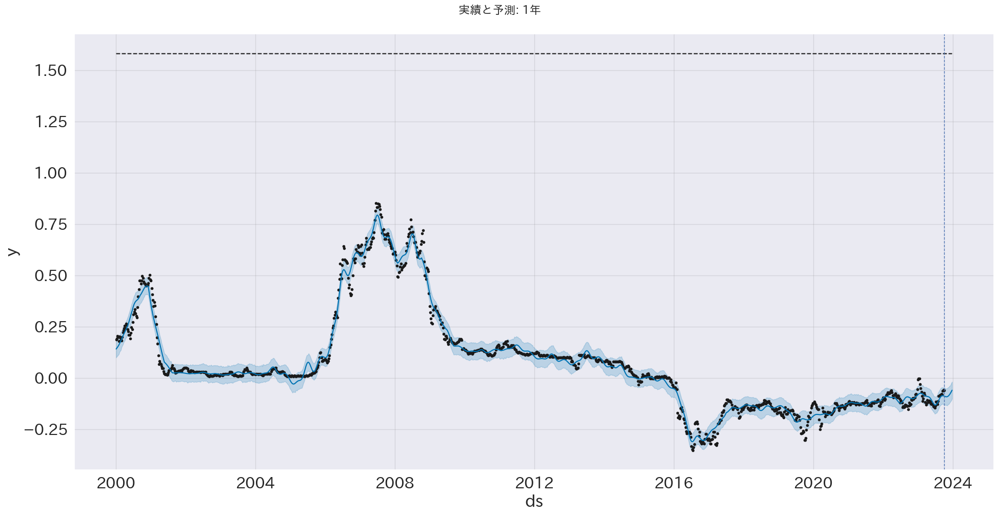

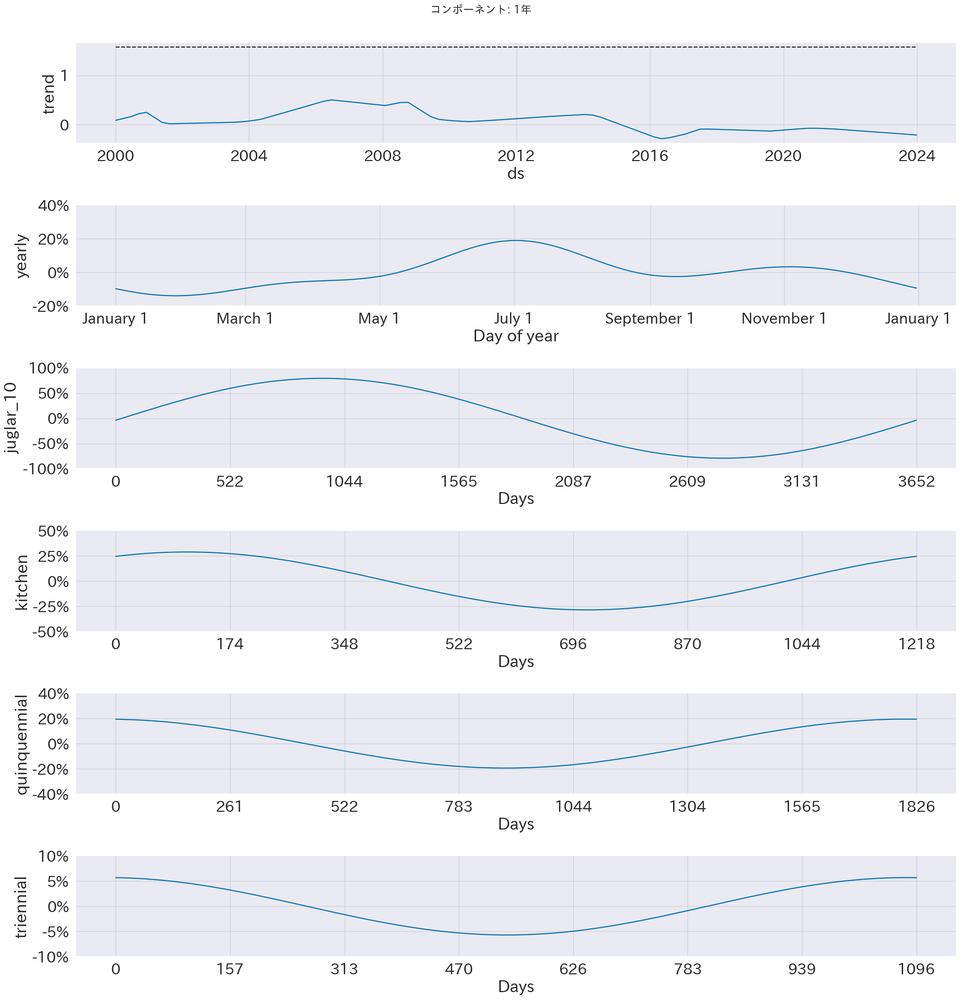

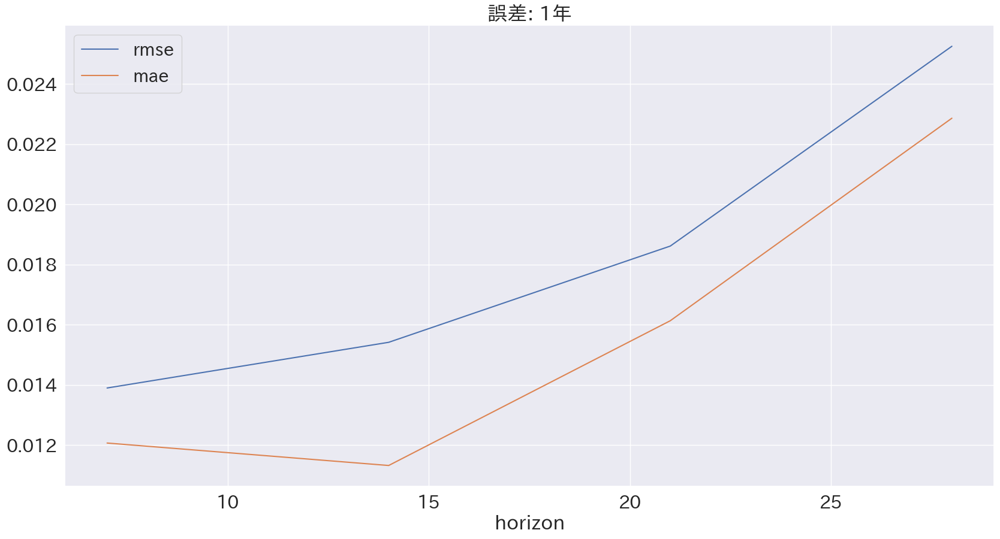

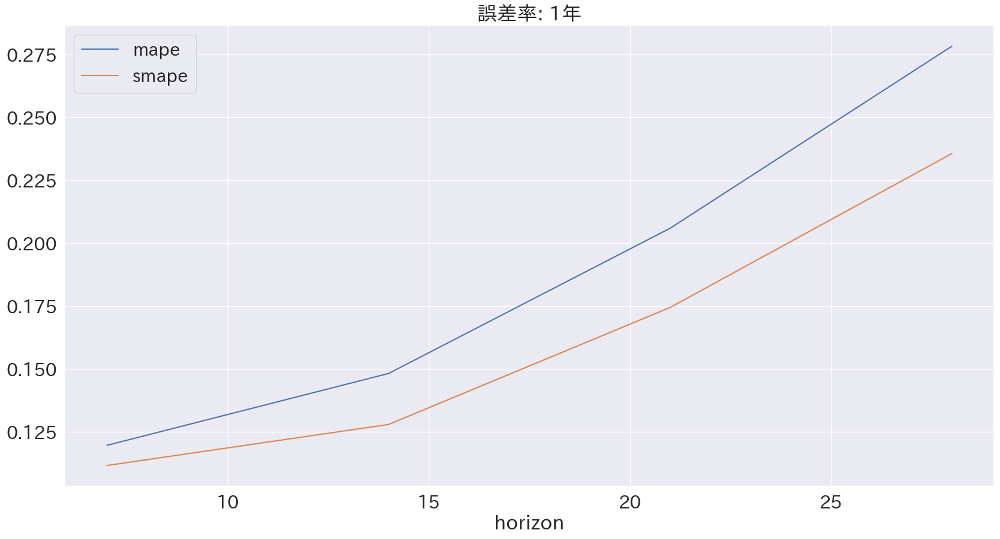

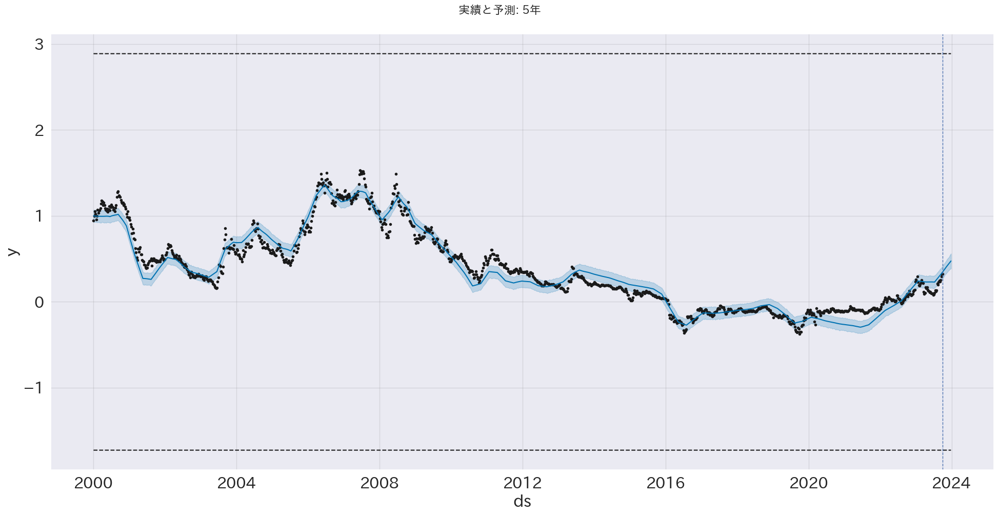

...

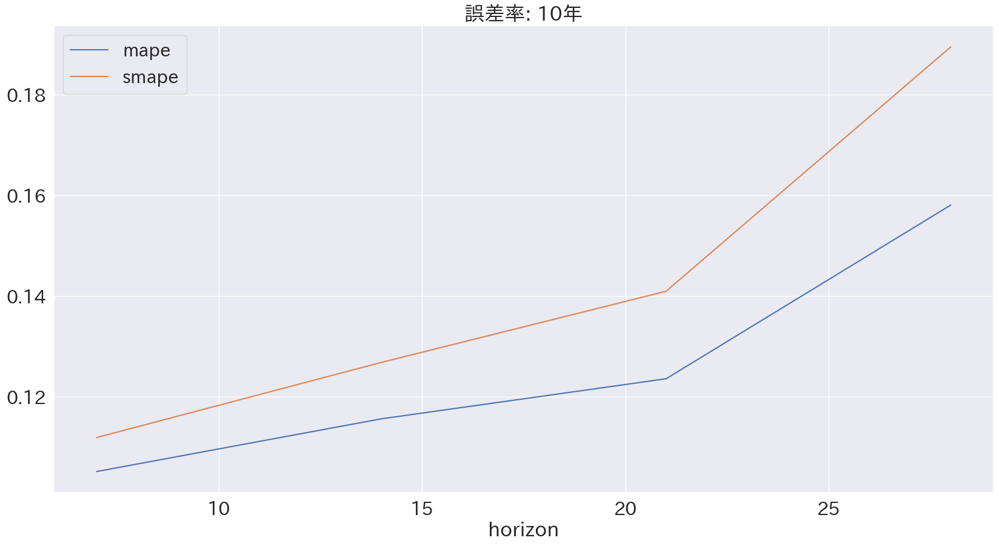

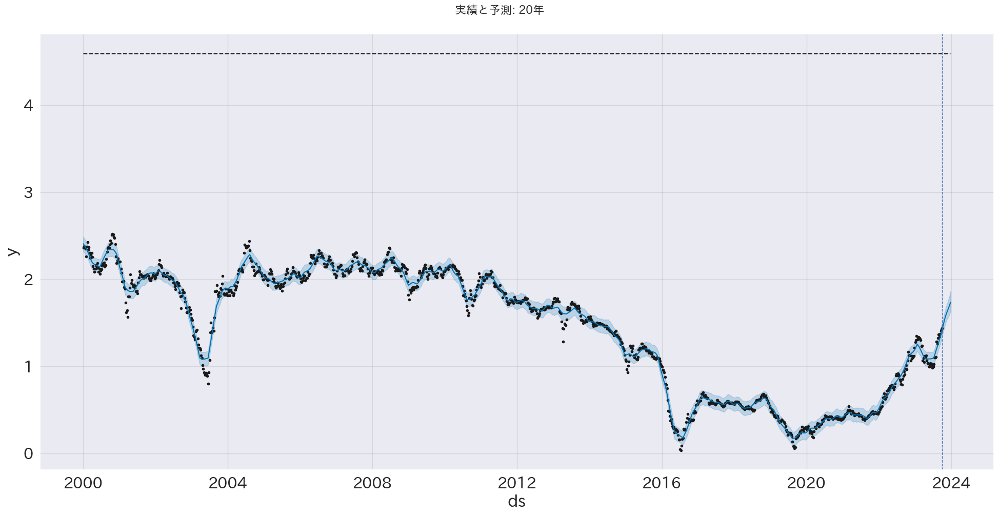

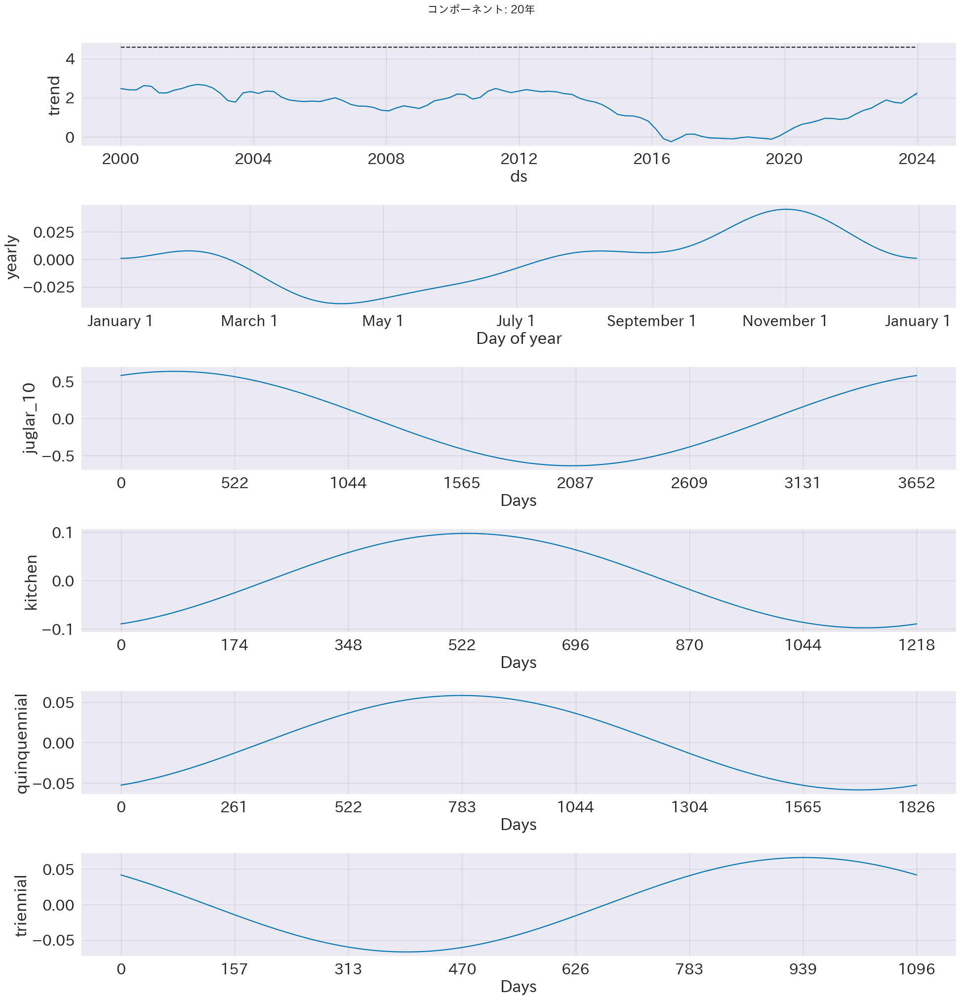

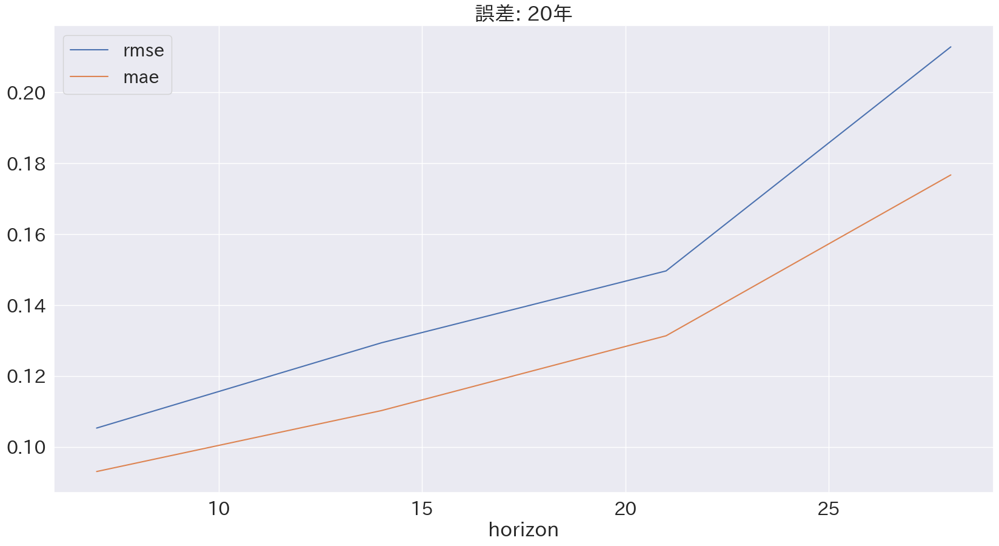

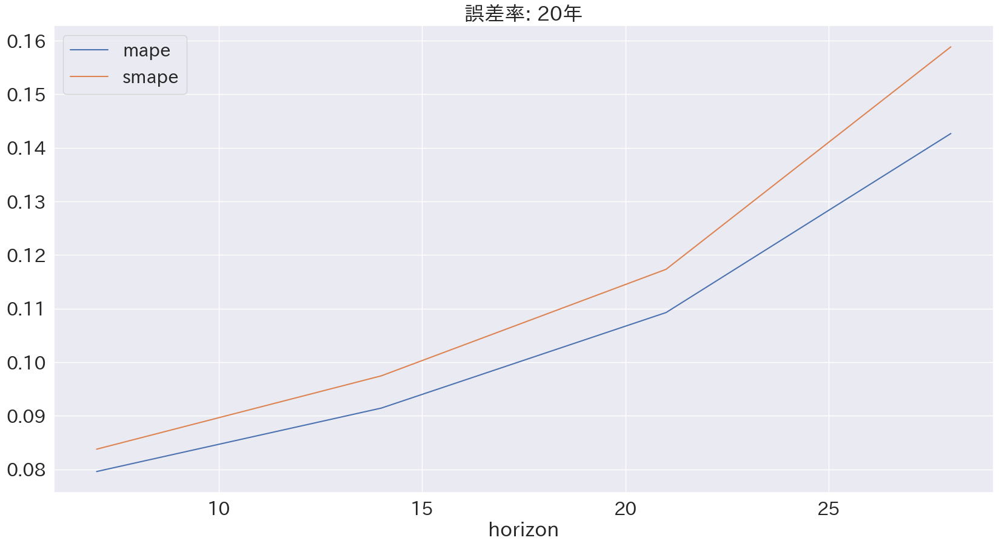

In [28]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly


n_years = 1
n_predicts = 12 * n_years


for rate_type in bests.keys():
    bst: BestEstimator = bests[rate_type]

    # predict
    model: Prophet = bst.model
    future = model.make_future_dataframe(periods=n_predicts, freq=freq)

    limitter = Limitter(bst.df)
    future = setup_limit(future, limitter)
    forecast = model.predict(future)

    # plot prediction
    fig: pyplot.Figure = model.plot(forecast, figsize=(20, 10))
    fig.suptitle(f"実績と予測: {rate_type}", x=0.5, y=1.02, size=16)
    pyplot.axvline(bst.df.ds.iloc[-1], color='b', linestyle='--', lw=1)
    fig.show()

    # plot components
    fig = model.plot_components(forecast, figsize=(20, 20))
    fig.suptitle(f"コンポーネント: {rate_type}", x=0.5, y=1.02, size=16)
    fig.show()

    # plot errors
    bst.df_pm.assign(horizon=bst.df_pm.horizon.dt.days).set_index("horizon")[["rmse", "mae"]].plot()
    pyplot.title(f"誤差: {rate_type}")
    pyplot.show()
    bst.df_pm.assign(horizon=bst.df_pm.horizon.dt.days).set_index("horizon")[["mape", "smape"]].plot()
    pyplot.title(f"誤差率: {rate_type}")
    pyplot.show()



In [29]:
def optuna_visualization(bst: BestEstimator):
    optuna.visualization.plot_contour(bst.study).show()
    optuna.visualization.plot_edf(bst.study).show()
    optuna.visualization.plot_optimization_history(bst.study).show()
    optuna.visualization.plot_parallel_coordinate(bst.study).show()
    optuna.visualization.plot_param_importances(bst.study).show()
    optuna.visualization.plot_slice(bst.study).show()


In [30]:
bst.study.best_params

{'growth': 'linear',
 'changepoint_prior_scale': 9.716687424697426,
 'seasonality_prior_scale': 8.67729911703632,
 'seasonality_mode': 'additive'}

In [31]:
pandas.DataFrame({k: [v] for k, v in bst.study.best_params.items()}).T    #.plot()

,0
growth,linear
changepoint_prior_scale,9.716687
seasonality_prior_scale,8.677299
seasonality_mode,additive


In [32]:
from IPython.display import display, Markdown


for rt in bests.keys():
    bst: BestEstimator = bests[rt]
    display(Markdown(f"""---
# 国債金利：{rt} 
"""))
    display(pandas.DataFrame({k: [v] for k, v in bst.study.best_params.items()}, index=["value"]).T)
    optuna_visualization(bst)


---
# 国債金利：1年 


,value
growth,linear
changepoint_prior_scale,0.281141
seasonality_prior_scale,8.699236
seasonality_mode,multiplicative


---
# 国債金利：5年 


,value
growth,logistic
changepoint_prior_scale,3.668883
seasonality_prior_scale,6.146923
seasonality_mode,multiplicative


---
# 国債金利：10年 


,value
growth,linear
changepoint_prior_scale,8.609085
seasonality_prior_scale,0.385278
seasonality_mode,additive


---
# 国債金利：20年 


,value
growth,linear
changepoint_prior_scale,9.716687
seasonality_prior_scale,8.677299
seasonality_mode,additive


In [33]:
rate_type = "10年"
bst: BestEstimator = bests[rate_type]

In [34]:
import plotly.graph_objs as go

In [35]:
# changepoint data
changepoints_threshold = 0.01
signif_changepoints = bst.model.changepoints[
    numpy.abs(numpy.nanmean(bst.model.params['delta'], axis=0)) >= changepoints_threshold
]
df_cp = signif_changepoints.reset_index(drop=True)
df_cp.head(3)


0   2000-03-27
1   2000-06-19
2   2000-09-11
Name: ds, dtype: datetime64[ns]

In [36]:
fig: go.Figure = plot_plotly(bst.model, bst.forecast, trend=True, changepoints=True)
fig.update_layout(title=f"予測 : {rate_type}")


In [37]:
plot_components_plotly(model, forecast).update_layout(title=f"コンポーネント : {rate_type}")


/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/plotly/io/_json.py:560: UserWarning:

Discarding nonzero nanoseconds in conversion.



In [38]:
bst.study.best_params

{'growth': 'linear',
 'changepoint_prior_scale': 8.609085351234695,
 'seasonality_prior_scale': 0.38527765234119626,
 'seasonality_mode': 'additive'}

In [39]:
g_end_date = datetime.now()
g_end_date.strftime("%Y/%m/%d %T")


'2023/10/30 21:43:31'

In [40]:
bst.model.n_changepoints

103

In [46]:
base_dates = pandas.date_range(start=bst.df.ds.min(), end=bst.df_cv.index.max(), freq="MS", name="ds")
base_dates = base_dates.to_frame().reset_index(drop=True)
base_dates.head(3)


,ds


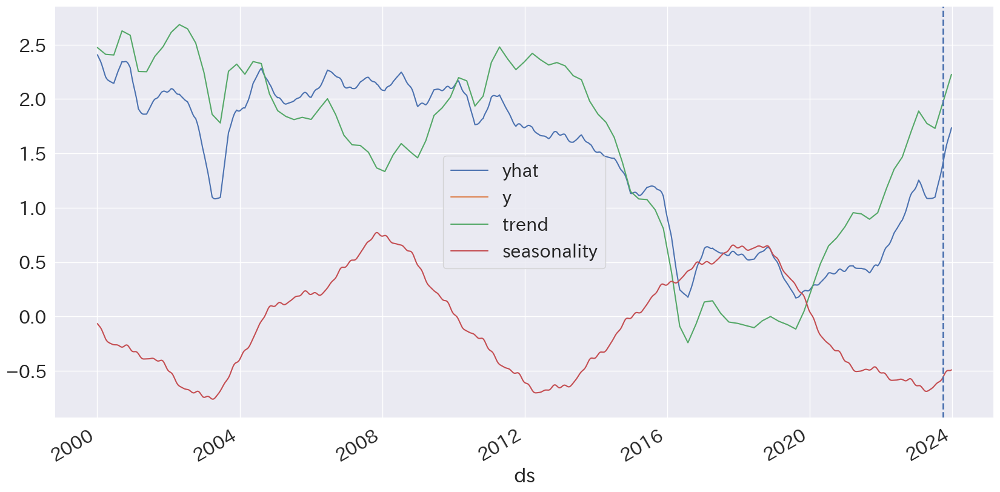

In [52]:
df_forecast = bst.forecast.copy()
df_forecast.index = df_forecast.ds
seasonality_cols = ["yearly", "triennial", "kitchen", "quinquennial", "juglar_10"]

df_forecast["seasonality"] = df_forecast[seasonality_cols].sum(axis=1).rename("seasonality").to_frame().set_index(df_forecast.ds)
df_forecast["y"] = bst.df.y

ax = df_forecast[["yhat", "y", "trend"]].plot()
ax = df_forecast[["seasonality"]].plot(kind="line", ax=ax)
ax.axvline(bst.df.ds.iloc[-1], color='b', linestyle='--', lw=2)
pyplot.show()


In [60]:
bst.df.reset_index(inplace=True)
bst.df

,ds,y,floor,cap
0,2000-01-03,0.188333,-1.081064,1.580314
1,2000-01-10,0.192000,-1.081064,1.580314
2,2000-01-17,0.205000,-1.081064,1.580314
3,2000-01-24,0.199000,-1.081064,1.580314
4,2000-01-31,0.179600,-1.081064,1.580314
...,...,...,...,...
1235,2023-09-04,-0.077200,-1.081064,1.580314
1236,2023-09-11,-0.080000,-1.081064,1.580314
1237,2023-09-18,-0.063500,-1.081064,1.580314
1238,2023-09-25,-0.057800,-1.081064,1.580314


---
# 国債金利 : 1年


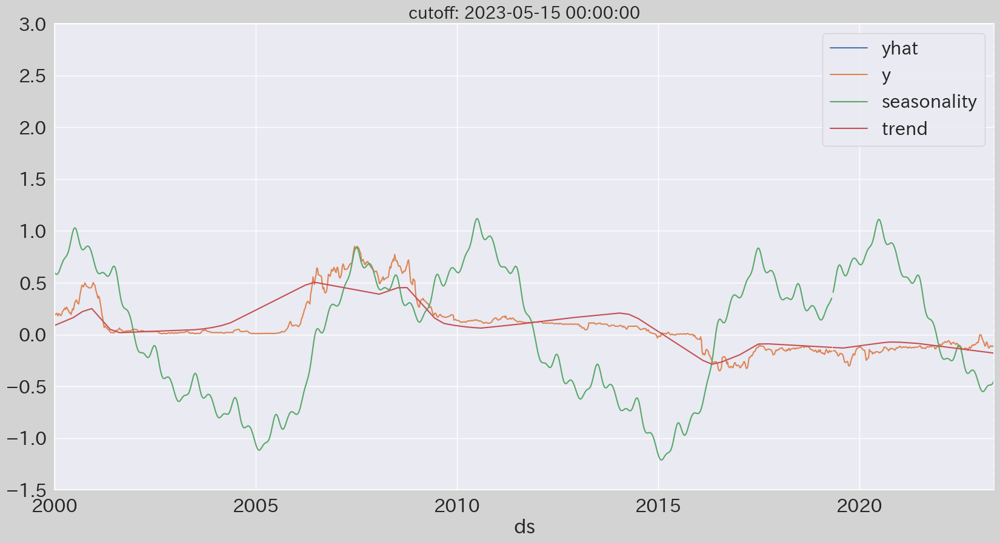

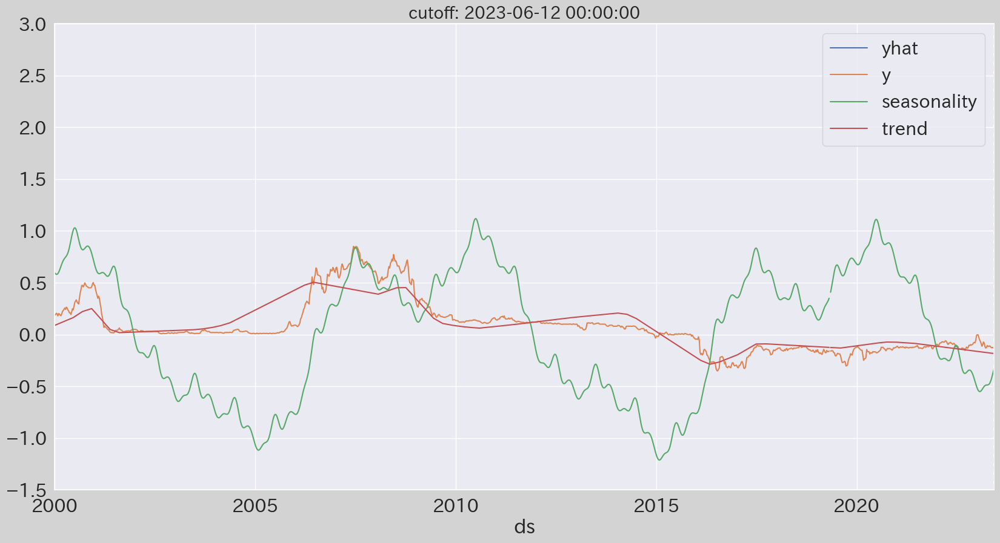

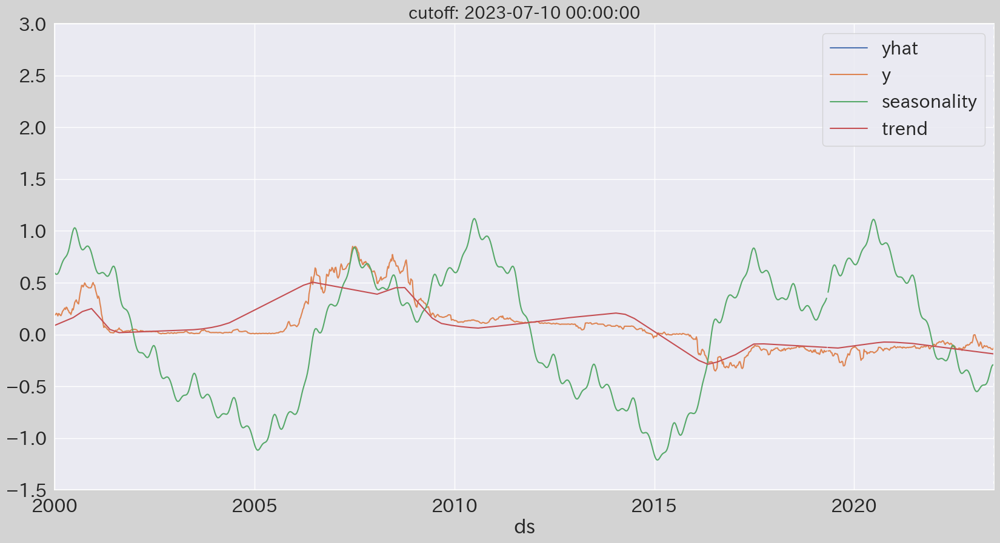

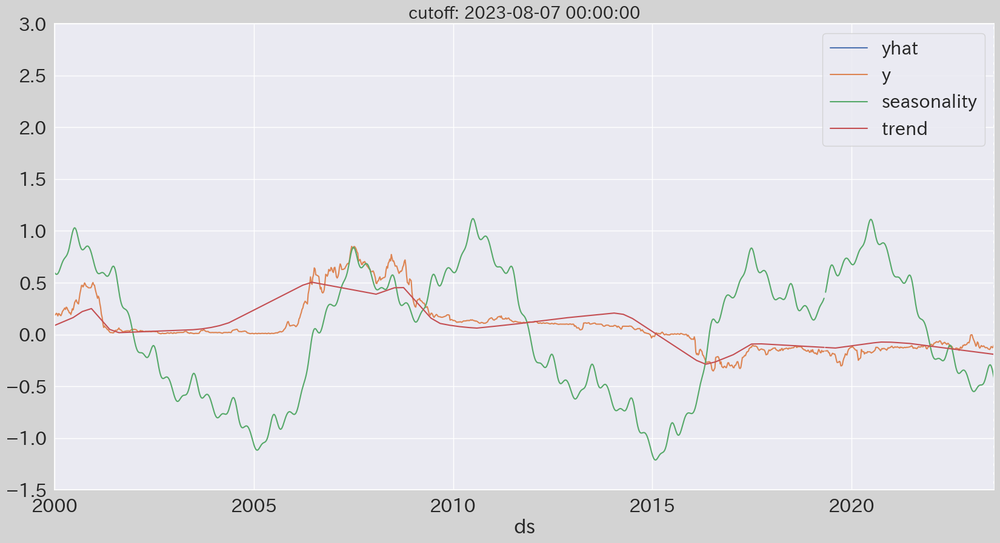

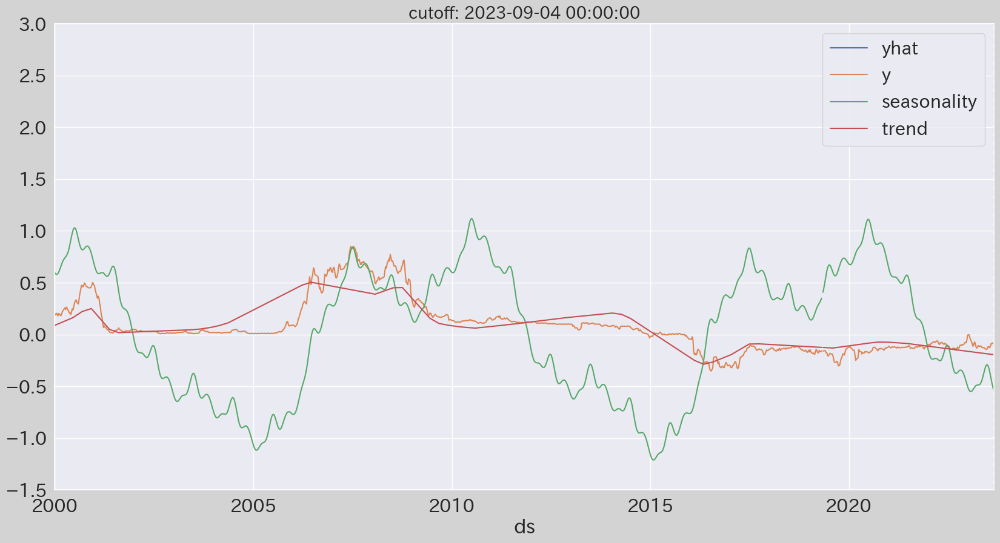

---
# 国債金利 : 5年


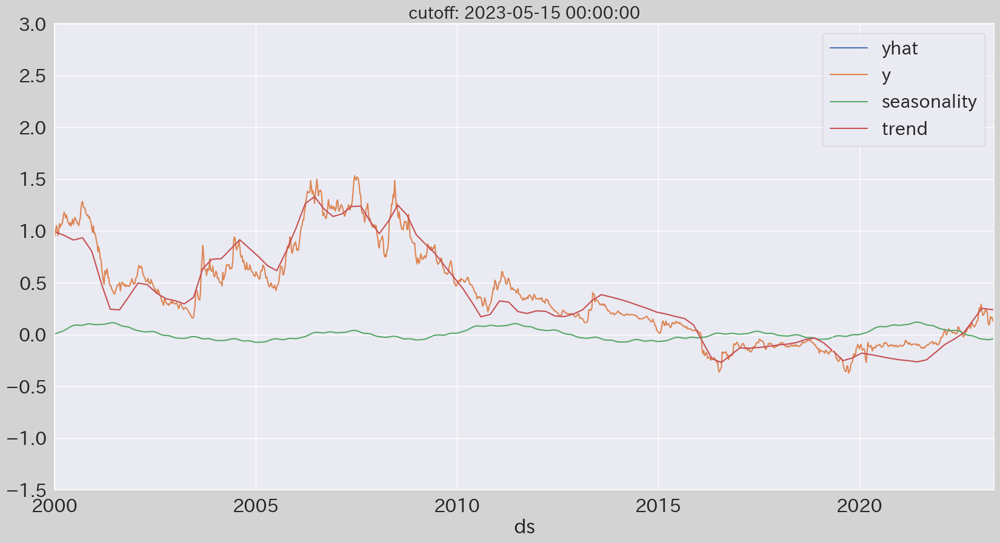

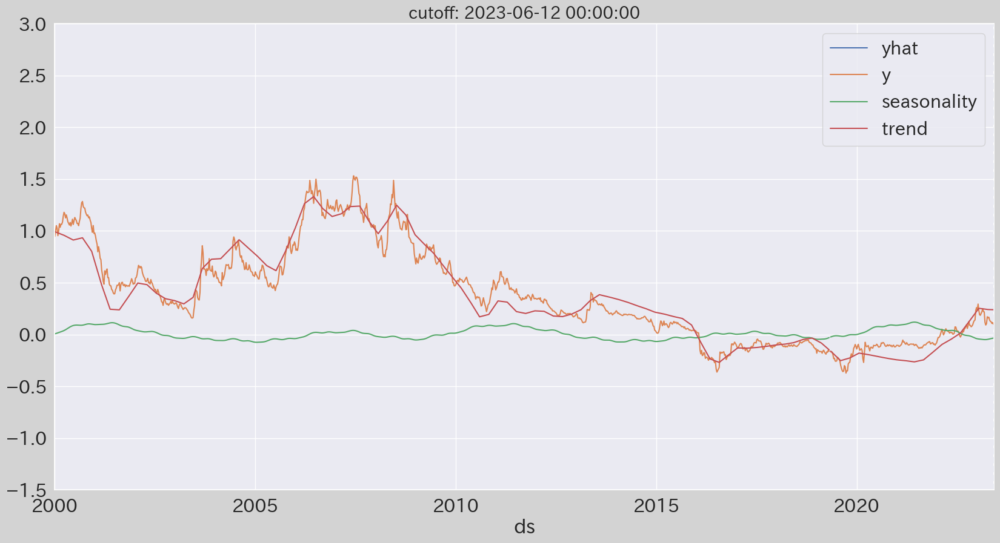

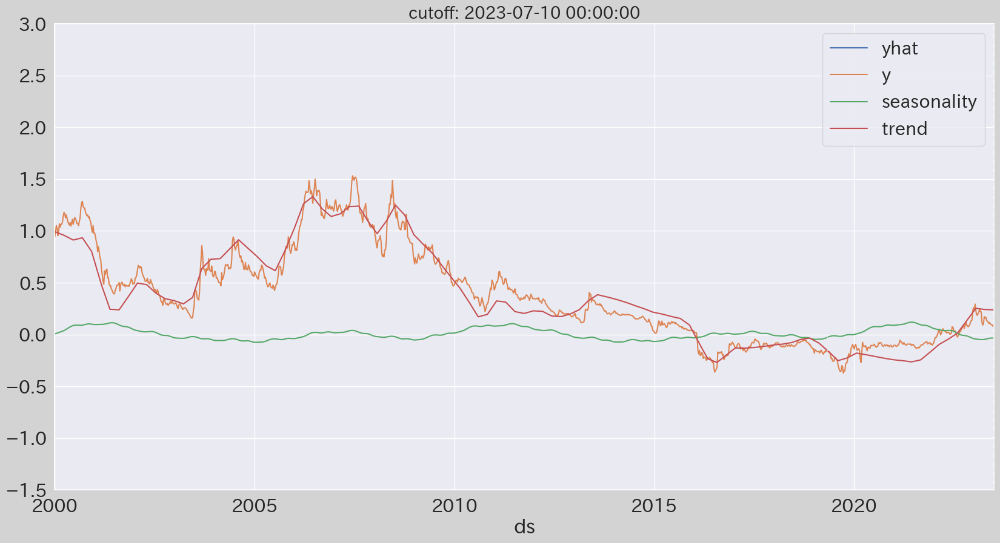

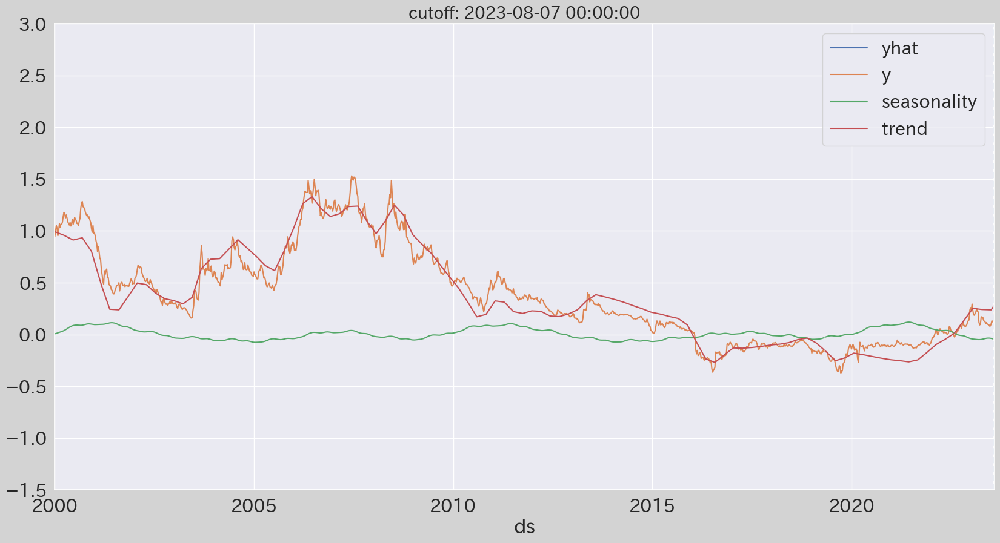

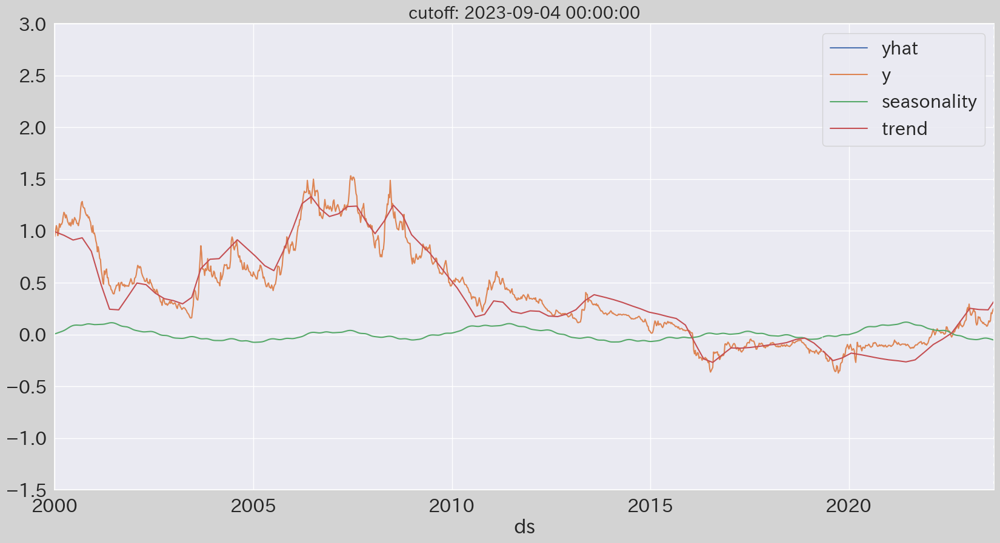

---
# 国債金利 : 10年


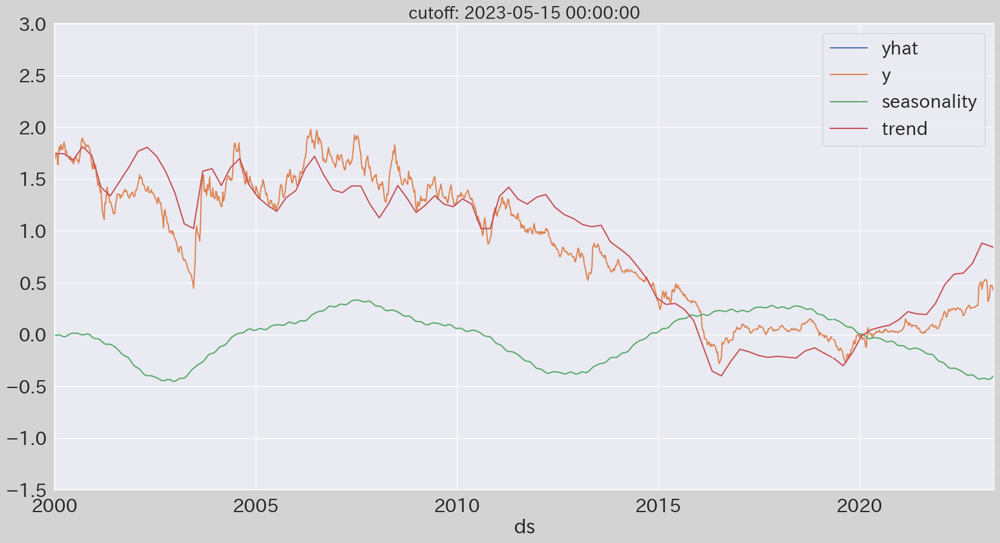

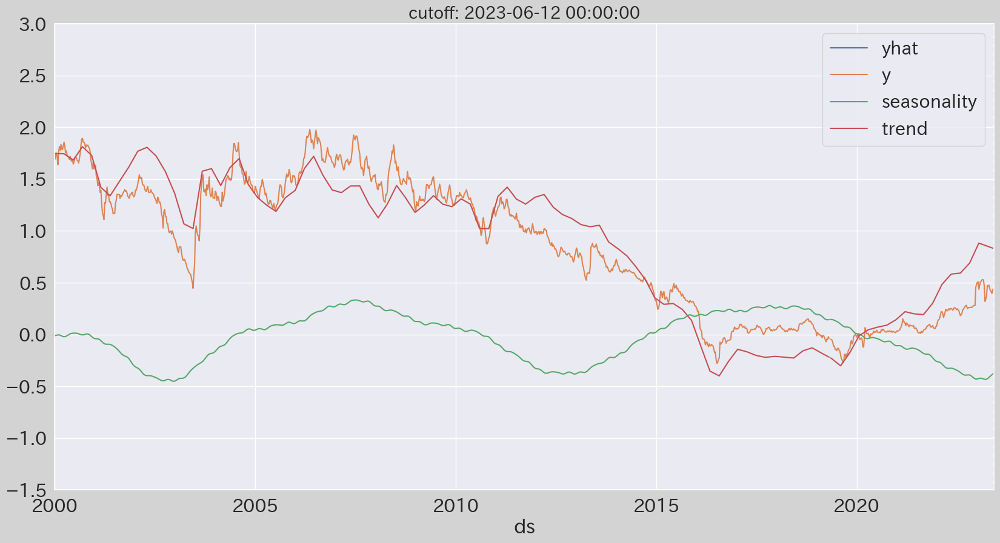

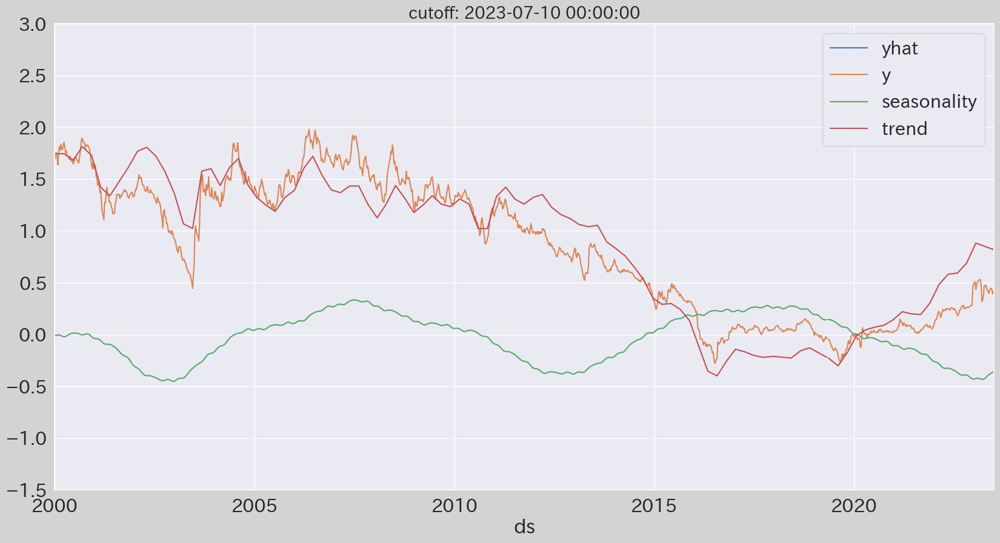

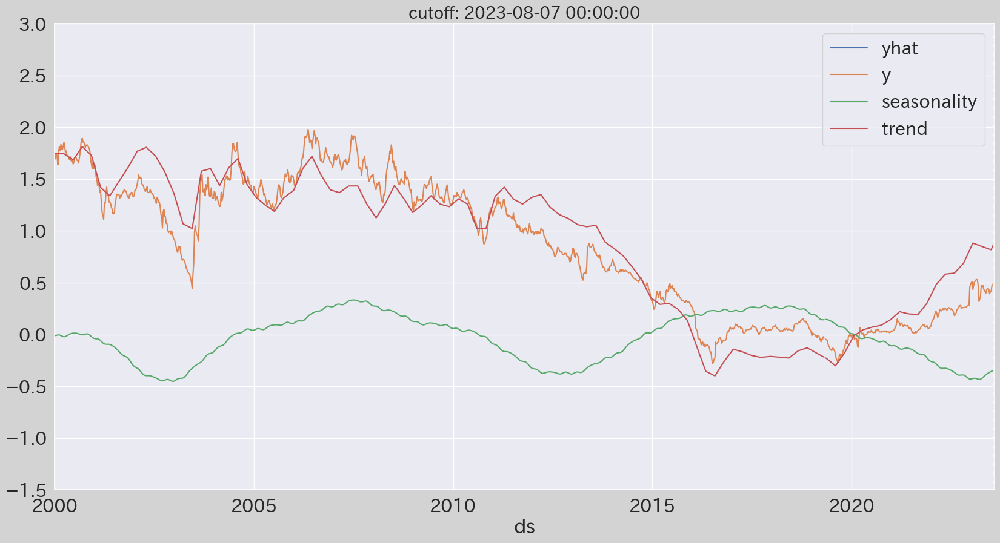

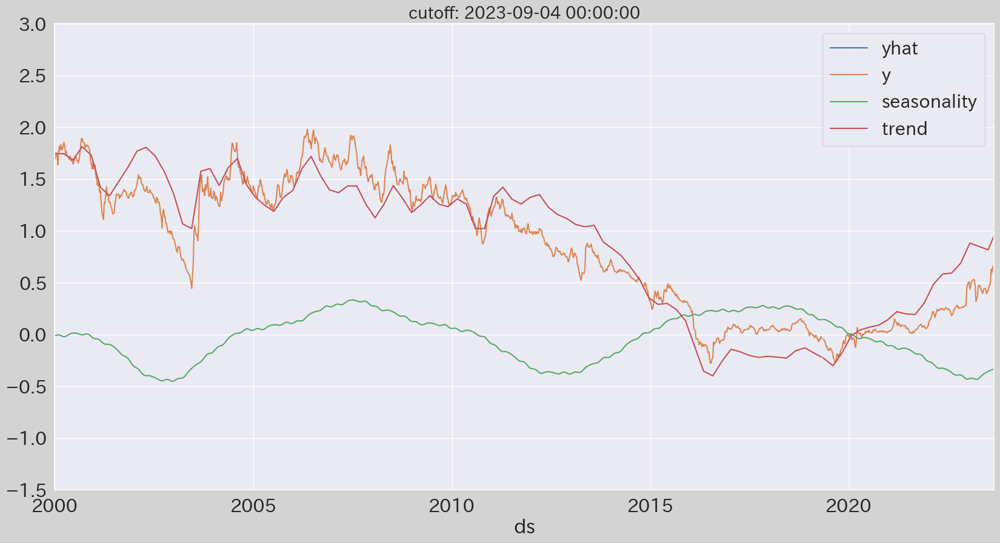

---
# 国債金利 : 20年


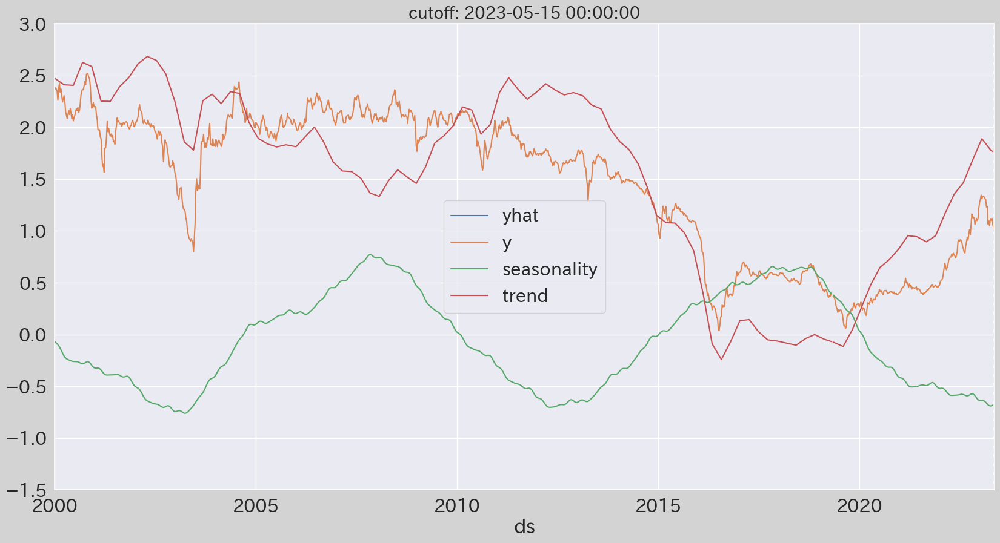

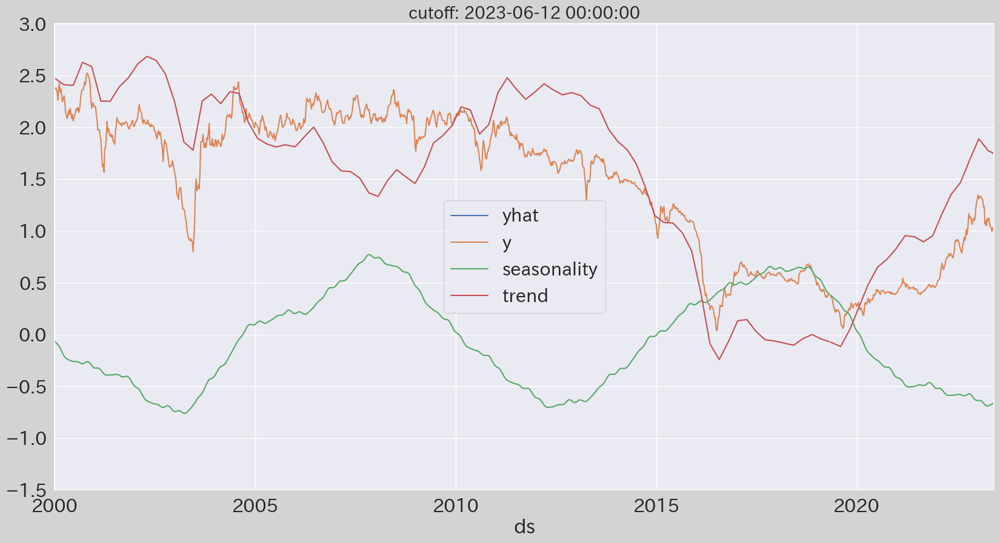

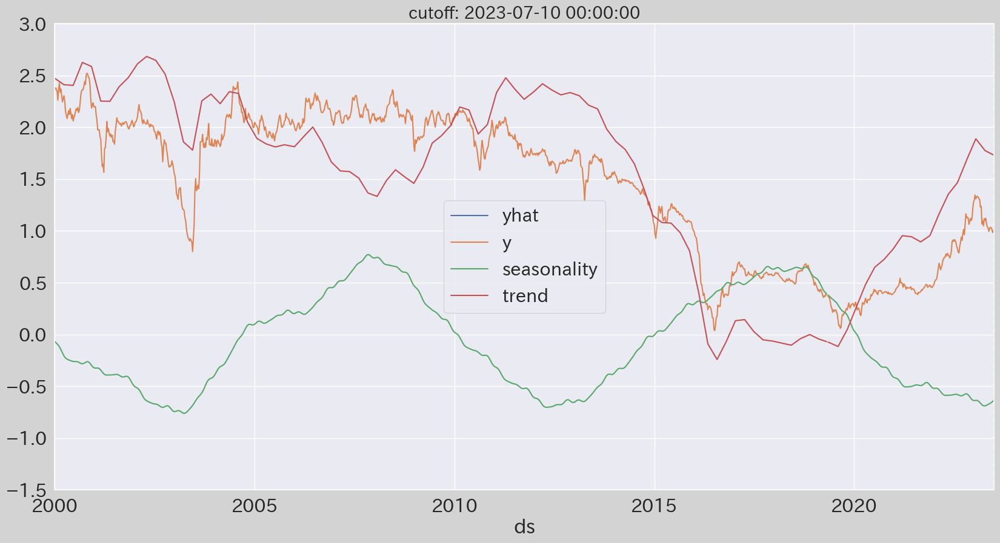

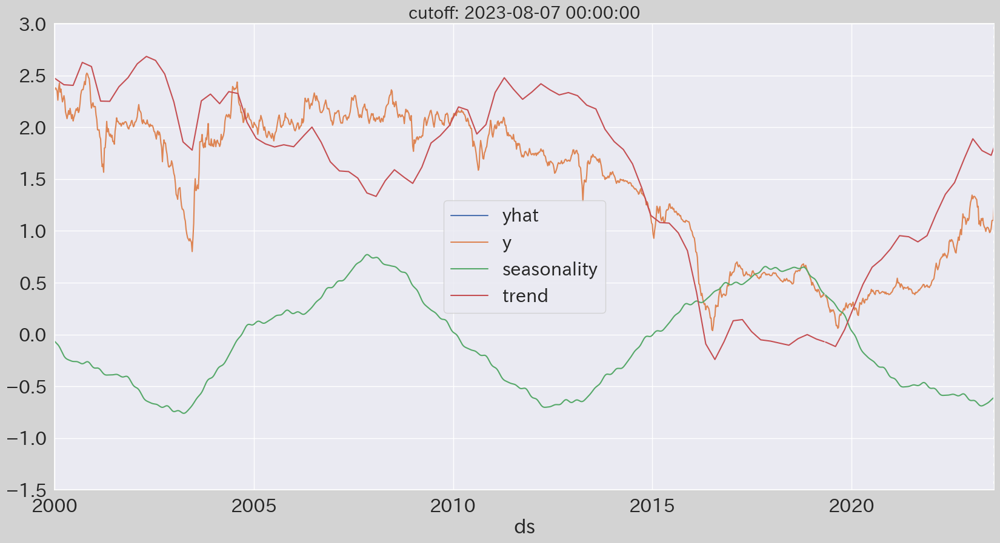

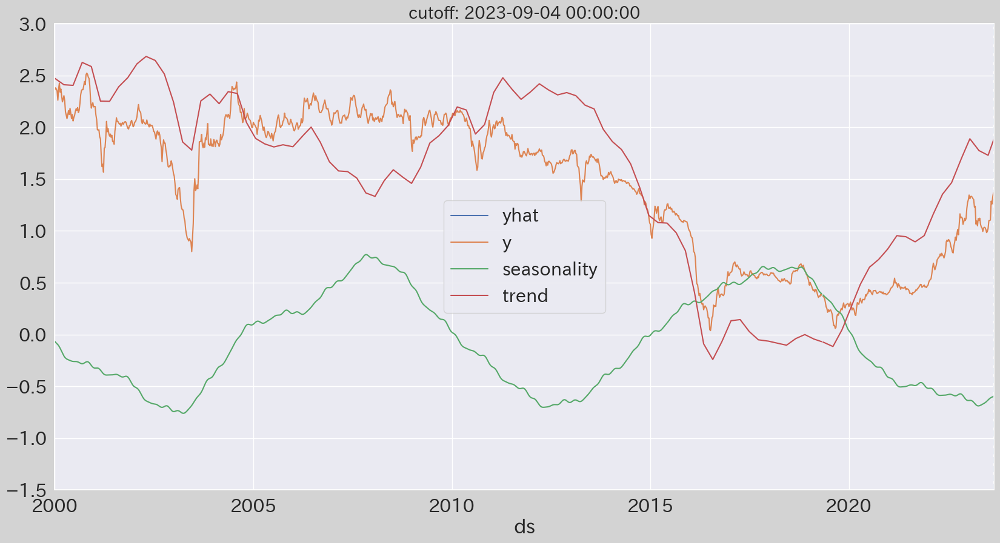

In [63]:
use_horizon_actual = True

for rt in bests.keys():
    bst: BestEstimator = bests[rt]
    bst.df.index = bst.df.ds

    display(Markdown(f"""---
# 国債金利 : {rt}
"""))

    df_forecast = bst.forecast.copy()
    df_forecast.index = df_forecast.ds
    seasonality_cols = ["yearly", "triennial", "kitchen", "quinquennial", "juglar_10"]

    df_forecast["seasonality"] = df_forecast[seasonality_cols].sum(axis=1).rename("seasonality").to_frame().set_index(df_forecast.ds)
    df_forecast["y"] = bst.df.y

    for ctf, grp in bst.df_cv.groupby("cutoff"):
        if not use_horizon_actual:
            grp.drop("y", axis=1, inplace=True)

        df_plotter = pandas.merge(base_dates, grp.reset_index(), on="ds", how="left")
        setup_df_index(df_plotter)
        # df_plotter.loc[:ctf, "y"] = bst.df.y.loc[:ctf]
        df_plotter["y"] = bst.df.y.loc[:ctf]
        df_plotter = pandas.merge(df_plotter, df_forecast[["seasonality", "trend"]].loc[:ctf], on="ds", how="left")
        fig = pyplot.figure(facecolor='lightgrey', figsize=(20, 10))
        ax = fig.add_subplot(111)
        df_plotter[["yhat", "y", "seasonality", "trend"]].plot(ax=ax)
        ax.fill_between(df_plotter.index, df_plotter.yhat_lower, df_plotter.yhat_upper,
                        color='#0072B2', alpha=0.2, label='Uncertainty interval')
        ax.axvline(ctf, color='b', linestyle='--', lw=2)
        ax.set_ylim(-1.5, 3)

        pyplot.title(f"cutoff: {ctf}", fontsize=20)
        pyplot.show()


# 実験管理

In [41]:
import mlflow

experiment_name = "jgbcm_interest_rate"

tracking_uri = f'sqlite:///../data/experiment.db'
mlflow.set_tracking_uri(tracking_uri)

experiment = mlflow.get_experiment_by_name(name=experiment_name)
if experiment is None:
    experiment_id = mlflow.create_experiment(name=experiment_name)
else:
    experiment_id = experiment.experiment_id


In [42]:
# NOTE: Enable to infer input signature of `_ds`, for MLflow
str_cols = ["基準日", "ds"]
value_cols = [col for col in _df.columns if col not in str_cols]
_df = _df.assign(**{col: _df[col].astype(float) for col in value_cols}).assign(**{col: _df[col].astype(str) for col in str_cols})
_df[value_cols].head(3)

,1年,2年,3年,4年,5年,6年,7年,8年,9年,10年,15年,20年,25年,30年,40年
0,10.327,9.362,8.830,8.515,8.348,8.29,8.24,8.121,8.127,NaN,NaN,NaN,NaN,NaN,NaN
1,10.333,9.364,8.831,8.516,8.348,8.29,8.24,8.121,8.127,NaN,NaN,NaN,NaN,NaN,NaN
2,10.340,9.366,8.832,8.516,8.348,8.29,8.24,8.122,8.128,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
import yaml
from mlflow.models import infer_signature
from mlflow.data.pandas_dataset import PandasDataset


desc = "Predict the interest rate for jgbcm"
with mlflow.start_run(experiment_id=experiment_id, run_name="trial", description=desc) as mlf:
    ds: PandasDataset = mlflow.data.from_pandas(_df, source=url)
    mlflow.log_input(ds, context="simulation")

    mlflow.log_param("period_type", f"{period_type}")
    mlflow.set_tag("start", g_start_date)
    mlflow.set_tag("end", g_end_date)
    duration = round((g_end_date - g_start_date).seconds / 60, 0)
    mlflow.set_tag("duration", f"{duration} mins")

    for rt in bests.keys():
        bst: BestEstimator = bests[rt]

        # params
        params: dict = {f"{rt}/{k}": v for k, v in bst.study.best_params.items()}
        mlflow.log_params(params)
        mlflow.log_param(f"{rt}/n_changepoints", f"{bst.model.n_changepoints}")
        mlflow.log_param(f"{rt}/changepoint_range", f"{bst.model.changepoint_range}")
        params_file = "params.yaml"
        with open(params_file, "w") as fw:
            yaml.dump(bst.study.best_params, fw)
        mlflow.log_artifact(params_file, artifact_path=f"{rt}")

        # metrics
        metrics: dict = bst.df_pm.mean().drop(["horizon", "coverage"]).to_dict()
        metrics = {f"{rt}/{k}": v for k, v in metrics.items()}
        mlflow.log_metrics(metrics=metrics)

        # model
        signature = infer_signature(bst.df, bst.forecast)
        mlflow.prophet.log_model(bst.model, artifact_path=f"{rt}", signature=signature)
        # mlflow.evaluate()


/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/_distutils_hack/__init__.py:18: UserWarning:

Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.

/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning:

Setuptools is replacing distutils.

/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/_distutils_hack/__init__.py:18: UserWarning:

Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure th

In [44]:
%%bash
rm -f params.yaml